In [3]:
import numpy as np
import math
import pandas as pd
import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt
from scipy import stats
import shapely
import shapefile
import geopy.distance
from shapely.geometry import shape, Point
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

## Load parameter file

In [4]:
DF_PARA = pd.read_csv('Para.csv',header=1)
DF_PARA

,Period(sec),e0,e1,e2,e3,e4,e5,e6,Mh,c1,...,R1 (km),R2 (km),DfR,DfV,V1 (m/s),V2 (m/s),f1.1,f2,t1,t2
0,-1.000,5.03700,5.07800,4.84900,5.03300,1.0730,-0.153600,0.22520,6.2,-1.2430,...,105.00,272.00,0.082,0.080,225,300,0.644,0.552,0.401,0.346
1,0.000,0.44730,0.48560,0.24590,0.45390,1.4310,0.050530,-0.16620,5.5,-1.1340,...,110.00,270.00,0.100,0.070,225,300,0.695,0.495,0.398,0.348
2,0.010,0.45340,0.49160,0.25190,0.45990,1.4210,0.049320,-0.16590,5.5,-1.1340,...,111.67,270.00,0.096,0.070,225,300,0.698,0.499,0.402,0.345
3,0.020,0.48598,0.52359,0.29707,0.48875,1.4331,0.053388,-0.16561,5.5,-1.1394,...,113.10,270.00,0.092,0.030,225,300,0.702,0.502,0.409,0.346
4,0.022,0.49866,0.53647,0.31347,0.49973,1.4336,0.054888,-0.16520,5.5,-1.1405,...,113.37,270.00,0.088,0.027,225,300,0.707,0.505,0.418,0.349
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,8.000,-2.68610,-2.58290,-2.94380,-2.78230,2.0613,-0.103820,1.02320,6.2,-1.2688,...,130.87,245.23,0.059,0.000,225,300,0.510,0.630,0.507,0.278
103,8.500,-2.78200,-2.67520,-3.05970,-2.87760,2.0084,-0.121140,1.03350,6.2,-1.2839,...,130.71,238.13,0.059,0.000,225,300,0.509,0.622,0.503,0.265
104,9.000,-2.87920,-2.76870,-3.17130,-2.97590,1.9605,-0.134070,1.04530,6.2,-1.2989,...,130.50,229.56,0.060,0.000,225,300,0.509,0.613,0.498,0.252
105,9.500,-2.97690,-2.86340,-3.27850,-3.07600,1.9189,-0.143640,1.05670,6.2,-1.3130,...,130.26,220.02,0.060,0.000,225,300,0.509,0.604,0.492,0.239


## BSSA 14 model

In [5]:
# Created by Minhao Wu, 09/16/2021
# 
# Source Model:
# Boore, D. M., Stewart, J. P., Seyhan, E., and Atkinson, G. M. (2014). 
# “NGA-West2 Equations for Predicting PGA, PGV, and 5# Damped PSA for 
# Shallow Crustal Ear   thquakes.” Earthquake Spectra, 30(3), 1057–1085.
# http://www.earthquakespectra.org/doi/abs/10.1193/070113EQS184M
    
    # Provides ground-motion prediction equations for computing medians and
# standard devisations of average horizontal component internsity measures
# (IMs) for shallow crustal earthquakes in active tectonic regions.
    
    # NOTE: This file does not return the correct values for Vs30 = 270, global
# region, and default Z10. The outputs of this script do not match the 
# values in the spreadsheet, but the error was not identified as of 21 Jan 
# 2021. The issue does not appear when region = 2, and does not affect
# T<0.5s.
    
    ###########################################################################
# INPUT
#   T             = Period (sec); Use Period = -1 for PGV computation
#                   Use 1000 to output the array of median with original period
#                   (no interpolation)
#   rup           = rupture object input containing the following
#                   variables:
#       M           = Moment Magnitude
#       Rjb         = Joyner-Boore distance (km)
#       lambda      = rake angle, used to set Fault_Type:
#                       = 0 for unspecified fault
#                       = 1 for strike-slip fault
#                       = 2 for normal fault
#                       = 3 for reverse fault
#   site          = site object input containing the following
#                   variables:
#       region        = 0 for global
#                     = 1 for California
#                     = 2 for Japan
#                     = 3 for China
#                     = 4 for Italy
#                     = 5 for Turkey (locally = 3)
#                     = 6 for Taiwan (locally = 0)
#       Z10           = Basin depth (km); depth from the groundsurface to the
#                       1km/s shear-wave horizon.
#       Vs30          = shear wave velocity averaged over top 30 m in m/s
# OUTPUT
#   median        = Median amplitude prediction
#   sigma         = NATURAL LOG standard deviation
#   period1       = periods for which the median and sigma values are
#                   provided. If T = 1000, then period1 = the full set of
#                   available periods. Else period1 = T
###########################################################################

def get_lnY_bssa14(M,T,Rjb,mech,region,vs30,z1):
    
    period = np.array(DF_PARA['Period(sec)'])
    
    mref = 4.5

    rref = 1

    vref = 760

    f1 = 0

    f3 = 0.1

    v1 = 225

    v2 = 300

    mh = np.array(DF_PARA['Mh'])

    e0 = np.array(DF_PARA['e0'])

    e1 = np.array(DF_PARA['e1'])
    
    e2 = np.array(DF_PARA['e2'])

    e3 = np.array(DF_PARA['e3']) 
    
    e4 = np.array(DF_PARA['e4'])

    e5 = np.array(DF_PARA['e5']) 

    e6 = np.array(DF_PARA['e6'])
    
    c1 = np.array(DF_PARA['c1'])

    c2 = np.array(DF_PARA['c2'])

    c3 = np.array(DF_PARA['c3'])

    h = np.array(DF_PARA['h (km)'])

    deltac3_gloCATW = np.array(DF_PARA['Dc3 (globalCATWNZ)'])

    deltac3_CHTU = np.array(DF_PARA['Dc3 (ChinaTurkey)'])
    
    deltac3_ITJA = np.array(DF_PARA['Dc3 (ItalyJapan)'])
    
    c = np.array(DF_PARA['c'])
    
    vc = np.array(DF_PARA['Vc (m/s)'])
    
    f4 = np.array(DF_PARA['f4'])

    f5 = np.array(DF_PARA['f5'])
    
    f6 = np.array(DF_PARA['f6 (1/km)'])
    
    f7 = np.array(DF_PARA['f7'])
    
    tau1 = np.array(DF_PARA['t1'])
    
    tau2 = np.array(DF_PARA['t2'])

    phi1 = np.array(DF_PARA['f1.1'])

    phi2 = np.array(DF_PARA['f2'])

    dphiR = np.array(DF_PARA['DfR'])

    dphiV = np.array(DF_PARA['DfV'])

    R1 = np.array(DF_PARA['R1 (km)'])
    
    R2 = np.array(DF_PARA['R2 (km)'])
    
    #indx = period.index(T)
    indx = np.where(period == T)
    
    # source component
    if mech == 0:
        U = 1
    else:
        U = 0
    if mech == 1:
        SS = 1
    else:
        SS = 0
    if mech == 2:
        NS = 1
    else:
        NS = 0
    if mech == 3:
        RS = 1
    else:
        RS = 0
        
    if M <= mh[indx]:
        Fe = e0[indx]*U + e1[indx]*SS + e2[indx]*NS + e3[indx]*RS + e4[indx]*(M-mh[indx]) + e5[indx]*((M-mh[indx])**2)
    else:
        Fe = e0[indx]*U + e1[indx]*SS + e2[indx]*NS + e3[indx]*RS + e6[indx]*(M-mh[indx])
    #print(Fe)    
    
    
    # path component
    if region == 0 or region == 1:
        dc3 = deltac3_gloCATW[indx]
    elif region == 3:
        dc3 = deltac3_CHTU[indx]
    elif region == 2 or region ==4:
        dc3 = deltac3_ITJA[indx]
    
    R = np.sqrt((Rjb**2) + (h[indx])**2)
    
    Fp = (c1[indx] + (c2[indx]*(M-mref)))*np.log(R/rref) + ((c3[indx]+dc3)*(R-rref))
    #print(Fp)
    
    
    # site component
    if vs30 == vref and T == 0:
        lnflin = 0
        lnfnl = 0
        Fs = 0
        PGAr = 0
        lnY = Fe + Fp
        Sa = np.exp(lnY)
        
    else:
        
        PGAr = get_lnY_bssa14(M,0,Rjb,mech,region,760,z1)
        
        # Linear vs30 effect
        if vs30 <= vc[indx]:
            lnflin = c[indx]*np.log(vs30/vref)
        else:
            lnflin = c[indx]*np.log(vc[indx]/vref)
        
        # nonlinear vs30 effect
        f2 = f4[indx]*((np.exp(f5[indx]*(np.min([vs30,760])-360)))-(np.exp(f5[indx]*(760-360))))
        lnfnl = f1 + (f2*np.log((PGAr[0] + f3)/(f3)))
        
        # basin effect
        # muz1 HAS UNITS OF KM
        if z1 != -0.999:
            if region == 1: #california
                muz1 = np.exp((-7.15/4)*np.log(((vs30**4)+(570.94**4))/((1360**4)+(570.94**4)))-np.log(1000))
            elif region == 2: #japan
                muz1 = np.exp((-5.23/2)*np.log(((vs30**2)+(412.39**2))/((1360**2)+(412.39**2)))-np.log(1000))
            else:
                muz1 = z1
        
            dz1 = z1 - muz1
        else:
            dz1 = 0
        
        if z1 != -0.999:
            if T < 0.65:
                fdz1 = 0
            elif T >= 0.65 and dz1 <= (f7[indx]/f6[indx]):
                fdz1 = f6[indx]*dz1
            elif T >= 0.65 and dz1 >  (f7[indx]/f6[indx]):
                fdz1 = f7[indx]
        else:
            fdz1 = 0
        
        
        Fs = lnflin + lnfnl + fdz1
        
        lnY = Fe + Fp + Fs
        Sa = np.exp(lnY)
        
    return Sa
        
  

## Build NGA West2 flatfile, which only contains unique RSN

In [9]:
datadata = pd.read_csv('RD.csv')
data123 = pd.read_csv('BSSA14_Model_Dev_RSNs.csv')
dataUN1 = datadata.loc[datadata['Record Sequence Number'].isin(list(data123['Record Sequence Number']))]
regionregion = list(data123['Region'])
list_of_column_names = list(dataUN1.columns)
titles = list_of_column_names + ['Region']
df = np.concatenate([np.array(dataUN1),np.array(regionregion).reshape(-1,1)],axis = 1)
dataUN = pd.DataFrame(data = df, columns = titles)


In [10]:
data1 = dataUN[dataUN['Earthquake Name']!=-999]
data2 = data1[(data1['Earthquake Magnitude']!=-999)&(data1['Earthquake Magnitude']>2.99)]
data3 = data2[data2['Hypocenter Longitude (deg)']!=-999]
data4 = data3[data3['Hypocenter Latitude (deg)']!=-999]
data5 = data4[data4['Joyner-Boore Dist. (km)']!=-999]
data6 = data5[data5['Vs30 (m/s) selected for analysis']!=-999]
data7 = data6[data6['EQID']!=-999]
data8 = data7[data7['Station Sequence Number']!=-999]
data = data8[data8['PGA (g)']!=-999] # Ex.row #500

data ## Data is automatically sorted by RSN, so the result also follows the sequence of RSN

,Record Sequence Number,EQID,Earthquake Name,YEAR,MODY,HRMN,Station Name,Station Sequence Number,Station ID No.,Earthquake Magnitude,...,Instrument Damping,Instrument Type,Quality_Flag,Spectra Quality Flag,Late S-trigger,Late P-trigger,Idirectivity,Tp,Ry 2,Region
0,28,25,Parkfield,1966,628,426,Cholame - Shandon Array #12,131,1016,6.19,...,-999.0,-999,-999,0,-999,Y,0,-999.0,20.409509,1
1,30,25,Parkfield,1966,628,426,Cholame - Shandon Array #5,127,1014,6.19,...,-999.0,-999,-999,0,-999,?,0,-999.0,19.706458,1
2,31,25,Parkfield,1966,628,426,Cholame - Shandon Array #8,129,1015,6.19,...,-999.0,-999,-999,0,-999,?,0,-999.0,20.227245,1
3,33,25,Parkfield,1966,628,426,Temblor pre-1969,162,1438,6.19,...,-999.0,-999,-999,0,-999,-999,0,-999.0,27.174258,1
4,45,29,Lytle Creek,1970,912,1430,Devil's Canyon,106,620,5.33,...,-999.0,-999,-999,0,-999,?,0,-999.0,-16.464626,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18430,21534,1265,51177103,2006,1223,649,Pescadero,100067,JPSB,3.6,...,0.6971,a,-999,0,-999,-999,-999,-999.0,-999.0,1
18431,21536,1265,51177103,2006,1223,649,San Andreas Cal.,100433,JSA,3.6,...,0.6971,a,-999,0,-999,-999,-999,-999.0,-999.0,1
18432,21537,1265,51177103,2006,1223,649,Stanford Telescope,100448,JSFB,3.6,...,0.6971,a,-999,0,-999,-999,-999,-999.0,-999.0,1
18433,21538,1265,51177103,2006,1223,649,San Pedro Valley,100331,JSP,3.6,...,0.6971,a,-999,0,-999,-999,-999,-999.0,-999.0,1


## Build Polygons for Southern California from shapefile

In [11]:
Latitude = list(data['Hypocenter Latitude (deg)'])
Longitude = list(data['Hypocenter Longitude (deg)'])
S_Latitude = list(data['Station Latitude'])
S_Longitude = list(data['Station Longitude'])


In [12]:
r = shapefile.Reader('BasinLabelsSoCal03292021.shp')

# get the shapes
shapes = r.shapes()
# build a shapely polygon from your shape
polygon0 = shape(shapes[0])  
polygon1 = shape(shapes[1]) 
polygon2 = shape(shapes[2]) 
polygon3 = shape(shapes[3]) 
polygon4 = shape(shapes[4]) 
polygon5 = shape(shapes[5]) 
polygon6 = shape(shapes[6]) 
polygon7 = shape(shapes[7]) 



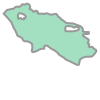

In [13]:
polygon0

In [14]:
index0 = []
for i in range(len(S_Longitude)):
    point = Point(S_Longitude[i],S_Latitude[i])
    if polygon0.contains(point) == True:
        index0.append(i)

index0


[8,
 332,
 336,
 340,
 346,
 347,
 350,
 353,
 354,
 357,
 362,
 363,
 364,
 366,
 367,
 368,
 372,
 375,
 377,
 378,
 379,
 381,
 382,
 383,
 384,
 386,
 389,
 391,
 404,
 422,
 423,
 430,
 437,
 438,
 439,
 441,
 539,
 545,
 548,
 549,
 553,
 557,
 562,
 567,
 569,
 571,
 574,
 576,
 577,
 578,
 579,
 581,
 583,
 594,
 600,
 621,
 636,
 647,
 654,
 658,
 659,
 664,
 665,
 667,
 670,
 671,
 676,
 681,
 682,
 683,
 684,
 686,
 689,
 690,
 695,
 698,
 700,
 701,
 702,
 707,
 711,
 712,
 714,
 721,
 723,
 732,
 735,
 743,
 744,
 752,
 770,
 771,
 773,
 781,
 783,
 1250,
 1252,
 1253,
 1255,
 1257,
 1270,
 1296,
 1297,
 1299,
 1301,
 1303,
 1307,
 1322,
 1323,
 1340,
 1349,
 1367,
 1375,
 1377,
 1378,
 1611,
 1613,
 1615,
 1618,
 1619,
 1620,
 1621,
 3041,
 3044,
 3047,
 3048,
 3053,
 3054,
 3055,
 3058,
 3060,
 3062,
 3065,
 3070,
 3071,
 3072,
 3075,
 3077,
 3078,
 3079,
 3080,
 3088,
 3094,
 3119,
 3120,
 3128,
 3129,
 3135,
 3136,
 3137,
 3138,
 3139,
 3142,
 3145,
 3147,
 3148,
 3149

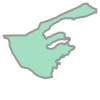

In [15]:
polygon1

In [16]:
index1 = []
for i in range(len(S_Longitude)):
    point = Point(S_Longitude[i],S_Latitude[i])
    if polygon1.contains(point) == True:
        index1.append(i)

index1


[661,
 754,
 785,
 3131,
 3318,
 3319,
 3322,
 3344,
 7072,
 7104,
 7164,
 7251,
 7404,
 7551,
 7750,
 8302,
 8349,
 8456,
 8520,
 8584,
 8638,
 8702,
 9152,
 9219,
 9229,
 9230,
 9530,
 9562,
 10012,
 10107,
 10202,
 11675,
 13966]

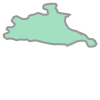

In [17]:
polygon2

In [18]:
index2 = []
for i in range(len(S_Longitude)):
    point = Point(S_Longitude[i],S_Latitude[i])
    if polygon2.contains(point) == True:
        index2.append(i)

index2

[334,
 342,
 344,
 400,
 403,
 407,
 408,
 424,
 425,
 428,
 429,
 445,
 550,
 587,
 596,
 599,
 639,
 652,
 662,
 703,
 739,
 745,
 775,
 780,
 1248,
 1271,
 1288,
 1292,
 1315,
 1318,
 1325,
 1330,
 1331,
 1345,
 1352,
 1709,
 3049,
 3051,
 3082,
 3083,
 3084,
 3085,
 3089,
 3090,
 3093,
 3116,
 3118,
 3122,
 3123,
 3124,
 3152,
 3156,
 3168,
 3169,
 3170,
 3171,
 3316,
 3332,
 3341,
 3343,
 6917,
 7028,
 7060,
 7094,
 7199,
 7227,
 7442,
 7461,
 7538,
 7540,
 7541,
 7548,
 7578,
 7580,
 7584,
 7634,
 7669,
 7789,
 7891,
 7929,
 8148,
 8149,
 8159,
 8160,
 8161,
 8188,
 8264,
 8389,
 8528,
 8558,
 8675,
 8828,
 8868,
 9016,
 9017,
 9079,
 9113,
 9184,
 9185,
 9187,
 9190,
 9192,
 9197,
 9199,
 9200,
 9201,
 9202,
 9203,
 9204,
 9205,
 9206,
 9210,
 9221,
 9222,
 9224,
 9227,
 9228,
 9234,
 9235,
 9554,
 9555,
 9592,
 9634,
 9932,
 9933,
 9938,
 9939,
 9941,
 9945,
 9946,
 9957,
 9976,
 9994,
 10034,
 10035,
 10205,
 11328,
 11359,
 11674,
 11850,
 13779,
 14993,
 15064,
 15143,
 1514

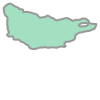

In [19]:
polygon3

In [20]:
index3 = []
for i in range(len(S_Longitude)):
    point = Point(S_Longitude[i],S_Latitude[i])
    if polygon3.contains(point) == True:
        index3.append(i)

index3

[331,
 333,
 335,
 352,
 355,
 359,
 409,
 410,
 411,
 413,
 414,
 420,
 421,
 433,
 436,
 444,
 540,
 541,
 543,
 555,
 559,
 564,
 593,
 603,
 650,
 651,
 653,
 669,
 673,
 678,
 750,
 764,
 766,
 787,
 1240,
 1244,
 1245,
 1319,
 1321,
 1341,
 1383,
 1394,
 1687,
 1694,
 3042,
 3043,
 3057,
 3059,
 3063,
 3086,
 3087,
 3096,
 3150,
 3165,
 5105,
 5127,
 5133,
 5136,
 6938,
 6957,
 6960,
 7014,
 7019,
 7050,
 7076,
 7082,
 7089,
 7182,
 7196,
 7203,
 7218,
 7239,
 7242,
 7417,
 7439,
 7446,
 7477,
 7481,
 7533,
 7534,
 7604,
 7631,
 7643,
 7687,
 7692,
 7786,
 7842,
 7846,
 7905,
 7926,
 7937,
 7967,
 7971,
 8169,
 8204,
 8228,
 8236,
 8283,
 8287,
 8362,
 8386,
 8396,
 8437,
 8525,
 8533,
 8576,
 8688,
 8691,
 8793,
 8825,
 8835,
 8888,
 8893,
 8982,
 9047,
 9076,
 9085,
 9102,
 9132,
 9136,
 9306,
 9309,
 9520,
 9522,
 9601,
 9631,
 9641,
 9657,
 9684,
 9687,
 9775,
 9952,
 9972,
 9973,
 9980,
 10004,
 10006,
 10030,
 10098,
 10144,
 10159,
 10223,
 10844,
 11082,
 11087,
 11255,
 

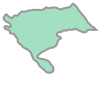

In [21]:
polygon4

In [22]:
index4 = []
for i in range(len(S_Longitude)):
    point = Point(S_Longitude[i],S_Latitude[i])
    if polygon4.contains(point) == True:
        index4.append(i)

index4

[304,
 415,
 416,
 589,
 629,
 1395,
 1439,
 1497,
 1521,
 1616,
 3133,
 3159,
 4941,
 4947,
 4954,
 4955,
 4990,
 5001,
 5014,
 5017,
 5030,
 5050,
 5126,
 5129,
 5130,
 5131,
 5132,
 5135,
 5137,
 5138,
 5141,
 5142,
 5143,
 5144,
 6889,
 6894,
 6910,
 6939,
 6951,
 7008,
 7066,
 7074,
 7233,
 7419,
 7436,
 7456,
 7467,
 7532,
 7537,
 7608,
 7612,
 7627,
 7662,
 7678,
 7764,
 7816,
 7831,
 7908,
 7911,
 7923,
 7949,
 7959,
 8029,
 8043,
 8144,
 8145,
 8208,
 8255,
 8271,
 8366,
 8417,
 8427,
 8503,
 8553,
 8564,
 8668,
 8681,
 8765,
 8798,
 8803,
 8819,
 8855,
 8877,
 8953,
 8981,
 8985,
 8987,
 8988,
 8989,
 8990,
 8995,
 8996,
 9001,
 9005,
 9006,
 9008,
 9009,
 9012,
 9013,
 9052,
 9118,
 9253,
 9285,
 9296,
 9484,
 9583,
 9586,
 9606,
 9609,
 9658,
 9674,
 9745,
 9750,
 9776,
 9778,
 9779,
 9780,
 9781,
 9783,
 9784,
 9785,
 9787,
 9803,
 9961,
 9991,
 9998,
 10051,
 10079,
 10137,
 10196,
 10667,
 10670,
 10696,
 10772,
 10798,
 10828,
 10835,
 10868,
 10871,
 11080,
 11081,
 11

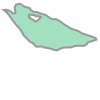

In [23]:
polygon5

In [24]:
index5 = []
for i in range(len(S_Longitude)):
    point = Point(S_Longitude[i],S_Latitude[i])
    if polygon5.contains(point) == True:
        index5.append(i)

index5

[592,
 633,
 634,
 762,
 763,
 1386,
 1398,
 1399,
 1400,
 1401,
 1403,
 1440,
 1446,
 1452,
 1462,
 1463,
 1464,
 1465,
 1466,
 1467,
 1468,
 1469,
 1471,
 1472,
 1507,
 1544,
 1545,
 1546,
 1547,
 1548,
 1550,
 1681,
 1684,
 1688,
 1695,
 1697,
 1698,
 1699,
 1700,
 1701,
 1702,
 1704,
 1705,
 4992,
 4993,
 4994,
 4995,
 4996,
 4997,
 4998,
 4999,
 5000,
 5015,
 5016,
 5031,
 5032,
 5033,
 5034,
 5035,
 5038,
 5045,
 5051,
 5075,
 5085,
 5086,
 5090,
 5099,
 5100,
 5101,
 5102,
 5103,
 5104,
 5134,
 5139,
 5140,
 6892,
 6918,
 7007,
 7017,
 7051,
 7053,
 7054,
 7055,
 7065,
 7079,
 7421,
 7443,
 7560,
 7561,
 7569,
 7570,
 7571,
 7572,
 7573,
 7574,
 7606,
 7611,
 7635,
 7747,
 7749,
 7906,
 7910,
 7930,
 8146,
 8181,
 8183,
 8184,
 8185,
 8186,
 8211,
 8369,
 8506,
 8626,
 8801,
 8829,
 8998,
 9003,
 9007,
 9024,
 9025,
 9029,
 9031,
 9032,
 9055,
 9608,
 9635,
 9782,
 9791,
 9794,
 9795,
 9796,
 9797,
 9963,
 10136,
 10142,
 10173,
 10174,
 10175,
 10178,
 10180,
 10181,
 10183,
 1

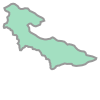

In [25]:
polygon6

In [26]:
index6 = []
for i in range(len(S_Longitude)):
    point = Point(S_Longitude[i],S_Latitude[i])
    if polygon6.contains(point) == True:
        index6.append(i)

index6

[289,
 294,
 301,
 302,
 556,
 586,
 588,
 606,
 624,
 1356,
 1390,
 1448,
 1457,
 1513,
 1514,
 1528,
 1531,
 1535,
 1685,
 1691,
 3107,
 3109,
 3110,
 4908,
 4912,
 4914,
 4926,
 4927,
 4928,
 5041,
 5049,
 5057,
 5083,
 5093,
 5898,
 5901,
 5902,
 6898,
 6937,
 6952,
 7425,
 7455,
 7661,
 7772,
 7813,
 7836,
 8253,
 8372,
 8415,
 8552,
 8566,
 8629,
 8666,
 8741,
 8758,
 8854,
 8942,
 8943,
 9021,
 9060,
 9101,
 9259,
 9284,
 9584,
 9613,
 9656,
 9806,
 9811,
 9921,
 9965,
 9990,
 10673,
 10688,
 10721,
 10745,
 10764,
 10803,
 10827,
 10864,
 10867,
 10881,
 10896,
 10901,
 10965,
 11127,
 11201,
 11234,
 11249,
 11348,
 11463,
 11483,
 11686,
 11733,
 11758,
 11845,
 12050,
 12066,
 12114,
 12132,
 12253,
 12321,
 12335,
 12342,
 12410,
 12485,
 12518,
 12741,
 12752,
 12863,
 12879,
 12963,
 12983,
 13058,
 13109,
 13201,
 13244,
 13288,
 13297,
 13342,
 13356,
 13569,
 13709,
 13721,
 13730,
 13858,
 14175,
 14199,
 14257,
 14272,
 14309,
 14339,
 14474,
 14543,
 14559,
 14566,


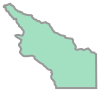

In [27]:
polygon7

In [28]:
index7 = []
for i in range(len(S_Longitude)):
    point = Point(S_Longitude[i],S_Latitude[i])
    if polygon7.contains(point) == True:
        index7.append(i)

index7

[51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 134,
 135,
 136,
 137,
 168,
 169,
 170,
 171,
 172,
 173,
 446,
 447,
 448,
 449,
 450,
 451,
 452,
 453,
 454,
 455,
 456,
 607,
 613,
 619,
 622,
 623,
 632,
 1351,
 1361,
 1369,
 1385,
 1391,
 1397,
 1449,
 1494,
 1496,
 1499,
 1500,
 1501,
 1502,
 1516,
 1518,
 1527,
 1558,
 1559,
 1560,
 1561,
 1562,
 1563,
 1564,
 1565,
 1566,
 1567,
 1568,
 1569,
 1570,
 1571,
 1572,
 1573,
 1574,
 1575,
 1576,
 4877,
 4878,
 4879,
 4880,
 4881,
 4900,
 4901,
 4902,
 4903,
 4904,
 4905,
 4906,
 4907,
 4909,
 4920,
 4922,
 4925,
 5007,
 5008,
 5010,
 5012,
 5013,
 5023,
 5024,
 5025,
 5026,
 5027,
 5039,
 5047,
 5048,
 5058,
 5069,
 5077,
 6868,
 6869,
 6880,
 6885,
 6904,
 6908,
 6945,
 6977,
 6982,
 6986,
 6991,
 6996,
 7061,
 7069,
 7165,
 7169,
 7180,
 7192,
 7256,

In [29]:
index_final = sorted(list(set(index0+index1+index2+index3+index4+index5+index6+index7)))
index_final ## All indexes of stations in the 'data' dataframe in Southern California range, not station ID.

[8,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 134,
 135,
 136,
 137,
 168,
 169,
 170,
 171,
 172,
 173,
 289,
 294,
 301,
 302,
 304,
 331,
 332,
 333,
 334,
 335,
 336,
 340,
 342,
 344,
 346,
 347,
 350,
 352,
 353,
 354,
 355,
 357,
 359,
 362,
 363,
 364,
 366,
 367,
 368,
 372,
 375,
 377,
 378,
 379,
 381,
 382,
 383,
 384,
 386,
 389,
 391,
 400,
 403,
 404,
 407,
 408,
 409,
 410,
 411,
 413,
 414,
 415,
 416,
 420,
 421,
 422,
 423,
 424,
 425,
 428,
 429,
 430,
 433,
 436,
 437,
 438,
 439,
 441,
 444,
 445,
 446,
 447,
 448,
 449,
 450,
 451,
 452,
 453,
 454,
 455,
 456,
 539,
 540,
 541,
 543,
 545,
 548,
 549,
 550,
 553,
 555,
 556,
 557,
 559,
 562,
 564,
 567,
 569,
 571,
 574,
 576,
 577,
 578,
 579,
 581,
 583,
 586,
 587,
 588,
 589,
 592,
 593,
 594,
 596,
 599,
 600,
 603,
 606

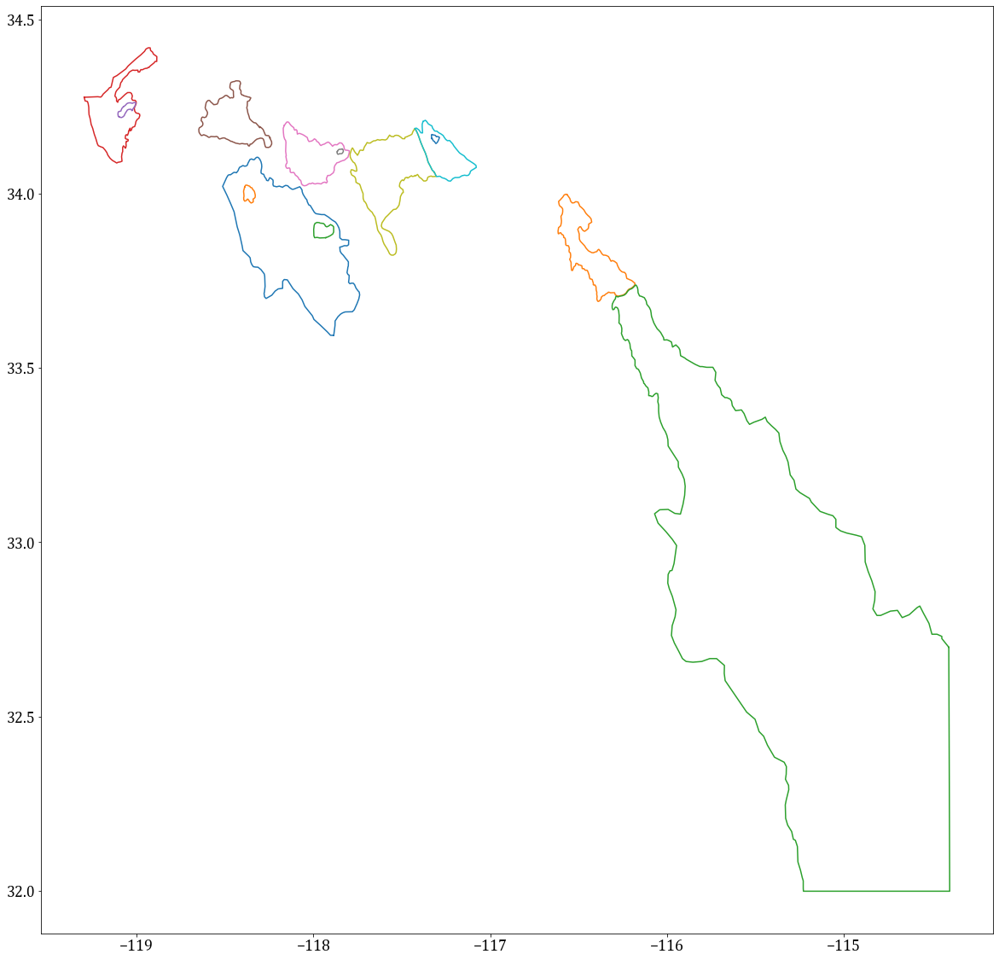

In [30]:
matplotlib.rcParams.update({'font.size': 18, 'font.family': 'cambria'})

plt.figure(figsize=(20,20))
sf = shapefile.Reader('BasinLabelsSoCal03292021.shp')
for shape0 in sf.shapeRecords():
    for i in range(len(shape0.shape.parts)):
        i_start = shape0.shape.parts[i]
        if i==len(shape0.shape.parts)-1:
            i_end = len(shape0.shape.points)
        else:
            i_end = shape0.shape.parts[i+1]
        x = [i[0] for i in shape0.shape.points[i_start:i_end]]
        y = [i[1] for i in shape0.shape.points[i_start:i_end]]
        plt.plot(x,y)
plt.show()

# The dataframe for all stations in range.

In [31]:
data_in_range = data.iloc[index_final,:]
data_in_range # The dataframe for all stations in range.

,Record Sequence Number,EQID,Earthquake Name,YEAR,MODY,HRMN,Station Name,Station Sequence Number,Station ID No.,Earthquake Magnitude,...,Instrument Damping,Instrument Type,Quality_Flag,Spectra Quality Flag,Late S-trigger,Late P-trigger,Idirectivity,Tp,Ry 2,Region
8,68,30,San Fernando,1971,209,1400,LA - Hollywood Stor FF,326,24303,6.61,...,-999.0,-999,-999,0,-999,?,0,-999.0,-14.839429,1
51,158,50,Imperial Valley-06,1979,1015,2316,Aeropuerto Mexicali,243,6616,6.53,...,-999.0,-999,-999,0,-999,?,0,-999.0,-11.0932,0
52,159,50,Imperial Valley-06,1979,1015,2316,Agrarias,245,6618,6.53,...,-999.0,-999,-999,0,-999,D,1,2.338,-15.5075,0
53,160,50,Imperial Valley-06,1979,1015,2316,Bonds Corner,210,5054,6.53,...,-999.0,-999,-999,0,-999,?,0,-999.0,-7.0078,0
54,161,50,Imperial Valley-06,1979,1015,2316,Brawley Airport,216,5060,6.53,...,-999.0,-999,-999,0,-999,?,1,4.396,29.298761,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16567,19373,1264,14355256,2008,309,924,"Fontana, Arrow Hwy and Bennett",3059,fon,3.43,...,0.68,a,0,0,-999,-999,-999,-999.0,5.143425,1
16572,19378,1264,14355256,2008,309,924,La Fresa,100174,LAF,3.43,...,0.707,a,0,0,-999,-999,-999,-999.0,-33.575311,1
16579,19387,1264,14355256,2008,309,924,Padua,100426,PDU,3.43,...,0.707,a,0,0,-999,-999,-999,-999.0,-9.231055,1
16586,19394,1264,14355256,2008,309,924,Rio Hondo,100430,RIO,3.43,...,0.707,v,0,0,-999,-999,-999,-999.0,-29.813911,1


In [28]:
## do we want all recordings related to events associated with stations in range or just recordings related to the station in range?
## for example, we can find all events related to the stations and find all recordings related to those events.
## or we just simply find the stations and find the events and recordings only related to those stations.

## Distinct EQs in polygon region

In [29]:
DISTINCT_EQID = list(set(list(data_in_range['EQID'])))
len(DISTINCT_EQID)

138

## Input variables

In [32]:
Mag = list(data_in_range['Earthquake Magnitude'])
rjb = list(data_in_range['Joyner-Boore Dist. (km)'])
RUP = list(data_in_range['ClstD (km)'])
Vs30 = list(data_in_range['Vs30 (m/s) selected for analysis'])
Lowest_Frequency = list(data_in_range['Lowest Usable Freq - Ave. Component (Hz)'])
Hypocenter_Depth = list(data_in_range['Hypocenter Depth (km)'])
z1_H11_0 = list(data_in_range['Northern CA/Southern CA - H11 Z1 (m)'])
z1_H11 = [x / 1000 for x in z1_H11_0]
z1_S4_0 = list(data_in_range['Northern CA/Southern CA - S4 Z1 (m)'])
z1_S4 = [x / 1000 for x in z1_S4_0]
mech_raw = list(data_in_range['Mechanism Based on Rake Angle'])
EarthquakeSQ = list(data_in_range['EQID'])
z25_H11_0 = list(data_in_range['Northern CA/Southern CA - H11 Z2.5 (m)'])
z25_H11 = [x / 1000 for x in z25_H11_0]
RSN = list(data_in_range['Record Sequence Number'])
SSN = list(data_in_range['Station Sequence Number'])
EQID = list(data_in_range['EQID'])
region = list(data_in_range['Region'])
mech_bssa14 = []
RAKE = list(data_in_range['Rake Angle (deg)'])
R_Latitude = list(data_in_range['Hypocenter Latitude (deg)']) ### DATA IN RANGE HYPO LATI
R_Longitude = list(data_in_range['Hypocenter Longitude (deg)'])
RS_Latitude = list(data_in_range['Station Latitude'])
RS_Longitude = list(data_in_range['Station Longitude'])
for inx in range(len(RAKE)):

    if RAKE[inx] <= 30 and RAKE[inx] >= - 30 or RAKE[inx] <= 180 and RAKE[inx] >= 150 or RAKE[inx] <= - 150 and RAKE[inx] >= - 180:
        mech_bssa14.append(1)

    elif RAKE[inx] <= - 30:
        mech_bssa14.append(2)

    elif RAKE[inx] >= 30:
        mech_bssa14.append(3)

    else:
        mech_bssa14.append(0)

In [33]:
muz1 = np.empty(shape=(len(Mag),1))
dz1 = np.empty(shape=(len(Mag),1))

for i in range(len(Mag)):    
    if (z1_H11_0[i])/1000 != -0.999:
        if region[i] == 1: #california
            muz1[i] = np.exp((-7.15/4)*np.log(((Vs30[i]**4)+(570.94**4))/((1360**4)+(570.94**4)))-np.log(1000))
        elif region[i] == 2: #japan
            muz1[i] = np.exp((-5.23/2)*np.log(((Vs30[i]**2)+(412.39**2))/((1360**2)+(412.39**2)))-np.log(1000))
        else:
            muz1[i] = (z1_H11_0[i])/1000
        
        dz1[i] = (z1_H11_0[i])/1000 - muz1[i]
    else:
        dz1[i] = 0
        


In [34]:
# kmeans_DTDT.to_csv(r'C:\Users\59237\OneDrive\桌面\centroid.csv')

## Compile colors for following graphs, since python default color map is not working

In [35]:
colors = {'-1':'crimson', '0':'blue', '1': 'aqua', '2':'#DAA520','3':'#00FA9A','4':'#CD3700','5':'#696969','6':'#8E8E38',
          '7':'#CD1076','8':'#4169E1','9':'#8B6969','10':'#FFEFD5','11':'#9ACD32','12':'#FFD700','13':'#32CD32', 
          '14':'#CDC673', '15': '#FFA54F', '16':'green','17':'#1E90FF','18':'#7CFC00','19':'#33A1C9',
          '20':'cornflowerblue','21':'#6A5ACD','22':'#872657','23':'#8B6969','24':'#191970','25':'#8B7B8B','26':'#CDBE70',
          '27':'#BDFCC9','28':'#48D1CC','29':'#FF4500','30':'#EE7AE9','31':'#CDAF95','32':'#C67171',
          '33':'#03A89E', '34':'#8B2252', '35': '#CD5C5C', '36': 'chocolate', '37': 'slategray', '38':'plum', '39':'tomato',
          '40':'orchid','41':'paleturquoise', '42':'palegreen', '43': 'tan', '44':'indianred', '45':'lightskyblue',
          '46':'seagreen','47':'gold','48':'magenta','49':'lavender','50':'steelblue',
          '51':'springgreen','52':'bisque','53':'rosybrown','54':'mediumpurple','55':'olivedrab','56':'forestgreen',
          '57':'salmon','58':'#3D59AB','59':'#E9967A','60':'#8B0A50','61':'#1E90FF','62':'#E3A869','63':'#7D9EC0'}

In [37]:
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


## Calculate site response, it'll take several minutes

In [36]:
T = DF_PARA['Period(sec)'] ## START FROM PGV THEN PGA 
aaa = np.empty(shape=(len(Mag),len(T)))
for ins in range(len(Mag)):
    Sa = [] # Because I used append function, for the next row I need to clear the memory - calculated data of previous row
    for j in range(len(T)): 
        Sa.append(get_lnY_bssa14(Mag[ins],T[j],rjb[ins],mech_bssa14[ins],region[ins],Vs30[ins],z1_H11[ins]))
    zx = np.array(Sa)
    zx = zx.reshape(1,-1)
    print(zx)
    aaa[ins,:] = zx
    
aaa.shape

[[1.56736457e+01 1.61515512e-01 1.63226615e-01 1.58715448e-01
  1.58317734e-01 1.58154171e-01 1.58746318e-01 1.59094294e-01
  1.59947619e-01 1.61716529e-01 1.62367845e-01 1.65702817e-01
  1.67552997e-01 1.69481079e-01 1.70592965e-01 1.71797356e-01
  1.73984526e-01 1.76544064e-01 1.83675626e-01 1.92063131e-01
  2.01297630e-01 2.05102824e-01 2.11010917e-01 2.21425356e-01
  2.31903773e-01 2.42828613e-01 2.54016718e-01 2.65135261e-01
  2.75650951e-01 2.95639488e-01 3.14359374e-01 3.30077473e-01
  3.34162002e-01 3.43459905e-01 3.55156580e-01 3.65508831e-01
  3.74478533e-01 3.81622796e-01 3.87876262e-01 3.92301592e-01
  3.96871317e-01 3.98898022e-01 3.98665016e-01 3.98600590e-01
  3.98206685e-01 3.97219974e-01 3.95574567e-01 3.89953056e-01
  3.82154061e-01 3.77021712e-01 3.72350095e-01 3.61343061e-01
  3.50866967e-01 3.41110092e-01 3.31837095e-01 3.27226400e-01
  3.22522979e-01 3.14411580e-01 3.05694869e-01 2.85286580e-01
  2.65034790e-01 2.45855276e-01 2.39149444e-01 2.27054851e-01
  2.1073

[[7.05005379e+00 7.73188447e-02 7.80425137e-02 7.58627752e-02
  7.57596902e-02 7.59402901e-02 7.67461747e-02 7.70419023e-02
  7.76946908e-02 7.88776033e-02 7.92777980e-02 8.11862956e-02
  8.21929721e-02 8.32306924e-02 8.38155067e-02 8.44525355e-02
  8.55708557e-02 8.68977000e-02 9.04712432e-02 9.46066609e-02
  9.90082840e-02 1.00786483e-01 1.03515809e-01 1.08216977e-01
  1.12864612e-01 1.17677503e-01 1.22698526e-01 1.27661541e-01
  1.32493777e-01 1.41804726e-01 1.50955195e-01 1.59049946e-01
  1.61241221e-01 1.66325934e-01 1.72929121e-01 1.78746309e-01
  1.83699121e-01 1.87498263e-01 1.90643468e-01 1.92636849e-01
  1.93991244e-01 1.93366462e-01 1.92232172e-01 1.91183116e-01
  1.88864290e-01 1.87440281e-01 1.85787874e-01 1.81794694e-01
  1.77229451e-01 1.74446751e-01 1.72002743e-01 1.66441872e-01
  1.61340116e-01 1.56644814e-01 1.52248515e-01 1.50065938e-01
  1.47874381e-01 1.44106783e-01 1.40166432e-01 1.31022114e-01
  1.22001464e-01 1.13409840e-01 1.10741917e-01 1.05627574e-01
  9.8468

[[2.00538946e+01 1.89427462e-01 1.91932776e-01 1.84696385e-01
  1.83897944e-01 1.83448480e-01 1.84131727e-01 1.84664159e-01
  1.85889074e-01 1.88395316e-01 1.89274005e-01 1.93370506e-01
  1.95449042e-01 1.97417255e-01 1.98541280e-01 1.99753998e-01
  2.01965697e-01 2.04497483e-01 2.11740027e-01 2.20301271e-01
  2.29612681e-01 2.33441200e-01 2.39282545e-01 2.49590223e-01
  2.59963416e-01 2.70890736e-01 2.82192662e-01 2.93569752e-01
  3.04544935e-01 3.25588560e-01 3.45933797e-01 3.64035556e-01
  3.68915879e-01 3.80345560e-01 3.95387468e-01 4.09554244e-01
  4.22358977e-01 4.33209570e-01 4.42574587e-01 4.49147973e-01
  4.55241359e-01 4.56384640e-01 4.55359748e-01 4.54765288e-01
  4.54283547e-01 4.53436343e-01 4.51933677e-01 4.46186696e-01
  4.38157524e-01 4.32747049e-01 4.27957973e-01 4.16555723e-01
  4.06160821e-01 3.97286201e-01 3.89122837e-01 3.85192544e-01
  3.81190113e-01 3.74464862e-01 3.66986547e-01 3.48278877e-01
  3.27749289e-01 3.07398840e-01 3.00950695e-01 2.88713000e-01
  2.7159

[[3.28080713e+01 2.65053847e-01 2.70072147e-01 2.52407880e-01
  2.49341467e-01 2.45681004e-01 2.42776880e-01 2.43073659e-01
  2.43897609e-01 2.46748890e-01 2.47853924e-01 2.52966352e-01
  2.55468986e-01 2.57299458e-01 2.58395721e-01 2.59548149e-01
  2.61971907e-01 2.64381316e-01 2.72605401e-01 2.82819228e-01
  2.94151097e-01 2.98991913e-01 3.06225583e-01 3.19640371e-01
  3.33250625e-01 3.47653215e-01 3.62285836e-01 3.77231187e-01
  3.91492438e-01 4.18191453e-01 4.42770225e-01 4.64768738e-01
  4.70525647e-01 4.84423038e-01 5.02697334e-01 5.21696600e-01
  5.40045480e-01 5.57478975e-01 5.72697268e-01 5.84120551e-01
  5.96175798e-01 6.00969584e-01 6.01825012e-01 6.03704581e-01
  6.11527481e-01 6.14771187e-01 6.16748710e-01 6.15013822e-01
  6.08633268e-01 6.03216738e-01 5.98376026e-01 5.85604144e-01
  5.73973485e-01 5.66236509e-01 5.59059177e-01 5.56160468e-01
  5.53024144e-01 5.48325309e-01 5.41921562e-01 5.23445054e-01
  4.97883748e-01 4.71109220e-01 4.62317531e-01 4.46379596e-01
  4.2425

[[4.54445876e+01 3.64155049e-01 3.70669367e-01 3.53142419e-01
  3.50293055e-01 3.47188756e-01 3.45198986e-01 3.46014321e-01
  3.48246139e-01 3.53165291e-01 3.54995264e-01 3.62481705e-01
  3.65918872e-01 3.68296249e-01 3.69883026e-01 3.71344201e-01
  3.74323408e-01 3.77380438e-01 3.87821599e-01 4.00823383e-01
  4.15311767e-01 4.21487366e-01 4.30709458e-01 4.47945881e-01
  4.65697387e-01 4.84077049e-01 5.02205669e-01 5.21067302e-01
  5.39038011e-01 5.72785930e-01 6.04421616e-01 6.32461963e-01
  6.39955971e-01 6.57258652e-01 6.80068393e-01 7.03270927e-01
  7.25256818e-01 7.45908171e-01 7.63846670e-01 7.76811766e-01
  7.89550321e-01 7.93615637e-01 7.93993257e-01 7.95268565e-01
  8.03504016e-01 8.07257867e-01 8.09270089e-01 8.06784782e-01
  7.98605767e-01 7.91503359e-01 7.85492766e-01 7.69614038e-01
  7.54964176e-01 7.44405119e-01 7.34607161e-01 7.30771238e-01
  7.26246062e-01 7.19441954e-01 7.10187740e-01 6.85210937e-01
  6.52245517e-01 6.18717978e-01 6.08007887e-01 5.88260075e-01
  5.6031

[[2.14080452e+00 4.81373555e-02 4.89275010e-02 4.72427901e-02
  4.71453278e-02 4.72517302e-02 4.78174414e-02 4.80420192e-02
  4.85297474e-02 4.94191077e-02 4.97283880e-02 5.12118576e-02
  5.20168449e-02 5.28442384e-02 5.33083404e-02 5.38070945e-02
  5.47161052e-02 5.57504240e-02 5.85239492e-02 6.16506734e-02
  6.49478628e-02 6.62822656e-02 6.83305778e-02 7.19110796e-02
  7.56088471e-02 7.83796578e-02 8.13305696e-02 8.43682079e-02
  8.73444343e-02 9.18019435e-02 9.32617565e-02 9.53664508e-02
  9.61038337e-02 9.66967770e-02 9.73842570e-02 9.74879905e-02
  9.69914758e-02 9.73139427e-02 9.57559612e-02 9.48611576e-02
  9.27630114e-02 8.79991021e-02 8.64516242e-02 8.48006019e-02
  8.10552052e-02 8.00569230e-02 7.76284445e-02 7.43498123e-02
  7.04391039e-02 6.92522979e-02 6.71053171e-02 6.44699410e-02
  6.09604551e-02 5.85571325e-02 5.62551208e-02 5.50938966e-02
  5.39271136e-02 5.18741093e-02 4.97089536e-02 4.45899945e-02
  3.96153207e-02 3.52383581e-02 3.43244654e-02 3.23595852e-02
  2.9552

[[5.79319662e+00 1.25328121e-01 1.27602791e-01 1.23211417e-01
  1.22897816e-01 1.23060767e-01 1.24320737e-01 1.24957145e-01
  1.26413261e-01 1.28995810e-01 1.29907175e-01 1.33924331e-01
  1.36000907e-01 1.37970391e-01 1.39122554e-01 1.40285262e-01
  1.42461430e-01 1.44860197e-01 1.51443307e-01 1.58784473e-01
  1.66451572e-01 1.69556843e-01 1.74248446e-01 1.82522558e-01
  1.91069768e-01 1.97050770e-01 2.03139096e-01 2.09540499e-01
  2.15726202e-01 2.24293713e-01 2.25525106e-01 2.28553530e-01
  2.29782679e-01 2.29892043e-01 2.29863864e-01 2.28820382e-01
  2.26639378e-01 2.26768187e-01 2.22625004e-01 2.20105047e-01
  2.14450681e-01 2.02796108e-01 1.99102232e-01 1.95165603e-01
  1.86823498e-01 1.84777455e-01 1.79366516e-01 1.72101784e-01
  1.63288315e-01 1.60637833e-01 1.55782815e-01 1.49927912e-01
  1.42007506e-01 1.36734319e-01 1.31663673e-01 1.29180459e-01
  1.26620855e-01 1.22148246e-01 1.17325802e-01 1.05846997e-01
  9.43895142e-02 8.42881259e-02 8.22145945e-02 7.77519361e-02
  7.1325

[[1.66649040e+01 1.96625577e-01 1.98236363e-01 1.97349543e-01
  1.98249832e-01 2.00630910e-01 2.05319485e-01 2.06757694e-01
  2.09888339e-01 2.15077214e-01 2.16852460e-01 2.24608431e-01
  2.28589020e-01 2.32621868e-01 2.34831793e-01 2.37115273e-01
  2.41262443e-01 2.45868812e-01 2.57602318e-01 2.70112892e-01
  2.82899302e-01 2.87903199e-01 2.95437098e-01 3.08006469e-01
  3.20245720e-01 3.32656910e-01 3.45140766e-01 3.57498598e-01
  3.69272037e-01 3.91987046e-01 4.14360183e-01 4.33481709e-01
  4.38578443e-01 4.49863270e-01 4.63829836e-01 4.74992936e-01
  4.83298626e-01 4.88266617e-01 4.91535557e-01 4.91879328e-01
  4.86784828e-01 4.77960343e-01 4.71926779e-01 4.66060679e-01
  4.54507462e-01 4.48529891e-01 4.42406385e-01 4.29426228e-01
  4.16086538e-01 4.08541029e-01 4.01865192e-01 3.87355347e-01
  3.73992974e-01 3.61464811e-01 3.49776583e-01 3.44068824e-01
  3.38328523e-01 3.28299561e-01 3.18091666e-01 2.95052777e-01
  2.73505939e-01 2.53849112e-01 2.47836434e-01 2.36385839e-01
  2.2028

[[3.96315011e+01 5.00991065e-01 5.06668514e-01 5.05250113e-01
  5.07014571e-01 5.11732373e-01 5.20523776e-01 5.24153565e-01
  5.33599883e-01 5.47766609e-01 5.52831101e-01 5.71787244e-01
  5.80933846e-01 5.88838362e-01 5.94221892e-01 5.98672951e-01
  6.06841299e-01 6.15993743e-01 6.40642333e-01 6.67450675e-01
  6.95334625e-01 7.06492249e-01 7.23085082e-01 7.52593632e-01
  7.83169085e-01 8.11546894e-01 8.36492839e-01 8.63387949e-01
  8.89016170e-01 9.38135416e-01 9.87746039e-01 1.03001547e+00
  1.04215084e+00 1.06620949e+00 1.09757550e+00 1.12408106e+00
  1.14504810e+00 1.16098519e+00 1.17301649e+00 1.17758537e+00
  1.17225447e+00 1.15673356e+00 1.14642471e+00 1.12236583e+00
  1.05815092e+00 1.04004517e+00 1.00910398e+00 9.67757594e-01
  9.24053197e-01 9.09047057e-01 8.87172196e-01 8.59133436e-01
  8.23825621e-01 7.99120764e-01 7.75977032e-01 7.65735338e-01
  7.54164044e-01 7.34756728e-01 7.13193061e-01 6.64569978e-01
  6.15919157e-01 5.70648179e-01 5.53577404e-01 5.23369989e-01
  4.8175

[[6.52296545e+00 9.45329242e-02 9.55094654e-02 9.30646063e-02
  9.29650433e-02 9.32400977e-02 9.43183513e-02 9.47196670e-02
  9.56071980e-02 9.72204418e-02 9.77771065e-02 1.00401889e-01
  1.01791705e-01 1.03219519e-01 1.04019115e-01 1.04881397e-01
  1.06432079e-01 1.08224729e-01 1.13046324e-01 1.18573376e-01
  1.24483616e-01 1.26879888e-01 1.30563536e-01 1.36945944e-01
  1.43358124e-01 1.50061533e-01 1.57040459e-01 1.64017800e-01
  1.70797995e-01 1.83939743e-01 1.96854648e-01 2.08318266e-01
  2.11431703e-01 2.18603678e-01 2.27937420e-01 2.36210648e-01
  2.43233348e-01 2.48618180e-01 2.52950742e-01 2.55584805e-01
  2.57018701e-01 2.43898169e-01 2.36901952e-01 2.30359082e-01
  2.17920937e-01 2.14102324e-01 2.07762306e-01 1.99056054e-01
  1.89801628e-01 1.86727822e-01 1.81967050e-01 1.75693310e-01
  1.68002197e-01 1.62658719e-01 1.57656570e-01 1.55177553e-01
  1.52691985e-01 1.48391677e-01 1.43884214e-01 1.33296513e-01
  1.22850057e-01 1.13262126e-01 1.11036601e-01 1.06317496e-01
  9.9466

[[1.21192607e+01 1.64025226e-01 1.65983208e-01 1.61463079e-01
  1.61171776e-01 1.61438434e-01 1.62955773e-01 1.63611096e-01
  1.65079498e-01 1.67797278e-01 1.68742509e-01 1.73076659e-01
  1.75308988e-01 1.77515865e-01 1.78762144e-01 1.80088792e-01
  1.82505489e-01 1.85260603e-01 1.92826732e-01 2.01549294e-01
  2.10941374e-01 2.14771160e-01 2.20638699e-01 2.30894096e-01
  2.41266551e-01 2.52159391e-01 2.63420270e-01 2.74766983e-01
  2.85736434e-01 3.06924019e-01 3.27606071e-01 3.45951537e-01
  3.50927375e-01 3.62390358e-01 3.77364864e-01 3.90956598e-01
  4.02747077e-01 4.12153752e-01 4.19879794e-01 4.24777102e-01
  4.27944827e-01 4.06827253e-01 3.95695565e-01 3.85368589e-01
  3.66222195e-01 3.60678857e-01 3.50832159e-01 3.37463964e-01
  3.22852300e-01 3.18130772e-01 3.10466513e-01 3.00635116e-01
  2.88300986e-01 2.80088450e-01 2.72431881e-01 2.68679141e-01
  2.64883715e-01 2.58352903e-01 2.51357331e-01 2.34504499e-01
  2.17249780e-01 2.01382313e-01 1.98272551e-01 1.91192795e-01
  1.8062

[[1.34147676e+01 1.93363414e-01 1.95278473e-01 1.92991838e-01
  1.93423567e-01 1.94992444e-01 1.98478239e-01 1.99624639e-01
  2.02151147e-01 2.06419154e-01 2.07883069e-01 2.14324359e-01
  2.17611857e-01 2.20914379e-01 2.22755625e-01 2.24668001e-01
  2.28130361e-01 2.32037094e-01 2.42281087e-01 2.53603669e-01
  2.65494616e-01 2.70243788e-01 2.77476507e-01 2.89840770e-01
  3.02193122e-01 3.14961079e-01 3.27981073e-01 3.41036557e-01
  3.53582662e-01 3.77855521e-01 4.01740669e-01 4.22564860e-01
  4.28197534e-01 4.40856797e-01 4.57034271e-01 4.70848858e-01
  4.82032410e-01 4.89987333e-01 4.96029224e-01 4.98855772e-01
  4.97657414e-01 4.69190777e-01 4.54521992e-01 4.40746418e-01
  4.15051997e-01 4.07058502e-01 3.94446373e-01 3.77163746e-01
  3.59232822e-01 3.53323466e-01 3.44253050e-01 3.32436574e-01
  3.17902655e-01 3.07662889e-01 2.98072212e-01 2.93359169e-01
  2.88591940e-01 2.80287544e-01 2.71626776e-01 2.51483463e-01
  2.31909344e-01 2.14364417e-01 2.10850253e-01 2.02944168e-01
  1.9114

[[8.49018092e+00 1.19470867e-01 1.20793846e-01 1.17515650e-01
  1.17332520e-01 1.17584494e-01 1.18801191e-01 1.19285866e-01
  1.20364193e-01 1.22351111e-01 1.23039849e-01 1.26265127e-01
  1.27958540e-01 1.29675542e-01 1.30639649e-01 1.31676277e-01
  1.33550732e-01 1.35706644e-01 1.41556165e-01 1.48280263e-01
  1.55495637e-01 1.58428836e-01 1.62932979e-01 1.70765785e-01
  1.78659321e-01 1.86934031e-01 1.95530147e-01 2.04152319e-01
  2.12514421e-01 2.28702926e-01 2.44566880e-01 2.58655548e-01
  2.62481125e-01 2.71303795e-01 2.82817015e-01 2.93145685e-01
  3.02017526e-01 3.08960802e-01 3.14614855e-01 3.18147879e-01
  3.20326446e-01 3.04312076e-01 2.95797155e-01 2.87864128e-01
  2.72918575e-01 2.68439090e-01 2.60775981e-01 2.50294358e-01
  2.39006795e-01 2.35297451e-01 2.29437623e-01 2.21796510e-01
  2.12346861e-01 2.05902163e-01 1.99884420e-01 1.96913242e-01
  1.93926642e-01 1.88771027e-01 1.83317915e-01 1.70352545e-01
  1.57343391e-01 1.45348974e-01 1.42645644e-01 1.36844326e-01
  1.2838

[[1.01883874e+01 1.44887916e-01 1.46431878e-01 1.43345919e-01
  1.43336103e-01 1.43979937e-01 1.45900389e-01 1.46592926e-01
  1.48123092e-01 1.50837779e-01 1.51773776e-01 1.56042156e-01
  1.58253819e-01 1.60488227e-01 1.61735457e-01 1.63060048e-01
  1.65456224e-01 1.68188885e-01 1.75500098e-01 1.83772028e-01
  1.92573507e-01 1.96126054e-01 2.01562783e-01 2.10950529e-01
  2.20373297e-01 2.30205747e-01 2.40353132e-01 2.50523072e-01
  2.60345283e-01 2.79346200e-01 2.97975449e-01 3.14393614e-01
  3.18839175e-01 3.29004014e-01 3.42156430e-01 3.53747534e-01
  3.63495779e-01 3.70873318e-01 3.76738893e-01 3.80100102e-01
  3.81210336e-01 3.60977644e-01 3.50371001e-01 3.40467840e-01
  3.21893403e-01 3.16228599e-01 3.06886104e-01 2.94088404e-01
  2.80524839e-01 2.76064492e-01 2.69098190e-01 2.60017157e-01
  2.48821278e-01 2.41090480e-01 2.33867877e-01 2.30305224e-01
  2.26720446e-01 2.20506954e-01 2.13977752e-01 1.98577849e-01
  1.83321617e-01 1.69625167e-01 1.67393837e-01 1.61827978e-01
  1.5325

[[7.24059489e+00 1.03135459e-01 1.04245895e-01 1.01391735e-01
  1.01233416e-01 1.01452152e-01 1.02511425e-01 1.02926110e-01
  1.03847396e-01 1.05544287e-01 1.06131617e-01 1.08905800e-01
  1.10372476e-01 1.11871294e-01 1.12713023e-01 1.13621338e-01
  1.15258469e-01 1.17150277e-01 1.22272499e-01 1.28169587e-01
  1.34496813e-01 1.37068817e-01 1.41023452e-01 1.47896677e-01
  1.54819099e-01 1.62072223e-01 1.69624474e-01 1.77189694e-01
  1.84540363e-01 1.98784136e-01 2.12765935e-01 2.25198832e-01
  2.28578154e-01 2.36377244e-01 2.46559073e-01 2.55666801e-01
  2.63473808e-01 2.69558394e-01 2.74507304e-01 2.77605003e-01
  2.79557432e-01 2.65613325e-01 2.58165817e-01 2.51215167e-01
  2.38044256e-01 2.34062010e-01 2.27303010e-01 2.18044353e-01
  2.08107825e-01 2.04825572e-01 1.99679718e-01 1.92935136e-01
  1.84623688e-01 1.78913085e-01 1.73574517e-01 1.70932802e-01
  1.68280815e-01 1.63700849e-01 1.58872645e-01 1.47446692e-01
  1.36053149e-01 1.25729346e-01 1.23923188e-01 1.19580264e-01
  1.1299

[[5.75459586e+00 8.24329481e-02 8.32989056e-02 8.08957327e-02
  8.07417166e-02 8.08709490e-02 8.16564665e-02 8.19671257e-02
  8.26576812e-02 8.39392279e-02 8.43819085e-02 8.65080792e-02
  8.76437025e-02 8.88146914e-02 8.94753236e-02 9.01930508e-02
  9.14796132e-02 9.29814905e-02 9.70599568e-02 1.01795236e-01
  1.06892564e-01 1.08970225e-01 1.12174468e-01 1.17756549e-01
  1.23387137e-01 1.29292404e-01 1.35470806e-01 1.41656762e-01
  1.47691220e-01 1.59404694e-01 1.70934728e-01 1.81231078e-01
  1.84037993e-01 1.90532364e-01 1.99040969e-01 2.06666272e-01
  2.13228432e-01 2.18372071e-01 2.22584641e-01 2.25293307e-01
  2.27263019e-01 2.16243754e-01 2.10296281e-01 2.04734437e-01
  1.94108453e-01 1.90893720e-01 1.85397558e-01 1.77877321e-01
  1.69786057e-01 1.67104708e-01 1.62906856e-01 1.57385292e-01
  1.50580084e-01 1.45883390e-01 1.41483220e-01 1.39299458e-01
  1.37108107e-01 1.33327291e-01 1.29344492e-01 1.19949980e-01
  1.10609484e-01 1.02093454e-01 1.00435356e-01 9.66343918e-02
  9.0963

[[2.93257857e+01 3.92510272e-01 3.97001135e-01 3.94003329e-01
  3.94976228e-01 3.98089133e-01 4.04436713e-01 4.06873957e-01
  4.12790445e-01 4.22084961e-01 4.25333044e-01 4.38182662e-01
  4.44404621e-01 4.50066953e-01 4.53600146e-01 4.56841350e-01
  4.62739291e-01 4.69391209e-01 4.87344393e-01 5.07320661e-01
  5.28441000e-01 5.36950933e-01 5.49808668e-01 5.72411104e-01
  5.95596928e-01 6.18672002e-01 6.40884368e-01 6.63966420e-01
  6.86080985e-01 7.28673577e-01 7.70984483e-01 8.07660108e-01
  8.17873242e-01 8.39675601e-01 8.67986410e-01 8.92579096e-01
  9.12793002e-01 9.28260465e-01 9.40413344e-01 9.46480124e-01
  9.45876074e-01 8.93463312e-01 8.67114446e-01 8.41863014e-01
  7.96864131e-01 7.84163873e-01 7.61847731e-01 7.32056704e-01
  6.99998283e-01 6.89455264e-01 6.73011981e-01 6.52276822e-01
  6.25767937e-01 6.07553918e-01 5.90451064e-01 5.82514207e-01
  5.73934988e-01 5.59318585e-01 5.43314887e-01 5.06211753e-01
  4.68842722e-01 4.33474523e-01 4.20057349e-01 3.96337100e-01
  3.6400

[[4.21910477e+00 6.59830895e-02 6.65495050e-02 6.53701331e-02
  6.54377922e-02 6.58565199e-02 6.69439015e-02 6.73004782e-02
  6.80757006e-02 6.94286861e-02 6.98917320e-02 7.20461362e-02
  7.31880821e-02 7.43723284e-02 7.50269478e-02 7.57290258e-02
  7.69889301e-02 7.84342697e-02 8.22309838e-02 8.64944815e-02
  9.09767067e-02 9.27731646e-02 9.55238249e-02 1.00226003e-01
  1.04885116e-01 1.09696400e-01 1.14685421e-01 1.19624701e-01
  1.24414412e-01 1.33682211e-01 1.42796563e-01 1.50792439e-01
  1.52944858e-01 1.57859636e-01 1.64125692e-01 1.69428783e-01
  1.73685788e-01 1.76649201e-01 1.78845777e-01 1.79871851e-01
  1.79472089e-01 1.69150863e-01 1.63722737e-01 1.58617474e-01
  1.48872102e-01 1.45711130e-01 1.40899248e-01 1.34223147e-01
  1.27410231e-01 1.25101847e-01 1.21698912e-01 1.17115493e-01
  1.11616694e-01 1.07641931e-01 1.03896507e-01 1.02036431e-01
  1.00180075e-01 9.69476976e-02 9.36341439e-02 8.60848952e-02
  7.89439352e-02 7.22453509e-02 6.97920175e-02 6.54178601e-02
  5.9538

[[6.68835821e+00 9.86447353e-02 9.96249579e-02 9.74115144e-02
  9.73932920e-02 9.78210381e-02 9.91444008e-02 9.96100670e-02
  1.00634338e-01 1.02460443e-01 1.03089110e-01 1.06017020e-01
  1.07560360e-01 1.09146462e-01 1.10029472e-01 1.10976628e-01
  1.12681604e-01 1.14640566e-01 1.19857271e-01 1.25771810e-01
  1.32054977e-01 1.34589413e-01 1.38476211e-01 1.45173204e-01
  1.51872886e-01 1.58851008e-01 1.66089993e-01 1.73312042e-01
  1.80312137e-01 1.93869513e-01 2.07189278e-01 2.18949815e-01
  2.22134160e-01 2.29436715e-01 2.38875544e-01 2.47125453e-01
  2.54011555e-01 2.59145309e-01 2.63186592e-01 2.65475062e-01
  2.66176921e-01 2.51944947e-01 2.44420932e-01 2.37375598e-01
  2.24002860e-01 2.19827073e-01 2.13100472e-01 2.03832302e-01
  1.94110724e-01 1.90868148e-01 1.85913764e-01 1.79358169e-01
  1.71370313e-01 1.65760849e-01 1.60506903e-01 1.57903515e-01
  1.55296029e-01 1.50772050e-01 1.46060678e-01 1.35073804e-01
  1.24355551e-01 1.14645759e-01 1.12607280e-01 1.08103262e-01
  1.0146

[[4.94292253e+00 1.29855679e-01 1.31369301e-01 1.29903799e-01
  1.30129151e-01 1.30943167e-01 1.32839749e-01 1.33512713e-01
  1.35051182e-01 1.37702395e-01 1.38656082e-01 1.43074951e-01
  1.45479945e-01 1.47963154e-01 1.49383343e-01 1.50847028e-01
  1.53564253e-01 1.56612485e-01 1.64719939e-01 1.73734777e-01
  1.83315989e-01 1.87196003e-01 1.93174975e-01 2.03609057e-01
  2.14243701e-01 2.21760332e-01 2.29208044e-01 2.36614300e-01
  2.43371550e-01 2.51971261e-01 2.51439119e-01 2.52094551e-01
  2.52550558e-01 2.50478438e-01 2.47176409e-01 2.42508729e-01
  2.36707237e-01 2.33273315e-01 2.26057383e-01 2.21084960e-01
  2.12273778e-01 1.99529516e-01 1.95389106e-01 1.91051530e-01
  1.81779809e-01 1.79105146e-01 1.73500154e-01 1.65843870e-01
  1.57032479e-01 1.54251653e-01 1.49511413e-01 1.43473555e-01
  1.35539368e-01 1.29723375e-01 1.24089240e-01 1.21282389e-01
  1.18425487e-01 1.13394220e-01 1.08158092e-01 9.63234833e-02
  8.53802576e-02 7.56743542e-02 7.23833752e-02 6.66064786e-02
  5.9067

[[2.03579927e+01 1.96258049e-01 1.98677757e-01 1.92502320e-01
  1.92002355e-01 1.92051810e-01 1.93426380e-01 1.94100607e-01
  1.95625751e-01 1.98527524e-01 1.99531236e-01 2.04120504e-01
  2.06438303e-01 2.08675253e-01 2.09942807e-01 2.11298150e-01
  2.13742624e-01 2.16552245e-01 2.24388083e-01 2.33506760e-01
  2.43346382e-01 2.47358531e-01 2.53479349e-01 2.64183066e-01
  2.74919686e-01 2.86187053e-01 2.97815488e-01 3.09501752e-01
  3.20764867e-01 3.42411593e-01 3.63462133e-01 3.82098590e-01
  3.87129133e-01 3.98810051e-01 4.14102661e-01 4.28215811e-01
  4.40736777e-01 4.51042006e-01 4.59842073e-01 4.65779444e-01
  4.70653747e-01 4.70662345e-01 4.69023957e-01 4.67774445e-01
  4.65818827e-01 4.64270031e-01 4.62131218e-01 4.55364042e-01
  4.46545779e-01 4.40781279e-01 4.35691461e-01 4.23753693e-01
  4.12850395e-01 4.03294623e-01 3.94483178e-01 3.90202725e-01
  3.85849111e-01 3.78459201e-01 3.70379854e-01 3.50534194e-01
  3.29387317e-01 3.09794767e-01 3.07140188e-01 2.99849726e-01
  2.8831

[[4.05701980e+01 3.86464516e-01 3.90661833e-01 3.87585172e-01
  3.88697693e-01 3.92009975e-01 3.98513916e-01 4.00789638e-01
  4.06100118e-01 4.14554693e-01 4.17459541e-01 4.29226635e-01
  4.34925466e-01 4.40249752e-01 4.43429098e-01 4.46472498e-01
  4.51926025e-01 4.58116317e-01 4.74601904e-01 4.92883312e-01
  5.12188001e-01 5.19916769e-01 5.31615804e-01 5.51937949e-01
  5.72551900e-01 5.93456426e-01 6.14083985e-01 6.35297097e-01
  6.55656990e-01 6.95114501e-01 7.34484655e-01 7.68763774e-01
  7.78222254e-01 7.98804091e-01 8.25475434e-01 8.48723052e-01
  8.68118642e-01 8.83025215e-01 8.95314050e-01 9.02201219e-01
  9.04407435e-01 8.98938860e-01 8.93672600e-01 8.88437826e-01
  8.79924555e-01 8.75382110e-01 8.69775174e-01 8.55324293e-01
  8.37929280e-01 8.26749635e-01 8.17228332e-01 7.95272134e-01
  7.74819699e-01 7.55811041e-01 7.38062311e-01 7.29720923e-01
  7.20769047e-01 7.05473917e-01 6.88707227e-01 6.49418210e-01
  6.09404632e-01 5.73949400e-01 5.69667523e-01 5.57203232e-01
  5.3665

[[3.6269068  0.026424   0.02665364 0.02544325 0.02526578 0.02505607
  0.02486923 0.02483274 0.02474798 0.02462292 0.02456611 0.02439428
  0.02430876 0.02423095 0.02421451 0.02421637 0.02417715 0.02422684
  0.02452491 0.02514156 0.0259138  0.02626179 0.02683311 0.02790719
  0.02901658 0.03020867 0.0315528  0.03289379 0.03428034 0.03697858
  0.03971713 0.04230759 0.0430447  0.04482936 0.0473096  0.04969932
  0.0519906  0.05408237 0.056101   0.05788131 0.06079442 0.06309608
  0.06394783 0.06481161 0.06633548 0.06692757 0.06735013 0.06777915
  0.06775296 0.06746871 0.06728205 0.0665041  0.06574107 0.06497278
  0.06414832 0.0636838  0.06318319 0.06236916 0.06137922 0.05895567
  0.05614955 0.05326726 0.05273516 0.05138532 0.04928014 0.04764446
  0.0463601  0.04518327 0.04408801 0.0432125  0.04071475 0.03841704
  0.03638816 0.03456922 0.03285091 0.03136567 0.03001166 0.0287385
  0.02755708 0.02656831 0.02423372 0.02244541 0.02193415 0.02148914
  0.02043308 0.0195722  0.01872327 0.01794862 0.0

[[4.54421381 0.03282446 0.03313786 0.03147113 0.0312184  0.03091232
  0.03062872 0.03057467 0.03045591 0.03029197 0.03022136 0.03001512
  0.02991646 0.02982759 0.02981106 0.02981724 0.02977958 0.02984909
  0.03024046 0.03102039 0.03199615 0.03243481 0.03315252 0.03450077
  0.03589676 0.03740009 0.03908712 0.04077515 0.04251392 0.04589747
  0.04932222 0.05256411 0.05348725 0.05572548 0.05884835 0.06188714
  0.0648252  0.0675319  0.07014951 0.07246205 0.07622697 0.07919129
  0.08030211 0.08143625 0.08347224 0.08427437 0.08485567 0.08545003
  0.08543253 0.08507417 0.08483445 0.08384649 0.08289446 0.0819738
  0.08100412 0.08046051 0.07987264 0.07892895 0.07775242 0.07478683
  0.07124204 0.06759893 0.06705025 0.06550584 0.06303913 0.06126691
  0.05999928 0.05888698 0.05787023 0.05711953 0.05420295 0.05145225
  0.04898531 0.04674165 0.0441923  0.04196747 0.03992521 0.03804908
  0.03638448 0.03507617 0.03208683 0.02983485 0.02929726 0.02884999
  0.02755538 0.02652112 0.02550907 0.02460744 0.0

[[3.95717872 0.0305697  0.03083039 0.02950654 0.02932764 0.02913534
  0.02900597 0.02898913 0.02894744 0.02889756 0.02886552 0.02880661
  0.02877809 0.02875743 0.02877252 0.02880847 0.02882723 0.02894583
  0.02942511 0.0302479  0.03123356 0.03166641 0.03236642 0.03365776
  0.0349722  0.03636979 0.03792599 0.03946933 0.04105099 0.04411411
  0.04720336 0.05009105 0.05090545 0.05287009 0.05557088 0.0581366
  0.06056017 0.06272886 0.06479646 0.06657616 0.06937407 0.07146885
  0.07217898 0.07290256 0.07413314 0.07457039 0.07483271 0.0749337
  0.07458572 0.07413193 0.07379456 0.07270606 0.07166289 0.07063334
  0.06956267 0.06897774 0.06835802 0.06732989 0.06612888 0.06323534
  0.06000927 0.0567718  0.05617548 0.0546817  0.05236553 0.05056923
  0.04915879 0.04787347 0.04668334 0.04573264 0.04301978 0.04054378
  0.03836757 0.03642555 0.03459811 0.03302258 0.03158891 0.03024445
  0.02900276 0.0279714  0.02554564 0.02369177 0.02317502 0.02272489
  0.02162637 0.02072941 0.01984825 0.01904182 0.01

[[3.72786942 0.024305   0.02453796 0.02323406 0.02301814 0.02273343
  0.02241762 0.02234525 0.02218446 0.02193816 0.02184115 0.02150267
  0.02133632 0.02117941 0.02112257 0.02108303 0.02097104 0.0209433
  0.02105844 0.0214944  0.02209618 0.0223809  0.0228604  0.0237918
  0.02477997 0.02586237 0.02710372 0.02835704 0.02966813 0.03224121
  0.03487683 0.03741905 0.03815311 0.03994197 0.04247712 0.04498805
  0.04746238 0.04979931 0.05209828 0.05419514 0.05779481 0.06082097
  0.06205187 0.06330276 0.06561    0.06658118 0.06736093 0.06842476
  0.06892717 0.06886984 0.06889529 0.06848659 0.06805792 0.06761583
  0.06709741 0.06677646 0.06641166 0.06586178 0.06509235 0.06307956
  0.06046878 0.05761691 0.05704235 0.05561048 0.05338566 0.05163973
  0.05026287 0.04899295 0.0478013  0.04683282 0.04419362 0.04170194
  0.03946448 0.03743867 0.03552405 0.03386694 0.03236438 0.03095356
  0.02963562 0.02851161 0.02591525 0.02390314 0.02327294 0.02272233
  0.02152333 0.02054173 0.01957931 0.01870741 0.01

[[1.97055052e+00 1.92796337e-02 1.94356721e-02 1.88374061e-02
  1.87762166e-02 1.87432464e-02 1.87969990e-02 1.88227742e-02
  1.88734439e-02 1.89673264e-02 1.89919810e-02 1.91517538e-02
  1.92393446e-02 1.93355876e-02 1.94011869e-02 1.94813610e-02
  1.96024413e-02 1.97877030e-02 2.03547974e-02 2.11410929e-02
  2.20351162e-02 2.24157405e-02 2.30228874e-02 2.41218809e-02
  2.52473328e-02 2.64414329e-02 2.77510149e-02 2.90597535e-02
  3.03865278e-02 3.29830473e-02 3.56026916e-02 3.80261376e-02
  3.87034580e-02 4.03037644e-02 4.24613404e-02 4.44424462e-02
  4.62250268e-02 4.77253308e-02 4.90662862e-02 5.01275746e-02
  5.16069048e-02 5.25299539e-02 5.27234703e-02 5.29151260e-02
  5.31234897e-02 5.31086004e-02 5.29894207e-02 5.25026020e-02
  5.17484751e-02 5.11805132e-02 5.06989237e-02 4.94505218e-02
  4.82531929e-02 4.70982439e-02 4.59658628e-02 4.53824579e-02
  4.47861268e-02 4.37803525e-02 4.26973059e-02 4.02178887e-02
  3.77313163e-02 3.53888524e-02 3.49315602e-02 3.38422521e-02
  3.2170

[[1.00690697e+01 1.10540122e-01 1.11635630e-01 1.08784592e-01
  1.08699538e-01 1.09065703e-01 1.10368633e-01 1.10839955e-01
  1.11881857e-01 1.13756938e-01 1.14397408e-01 1.17384332e-01
  1.18944212e-01 1.20536314e-01 1.21424663e-01 1.22381530e-01
  1.24083446e-01 1.26060607e-01 1.31345769e-01 1.37359223e-01
  1.43732282e-01 1.46295466e-01 1.50212980e-01 1.56936898e-01
  1.63590401e-01 1.70488086e-01 1.77630864e-01 1.84715329e-01
  1.91568129e-01 2.04772050e-01 2.17713496e-01 2.29101023e-01
  2.32173314e-01 2.39262694e-01 2.48429221e-01 2.56490575e-01
  2.63312811e-01 2.68495113e-01 2.72727722e-01 2.75279767e-01
  2.76550322e-01 2.75051016e-01 2.73201171e-01 2.71499712e-01
  2.67950405e-01 2.65841293e-01 2.63446618e-01 2.57659848e-01
  2.51077376e-01 2.47094996e-01 2.43577034e-01 2.35630191e-01
  2.28357109e-01 2.21714389e-01 2.15542749e-01 2.12498457e-01
  2.09444895e-01 2.04189805e-01 1.98694295e-01 1.85850793e-01
  1.73132947e-01 1.60705951e-01 1.55804454e-01 1.47151987e-01
  1.3550

[[8.61923382e+00 9.44546159e-02 9.53075824e-02 9.26828232e-02
  9.24788862e-02 9.24390935e-02 9.29041696e-02 9.31234035e-02
  9.36486381e-02 9.47127942e-02 9.50989849e-02 9.71239653e-02
  9.82688836e-02 9.94900026e-02 1.00190417e-01 1.00956020e-01
  1.02329314e-01 1.03954761e-01 1.08416572e-01 1.13642641e-01
  1.19336103e-01 1.21669034e-01 1.25290582e-01 1.31622144e-01
  1.37917010e-01 1.44416961e-01 1.51092338e-01 1.57652523e-01
  1.63875600e-01 1.75673120e-01 1.86729906e-01 1.95973427e-01
  1.98365063e-01 2.03822718e-01 2.10618580e-01 2.16453241e-01
  2.21367398e-01 2.25097152e-01 2.28301344e-01 2.30478160e-01
  2.32523632e-01 2.33121353e-01 2.32609091e-01 2.32157835e-01
  2.30859869e-01 2.29737668e-01 2.28237629e-01 2.24107188e-01
  2.18914922e-01 2.15650893e-01 2.12704510e-01 2.05886610e-01
  1.99414377e-01 1.93290757e-01 1.87427294e-01 1.84492561e-01
  1.81517797e-01 1.76366673e-01 1.70936747e-01 1.58533206e-01
  1.46600879e-01 1.35901281e-01 1.33648276e-01 1.28749753e-01
  1.2163

[[7.27936735e+00 7.32015860e-02 7.39659351e-02 7.08892762e-02
  7.04630269e-02 6.99882696e-02 6.97162211e-02 6.97306487e-02
  6.98105841e-02 7.01392549e-02 7.02689083e-02 7.11523159e-02
  7.16962222e-02 7.22920551e-02 7.26595804e-02 7.30802603e-02
  7.38199734e-02 7.47584387e-02 7.75190688e-02 8.10001457e-02
  8.49354242e-02 8.65915741e-02 8.91988020e-02 9.38782553e-02
  9.86273653e-02 1.03614742e-01 1.08839674e-01 1.14029863e-01
  1.19038636e-01 1.28598057e-01 1.37644477e-01 1.45465246e-01
  1.47539857e-01 1.52377983e-01 1.58659394e-01 1.64427400e-01
  1.69657837e-01 1.74103514e-01 1.78153235e-01 1.81385385e-01
  1.85798589e-01 1.88785762e-01 1.89566036e-01 1.90402800e-01
  1.91689229e-01 1.91839792e-01 1.91551105e-01 1.89679649e-01
  1.86510400e-01 1.84232283e-01 1.82179154e-01 1.77117488e-01
  1.72270233e-01 1.67756793e-01 1.63417091e-01 1.61231989e-01
  1.58994479e-01 1.55185674e-01 1.51022163e-01 1.41227606e-01
  1.31288514e-01 1.22090834e-01 1.20149542e-01 1.15888673e-01
  1.0969

[[1.01497196e+01 1.02087217e-01 1.03209237e-01 9.90708376e-02
  9.85186346e-02 9.79360783e-02 9.76838704e-02 9.77514088e-02
  9.79695924e-02 9.86210542e-02 9.88736584e-02 1.00387437e-01
  1.01280285e-01 1.02230865e-01 1.02799984e-01 1.03438963e-01
  1.04585024e-01 1.05984106e-01 1.10038869e-01 1.15022423e-01
  1.20607268e-01 1.22942145e-01 1.26594155e-01 1.33114202e-01
  1.39706717e-01 1.46616391e-01 1.53789227e-01 1.60914276e-01
  1.67730546e-01 1.80695138e-01 1.92868682e-01 2.03284259e-01
  2.06021142e-01 2.12377725e-01 2.20554917e-01 2.28044573e-01
  2.34795311e-01 2.40485256e-01 2.45619363e-01 2.49605388e-01
  2.54695763e-01 2.57882217e-01 2.58569199e-01 2.59368138e-01
  2.60628914e-01 2.60638139e-01 2.60094810e-01 2.57253999e-01
  2.52713551e-01 2.49540837e-01 2.46665335e-01 2.39687119e-01
  2.33043728e-01 2.26927958e-01 2.21087208e-01 2.18167593e-01
  2.15182934e-01 2.10088759e-01 2.04523665e-01 1.91346417e-01
  1.77927656e-01 1.65636983e-01 1.63356467e-01 1.58092428e-01
  1.5032

[[1.05181950e+01 1.10153538e-01 1.11261739e-01 1.07684270e-01
  1.07310715e-01 1.07041405e-01 1.07262038e-01 1.07446111e-01
  1.07913005e-01 1.08946969e-01 1.09329761e-01 1.11402491e-01
  1.12584028e-01 1.13839090e-01 1.14568671e-01 1.15371781e-01
  1.16814389e-01 1.18536188e-01 1.23357754e-01 1.29099809e-01
  1.35430557e-01 1.38044839e-01 1.42113994e-01 1.49289512e-01
  1.56481750e-01 1.63963489e-01 1.71671622e-01 1.79291595e-01
  1.86534832e-01 2.00287744e-01 2.13181340e-01 2.24057168e-01
  2.26889390e-01 2.33393682e-01 2.41612481e-01 2.48894142e-01
  2.55235950e-01 2.60312514e-01 2.64788685e-01 2.68045693e-01
  2.71672622e-01 2.73471584e-01 2.73435665e-01 2.73498775e-01
  2.73247759e-01 2.72531174e-01 2.71319473e-01 2.67323075e-01
  2.61834121e-01 2.58234051e-01 2.54974894e-01 2.47289753e-01
  2.39988738e-01 2.33163026e-01 2.26645553e-01 2.23386243e-01
  2.20069618e-01 2.14355817e-01 2.08235960e-01 1.94000950e-01
  1.79940441e-01 1.67407740e-01 1.65553457e-01 1.60777427e-01
  1.5346

[[1.61718020e+01 1.63329130e-01 1.65065887e-01 1.60355125e-01
  1.59923073e-01 1.59707970e-01 1.60234791e-01 1.60568273e-01
  1.61392623e-01 1.63123873e-01 1.63761898e-01 1.67045571e-01
  1.68867567e-01 1.70764417e-01 1.71859924e-01 1.73048869e-01
  1.75203753e-01 1.77732666e-01 1.84796960e-01 1.93123434e-01
  2.02296753e-01 2.06077487e-01 2.11946070e-01 2.22291584e-01
  2.32686286e-01 2.43519788e-01 2.54612936e-01 2.65627530e-01
  2.76039790e-01 2.95811524e-01 3.14308602e-01 3.29829194e-01
  3.33858295e-01 3.43046005e-01 3.54609454e-01 3.64873967e-01
  3.73807868e-01 3.80966539e-01 3.87277098e-01 3.91791990e-01
  3.96575360e-01 3.98838514e-01 3.98735655e-01 3.98812149e-01
  3.98718918e-01 3.97879776e-01 3.96375748e-01 3.91009150e-01
  3.83446254e-01 3.78432259e-01 3.73876275e-01 3.63099414e-01
  3.52843345e-01 3.43291729e-01 3.34191806e-01 3.29656571e-01
  3.25023457e-01 3.17027535e-01 3.08401818e-01 2.88136906e-01
  2.67920004e-01 2.48652641e-01 2.41719633e-01 2.29324227e-01
  2.1267

[[1.45501756e+01 1.50161353e-01 1.51692573e-01 1.47534618e-01
  1.47191400e-01 1.47086420e-01 1.47714442e-01 1.48049551e-01
  1.48865202e-01 1.50538398e-01 1.51151433e-01 1.54297738e-01
  1.56047580e-01 1.57881463e-01 1.58935312e-01 1.60078683e-01
  1.62147059e-01 1.64572432e-01 1.71288757e-01 1.79156976e-01
  1.87785578e-01 1.91330788e-01 1.96830346e-01 2.06489257e-01
  2.16162849e-01 2.26217562e-01 2.36508701e-01 2.46700504e-01
  2.56332850e-01 2.74618852e-01 2.91734318e-01 3.06059905e-01
  3.09773226e-01 3.18227501e-01 3.28822543e-01 3.38121642e-01
  3.46124761e-01 3.52420542e-01 3.57926587e-01 3.61784922e-01
  3.65669723e-01 3.67269780e-01 3.66907169e-01 3.66691912e-01
  3.65941876e-01 3.64842616e-01 3.63150190e-01 3.57716701e-01
  3.50380453e-01 3.45611090e-01 3.41282767e-01 3.31133421e-01
  3.21485187e-01 3.12452152e-01 3.03841242e-01 2.99544359e-01
  2.95165962e-01 2.87594027e-01 2.79486899e-01 2.60584905e-01
  2.41939041e-01 2.25402368e-01 2.23016996e-01 2.16816113e-01
  2.0729

[[1.14529155e+01 1.19006090e-01 1.20224954e-01 1.16374242e-01
  1.15971866e-01 1.15682439e-01 1.15918736e-01 1.16119920e-01
  1.16630352e-01 1.17760230e-01 1.18179113e-01 1.20432331e-01
  1.21711768e-01 1.23065513e-01 1.23851738e-01 1.24715694e-01
  1.26271053e-01 1.28121601e-01 1.33307565e-01 1.39476234e-01
  1.46279842e-01 1.49089430e-01 1.53460373e-01 1.61170442e-01
  1.68903480e-01 1.76953352e-01 1.85238536e-01 1.93436602e-01
  2.01221307e-01 2.16001020e-01 2.29847028e-01 2.41519328e-01
  2.44557276e-01 2.51530252e-01 2.60340920e-01 2.68164929e-01
  2.74991450e-01 2.80472282e-01 2.85309149e-01 2.88827993e-01
  2.92732073e-01 2.94672350e-01 2.94652020e-01 2.94746690e-01
  2.94576706e-01 2.93861183e-01 2.92616140e-01 2.88405009e-01
  2.82567648e-01 2.78725276e-01 2.75243186e-01 2.67022826e-01
  2.59213940e-01 2.51929251e-01 2.44979478e-01 2.41506830e-01
  2.37971000e-01 2.31880042e-01 2.25342492e-01 2.10089280e-01
  1.94969445e-01 1.81467023e-01 1.79424586e-01 1.74253656e-01
  1.6640

[[9.58809995e+00 9.48525603e-02 9.59239217e-02 9.17327541e-02
  9.11346760e-02 9.04561383e-02 9.00336925e-02 9.00525183e-02
  9.01629008e-02 9.06327954e-02 9.08218653e-02 9.20490071e-02
  9.27916109e-02 9.35861807e-02 9.40709962e-02 9.46219472e-02
  9.56078258e-02 9.68294039e-02 1.00431942e-01 1.04933586e-01
  1.10017380e-01 1.12155319e-01 1.15508499e-01 1.21528669e-01
  1.27639731e-01 1.34065124e-01 1.40763143e-01 1.47429444e-01
  1.53830908e-01 1.66022108e-01 1.77490348e-01 1.87372239e-01
  1.89981514e-01 1.96070676e-01 2.03966102e-01 2.11287208e-01
  2.17970562e-01 2.23707426e-01 2.28929372e-01 2.33079100e-01
  2.38625386e-01 2.42311282e-01 2.43285034e-01 2.44366656e-01
  2.46198565e-01 2.46500000e-01 2.46242865e-01 2.43972575e-01
  2.39981515e-01 2.37094880e-01 2.34479066e-01 2.28034165e-01
  2.21887734e-01 2.16262419e-01 2.10884091e-01 2.08194268e-01
  2.05438162e-01 2.00755968e-01 1.95594360e-01 1.83286351e-01
  1.70590399e-01 1.58666981e-01 1.55757001e-01 1.49758955e-01
  1.4123

[[2.02831378e+01 2.02044066e-01 2.04162179e-01 1.99409768e-01
  1.99119900e-01 1.99229287e-01 2.00326650e-01 2.00842844e-01
  2.02083937e-01 2.04511694e-01 2.05395651e-01 2.09761555e-01
  2.12139396e-01 2.14594362e-01 2.16007716e-01 2.17519248e-01
  2.20262915e-01 2.23455256e-01 2.32286123e-01 2.42580747e-01
  2.53881209e-01 2.58521838e-01 2.65714993e-01 2.78363649e-01
  2.91082337e-01 3.04319559e-01 3.17809595e-01 3.31236256e-01
  3.43893932e-01 3.67960940e-01 3.90523106e-01 4.09366417e-01
  4.14256855e-01 4.25297632e-01 4.39117624e-01 4.51246890e-01
  4.61673707e-01 4.69890372e-01 4.77099139e-01 4.82111663e-01
  4.87082444e-01 4.89187984e-01 4.88813329e-01 4.88633281e-01
  4.88106274e-01 4.86947984e-01 4.85041496e-01 4.78460552e-01
  4.69311182e-01 4.63266236e-01 4.57778431e-01 4.44824723e-01
  4.32452633e-01 4.20839743e-01 4.09761990e-01 4.04248496e-01
  3.98593379e-01 3.88800810e-01 3.78241567e-01 3.53488298e-01
  3.28916375e-01 3.06654997e-01 3.01826111e-01 2.91475367e-01
  2.7647

[[4.75211889e+00 4.75732113e-02 4.80234256e-02 4.61112426e-02
  4.58449238e-02 4.55412794e-02 4.53493432e-02 4.53439879e-02
  4.53576003e-02 4.54875713e-02 4.55381770e-02 4.59712280e-02
  4.62525620e-02 4.65731996e-02 4.67800968e-02 4.70229748e-02
  4.74358183e-02 4.79906793e-02 4.96550912e-02 5.18274523e-02
  5.43076740e-02 5.53596297e-02 5.70290485e-02 6.00438954e-02
  6.31145519e-02 6.63443694e-02 6.97652926e-02 7.31616505e-02
  7.64727818e-02 8.28166540e-02 8.88770827e-02 9.41681336e-02
  9.55841441e-02 9.88938908e-02 1.03217733e-01 1.07173239e-01
  1.10759422e-01 1.13810817e-01 1.16610559e-01 1.18894805e-01
  1.22200814e-01 1.24588005e-01 1.25280068e-01 1.25986983e-01
  1.27042366e-01 1.27224192e-01 1.27101090e-01 1.26027762e-01
  1.24088635e-01 1.22644269e-01 1.21354026e-01 1.18100363e-01
  1.14946912e-01 1.11944531e-01 1.09019013e-01 1.07529745e-01
  1.06000881e-01 1.03400246e-01 1.00564718e-01 9.39864625e-02
  8.73899058e-02 8.13137378e-02 8.01042200e-02 7.73630652e-02
  7.3323

[[3.86493752e+01 4.69237241e-01 4.75520675e-01 4.67649678e-01
  4.66967402e-01 4.66844820e-01 4.68010464e-01 4.69689611e-01
  4.74884586e-01 4.83113429e-01 4.86264005e-01 4.98355866e-01
  5.04384174e-01 5.09350014e-01 5.13067833e-01 5.16073265e-01
  5.21790915e-01 5.28287854e-01 5.47586231e-01 5.70314642e-01
  5.95491745e-01 6.06032621e-01 6.22109268e-01 6.51896970e-01
  6.83264425e-01 7.13512193e-01 7.41013849e-01 7.70165077e-01
  7.97415016e-01 8.48546578e-01 8.96732722e-01 9.36228689e-01
  9.47034354e-01 9.68728756e-01 9.96450097e-01 1.02133523e+00
  1.04270304e+00 1.06122107e+00 1.07695148e+00 1.08705619e+00
  1.09551578e+00 1.09694817e+00 1.09592641e+00 1.06970019e+00
  1.02577778e+00 1.01585008e+00 9.92213159e-01 9.61473403e-01
  9.24576135e-01 9.12199457e-01 8.92123006e-01 8.66636567e-01
  8.32582288e-01 8.09369932e-01 7.87171248e-01 7.77368324e-01
  7.66102945e-01 7.47442990e-01 7.25882717e-01 6.76598354e-01
  6.25945535e-01 5.81293262e-01 5.71869775e-01 5.51773040e-01
  5.2189

[[1.15586880e+01 1.55181951e-01 1.56824213e-01 1.53252281e-01
  1.53006150e-01 1.53076480e-01 1.53981093e-01 1.54409686e-01
  1.55431041e-01 1.57433314e-01 1.58169627e-01 1.61841327e-01
  1.63875390e-01 1.65998952e-01 1.67219630e-01 1.68526818e-01
  1.70930398e-01 1.73702610e-01 1.81359039e-01 1.90291418e-01
  2.00115196e-01 2.04167752e-01 2.10473237e-01 2.21612004e-01
  2.32934455e-01 2.44776647e-01 2.56914677e-01 2.69056332e-01
  2.80579251e-01 3.02610075e-01 3.23363964e-01 3.40884342e-01
  3.45470195e-01 3.55814088e-01 3.68822878e-01 3.80198559e-01
  3.89835612e-01 3.97291960e-01 4.03532713e-01 4.07658510e-01
  4.11196320e-01 4.11901733e-01 4.10897655e-01 4.00889222e-01
  3.82021974e-01 3.76519739e-01 3.66521839e-01 3.52867228e-01
  3.37617957e-01 3.32564221e-01 3.24423083e-01 3.13609424e-01
  3.00001441e-01 2.90318937e-01 2.81133604e-01 2.76588201e-01
  2.71970566e-01 2.63986004e-01 2.55516606e-01 2.35883530e-01
  2.16818034e-01 1.99104006e-01 1.93040685e-01 1.82105105e-01
  1.6739

[[3.54734714e+00 9.31074578e-02 9.42001818e-02 9.26648584e-02
  9.27137230e-02 9.31216692e-02 9.42678152e-02 9.46859887e-02
  9.56318225e-02 9.73352002e-02 9.79509909e-02 1.00923610e-01
  1.02571584e-01 1.04301211e-01 1.05279169e-01 1.06311880e-01
  1.08224566e-01 1.10383990e-01 1.16162821e-01 1.22667519e-01
  1.29634111e-01 1.32469159e-01 1.36856780e-01 1.44536244e-01
  1.52374183e-01 1.58075728e-01 1.63831076e-01 1.69526223e-01
  1.74760478e-01 1.81663319e-01 1.81882203e-01 1.82898571e-01
  1.83361625e-01 1.82224256e-01 1.80299292e-01 1.77361088e-01
  1.73558985e-01 1.71422691e-01 1.66449877e-01 1.63081355e-01
  1.57042386e-01 1.47983640e-01 1.45053061e-01 1.41997350e-01
  1.35349805e-01 1.33439561e-01 1.29350432e-01 1.23757479e-01
  1.17263665e-01 1.15219265e-01 1.11699654e-01 1.07203074e-01
  1.01300970e-01 9.69973814e-02 9.28304816e-02 9.07386769e-02
  8.86255751e-02 8.49018212e-02 8.10298692e-02 7.22282291e-02
  6.40603433e-02 5.70931796e-02 5.56854248e-02 5.26548285e-02
  4.8325

[[2.71697051e+00 7.15424886e-02 7.23810823e-02 7.09958560e-02
  7.09869675e-02 7.12282081e-02 7.20221671e-02 7.23185070e-02
  7.29876892e-02 7.42222722e-02 7.46702931e-02 7.68850153e-02
  7.81279758e-02 7.94439969e-02 8.01860370e-02 8.09781204e-02
  8.24419336e-02 8.41025013e-02 8.85602599e-02 9.36130451e-02
  9.90446018e-02 1.01260825e-01 1.04698882e-01 1.10729221e-01
  1.16891696e-01 1.21443557e-01 1.26078473e-01 1.30659147e-01
  1.34892671e-01 1.40599558e-01 1.41102358e-01 1.42190739e-01
  1.42627905e-01 1.41937763e-01 1.40690404e-01 1.38630236e-01
  1.35868687e-01 1.34376249e-01 1.30629128e-01 1.28118372e-01
  1.23589831e-01 1.16626279e-01 1.14376435e-01 1.12029533e-01
  1.06865215e-01 1.05381633e-01 1.02171957e-01 9.77781617e-02
  9.26570402e-02 9.10419542e-02 8.82583484e-02 8.46898384e-02
  8.00134578e-02 7.66064211e-02 7.33072987e-02 7.16462491e-02
  6.99732280e-02 6.70260849e-02 6.39637779e-02 5.69972266e-02
  5.05321709e-02 4.49326465e-02 4.35491696e-02 4.08149665e-02
  3.7049

[[2.58189048e+00 1.95780177e-02 1.97341222e-02 1.89518814e-02
  1.88425132e-02 1.87197813e-02 1.86216786e-02 1.86032074e-02
  1.85556385e-02 1.84813647e-02 1.84443697e-02 1.83360324e-02
  1.82810404e-02 1.82317568e-02 1.82239538e-02 1.82299454e-02
  1.82079516e-02 1.82534382e-02 1.84953479e-02 1.89797155e-02
  1.95803286e-02 1.98501654e-02 2.02934431e-02 2.11257910e-02
  2.19859402e-02 2.29090798e-02 2.39519798e-02 2.49922457e-02
  2.60697799e-02 2.81718270e-02 3.03107042e-02 3.23315568e-02
  3.29055891e-02 3.42894647e-02 3.62018275e-02 3.80226730e-02
  3.97457556e-02 4.12965193e-02 4.27777514e-02 4.40714695e-02
  4.61787576e-02 4.78318469e-02 4.84258471e-02 4.90228730e-02
  5.00484437e-02 5.04340308e-02 5.06973218e-02 5.09355723e-02
  5.08518281e-02 5.06085347e-02 5.04401354e-02 4.97945438e-02
  4.91506652e-02 4.84888057e-02 4.77798537e-02 4.73851546e-02
  4.69642303e-02 4.62713985e-02 4.54573867e-02 4.35265766e-02
  4.13876771e-02 3.90749267e-02 3.81227648e-02 3.63850277e-02
  3.3980

[[2.57938684 0.01733892 0.01749119 0.01667264 0.01653913 0.01636492
  0.01617197 0.01612607 0.01602037 0.01585196 0.01578385 0.01554433
  0.01542529 0.01531327 0.01527289 0.01524507 0.01516407 0.01514523
  0.01523042 0.01555251 0.0159954  0.01620505 0.01655936 0.01724831
  0.01798104 0.01878379 0.01970813 0.02064187 0.02162173 0.02355129
  0.02553591 0.02745084 0.02800362 0.02934557 0.03123997 0.03309799
  0.03491041 0.0366044  0.03825958 0.03976206 0.04234647 0.04452255
  0.0453981  0.04628168 0.04788808 0.04855753 0.04909184 0.04982218
  0.05016004 0.05010502 0.05011101 0.04978027 0.04942068 0.04903039
  0.04857565 0.04830033 0.04799319 0.04751718 0.04689063 0.04532579
  0.04340653 0.04143025 0.04128677 0.04061473 0.03941491 0.03860828
  0.03804181 0.03747259 0.03685752 0.03632526 0.03435319 0.03242927
  0.03064795 0.02898756 0.02737512 0.02595184 0.02463848 0.02343002
  0.02235517 0.02150372 0.019538   0.01805045 0.01767273 0.01735587
  0.01649853 0.01581349 0.01513863 0.01454292 0.

[[4.28628275 0.03567083 0.03598604 0.03448734 0.03429806 0.03411632
  0.03404777 0.03405451 0.03406693 0.03411831 0.03412188 0.03423149
  0.03429283 0.03436433 0.0344298  0.03451982 0.03463541 0.03486358
  0.03562966 0.03677184 0.03809361 0.03866119 0.03956685 0.04121078
  0.0428738  0.0446319  0.04656175 0.0484749  0.05041474 0.05416815
  0.05793232 0.06141613 0.06239147 0.06472975 0.06791599 0.07091202
  0.07370198 0.07614977 0.07844067 0.08035097 0.08318984 0.08515506
  0.08573536 0.08633368 0.08729371 0.08757514 0.08766465 0.08736717
  0.08658056 0.08587363 0.08530743 0.08372105 0.08222438 0.08078809
  0.07934779 0.07858478 0.0777891  0.07645606 0.07494435 0.07132519
  0.06740193 0.06354125 0.0628118  0.06103032 0.05829484 0.05617661
  0.05451406 0.0530082  0.05161435 0.05048184 0.04727381 0.04430935
  0.04167772 0.03933368 0.03715197 0.0352816  0.03360356 0.03205374
  0.03064134 0.02947675 0.02681605 0.02475029 0.02414713 0.02361375
  0.0223372  0.02127835 0.02026019 0.01933291 0.

[[1.07880868e-01 2.23804883e-03 2.27932231e-03 2.21417162e-03
  2.21364177e-03 2.22449470e-03 2.25746384e-03 2.26824953e-03
  2.28989288e-03 2.32653213e-03 2.33829714e-03 2.39738377e-03
  2.42959518e-03 2.46329363e-03 2.48250238e-03 2.50395295e-03
  2.54049058e-03 2.58500756e-03 2.70595885e-03 2.85084478e-03
  3.00608897e-03 3.07012042e-03 3.17062182e-03 3.35051234e-03
  3.54008659e-03 3.69404369e-03 3.86751140e-03 4.04881687e-03
  4.23520884e-03 4.54830413e-03 4.72531846e-03 4.93147384e-03
  4.99743556e-03 5.09135346e-03 5.20977898e-03 5.28507568e-03
  5.31626389e-03 5.38472730e-03 5.33639765e-03 5.32214982e-03
  5.27167230e-03 5.04209947e-03 4.97059452e-03 4.88743191e-03
  4.67470628e-03 4.62102581e-03 4.47295667e-03 4.28137485e-03
  4.04749939e-03 3.97972891e-03 3.84859518e-03 3.69142524e-03
  3.47222908e-03 3.31864364e-03 3.16817769e-03 3.09073219e-03
  3.01311241e-03 2.87718545e-03 2.73590161e-03 2.41535869e-03
  2.11893812e-03 1.86352343e-03 1.80385613e-03 1.68261099e-03
  1.5139

[[3.44472430e-01 8.57448899e-03 8.72946977e-03 8.54373413e-03
  8.56634698e-03 8.65666138e-03 8.86882092e-03 8.93620566e-03
  9.07723733e-03 9.31608755e-03 9.39683057e-03 9.77165462e-03
  9.97182289e-03 1.01782909e-02 1.02909058e-02 1.04114553e-02
  1.06281570e-02 1.08718478e-02 1.14994043e-02 1.21808708e-02
  1.28739252e-02 1.31481147e-02 1.35647638e-02 1.42760758e-02
  1.49958562e-02 1.55356491e-02 1.61159095e-02 1.67143616e-02
  1.73098684e-02 1.82386718e-02 1.86038941e-02 1.90793384e-02
  1.92383336e-02 1.93726111e-02 1.95025493e-02 1.94707213e-02
  1.92838457e-02 1.92432564e-02 1.88033757e-02 1.85028222e-02
  1.78691080e-02 1.66926437e-02 1.62760414e-02 1.58324911e-02
  1.48429862e-02 1.45375439e-02 1.39516849e-02 1.31483938e-02
  1.22661566e-02 1.19906412e-02 1.15317786e-02 1.09540447e-02
  1.02160281e-02 9.68792445e-03 9.18396930e-03 8.93090360e-03
  8.67999053e-03 8.23930556e-03 7.79312061e-03 6.79671846e-03
  5.90078500e-03 5.11784724e-03 4.85388250e-03 4.39498433e-03
  3.8067

[[3.37015764e-01 8.46727237e-03 8.61907588e-03 8.44539069e-03
  8.47012992e-03 8.56336613e-03 8.77906355e-03 8.84727857e-03
  8.99003992e-03 9.23141733e-03 9.31303160e-03 9.69090386e-03
  9.89243637e-03 1.01001568e-02 1.02132880e-02 1.03342562e-02
  1.05518700e-02 1.07961099e-02 1.14239059e-02 1.21037241e-02
  1.27935212e-02 1.30659665e-02 1.34794780e-02 1.41840789e-02
  1.48955148e-02 1.54267523e-02 1.59969716e-02 1.65844091e-02
  1.71683549e-02 1.80757568e-02 1.84245045e-02 1.88821036e-02
  1.90354563e-02 1.91586978e-02 1.92727256e-02 1.92256550e-02
  1.90249255e-02 1.89684915e-02 1.85192670e-02 1.82087144e-02
  1.75603374e-02 1.63839353e-02 1.59656362e-02 1.55214382e-02
  1.45349316e-02 1.42284359e-02 1.36485843e-02 1.28526566e-02
  1.19829606e-02 1.17108122e-02 1.12600344e-02 1.06914150e-02
  9.96700378e-03 9.44754431e-03 8.95189732e-03 8.70316784e-03
  8.45666867e-03 8.02368618e-03 7.58606157e-03 6.61097759e-03
  5.73677221e-03 4.97450256e-03 4.71864501e-03 4.27336571e-03
  3.7021

[[1.71289043e-01 2.99925196e-03 3.04772405e-03 2.96605671e-03
  2.96266366e-03 2.97036373e-03 3.00222821e-03 3.01294716e-03
  3.03203869e-03 3.05993904e-03 3.06716428e-03 3.10585850e-03
  3.12560646e-03 3.14565869e-03 3.15848765e-03 3.17392259e-03
  3.19651101e-03 3.22940141e-03 3.32702775e-03 3.45745241e-03
  3.60061929e-03 3.66146786e-03 3.75920425e-03 3.94148093e-03
  4.13752828e-03 4.29039386e-03 4.46787967e-03 4.65490459e-03
  4.85358327e-03 5.19910955e-03 5.41407362e-03 5.69726545e-03
  5.79242565e-03 5.95985828e-03 6.20587452e-03 6.42405710e-03
  6.60388094e-03 6.83544657e-03 6.92444054e-03 7.04646080e-03
  7.22578808e-03 7.12856603e-03 7.12299591e-03 7.09929391e-03
  6.97350238e-03 6.97244208e-03 6.83069291e-03 6.66432894e-03
  6.40599579e-03 6.33865573e-03 6.17751963e-03 5.99785254e-03
  5.71943077e-03 5.53371054e-03 5.34541342e-03 5.24573991e-03
  5.14364453e-03 4.96676508e-03 4.77449043e-03 4.32566852e-03
  3.88616908e-03 3.49247228e-03 3.41371590e-03 3.23684182e-03
  2.9777

[[8.35558240e-01 2.06739565e-02 2.09795307e-02 2.08366362e-02
  2.09509383e-02 2.12634500e-02 2.19234546e-02 2.21280184e-02
  2.25470975e-02 2.32182912e-02 2.34389120e-02 2.44093855e-02
  2.49023311e-02 2.53943774e-02 2.56597417e-02 2.59396232e-02
  2.64353887e-02 2.69843915e-02 2.83697678e-02 2.98107281e-02
  3.12059284e-02 3.17429913e-02 3.25444140e-02 3.38930049e-02
  3.52200722e-02 3.60590045e-02 3.69421428e-02 3.78516768e-02
  3.87683647e-02 4.01417065e-02 4.04575464e-02 4.12560271e-02
  4.15653985e-02 4.18593901e-02 4.22799321e-02 4.24543963e-02
  4.23475733e-02 4.25648311e-02 4.19233465e-02 4.15295821e-02
  4.04986811e-02 3.81459581e-02 3.72997781e-02 3.63947858e-02
  3.43601256e-02 3.37342319e-02 3.24980806e-02 3.07708073e-02
  2.88422030e-02 2.82274811e-02 2.72270356e-02 2.59570093e-02
  2.43507846e-02 2.31995772e-02 2.20931167e-02 2.15381038e-02
  2.09842247e-02 2.00122520e-02 1.90237197e-02 1.68171499e-02
  1.48145922e-02 1.30727725e-02 1.26006326e-02 1.16989666e-02
  1.0473

[[1.28703700e-01 2.87587531e-03 2.91458619e-03 2.90015803e-03
  2.91365670e-03 2.94998952e-03 3.02644225e-03 3.04949941e-03
  3.09474137e-03 3.16455976e-03 3.18620708e-03 3.28349554e-03
  3.33211803e-03 3.38030014e-03 3.40694340e-03 3.43605436e-03
  3.48441415e-03 3.54197029e-03 3.69335689e-03 3.86645034e-03
  4.04119343e-03 4.11123260e-03 4.21937033e-03 4.41023610e-03
  4.60437004e-03 4.73991928e-03 4.89222173e-03 5.04879158e-03
  5.21226944e-03 5.47864831e-03 5.60273405e-03 5.79172830e-03
  5.85716194e-03 5.95069973e-03 6.08132851e-03 6.17155468e-03
  6.21538607e-03 6.30163969e-03 6.25575288e-03 6.24418364e-03
  6.18359781e-03 5.91265345e-03 5.82080651e-03 5.71675111e-03
  5.45974655e-03 5.38865854e-03 5.21677208e-03 4.98759995e-03
  4.71682105e-03 4.63472519e-03 4.48788541e-03 4.30679063e-03
  4.06176331e-03 3.88545811e-03 3.71044338e-03 3.62068937e-03
  3.53050498e-03 3.37275906e-03 3.21078827e-03 2.85339986e-03
  2.53021029e-03 2.24238203e-03 2.14688135e-03 1.97600292e-03
  1.7499

[[1.15445562e+00 2.09362691e-02 2.11382054e-02 2.04549270e-02
  2.03803574e-02 2.03405438e-02 2.04104369e-02 2.04460119e-02
  2.05224880e-02 2.06739168e-02 2.07226914e-02 2.10076972e-02
  2.11712254e-02 2.13505078e-02 2.14612604e-02 2.15894214e-02
  2.18047527e-02 2.20894548e-02 2.29172606e-02 2.39922634e-02
  2.52085864e-02 2.57234704e-02 2.65426496e-02 2.80244457e-02
  2.95716088e-02 3.12322403e-02 3.30411439e-02 3.48774433e-02
  3.67292155e-02 4.03977483e-02 4.41118612e-02 4.75654589e-02
  4.85352321e-02 5.08081930e-02 5.08143885e-02 5.05785985e-02
  5.00903521e-02 4.99917574e-02 4.90313347e-02 4.84568582e-02
  4.73337741e-02 4.51942416e-02 4.45140954e-02 4.38330088e-02
  4.23188040e-02 4.19614063e-02 4.09901006e-02 3.97653448e-02
  3.82522345e-02 3.77999952e-02 3.69382911e-02 3.58824541e-02
  3.44140422e-02 3.34098055e-02 3.24257673e-02 3.19173608e-02
  3.14005471e-02 3.05074022e-02 2.95429453e-02 2.72619398e-02
  2.49765847e-02 2.28084834e-02 2.21395734e-02 2.08624606e-02
  1.9094

[[7.69366832e-01 1.34593854e-02 1.35798690e-02 1.31823991e-02
  1.31387445e-02 1.31147949e-02 1.31519590e-02 1.31701907e-02
  1.32066304e-02 1.32771081e-02 1.32976088e-02 1.34325657e-02
  1.35112506e-02 1.35996141e-02 1.36573548e-02 1.37263921e-02
  1.38372268e-02 1.39947898e-02 1.44683674e-02 1.51134294e-02
  1.58541978e-02 1.61714129e-02 1.66806521e-02 1.76114846e-02
  1.85896574e-02 1.96441952e-02 2.08057789e-02 2.19869222e-02
  2.31885137e-02 2.55781977e-02 2.80146598e-02 3.02982247e-02
  3.09426242e-02 3.24565076e-02 3.25477250e-02 3.24719911e-02
  3.22249883e-02 3.22217602e-02 3.16600983e-02 3.13482137e-02
  3.07525744e-02 2.94929938e-02 2.91086027e-02 2.87181224e-02
  2.78190252e-02 2.76269334e-02 2.70276410e-02 2.63012985e-02
  2.53765516e-02 2.51118916e-02 2.45733298e-02 2.39295190e-02
  2.29959050e-02 2.23561771e-02 2.17179963e-02 2.13841896e-02
  2.10433230e-02 2.04548730e-02 1.98170521e-02 1.83204195e-02
  1.68259546e-02 1.54059047e-02 1.49678515e-02 1.41270477e-02
  1.2956

[[1.19878140e+00 2.94061212e-02 2.97535933e-02 2.89263767e-02
  2.88837705e-02 2.89553224e-02 2.92837093e-02 2.94038264e-02
  2.96645345e-02 3.01381848e-02 3.03010144e-02 3.11057511e-02
  3.15479008e-02 3.20136785e-02 3.22770246e-02 3.25649325e-02
  3.30787104e-02 3.36825387e-02 3.53139090e-02 3.72172721e-02
  3.92651084e-02 4.01028962e-02 4.14053515e-02 4.36956079e-02
  4.60535286e-02 4.78035412e-02 4.96648153e-02 5.15210844e-02
  5.33197035e-02 5.58897888e-02 5.65456028e-02 5.75622735e-02
  5.79294476e-02 5.81244649e-02 5.83223126e-02 5.81544402e-02
  5.76251519e-02 5.75410899e-02 5.63933163e-02 5.56607312e-02
  5.41426541e-02 5.12828509e-02 5.03235173e-02 4.93292765e-02
  4.71142263e-02 4.64962940e-02 4.51255022e-02 4.32871356e-02
  4.11469596e-02 4.04848554e-02 3.93204541e-02 3.78624053e-02
  3.59326799e-02 3.45785362e-02 3.32709135e-02 3.26059013e-02
  3.19382091e-02 3.07655669e-02 2.95354571e-02 2.66669699e-02
  2.39081424e-02 2.13937950e-02 2.06311774e-02 1.92062668e-02
  1.7278

[[5.79798255e-01 1.49368447e-02 1.52469695e-02 1.49198237e-02
  1.49756665e-02 1.51698095e-02 1.55987500e-02 1.57348914e-02
  1.60207680e-02 1.64949098e-02 1.66548041e-02 1.73731474e-02
  1.77503479e-02 1.81344069e-02 1.83443957e-02 1.85653349e-02
  1.89661355e-02 1.94103915e-02 2.05421041e-02 2.17382870e-02
  2.29340251e-02 2.34021113e-02 2.41048280e-02 2.52859962e-02
  2.64658756e-02 2.73172394e-02 2.82081924e-02 2.91311022e-02
  3.00405722e-02 3.14009783e-02 3.17926771e-02 3.23778838e-02
  3.25870437e-02 3.26737022e-02 3.27108210e-02 3.24996403e-02
  3.20501451e-02 3.18737226e-02 3.10345407e-02 3.04443930e-02
  2.92175556e-02 2.70676806e-02 2.63001465e-02 2.54882202e-02
  2.37210047e-02 2.31691484e-02 2.21473192e-02 2.07382499e-02
  1.92145588e-02 1.87362297e-02 1.79559621e-02 1.69757535e-02
  1.57445682e-02 1.48701204e-02 1.40457759e-02 1.36364872e-02
  1.32307019e-02 1.25209485e-02 1.18058552e-02 1.02172150e-02
  8.79857876e-03 7.61121441e-03 7.33376383e-03 6.78301828e-03
  6.0321

[[7.34478046e-01 1.94695958e-02 1.98661320e-02 1.95288556e-02
  1.96240184e-02 1.99145247e-02 2.05273960e-02 2.07209965e-02
  2.11304849e-02 2.18015201e-02 2.20282659e-02 2.30291349e-02
  2.35504063e-02 2.40769845e-02 2.43657247e-02 2.46655603e-02
  2.52116564e-02 2.58124985e-02 2.73332090e-02 2.89184090e-02
  3.04848861e-02 3.10932577e-02 3.20000437e-02 3.35109707e-02
  3.50067926e-02 3.60470335e-02 3.71167341e-02 3.82262695e-02
  3.93135427e-02 4.08859173e-02 4.12057404e-02 4.17865669e-02
  4.20083371e-02 4.20015991e-02 4.18866972e-02 4.14554029e-02
  4.07274456e-02 4.03604391e-02 3.91698874e-02 3.83102515e-02
  3.65776805e-02 3.37341083e-02 3.27116429e-02 3.16353558e-02
  2.93317439e-02 2.86029476e-02 2.72994345e-02 2.54979473e-02
  2.35775911e-02 2.29709584e-02 2.19984947e-02 2.07723722e-02
  1.92433277e-02 1.81507837e-02 1.71215926e-02 1.66132925e-02
  1.61083094e-02 1.52253940e-02 1.43387907e-02 1.23827582e-02
  1.06479760e-02 9.20257736e-03 8.86255511e-03 8.19080268e-03
  7.2758

[[2.80716102e-01 6.06509419e-03 6.15584048e-03 5.98127154e-03
  5.97451499e-03 5.99276866e-03 6.06464222e-03 6.08942516e-03
  6.14057743e-03 6.23018622e-03 6.25968858e-03 6.41002034e-03
  6.49303670e-03 6.58067825e-03 6.63086203e-03 6.68671221e-03
  6.78305893e-03 6.90016735e-03 7.21985528e-03 7.60306081e-03
  8.01589047e-03 8.18606800e-03 8.45299153e-03 8.92952385e-03
  9.42929522e-03 9.82374692e-03 1.02625652e-02 1.07151012e-02
  1.11736267e-02 1.19135864e-02 1.22802994e-02 1.27254450e-02
  1.28707198e-02 1.30571138e-02 1.32896466e-02 1.34189364e-02
  1.34451483e-02 1.35668460e-02 1.34129715e-02 1.33475462e-02
  1.31775374e-02 1.26104198e-02 1.24331558e-02 1.22334261e-02
  1.17362421e-02 1.16104258e-02 1.12694765e-02 1.08267497e-02
  1.02863298e-02 1.01276315e-02 9.82435542e-03 9.45708648e-03
  8.94669506e-03 8.58801561e-03 8.23578506e-03 8.05429092e-03
  7.87180126e-03 7.55133682e-03 7.21560513e-03 6.44380935e-03
  5.71568202e-03 5.07195650e-03 4.90550927e-03 4.57735435e-03
  4.1242

[[5.04205245e-01 1.33912083e-02 1.35709777e-02 1.34010688e-02
  1.34489427e-02 1.36022535e-02 1.39444112e-02 1.40515128e-02
  1.42777070e-02 1.46616469e-02 1.47925662e-02 1.53971812e-02
  1.57196805e-02 1.60526554e-02 1.62335262e-02 1.64262828e-02
  1.67745795e-02 1.71643023e-02 1.81652492e-02 1.92501260e-02
  2.03522154e-02 2.07866371e-02 2.14458508e-02 2.25655680e-02
  2.36863166e-02 2.44916364e-02 2.53455036e-02 2.62068665e-02
  2.70488677e-02 2.82834553e-02 2.86161767e-02 2.91248066e-02
  2.93032239e-02 2.93608438e-02 2.93545676e-02 2.91039202e-02
  2.86298324e-02 2.83701011e-02 2.75631089e-02 2.69761638e-02
  2.58315382e-02 2.40435750e-02 2.33985083e-02 2.27287334e-02
  2.12827096e-02 2.08210122e-02 2.00040622e-02 1.88778371e-02
  1.76739104e-02 1.72914682e-02 1.66746565e-02 1.58837040e-02
  1.48828218e-02 1.41517689e-02 1.34487575e-02 1.30954146e-02
  1.27447413e-02 1.21259238e-02 1.15014954e-02 1.01131896e-02
  8.86783074e-03 7.77760401e-03 7.42074367e-03 6.78764683e-03
  5.9601

[[6.46088262e+00 1.53642505e-01 1.55821482e-01 1.51926599e-01
  1.51610766e-01 1.51611247e-01 1.52484754e-01 1.52989304e-01
  1.54214371e-01 1.56505962e-01 1.57354797e-01 1.61384270e-01
  1.63587651e-01 1.65800475e-01 1.67110280e-01 1.68460461e-01
  1.70991873e-01 1.73854988e-01 1.81838975e-01 1.91066398e-01
  2.01125309e-01 2.05282169e-01 2.11720850e-01 2.23222493e-01
  2.35137273e-01 2.43790852e-01 2.52446406e-01 2.61178111e-01
  2.69218983e-01 2.79759267e-01 2.79957187e-01 2.81567830e-01
  2.82337305e-01 2.80731211e-01 2.78167359e-01 2.74440722e-01
  2.69614970e-01 2.67651950e-01 2.61209925e-01 2.57173104e-01
  2.49729868e-01 2.37051906e-01 2.33298509e-01 2.29319086e-01
  2.20714038e-01 2.18670990e-01 2.12894471e-01 2.05172281e-01
  1.95511441e-01 1.92570947e-01 1.87117766e-01 1.80370609e-01
  1.71155447e-01 1.64706053e-01 1.58434248e-01 1.55319492e-01
  1.52111858e-01 1.46496413e-01 1.40474298e-01 1.26446227e-01
  1.12860367e-01 1.00894884e-01 9.78900793e-02 9.19847790e-02
  8.3836

  7.26867977e-04 6.22560584e-04 5.34956651e-04]]
[[3.72334759e+00 9.14001587e-02 9.26209253e-02 9.01093980e-02
  8.99063772e-02 8.99002925e-02 9.04602331e-02 9.07408188e-02
  9.13964616e-02 9.26828605e-02 9.31590067e-02 9.55658328e-02
  9.69264682e-02 9.83527477e-02 9.91716079e-02 1.00047744e-01
  1.01675859e-01 1.03532809e-01 1.08641599e-01 1.14547310e-01
  1.20984179e-01 1.23638833e-01 1.27769383e-01 1.35104019e-01
  1.42677422e-01 1.48353085e-01 1.54159319e-01 1.59959144e-01
  1.65350219e-01 1.72742686e-01 1.73702011e-01 1.75428257e-01
  1.76087543e-01 1.75543968e-01 1.74496402e-01 1.72580844e-01
  1.69866359e-01 1.68806393e-01 1.64868596e-01 1.62419750e-01
  1.57874615e-01 1.49960336e-01 1.47560858e-01 1.45030324e-01
  1.39367192e-01 1.37919514e-01 1.34145372e-01 1.29048850e-01
  1.22783159e-01 1.20855212e-01 1.17342116e-01 1.12927983e-01
  1.06995655e-01 1.02792081e-01 9.87151212e-02 9.66630591e-02
  9.45827459e-02 9.09275898e-02 8.70597141e-02 7.80806424e-02
  6.95032606e-02 6.20

[[1.84484646e+00 4.83475598e-02 4.89174693e-02 4.78035345e-02
  4.77558128e-02 4.78517176e-02 4.83013976e-02 4.84772978e-02
  4.88757765e-02 4.96333989e-02 4.99097467e-02 5.13204687e-02
  5.21255281e-02 5.29865068e-02 5.34730421e-02 5.39983138e-02
  5.49644547e-02 5.60708349e-02 5.90591499e-02 6.24873430e-02
  6.61944116e-02 6.77139846e-02 7.00804071e-02 7.42508409e-02
  7.85283648e-02 8.17510811e-02 8.50704511e-02 8.83557149e-02
  9.14222716e-02 9.56899522e-02 9.64045026e-02 9.74919710e-02
  9.78848973e-02 9.76343806e-02 9.70718633e-02 9.59237015e-02
  9.42621890e-02 9.34501048e-02 9.10364513e-02 8.94598224e-02
  8.65932994e-02 8.19460167e-02 8.04584614e-02 7.88965420e-02
  7.53890107e-02 7.43935054e-02 7.21647523e-02 6.91204077e-02
  6.55349484e-02 6.44041907e-02 6.24419903e-02 5.99216303e-02
  5.66106876e-02 5.42010368e-02 5.18640993e-02 5.06836159e-02
  4.94964195e-02 4.74075678e-02 4.52352099e-02 4.02916476e-02
  3.57010521e-02 3.17163885e-02 3.07220640e-02 2.87630316e-02
  2.6071

[[1.66113336e+00 4.45372972e-02 4.50418244e-02 4.41383014e-02
  4.41250492e-02 4.42638670e-02 4.47522456e-02 4.49323745e-02
  4.53365996e-02 4.60907651e-02 4.63642110e-02 4.77436084e-02
  4.85266240e-02 4.93630575e-02 4.98332608e-02 5.03396719e-02
  5.12709696e-02 5.23333158e-02 5.51838731e-02 5.84320465e-02
  6.19263115e-02 6.33536364e-02 6.55725359e-02 6.94681858e-02
  7.34480773e-02 7.64268735e-02 7.94870533e-02 8.25053678e-02
  8.53157432e-02 8.91951968e-02 8.97676748e-02 9.06825508e-02
  9.10179340e-02 9.07103577e-02 9.00712589e-02 8.88692874e-02
  8.71817702e-02 8.62745296e-02 8.38964981e-02 8.23041793e-02
  7.94339583e-02 7.49786779e-02 7.35246861e-02 7.20047365e-02
  6.86237694e-02 6.76345629e-02 6.55345830e-02 6.26543458e-02
  5.93194197e-02 5.82603804e-02 5.64542021e-02 5.41203967e-02
  5.10781971e-02 4.88472262e-02 4.66837567e-02 4.55919850e-02
  4.44957367e-02 4.25657469e-02 4.05695981e-02 3.60578273e-02
  3.19061375e-02 2.82953578e-02 2.73170067e-02 2.54524101e-02
  2.2927

[[5.10646623e+00 1.36015384e-01 1.37558527e-01 1.36362055e-01
  1.36685001e-01 1.37679967e-01 1.39863024e-01 1.40621090e-01
  1.42353795e-01 1.45300206e-01 1.46357926e-01 1.51205252e-01
  1.53833512e-01 1.56540071e-01 1.58088761e-01 1.59674382e-01
  1.62620473e-01 1.65914389e-01 1.74629228e-01 1.84252336e-01
  1.94430459e-01 1.98538771e-01 2.04856407e-01 2.15847842e-01
  2.27021973e-01 2.34833935e-01 2.42516662e-01 2.50151425e-01
  2.57092675e-01 2.65795253e-01 2.64909730e-01 2.65286325e-01
  2.65682507e-01 2.63275709e-01 2.59484058e-01 2.54232859e-01
  2.47789732e-01 2.43840476e-01 2.35971806e-01 2.30483096e-01
  2.20813267e-01 2.07162128e-01 2.02682657e-01 1.97991866e-01
  1.88034655e-01 1.85115750e-01 1.79182397e-01 1.71059918e-01
  1.61812284e-01 1.58877967e-01 1.53939733e-01 1.47628721e-01
  1.39374049e-01 1.33289242e-01 1.27395486e-01 1.24466662e-01
  1.21482708e-01 1.16227250e-01 1.10772535e-01 9.85051320e-02
  8.72262757e-02 7.72754983e-02 7.39454247e-02 6.80790281e-02
  6.0404

[[1.28655648e+00 3.42888378e-02 3.46747045e-02 3.39238156e-02
  3.38979914e-02 3.39775508e-02 3.43140642e-02 3.44413173e-02
  3.47274008e-02 3.52688538e-02 3.54654452e-02 3.64759679e-02
  3.70547543e-02 3.76761937e-02 3.80268893e-02 3.84069024e-02
  3.91027041e-02 3.99026782e-02 4.20605186e-02 4.45439574e-02
  4.72283407e-02 4.83290142e-02 5.00452843e-02 5.30707574e-02
  5.61708345e-02 5.85157899e-02 6.09417118e-02 6.33368982e-02
  6.55812480e-02 6.87319545e-02 6.93308377e-02 7.01841959e-02
  7.04841398e-02 7.03420089e-02 6.99751809e-02 6.91603854e-02
  6.79558530e-02 6.73466238e-02 6.55763294e-02 6.44106462e-02
  6.23062655e-02 5.89314778e-02 5.78388800e-02 5.66909420e-02
  5.41048879e-02 5.33569634e-02 5.17269073e-02 4.94993728e-02
  4.68996181e-02 4.60756005e-02 4.46597959e-02 4.28308223e-02
  4.04359744e-02 3.86799428e-02 3.69731565e-02 3.61099539e-02
  3.52430686e-02 3.37182853e-02 3.21392572e-02 2.85718810e-02
  2.52875406e-02 2.24461333e-02 2.17320744e-02 2.03294614e-02
  1.8404

[[7.09060869e+00 1.68124347e-01 1.70519889e-01 1.66318231e-01
  1.65969072e-01 1.65953573e-01 1.66865000e-01 1.67418840e-01
  1.68781370e-01 1.71307141e-01 1.72244213e-01 1.76635186e-01
  1.79020832e-01 1.81392255e-01 1.82809391e-01 1.84255845e-01
  1.86972549e-01 1.90042456e-01 1.98637656e-01 2.08584613e-01
  2.19437884e-01 2.23927536e-01 2.30876579e-01 2.43314152e-01
  2.56210338e-01 2.65505833e-01 2.74743014e-01 2.84077062e-01
  2.92648902e-01 3.03738097e-01 3.03598041e-01 3.05025212e-01
  3.05778873e-01 3.03837573e-01 3.00820278e-01 2.96602116e-01
  2.91239400e-01 2.89022946e-01 2.81994398e-01 2.77573933e-01
  2.69442410e-01 2.55711424e-01 2.51662215e-01 2.47367178e-01
  2.38165632e-01 2.36017990e-01 2.29838232e-01 2.21595285e-01
  2.11246004e-01 2.08096886e-01 2.02248549e-01 1.95027961e-01
  1.85138538e-01 1.78233302e-01 1.71514247e-01 1.68189861e-01
  1.64751821e-01 1.58741096e-01 1.52273204e-01 1.37202930e-01
  1.22561953e-01 1.09804115e-01 1.07052366e-01 1.01303403e-01
  9.3160

[[3.63744794e+00 2.92860261e-02 2.95378640e-02 2.83102610e-02
  2.81483162e-02 2.79816613e-02 2.78870786e-02 2.78794437e-02
  2.78582819e-02 2.78429139e-02 2.78242819e-02 2.78219014e-02
  2.78241270e-02 2.78349851e-02 2.78651293e-02 2.79156131e-02
  2.79645037e-02 2.81088630e-02 2.86415768e-02 2.95024671e-02
  3.05210029e-02 3.09649240e-02 3.16802704e-02 3.29940566e-02
  3.43336727e-02 3.57578766e-02 3.73371463e-02 3.89066908e-02
  4.05103473e-02 4.36228062e-02 4.67605607e-02 4.96877056e-02
  5.05119585e-02 5.24924645e-02 5.52072794e-02 5.77748954e-02
  6.01832035e-02 6.23195184e-02 6.43357606e-02 6.60495111e-02
  6.86948196e-02 7.06283612e-02 7.12567120e-02 7.18960979e-02
  7.29581635e-02 7.33149176e-02 7.35033062e-02 7.34690557e-02
  7.29994687e-02 7.24900223e-02 7.20949705e-02 7.09000131e-02
  6.97561191e-02 6.86385700e-02 6.74970423e-02 6.68829762e-02
  6.62378615e-02 6.51641147e-02 6.39304672e-02 6.09791483e-02
  5.77485314e-02 5.42935076e-02 5.28350910e-02 5.02239004e-02
  4.6662

[[1.92435815 0.01301705 0.01311852 0.0125857  0.01250093 0.01239156
  0.01227021 0.01224004 0.012167   0.01204473 0.01199356 0.01180939
  0.01171546 0.01162598 0.01159289 0.01156921 0.01150166 0.01148188
  0.01153234 0.01176473 0.01208672 0.01224022 0.01250093 0.01300962
  0.01354922 0.01413917 0.01482258 0.01551063 0.01623582 0.01766304
  0.01913399 0.02055194 0.02096051 0.02195127 0.02334278 0.02469361
  0.02599924 0.02720859 0.02838662 0.02945431 0.03130191 0.03286533
  0.03348897 0.03411495 0.03524066 0.0357067  0.03607755 0.03659309
  0.0368409  0.03680486 0.03681555 0.03658377 0.03632036 0.036015
  0.0356484  0.03542621 0.03517984 0.03479018 0.0342956  0.03310858
  0.03171219 0.03026875 0.03007466 0.02947187 0.02846877 0.02771785
  0.02714963 0.02662167 0.02612171 0.02574266 0.02440185 0.02316021
  0.0220616  0.0210684  0.02010908 0.01912447 0.01817084 0.01728699
  0.0164973  0.01587073 0.01441582 0.01332467 0.01305249 0.01282672
  0.01221319 0.01172864 0.01124697 0.01082356 0.01

[[2.16086847 0.01499176 0.01511176 0.01448459 0.01438692 0.01426379
  0.01413379 0.01410278 0.01402804 0.01390508 0.01385296 0.01367035
  0.01357768 0.01349012 0.01345964 0.01343995 0.01337687 0.01336784
  0.01345642 0.0137485  0.01414094 0.01432506 0.01463503 0.0152341
  0.0158661  0.01655446 0.01734663 0.01814302 0.01897858 0.02061998
  0.02230629 0.02392508 0.02439026 0.02551707 0.02709567 0.02862463
  0.03009831 0.03145748 0.0327768  0.03396409 0.03599234 0.03768265
  0.03834582 0.03901198 0.04020272 0.04068877 0.04106747 0.04156788
  0.04176888 0.04169053 0.04166669 0.04133965 0.04098718 0.0405983
  0.04014976 0.03988462 0.03959357 0.03912933 0.03854947 0.03715322
  0.03552511 0.03383705 0.03354737 0.03276828 0.03152101 0.0305425
  0.02976465 0.02903688 0.02834822 0.02779599 0.0261976  0.02472033
  0.02341252 0.02223591 0.02111525 0.02013554 0.01923641 0.01838911
  0.01760161 0.01694008 0.01536203 0.01414778 0.01379012 0.01347828
  0.01275882 0.01217263 0.01159307 0.01106957 0.010

[[4.94254667e-01 2.84426132e-03 2.86526537e-03 2.76100850e-03
  2.73588785e-03 2.69261445e-03 2.62544883e-03 2.60653111e-03
  2.56358768e-03 2.49315517e-03 2.46743719e-03 2.37195627e-03
  2.32641752e-03 2.28385313e-03 2.26582153e-03 2.25023994e-03
  2.21651174e-03 2.19481555e-03 2.17183515e-03 2.20175984e-03
  2.26145112e-03 2.29404423e-03 2.35358212e-03 2.47927886e-03
  2.62180885e-03 2.78360114e-03 2.97597242e-03 3.17534060e-03
  3.38825399e-03 3.81820124e-03 4.26564970e-03 4.70460578e-03
  4.83240192e-03 5.14175660e-03 5.58362210e-03 6.02529448e-03
  6.46589907e-03 6.89323294e-03 7.32256632e-03 7.73875268e-03
  8.54577386e-03 9.33859962e-03 9.70344569e-03 1.00717779e-02
  1.07707879e-02 1.10841280e-02 1.13610082e-02 1.18201800e-02
  1.21478590e-02 1.22423211e-02 1.23394822e-02 1.24132100e-02
  1.24327673e-02 1.24085771e-02 1.23402609e-02 1.22852302e-02
  1.22170049e-02 1.21199339e-02 1.19716684e-02 1.16286336e-02
  1.12120904e-02 1.07808830e-02 1.07393983e-02 1.05744080e-02
  1.0282

[[1.17628012e+01 9.70253080e-02 9.82077961e-02 9.28517135e-02
  9.20986233e-02 9.13016038e-02 9.08585702e-02 9.08942968e-02
  9.10136950e-02 9.14694302e-02 9.16219786e-02 9.25544547e-02
  9.30574277e-02 9.35457286e-02 9.38623624e-02 9.42401162e-02
  9.48691430e-02 9.57236176e-02 9.83895965e-02 1.01889870e-01
  1.05820124e-01 1.07472210e-01 1.10034843e-01 1.14621324e-01
  1.19210546e-01 1.24045534e-01 1.29180977e-01 1.34287593e-01
  1.39321797e-01 1.48945518e-01 1.58334806e-01 1.66882450e-01
  1.69229327e-01 1.74885152e-01 1.82546001e-01 1.89959349e-01
  1.96981675e-01 2.03267468e-01 2.09087678e-01 2.13787344e-01
  2.20046912e-01 2.23775962e-01 2.24717348e-01 2.25836458e-01
  2.28001150e-01 2.28632521e-01 2.28777938e-01 2.27536285e-01
  2.24908883e-01 2.22811381e-01 2.21049277e-01 2.16480933e-01
  2.12358404e-01 2.08840948e-01 2.05494932e-01 2.03807513e-01
  2.02057604e-01 1.99160236e-01 1.95753310e-01 1.86973165e-01
  1.76717469e-01 1.66048443e-01 1.62633624e-01 1.56068482e-01
  1.4688

[[5.36563715e+00 5.40641597e-02 5.44516996e-02 5.30463370e-02
  5.30131616e-02 5.31888403e-02 5.38037636e-02 5.40131804e-02
  5.44625257e-02 5.52437117e-02 5.54959051e-02 5.66847829e-02
  5.72954931e-02 5.79194474e-02 5.82742091e-02 5.86642927e-02
  5.93220176e-02 6.01336926e-02 6.23197219e-02 6.48805218e-02
  6.75588429e-02 6.86316431e-02 7.02687477e-02 7.30508288e-02
  7.56994868e-02 7.83722384e-02 8.11648630e-02 8.38523317e-02
  8.64806452e-02 9.14692424e-02 9.63645485e-02 1.00638051e-01
  1.01779253e-01 1.04456083e-01 1.07863963e-01 1.10751149e-01
  1.13137787e-01 1.14874954e-01 1.16330624e-01 1.17217553e-01
  1.17722658e-01 1.17220531e-01 1.16483346e-01 1.15789854e-01
  1.14231565e-01 1.13308127e-01 1.12256418e-01 1.09878711e-01
  1.07297688e-01 1.05750861e-01 1.04434209e-01 1.01423730e-01
  9.86546748e-02 9.60092178e-02 9.34289401e-02 9.21159385e-02
  9.07856912e-02 8.84677357e-02 8.60462479e-02 8.05548107e-02
  7.52122447e-02 7.01204836e-02 6.85463228e-02 6.55158429e-02
  6.1258

  3.68658013e-03 3.31868669e-03 2.98536287e-03]]
[[4.06734322e+00 3.22329987e-02 3.25157929e-02 3.11124991e-02
  3.09244415e-02 3.07263706e-02 3.06039006e-02 3.05916369e-02
  3.05613604e-02 3.05357099e-02 3.05125875e-02 3.04989286e-02
  3.04956420e-02 3.05013272e-02 3.05311266e-02 3.05830856e-02
  3.06307591e-02 3.07824805e-02 3.13509091e-02 3.22762441e-02
  3.33731354e-02 3.38514859e-02 3.46219049e-02 3.60368347e-02
  3.74774630e-02 3.90085453e-02 4.07052712e-02 4.23903178e-02
  4.41109840e-02 4.74456982e-02 5.08036691e-02 5.39357832e-02
  5.48177842e-02 5.69407815e-02 5.98547787e-02 6.26200505e-02
  6.52245058e-02 6.75454724e-02 6.97450825e-02 7.16218218e-02
  7.45259202e-02 7.66567529e-02 7.73588337e-02 7.80761084e-02
  7.92839913e-02 7.96988564e-02 7.99287146e-02 7.99323534e-02
  7.94566353e-02 7.89204776e-02 7.85084791e-02 7.72478692e-02
  7.60467509e-02 7.48785321e-02 7.36835664e-02 7.30387300e-02
  7.23593822e-02 7.12308048e-02 6.99230131e-02 6.67687809e-02
  6.32740559e-02 5.96

[[1.73663907e+00 1.00542095e-02 1.01352912e-02 9.67849424e-03
  9.59598857e-03 9.47783524e-03 9.32378372e-03 9.28253628e-03
  9.18621042e-03 9.02470874e-03 8.96151465e-03 8.72153556e-03
  8.60038859e-03 8.48395923e-03 8.43526107e-03 8.39406148e-03
  8.29902165e-03 8.24299844e-03 8.19252929e-03 8.29699019e-03
  8.48010659e-03 8.57598547e-03 8.74640446e-03 9.09547303e-03
  9.47755525e-03 9.90460616e-03 1.04120525e-02 1.09285381e-02
  1.14821259e-02 1.25815332e-02 1.37293582e-02 1.48598069e-02
  1.51906907e-02 1.59992239e-02 1.71569990e-02 1.83091884e-02
  1.94526097e-02 2.05466289e-02 2.16367402e-02 2.26597225e-02
  2.45189359e-02 2.61867551e-02 2.69030891e-02 2.76266156e-02
  2.89766198e-02 2.95688813e-02 3.00748525e-02 3.08744798e-02
  3.14112617e-02 3.15305146e-02 3.16823114e-02 3.17455093e-02
  3.17555209e-02 3.17087193e-02 3.15871195e-02 3.14842110e-02
  3.13554832e-02 3.11782947e-02 3.08904774e-02 3.01604982e-02
  2.91599378e-02 2.79681721e-02 2.75786317e-02 2.67615756e-02
  2.5544

[[2.04529348e+00 1.12186550e-02 1.13185858e-02 1.07386587e-02
  1.06302012e-02 1.04721047e-02 1.02632086e-02 1.02079611e-02
  1.00821633e-02 9.87561871e-03 9.79687303e-03 9.49848442e-03
  9.34998565e-03 9.20794498e-03 9.14783672e-03 9.09623228e-03
  8.98062999e-03 8.90869594e-03 8.83264236e-03 8.93199220e-03
  9.12303725e-03 9.22572668e-03 9.41023147e-03 9.79292108e-03
  1.02170448e-02 1.06950889e-02 1.12648820e-02 1.18484497e-02
  1.24752159e-02 1.37249801e-02 1.50340166e-02 1.63330418e-02
  1.67156428e-02 1.76532243e-02 1.90083876e-02 2.03759417e-02
  2.17511448e-02 2.30858552e-02 2.44263650e-02 2.56968095e-02
  2.80274602e-02 3.01442735e-02 3.10727915e-02 3.20151999e-02
  3.37976856e-02 3.45914201e-02 3.52789839e-02 3.63806844e-02
  3.71433961e-02 3.73396880e-02 3.75701317e-02 3.77375143e-02
  3.78398968e-02 3.78829578e-02 3.78410129e-02 3.77700076e-02
  3.76672596e-02 3.75536628e-02 3.72966177e-02 3.65824882e-02
  3.54694451e-02 3.40772742e-02 3.36163936e-02 3.26432385e-02
  3.1191

[[2.09214191e+00 1.16138871e-02 1.17174510e-02 1.11181514e-02
  1.10068892e-02 1.08455616e-02 1.06340284e-02 1.05783325e-02
  1.04515299e-02 1.02436283e-02 1.01642234e-02 9.86404786e-03
  9.71464478e-03 9.57178105e-03 9.51158487e-03 9.46016110e-03
  9.34424204e-03 9.27328357e-03 9.20217521e-03 9.31121498e-03
  9.51434942e-03 9.62248525e-03 9.81593712e-03 1.02154871e-02
  1.06571306e-02 1.11540585e-02 1.17451155e-02 1.23499484e-02
  1.29986517e-02 1.42910712e-02 1.56431998e-02 1.69828179e-02
  1.73769313e-02 1.83422887e-02 1.97358612e-02 2.11402061e-02
  2.25503309e-02 2.39164376e-02 2.52866182e-02 2.65824014e-02
  2.89516663e-02 3.10953183e-02 3.20320172e-02 3.29823955e-02
  3.47767934e-02 3.55735748e-02 3.62615182e-02 3.73574696e-02
  3.81078787e-02 3.82942651e-02 3.85163292e-02 3.86618323e-02
  3.87435651e-02 3.87670388e-02 3.87057883e-02 3.86248016e-02
  3.85117587e-02 3.83804835e-02 3.81039015e-02 3.73424311e-02
  3.61789902e-02 3.47363357e-02 3.42595347e-02 3.32556986e-02
  3.1761

[[1.93092632e+00 1.16535288e-02 1.17487967e-02 1.12171717e-02
  1.11240970e-02 1.09940687e-02 1.08309449e-02 1.07882416e-02
  1.06885742e-02 1.05226377e-02 1.04571308e-02 1.02114246e-02
  1.00874073e-02 9.96848749e-03 9.91986411e-03 9.87983148e-03
  9.78431121e-03 9.73307461e-03 9.70445494e-03 9.84967054e-03
  1.00828910e-02 1.02011538e-02 1.04081910e-02 1.08258098e-02
  1.12786964e-02 1.17817356e-02 1.23745518e-02 1.29761914e-02
  1.36175375e-02 1.48875041e-02 1.62077357e-02 1.75002938e-02
  1.78771005e-02 1.87963699e-02 2.01070081e-02 2.14050904e-02
  2.26866916e-02 2.39047024e-02 2.51123576e-02 2.62361390e-02
  2.82512559e-02 3.00309755e-02 3.07830915e-02 3.15420937e-02
  3.29481959e-02 3.35575162e-02 3.40701941e-02 3.48580721e-02
  3.53570545e-02 3.54420560e-02 3.55657870e-02 3.55513376e-02
  3.54878098e-02 3.53706681e-02 3.51790022e-02 3.50392968e-02
  3.48723074e-02 3.46304075e-02 3.42696125e-02 3.33625047e-02
  3.21693649e-02 3.07809805e-02 3.03291724e-02 2.93907748e-02
  2.8002

[[1.22694473 0.00845578 0.00850667 0.00825589 0.00821996 0.0081765
  0.00813074 0.0081183  0.00808289 0.0080165  0.00798604 0.00787209
  0.00781057 0.0077502  0.00772732 0.00771041 0.00766213 0.00764548
  0.00766839 0.00781159 0.00800934 0.0081042  0.00826593 0.00858205
  0.00891306 0.00927182 0.00969102 0.01010876 0.01055181 0.01141928
  0.01231333 0.01317011 0.01341514 0.0140086  0.01483068 0.01561027
  0.0163479  0.01701651 0.01766293 0.01824462 0.01925659 0.02011368
  0.02044522 0.02077494 0.02135371 0.0215878  0.02177013 0.02202615
  0.02214944 0.02212251 0.02212681 0.02198572 0.02181748 0.02160569
  0.02134228 0.02118404 0.02101075 0.0207272  0.02038816 0.01962492
  0.01879321 0.01791153 0.01763231 0.01706071 0.01621666 0.01543275
  0.0147148  0.01402085 0.01336589 0.01280214 0.01181655 0.01095723
  0.01022507 0.00958302 0.00898522 0.00844355 0.0079507  0.00749161
  0.00706171 0.00668192 0.00595521 0.00539859 0.00517576 0.00498493
  0.00467479 0.0044262  0.00419207 0.0039881  0.0

[[3.10712645e+01 2.40480586e-01 2.43894012e-01 2.33068800e-01
  2.31692519e-01 2.30505101e-01 2.30448024e-01 2.30932279e-01
  2.32086955e-01 2.34718554e-01 2.35641804e-01 2.39934435e-01
  2.42027829e-01 2.43869609e-01 2.44934801e-01 2.46096886e-01
  2.48205945e-01 2.50633160e-01 2.57941691e-01 2.66808717e-01
  2.76532937e-01 2.80553639e-01 2.86639357e-01 2.97459995e-01
  3.08232019e-01 3.19590930e-01 3.31303511e-01 3.43070186e-01
  3.54361360e-01 3.75803886e-01 3.96320582e-01 4.14548596e-01
  4.19411577e-01 4.30988828e-01 4.46274915e-01 4.61161989e-01
  4.75099203e-01 4.87472429e-01 4.98595000e-01 5.06878248e-01
  5.15745591e-01 5.19358605e-01 5.19609706e-01 5.20528054e-01
  5.23834623e-01 5.24851477e-01 5.25094149e-01 5.22046637e-01
  5.16165275e-01 5.11652349e-01 5.07787927e-01 4.97984728e-01
  4.89216692e-01 4.82214148e-01 4.75660939e-01 4.72496655e-01
  4.69187476e-01 4.63679326e-01 4.57001925e-01 4.39000645e-01
  4.17139846e-01 3.94567212e-01 3.87319754e-01 3.73626846e-01
  3.5452

[[1.80889129e+00 1.15555509e-02 1.16437959e-02 1.11660822e-02
  1.10868635e-02 1.09803092e-02 1.08530577e-02 1.08200098e-02
  1.07405849e-02 1.06061699e-02 1.05512377e-02 1.03470255e-02
  1.02425556e-02 1.01421327e-02 1.01023773e-02 1.00710021e-02
  9.99131469e-03 9.95495283e-03 9.95762736e-03 1.01276513e-02
  1.03800791e-02 1.05043182e-02 1.07187538e-02 1.11444261e-02
  1.15997803e-02 1.21008154e-02 1.26874351e-02 1.32791523e-02
  1.39072522e-02 1.51455935e-02 1.64273257e-02 1.76713986e-02
  1.80315918e-02 1.89078225e-02 2.01453287e-02 2.13546546e-02
  2.25329787e-02 2.36359798e-02 2.47200157e-02 2.57160054e-02
  2.74753325e-02 2.89998837e-02 2.96256005e-02 3.02545445e-02
  3.14008188e-02 3.18866859e-02 3.22853968e-02 3.28764132e-02
  3.32186779e-02 3.32427149e-02 3.33069678e-02 3.31994653e-02
  3.30523977e-02 3.28553229e-02 3.25907256e-02 3.24190983e-02
  3.22234565e-02 3.19215417e-02 3.15182795e-02 3.05445129e-02
  2.93571051e-02 2.80258884e-02 2.75968581e-02 2.67132380e-02
  2.5411

[[3.71269200e+01 2.67404666e-01 2.71828064e-01 2.56732130e-01
  2.54403886e-01 2.51834630e-01 2.50164451e-01 2.50498934e-01
  2.51364710e-01 2.53944180e-01 2.54891765e-01 2.59323602e-01
  2.61448587e-01 2.63099555e-01 2.64073897e-01 2.65137802e-01
  2.67194819e-01 2.69425933e-01 2.76767968e-01 2.85937130e-01
  2.96123294e-01 3.00415454e-01 3.06862087e-01 3.18598956e-01
  3.30350117e-01 3.42809741e-01 3.55596554e-01 3.68532439e-01
  3.80897251e-01 4.04169250e-01 4.25987068e-01 4.45465815e-01
  4.50598896e-01 4.63001968e-01 4.79400733e-01 4.96088669e-01
  5.12173700e-01 5.27155478e-01 5.40661308e-01 5.51005747e-01
  5.62665778e-01 5.68291682e-01 5.69606682e-01 5.71848923e-01
  5.79109816e-01 5.82080688e-01 5.84069988e-01 5.83346164e-01
  5.78861223e-01 5.74746361e-01 5.71226653e-01 5.61642628e-01
  5.53120588e-01 5.47274602e-01 5.41785858e-01 5.39336428e-01
  5.36690155e-01 5.32540957e-01 5.26831161e-01 5.10010733e-01
  4.86996835e-01 4.62521404e-01 4.54527498e-01 4.39713840e-01
  4.1913

[[2.41737452e+00 1.43014215e-02 1.44307313e-02 1.36940153e-02
  1.35626740e-02 1.33780799e-02 1.31474502e-02 1.30886013e-02
  1.29550036e-02 1.27385635e-02 1.26550721e-02 1.23448749e-02
  1.21906773e-02 1.20436648e-02 1.19836110e-02 1.19341639e-02
  1.18176912e-02 1.17548373e-02 1.17208124e-02 1.18984467e-02
  1.21862531e-02 1.23322513e-02 1.25875854e-02 1.31031409e-02
  1.36650498e-02 1.42914205e-02 1.50275273e-02 1.57774577e-02
  1.65753492e-02 1.81577623e-02 1.98024134e-02 2.14173537e-02
  2.18895342e-02 2.30433369e-02 2.46979095e-02 2.63533621e-02
  2.80029009e-02 2.95853663e-02 3.11607599e-02 3.26324860e-02
  3.52713181e-02 3.76055589e-02 3.86029195e-02 3.96135251e-02
  4.15035454e-02 4.23288717e-02 4.30271153e-02 4.40978096e-02
  4.47764625e-02 4.49006539e-02 4.50708042e-02 4.50766871e-02
  4.50273778e-02 4.49280943e-02 4.47463167e-02 4.46027506e-02
  4.44248402e-02 4.41836278e-02 4.37829883e-02 4.27162079e-02
  4.12182784e-02 3.94346015e-02 3.88496984e-02 3.76365144e-02
  3.5848

[[5.81835294e+00 4.88712096e-02 4.93309360e-02 4.71709202e-02
  4.69010087e-02 4.66478306e-02 4.65734210e-02 4.65955770e-02
  4.66477448e-02 4.67928124e-02 4.68273649e-02 4.71050176e-02
  4.72554934e-02 4.74174973e-02 4.75381652e-02 4.76916339e-02
  4.79122501e-02 4.82790570e-02 4.94487107e-02 5.10948586e-02
  5.29687733e-02 5.37635982e-02 5.50193711e-02 5.72755165e-02
  5.95391209e-02 6.19205294e-02 6.45057668e-02 6.70626330e-02
  6.96323582e-02 7.45825398e-02 7.95126711e-02 8.40399519e-02
  8.52998386e-02 8.83203262e-02 9.24197083e-02 9.62753979e-02
  9.98628373e-02 1.02999090e-01 1.05924089e-01 1.08326523e-01
  1.11758875e-01 1.14000889e-01 1.14600973e-01 1.15239618e-01
  1.16257654e-01 1.16516283e-01 1.16528123e-01 1.15911746e-01
  1.14665876e-01 1.13642524e-01 1.12809040e-01 1.10578531e-01
  1.08508820e-01 1.06568171e-01 1.04652700e-01 1.03649455e-01
  1.02606964e-01 1.00855192e-01 9.88696470e-02 9.40573926e-02
  8.88002342e-02 8.34207898e-02 8.17186289e-02 7.83914324e-02
  7.3687

[[1.06606088e+01 9.74298140e-02 9.83965373e-02 9.46970574e-02
  9.43579761e-02 9.42305939e-02 9.47151455e-02 9.49523606e-02
  9.54915400e-02 9.65354384e-02 9.68797899e-02 9.85765783e-02
  9.94550729e-02 1.00344315e-01 1.00862151e-01 1.01439993e-01
  1.02416351e-01 1.03641671e-01 1.07068792e-01 1.11193602e-01
  1.15633048e-01 1.17438651e-01 1.20208639e-01 1.25003154e-01
  1.29687256e-01 1.34526952e-01 1.39595081e-01 1.44569580e-01
  1.49423952e-01 1.58688267e-01 1.67758726e-01 1.75812366e-01
  1.77994721e-01 1.83158640e-01 1.89956396e-01 1.96148249e-01
  2.01679762e-01 2.06221767e-01 2.10272840e-01 2.13214402e-01
  2.16306576e-01 2.17228216e-01 2.16814304e-01 2.16533470e-01
  2.15791017e-01 2.15084754e-01 2.14052443e-01 2.11010504e-01
  2.07149377e-01 2.04624273e-01 2.02472712e-01 1.97375171e-01
  1.92750632e-01 1.88524187e-01 1.84490335e-01 1.82445151e-01
  1.80358522e-01 1.76773819e-01 1.72862758e-01 1.63437990e-01
  1.53513593e-01 1.43678538e-01 1.40590513e-01 1.34646087e-01
  1.2632

[[1.00131978e-01 2.55371077e-03 2.60358664e-03 2.55705039e-03
  2.56722383e-03 2.60022744e-03 2.67242116e-03 2.69468145e-03
  2.74050164e-03 2.81679707e-03 2.84216313e-03 2.95931468e-03
  3.02134365e-03 3.08502202e-03 3.11964407e-03 3.15691564e-03
  3.22310134e-03 3.29794690e-03 3.49042162e-03 3.70118223e-03
  3.91555610e-03 4.00068469e-03 4.13042852e-03 4.35265617e-03
  4.57717114e-03 4.74840389e-03 4.93385170e-03 5.12448151e-03
  5.31555580e-03 5.61822934e-03 5.74753620e-03 5.90660625e-03
  5.95841905e-03 6.00598802e-03 6.05171431e-03 6.04375480e-03
  5.98371732e-03 5.96725680e-03 5.82109755e-03 5.71903116e-03
  5.50622241e-03 5.11855744e-03 4.97932377e-03 4.83131844e-03
  4.50232153e-03 4.39968425e-03 4.20790573e-03 3.94645851e-03
  3.66327733e-03 3.57510823e-03 3.42907801e-03 3.24530947e-03
  3.01122078e-03 2.84322283e-03 2.68287055e-03 2.60242727e-03
  2.52292855e-03 2.38394108e-03 2.24455346e-03 1.93914673e-03
  1.67093240e-03 1.44087279e-03 1.36494584e-03 1.23289227e-03
  1.0639

  5.93986371e-06 5.27201765e-06 4.72212487e-06]]
[[1.74304971e-01 4.53636127e-03 4.62666507e-03 4.53758291e-03
  4.55556035e-03 4.61520788e-03 4.74658780e-03 4.78741243e-03
  4.87208038e-03 5.01359432e-03 5.06102569e-03 5.27869589e-03
  5.39397078e-03 5.51233252e-03 5.57654008e-03 5.64523416e-03
  5.76840060e-03 5.90630838e-03 6.25887269e-03 6.63876180e-03
  7.02225066e-03 7.17347592e-03 7.40252608e-03 7.79123487e-03
  8.18142463e-03 8.47395870e-03 8.78692497e-03 9.10855423e-03
  9.42839251e-03 9.92559126e-03 1.01152909e-02 1.03592397e-02
  1.04404401e-02 1.05015397e-02 1.05528284e-02 1.05143301e-02
  1.03892753e-02 1.03434503e-02 1.00759928e-02 9.88656042e-03
  9.49329460e-03 8.80106366e-03 8.55150761e-03 8.28786013e-03
  7.70828192e-03 7.52571362e-03 7.19141592e-03 6.73235156e-03
  6.23831934e-03 6.08333451e-03 5.83029769e-03 5.51073967e-03
  5.10827898e-03 4.82009602e-03 4.54673873e-03 4.41015919e-03
  4.27530429e-03 4.03945845e-03 3.80312544e-03 3.28342814e-03
  2.82567895e-03 2.43

[[3.13262981e-01 7.97169202e-03 8.13646027e-03 7.94589720e-03
  7.97072624e-03 8.06535405e-03 8.28147434e-03 8.34977503e-03
  8.49207601e-03 8.73060702e-03 8.81079927e-03 9.17836837e-03
  9.37320050e-03 9.57326718e-03 9.68228134e-03 9.79856616e-03
  1.00079792e-02 1.02422288e-02 1.08421631e-02 1.14865177e-02
  1.21376650e-02 1.23944942e-02 1.27830476e-02 1.34420580e-02
  1.41052754e-02 1.46008693e-02 1.51283677e-02 1.56731187e-02
  1.62135959e-02 1.70490846e-02 1.73564031e-02 1.77620281e-02
  1.78994676e-02 1.80011594e-02 1.80921750e-02 1.80390667e-02
  1.78455669e-02 1.77943807e-02 1.73646957e-02 1.70679107e-02
  1.64364919e-02 1.52739967e-02 1.48594432e-02 1.44193877e-02
  1.34469112e-02 1.31449159e-02 1.25751196e-02 1.17918061e-02
  1.09385135e-02 1.06715309e-02 1.02315294e-02 9.67870032e-03
  8.98071503e-03 8.48509106e-03 8.01660836e-03 7.78277037e-03
  7.55148993e-03 7.14698576e-03 6.73937133e-03 5.83382002e-03
  5.02618228e-03 4.34988768e-03 4.19189542e-03 3.87784793e-03
  3.4495

[[3.06061142e-01 8.25651564e-03 8.41993715e-03 8.28301943e-03
  8.32398530e-03 8.44787094e-03 8.71133080e-03 8.79294333e-03
  8.96324668e-03 9.24627563e-03 9.34165316e-03 9.77218829e-03
  9.99868797e-03 1.02301974e-02 1.03554008e-02 1.04879112e-02
  1.07277757e-02 1.09929273e-02 1.16644196e-02 1.23723606e-02
  1.30768356e-02 1.33515362e-02 1.37636036e-02 1.44530038e-02
  1.51363257e-02 1.56298723e-02 1.61484769e-02 1.66804813e-02
  1.72041462e-02 1.79886674e-02 1.82163961e-02 1.85475253e-02
  1.86632227e-02 1.87027211e-02 1.86996621e-02 1.85422562e-02
  1.82394262e-02 1.80842335e-02 1.75511960e-02 1.71625792e-02
  1.63783113e-02 1.50989597e-02 1.46339653e-02 1.41473215e-02
  1.30988796e-02 1.27627624e-02 1.21730978e-02 1.13581041e-02
  1.04953690e-02 1.02225586e-02 9.78657139e-03 9.23338420e-03
  8.54571254e-03 8.05180182e-03 7.58546323e-03 7.35371757e-03
  7.12504267e-03 6.72486798e-03 6.32555755e-03 5.44970410e-03
  4.68130015e-03 4.02340610e-03 3.80556520e-03 3.42868216e-03
  2.9491

[[7.36040445e-02 2.12737684e-03 2.16503159e-03 2.15742178e-03
  2.17371698e-03 2.21452135e-03 2.29546073e-03 2.31977063e-03
  2.37003299e-03 2.45301325e-03 2.48081585e-03 2.60608383e-03
  2.67166659e-03 2.73845881e-03 2.77419060e-03 2.81216794e-03
  2.88037856e-03 2.95566699e-03 3.14533347e-03 3.34600845e-03
  3.54435237e-03 3.62145433e-03 3.73710659e-03 3.93027909e-03
  4.11960180e-03 4.25575999e-03 4.40018167e-03 4.54612921e-03
  4.69031763e-03 4.90687548e-03 4.97131943e-03 5.06058711e-03
  5.09042069e-03 5.09637137e-03 5.08334887e-03 5.02171340e-03
  4.91560774e-03 4.84607023e-03 4.67449093e-03 4.54381917e-03
  4.29287528e-03 3.92476380e-03 3.78789937e-03 3.64654431e-03
  3.34745140e-03 3.24860998e-03 3.08751041e-03 2.86542342e-03
  2.63811219e-03 2.56575890e-03 2.45322338e-03 2.30855182e-03
  2.13020724e-03 1.99943993e-03 1.87498312e-03 1.81309529e-03
  1.75228625e-03 1.64592049e-03 1.54134330e-03 1.31803709e-03
  1.12851870e-03 9.71070621e-04 9.24387278e-04 8.40519371e-04
  7.3123

[[4.56628755e-01 1.23119026e-02 1.25575326e-02 1.23580740e-02
  1.24213447e-02 1.26102920e-02 1.30084526e-02 1.31323141e-02
  1.33919230e-02 1.38209929e-02 1.39657756e-02 1.46130558e-02
  1.49520814e-02 1.52972040e-02 1.54844658e-02 1.56812140e-02
  1.60386005e-02 1.64322453e-02 1.74271168e-02 1.84680910e-02
  1.94989386e-02 1.98995319e-02 2.04982039e-02 2.14955866e-02
  2.24813564e-02 2.31798500e-02 2.39067559e-02 2.46546726e-02
  2.53884025e-02 2.64673197e-02 2.67302372e-02 2.71525418e-02
  2.73059994e-02 2.73258107e-02 2.72745708e-02 2.70057998e-02
  2.65333660e-02 2.62845424e-02 2.54935440e-02 2.49165183e-02
  2.37575258e-02 2.18846409e-02 2.12055098e-02 2.04945576e-02
  1.89704499e-02 1.84825054e-02 1.76271304e-02 1.64437882e-02
  1.51916568e-02 1.47955351e-02 1.41636606e-02 1.33631923e-02
  1.23690268e-02 1.16558201e-02 1.09834373e-02 1.06501498e-02
  1.03206722e-02 9.74410245e-03 9.16807738e-03 7.90248031e-03
  6.78889631e-03 5.83549263e-03 5.52279454e-03 4.98000275e-03
  4.2879

[[1.35358139e+01 1.70549208e-01 1.72310288e-01 1.69342047e-01
  1.69499295e-01 1.70521954e-01 1.73113360e-01 1.74003259e-01
  1.75965069e-01 1.79367061e-01 1.80534773e-01 1.85767276e-01
  1.88451244e-01 1.91151944e-01 1.92656133e-01 1.94239329e-01
  1.97097361e-01 2.00344931e-01 2.08953091e-01 2.18588120e-01
  2.28774246e-01 2.32862244e-01 2.39099912e-01 2.49810022e-01
  2.60513860e-01 2.71635280e-01 2.83052350e-01 2.94485112e-01
  3.05494317e-01 3.26777453e-01 3.47670271e-01 3.65979918e-01
  3.70929304e-01 3.82175514e-01 3.96644707e-01 4.09239871e-01
  4.19692429e-01 4.27429153e-01 4.33519925e-01 4.36805467e-01
  4.37190146e-01 4.33313156e-01 4.29764379e-01 4.26430446e-01
  4.15319351e-01 4.07333669e-01 3.94970849e-01 3.77988565e-01
  3.60463257e-01 3.54618255e-01 3.45775586e-01 3.34129242e-01
  3.20012989e-01 3.10194577e-01 3.01079914e-01 2.96613789e-01
  2.92115816e-01 2.84340308e-01 2.76214854e-01 2.57205656e-01
  2.38512874e-01 2.21119207e-01 2.16184605e-01 2.06491389e-01
  1.9276

[[1.90373668e-01 3.80691275e-03 3.86499285e-03 3.79246072e-03
  3.79736676e-03 3.82391994e-03 3.89247053e-03 3.91419713e-03
  3.95599789e-03 4.02035595e-03 4.03965581e-03 4.13074425e-03
  4.17692780e-03 4.22321876e-03 4.24985634e-03 4.27976687e-03
  4.32804870e-03 4.38874445e-03 4.55488139e-03 4.75495117e-03
  4.96427654e-03 5.05022974e-03 5.18509243e-03 5.42876327e-03
  5.68348854e-03 5.87206070e-03 6.08623499e-03 6.30948982e-03
  6.54368970e-03 6.93818579e-03 7.15377266e-03 7.45507344e-03
  7.55776434e-03 7.72339787e-03 7.96279577e-03 8.15878645e-03
  8.30028675e-03 8.50259685e-03 8.52650281e-03 8.59272525e-03
  8.65416656e-03 8.39813647e-03 8.32614702e-03 8.23482109e-03
  7.97146265e-03 7.91655538e-03 7.70729711e-03 7.43755698e-03
  7.08437433e-03 6.98198510e-03 6.77923041e-03 6.53800132e-03
  6.19617599e-03 5.95899974e-03 5.72293970e-03 5.60057946e-03
  5.47668026e-03 5.26081837e-03 5.03321456e-03 4.51492599e-03
  4.02600521e-03 3.57583335e-03 3.41481635e-03 3.13222041e-03
  2.7626

[[7.94508902e-02 1.19987938e-03 1.21829461e-03 1.19111503e-03
  1.18966993e-03 1.19132811e-03 1.19944867e-03 1.20199201e-03
  1.20529548e-03 1.20823625e-03 1.20798456e-03 1.20970579e-03
  1.21022881e-03 1.21074736e-03 1.21212437e-03 1.21455276e-03
  1.21620384e-03 1.22235135e-03 1.24565886e-03 1.28525920e-03
  1.33177482e-03 1.35256855e-03 1.38711895e-03 1.45428843e-03
  1.52853329e-03 1.58849378e-03 1.66061780e-03 1.73715107e-03
  1.82018197e-03 1.96844399e-03 2.06987890e-03 2.19921905e-03
  2.24222501e-03 2.32216403e-03 2.44004471e-03 2.54763129e-03
  2.64052688e-03 2.75481489e-03 2.81223141e-03 2.88383568e-03
  3.00424110e-03 3.01071525e-03 3.03089923e-03 3.04265583e-03
  3.02929376e-03 3.04805731e-03 3.00424546e-03 2.96546983e-03
  2.88125987e-03 2.86520787e-03 2.80567510e-03 2.74762873e-03
  2.63946356e-03 2.56952553e-03 2.49471208e-03 2.45356717e-03
  2.41075050e-03 2.33687753e-03 2.25447766e-03 2.06189989e-03
  1.87029078e-03 1.68911792e-03 1.63057628e-03 1.52128634e-03
  1.3721

[[1.12110173e-01 2.12033078e-03 2.15120572e-03 2.11942750e-03
  2.12295140e-03 2.13789018e-03 2.17409961e-03 2.18520918e-03
  2.20575094e-03 2.23590377e-03 2.24434769e-03 2.28466834e-03
  2.30456859e-03 2.32427952e-03 2.33604441e-03 2.34964154e-03
  2.37029509e-03 2.39821122e-03 2.47739458e-03 2.57850742e-03
  2.68628706e-03 2.73133213e-03 2.80296952e-03 2.93472409e-03
  3.07396980e-03 3.17865370e-03 3.29996355e-03 3.42665021e-03
  3.56117191e-03 3.79104176e-03 3.92501791e-03 4.10686367e-03
  4.16820842e-03 4.27087698e-03 4.41890949e-03 4.54198271e-03
  4.63389670e-03 4.75929240e-03 4.78458145e-03 4.83398089e-03
  4.89583339e-03 4.77874105e-03 4.75077227e-03 4.71095465e-03
  4.58219579e-03 4.56093981e-03 4.45014046e-03 4.31358042e-03
  4.12640323e-03 4.07500169e-03 3.96442427e-03 3.83679462e-03
  3.64671608e-03 3.51488033e-03 3.38104391e-03 3.31079572e-03
  3.23931880e-03 3.11484674e-03 2.98292645e-03 2.68422163e-03
  2.40277905e-03 2.15385513e-03 2.09735521e-03 1.97847532e-03
  1.8083

[[9.53736469e-01 2.13528525e-02 2.17045035e-02 2.12612248e-02
  2.13050329e-02 2.15033344e-02 2.19976584e-02 2.21598216e-02
  2.24899504e-02 2.30254975e-02 2.32001130e-02 2.39879756e-02
  2.43918589e-02 2.47957984e-02 2.50176432e-02 2.52552061e-02
  2.56717804e-02 2.61442593e-02 2.73701478e-02 2.86953201e-02
  3.00182254e-02 3.05398197e-02 3.13304156e-02 3.26974155e-02
  3.40811836e-02 3.50262911e-02 3.60427559e-02 3.71013297e-02
  3.81776143e-02 3.98767468e-02 4.05154698e-02 4.16409464e-02
  4.20503865e-02 4.25851356e-02 4.33709536e-02 4.39439869e-02
  4.42490377e-02 4.49046871e-02 4.46406885e-02 4.46108860e-02
  4.41783316e-02 4.21760758e-02 4.15052792e-02 4.07587168e-02
  3.89619143e-02 3.84713375e-02 3.72541029e-02 3.55774317e-02
  3.35692024e-02 3.29448535e-02 3.18573756e-02 3.05081412e-02
  2.87456590e-02 2.75207016e-02 2.63412576e-02 2.57455431e-02
  2.51476341e-02 2.41018689e-02 2.30142791e-02 2.05196606e-02
  1.81709402e-02 1.61131847e-02 1.56437515e-02 1.46764154e-02
  1.3318

[[7.62387642e-02 2.04185726e-03 2.07986143e-03 2.05690512e-03
  2.06840207e-03 2.10033872e-03 2.16645479e-03 2.18651645e-03
  2.22780840e-03 2.29613370e-03 2.31887743e-03 2.42269802e-03
  2.47731411e-03 2.53313434e-03 2.56326333e-03 2.59554270e-03
  2.65301861e-03 2.71743049e-03 2.88170592e-03 3.05949744e-03
  3.23834046e-03 3.30881920e-03 3.41566078e-03 3.59711941e-03
  3.77838881e-03 3.91382862e-03 4.05973855e-03 4.20869863e-03
  4.35744477e-03 4.58918253e-03 4.67909263e-03 4.79256195e-03
  4.82962483e-03 4.85617798e-03 4.87458209e-03 4.84765078e-03
  4.77780937e-03 4.74253395e-03 4.60510163e-03 4.50463141e-03
  4.30410605e-03 3.97476230e-03 3.85444738e-03 3.72812560e-03
  3.45319317e-03 3.36508343e-03 3.21029349e-03 2.99851333e-03
  2.77475706e-03 2.70450938e-03 2.59105207e-03 2.44701462e-03
  2.26566992e-03 2.13412250e-03 2.00848961e-03 1.94564603e-03
  1.88368252e-03 1.77532013e-03 1.66760062e-03 1.43455235e-03
  1.23317079e-03 1.06827252e-03 1.03255618e-03 9.59311170e-04
  8.5758

[[1.59576049e-01 4.31580600e-03 4.39920552e-03 4.33443550e-03
  4.35652148e-03 4.42171293e-03 4.55978167e-03 4.60221536e-03
  4.69029241e-03 4.83692394e-03 4.88615910e-03 5.11020931e-03
  5.22837942e-03 5.34939029e-03 5.41469392e-03 5.48427538e-03
  5.60943064e-03 5.74852859e-03 6.10176981e-03 6.47830788e-03
  6.85496765e-03 7.00250322e-03 7.22486048e-03 7.59922481e-03
  7.97150680e-03 8.24550296e-03 8.53669621e-03 8.83446817e-03
  9.12924517e-03 9.57990164e-03 9.73350541e-03 9.93882385e-03
  1.00078674e-02 1.00452540e-02 1.00626177e-02 9.99208026e-03
  9.83842867e-03 9.76013281e-03 9.47466586e-03 9.26590835e-03
  8.84559683e-03 8.15864267e-03 7.90799526e-03 7.64562732e-03
  7.07794772e-03 6.89556308e-03 6.57645940e-03 6.13675801e-03
  5.67213217e-03 5.52536976e-03 5.29043779e-03 4.99176201e-03
  4.61936619e-03 4.35078012e-03 4.09616795e-03 3.96928989e-03
  3.84423572e-03 3.62547059e-03 3.40765397e-03 2.93267902e-03
  2.51888233e-03 2.16665048e-03 2.05254085e-03 1.85349133e-03
  1.5988

[[1.05298214e-01 2.84742691e-03 2.90126166e-03 2.86483184e-03
  2.88036553e-03 2.92454048e-03 3.01688551e-03 3.04506614e-03
  3.10332391e-03 3.20006047e-03 3.23241613e-03 3.37990671e-03
  3.45761707e-03 3.53712850e-03 3.58001255e-03 3.62583339e-03
  3.70785400e-03 3.79933796e-03 4.03204245e-03 4.28183812e-03
  4.53228867e-03 4.63064581e-03 4.77928055e-03 5.03050881e-03
  5.28073145e-03 5.46624694e-03 5.66472558e-03 5.86737327e-03
  6.06880519e-03 6.37964416e-03 6.49287017e-03 6.63945339e-03
  6.68793037e-03 6.71817223e-03 6.73555086e-03 6.69188774e-03
  6.59054732e-03 6.53812498e-03 6.34585628e-03 6.20485783e-03
  5.92276795e-03 5.46347638e-03 5.29554897e-03 5.11967780e-03
  4.73852227e-03 4.61595861e-03 4.40205437e-03 4.10822314e-03
  3.79832598e-03 3.70063463e-03 3.54392421e-03 3.34462723e-03
  3.09525035e-03 2.91473462e-03 2.74298845e-03 2.65725931e-03
  2.57277187e-03 2.42500170e-03 2.27809608e-03 1.95932934e-03
  1.68311931e-03 1.44911435e-03 1.37469640e-03 1.24395753e-03
  1.0758

[[2.31410295e-01 5.42086489e-03 5.49568896e-03 5.38898404e-03
  5.39512262e-03 5.43184113e-03 5.52715847e-03 5.55769826e-03
  5.62086518e-03 5.72844205e-03 5.76413329e-03 5.93664614e-03
  6.02973830e-03 6.12664990e-03 6.18076536e-03 6.23997195e-03
  6.34343783e-03 6.46529431e-03 6.78979884e-03 7.16599091e-03
  7.56238682e-03 7.72337767e-03 7.97336548e-03 8.41294636e-03
  8.86633375e-03 9.21343111e-03 9.59565258e-03 9.98607238e-03
  1.03785769e-02 1.09957336e-02 1.12661738e-02 1.16056529e-02
  1.17172657e-02 1.18366106e-02 1.19710996e-02 1.20050941e-02
  1.19425841e-02 1.19633392e-02 1.17436641e-02 1.16075527e-02
  1.13227825e-02 1.07210623e-02 1.05170102e-02 1.02961850e-02
  9.78272907e-03 9.63493841e-03 9.31418932e-03 8.88783691e-03
  8.39946545e-03 8.25133789e-03 7.98783461e-03 7.66066783e-03
  7.22117868e-03 6.90498427e-03 6.59528627e-03 6.43696807e-03
  6.27860588e-03 5.99991807e-03 5.71322303e-03 5.06817049e-03
  4.47659157e-03 3.94844571e-03 3.76953220e-03 3.45292036e-03
  3.0383

[[1.38431031e-01 2.81571172e-03 2.85520819e-03 2.78889001e-03
  2.78722513e-03 2.79630280e-03 2.82722762e-03 2.83736784e-03
  2.85724789e-03 2.89069079e-03 2.90104345e-03 2.95572080e-03
  2.98573833e-03 3.01747052e-03 3.03622003e-03 3.05761928e-03
  3.09297544e-03 3.13849418e-03 3.26663270e-03 3.42874739e-03
  3.60654184e-03 3.68102488e-03 3.79933593e-03 4.01414394e-03
  4.24173551e-03 4.42386640e-03 4.63068015e-03 4.84443767e-03
  5.06422071e-03 5.42552311e-03 5.62010718e-03 5.85163803e-03
  5.92637432e-03 6.03082700e-03 6.16331425e-03 6.24534669e-03
  6.27701381e-03 6.35159411e-03 6.29605990e-03 6.28218023e-03
  6.23991482e-03 6.00979189e-03 5.94306826e-03 5.86421608e-03
  5.65488568e-03 5.60785936e-03 5.45605122e-03 5.26743559e-03
  5.02849804e-03 4.96213110e-03 4.82415803e-03 4.66204548e-03
  4.42445600e-03 4.25699712e-03 4.08884742e-03 4.00099756e-03
  3.91221687e-03 3.75635453e-03 3.59233806e-03 3.21837298e-03
  2.86681487e-03 2.54675183e-03 2.43634711e-03 2.24001398e-03
  1.9811

[[1.50468382e-01 2.99227651e-03 3.03536408e-03 2.95628545e-03
  2.95248060e-03 2.95879443e-03 2.98672524e-03 2.99619555e-03
  3.01465857e-03 3.04610638e-03 3.05575372e-03 3.10843027e-03
  3.13772173e-03 3.16893379e-03 3.18761894e-03 3.20911789e-03
  3.24442405e-03 3.29054605e-03 3.42166623e-03 3.58945144e-03
  3.77475173e-03 3.85270720e-03 3.97686868e-03 4.20317256e-03
  4.44401557e-03 4.63828059e-03 4.85928418e-03 5.08829695e-03
  5.32411573e-03 5.71408886e-03 5.92893153e-03 6.18336138e-03
  6.26546140e-03 6.38348732e-03 6.53547761e-03 6.63546521e-03
  6.68294092e-03 6.77662427e-03 6.73130998e-03 6.72967044e-03
  6.70749635e-03 6.47964186e-03 6.41692481e-03 6.34085214e-03
  6.13137343e-03 6.08807393e-03 5.93006825e-03 5.73590709e-03
  5.48368612e-03 5.41459749e-03 5.26694465e-03 5.09505671e-03
  4.84018503e-03 4.66206390e-03 4.48310557e-03 4.38936616e-03
  4.29447534e-03 4.12802837e-03 3.95181610e-03 3.54717433e-03
  3.16327257e-03 2.81126835e-03 2.68781544e-03 2.46923973e-03
  2.1818

[[1.01909435 0.00337979 0.00341033 0.00321785 0.00317234 0.00309629
  0.00297777 0.00294396 0.00286745 0.00274039 0.00269407 0.00251343
  0.00242529 0.00234152 0.00230381 0.00226913 0.0021992  0.00214504
  0.00205305 0.00202686 0.00203571 0.00204971 0.00208211 0.00216391
  0.00226489 0.00238647 0.00254212 0.00270674 0.00289181 0.00327288
  0.00368951 0.00412705 0.00426101 0.00459496 0.00509967 0.00563598
  0.00620442 0.00679119 0.00740903 0.00803457 0.00929991 0.0105871
  0.01121402 0.0118642  0.01316826 0.01379569 0.01438279 0.01544331
  0.01633654 0.01669039 0.01705111 0.01761025 0.01810078 0.01853019
  0.01888564 0.01902588 0.01914394 0.01941211 0.01958355 0.01991448
  0.01992361 0.01966367 0.01956136 0.0192816  0.01880605 0.01834595
  0.01791622 0.01746026 0.01699526 0.01658912 0.01580067 0.0150067
  0.01426531 0.01356246 0.01286813 0.01222552 0.01162706 0.01105183
  0.01049203 0.00997748 0.00886523 0.00800001 0.00765115 0.0073511
  0.00686066 0.00646534 0.0060746  0.00573631 0.005

[[1.27669317 0.00643989 0.00649009 0.00619976 0.00614203 0.00605357
  0.00592691 0.00589136 0.0058084  0.00566767 0.00561375 0.00540422
  0.00529876 0.00519717 0.00515287 0.00511357 0.00502845 0.00496995
  0.00488869 0.00491609 0.00499909 0.00504879 0.0051422  0.0053439
  0.00557157 0.00583121 0.00614757 0.00647257 0.0068266  0.00753625
  0.008287   0.00903985 0.00926292 0.00981075 0.01060581 0.01140912
  0.01221912 0.0130099  0.01380968 0.0145783  0.01602762 0.01738408
  0.01799191 0.01860857 0.01978308 0.02031491 0.02078596 0.021577
  0.02217086 0.02235655 0.02256125 0.02278473 0.02295014 0.02305587
  0.02308993 0.02307021 0.02302868 0.0229986  0.02287861 0.0225558
  0.0220012  0.02126824 0.02102433 0.02049243 0.01967915 0.01892007
  0.01822453 0.01753536 0.01686901 0.01629026 0.01523392 0.0142574
  0.01339217 0.01260989 0.01186741 0.01119297 0.01057719 0.00999907
  0.00945108 0.00895988 0.00797373 0.00721109 0.00690408 0.00664024
  0.00620923 0.00586194 0.00552856 0.00523848 0.00510

[[1.37479675 0.00731358 0.00737034 0.00704606 0.00698379 0.00689043
  0.00676031 0.00672415 0.00663945 0.00649573 0.00644017 0.00622531
  0.00611682 0.00601225 0.00596715 0.00592764 0.00584046 0.00578289
  0.00570966 0.00575626 0.00586381 0.00592479 0.00603698 0.00627453
  0.00653949 0.00683933 0.00720162 0.00757237 0.00797409 0.00877644
  0.00962127 0.01046275 0.01071091 0.01131914 0.01219698 0.01307796
  0.01396021 0.0148145  0.01567354 0.01649206 0.01801667 0.0194233
  0.02004418 0.02067262 0.02186    0.02239175 0.02285727 0.02362539
  0.02418447 0.02434537 0.02452873 0.02469899 0.02481318 0.02486841
  0.02485179 0.02480592 0.02473766 0.02466052 0.02449073 0.02405236
  0.02338323 0.02254038 0.02226228 0.02166508 0.02076059 0.01992127
  0.0191554  0.01840201 0.01767741 0.01704829 0.01590433 0.01485329
  0.01392567 0.01309095 0.01230299 0.01158987 0.01094126 0.01033466
  0.00976197 0.00925039 0.00823389 0.00744774 0.00713108 0.0068588
  0.00641361 0.00605454 0.00571158 0.00541286 0.00

[[8.61725285e+00 2.11083174e-01 2.13798700e-01 2.09585156e-01
  2.09317853e-01 2.09517921e-01 2.10856375e-01 2.11583916e-01
  2.13391760e-01 2.16645178e-01 2.17847955e-01 2.23359524e-01
  2.26315886e-01 2.29241078e-01 2.31004648e-01 2.32783140e-01
  2.36113745e-01 2.39892315e-01 2.50465495e-01 2.62738685e-01
  2.76196437e-01 2.81768955e-01 2.90405861e-01 3.05858675e-01
  3.21853871e-01 3.33111354e-01 3.44109336e-01 3.55104654e-01
  3.65027502e-01 3.77014362e-01 3.74901691e-01 3.74775709e-01
  3.75185609e-01 3.71618295e-01 3.66426175e-01 3.59903668e-01
  3.52134612e-01 3.48224383e-01 3.38733485e-01 3.32498155e-01
  3.21275397e-01 3.04017757e-01 2.98817660e-01 2.93397515e-01
  2.82111642e-01 2.79402793e-01 2.72108957e-01 2.62393786e-01
  2.50367095e-01 2.46675759e-01 2.39928202e-01 2.31565727e-01
  2.20151535e-01 2.12131058e-01 2.04332648e-01 2.00487837e-01
  1.96493361e-01 1.89518706e-01 1.82005257e-01 1.64552233e-01
  1.47603320e-01 1.32919527e-01 1.30081183e-01 1.23826490e-01
  1.1474

[[1.66024448e+00 4.65887221e-02 4.70418762e-02 4.62096227e-02
  4.62076072e-02 4.63634413e-02 4.68779818e-02 4.70642622e-02
  4.74835264e-02 4.82657163e-02 4.85493945e-02 4.99807388e-02
  5.07931863e-02 5.16637201e-02 5.21531385e-02 5.26809606e-02
  5.36509068e-02 5.47600945e-02 5.77386392e-02 6.11496323e-02
  6.48347510e-02 6.63429755e-02 6.86913200e-02 7.28121421e-02
  7.70048978e-02 8.01024099e-02 8.32559856e-02 8.63184670e-02
  8.91320179e-02 9.28396780e-02 9.30265086e-02 9.35632190e-02
  9.37903350e-02 9.32168287e-02 9.22249134e-02 9.06834510e-02
  8.86747467e-02 8.74628807e-02 8.48070115e-02 8.29757928e-02
  7.97266969e-02 7.50440532e-02 7.34866783e-02 7.18869696e-02
  6.84044994e-02 6.73620776e-02 6.52637237e-02 6.23788147e-02
  5.90911429e-02 5.80348637e-02 5.62695300e-02 5.39645238e-02
  5.09864374e-02 4.87874426e-02 4.66541721e-02 4.55782603e-02
  4.44983339e-02 4.25981445e-02 4.06370970e-02 3.62215881e-02
  3.21695120e-02 2.85607388e-02 2.73351789e-02 2.51765363e-02
  2.2358

[[2.89048006e+00 8.07931131e-02 8.15947014e-02 8.04638596e-02
  8.05397627e-02 8.09413111e-02 8.20048821e-02 8.23760603e-02
  8.32100047e-02 8.47201226e-02 8.52657487e-02 8.79236926e-02
  8.94054075e-02 9.09759611e-02 9.18564069e-02 9.27932506e-02
  9.45261094e-02 9.64841418e-02 1.01700414e-01 1.07578949e-01
  1.13884510e-01 1.16449915e-01 1.20425395e-01 1.27359113e-01
  1.34388729e-01 1.39465528e-01 1.44560635e-01 1.49507115e-01
  1.53993965e-01 1.59668743e-01 1.59333896e-01 1.59660901e-01
  1.59892129e-01 1.58535145e-01 1.56356628e-01 1.53301645e-01
  1.49515012e-01 1.47135276e-01 1.42385973e-01 1.39059934e-01
  1.33178598e-01 1.25006836e-01 1.22280285e-01 1.19491118e-01
  1.13527639e-01 1.11733924e-01 1.08206483e-01 1.03346966e-01
  9.78510286e-02 9.60898799e-02 9.31550984e-02 8.93416427e-02
  8.44209500e-02 8.07912223e-02 7.72797183e-02 7.55151568e-02
  7.37407870e-02 7.06130310e-02 6.73848737e-02 6.01001771e-02
  5.34050650e-02 4.74544384e-02 4.54542321e-02 4.19211073e-02
  3.7297

[[1.56908107e+00 4.01953109e-02 4.06434826e-02 3.94310330e-02
  3.93031028e-02 3.92275312e-02 3.93646404e-02 3.94468838e-02
  3.96443093e-02 4.00676083e-02 4.02265036e-02 4.11135880e-02
  4.16403353e-02 4.22151218e-02 4.25484277e-02 4.29159412e-02
  4.35859645e-02 4.43772103e-02 4.65783493e-02 4.92114554e-02
  5.21337792e-02 5.33525068e-02 5.52716405e-02 5.87062655e-02
  6.22664267e-02 6.50042275e-02 6.78508713e-02 7.06565272e-02
  7.32879623e-02 7.69760785e-02 7.77245848e-02 7.87597896e-02
  7.91234307e-02 7.90581339e-02 7.88299346e-02 7.81684531e-02
  7.71110148e-02 7.67375605e-02 7.50488859e-02 7.40275239e-02
  7.21601919e-02 6.87886896e-02 6.77670326e-02 6.66921711e-02
  6.42061313e-02 6.35676715e-02 6.18869699e-02 5.96331635e-02
  5.68500923e-02 5.59825017e-02 5.44125892e-02 5.24091779e-02
  4.97218980e-02 4.77933624e-02 4.59139403e-02 4.49586808e-02
  4.39937806e-02 4.23035443e-02 4.05189869e-02 3.64039919e-02
  3.24964123e-02 2.91023948e-02 2.84236958e-02 2.69402567e-02
  2.4809

[[2.45427771e+00 6.94423306e-02 7.01158090e-02 6.91458635e-02
  6.92134474e-02 6.95639998e-02 7.04939168e-02 7.08160773e-02
  7.15376272e-02 7.28474071e-02 7.33203873e-02 7.56351721e-02
  7.69294130e-02 7.83045910e-02 7.90737391e-02 7.98943062e-02
  8.14108019e-02 8.31249555e-02 8.76860827e-02 9.28266175e-02
  9.83355014e-02 1.00575885e-01 1.04047968e-01 1.10099855e-01
  1.16227533e-01 1.20664710e-01 1.25126210e-01 1.29449079e-01
  1.33375201e-01 1.38365458e-01 1.38139084e-01 1.38470556e-01
  1.38680184e-01 1.37526136e-01 1.35652310e-01 1.32996720e-01
  1.29690114e-01 1.27588961e-01 1.23426805e-01 1.20500449e-01
  1.15331670e-01 1.08190652e-01 1.05792239e-01 1.03340835e-01
  9.80953834e-02 9.65007548e-02 9.34126359e-02 8.91502087e-02
  8.43564200e-02 8.28141358e-02 8.02632926e-02 7.69348216e-02
  7.26571114e-02 6.94917620e-02 6.64288269e-02 6.48891157e-02
  6.33431779e-02 6.06183048e-02 5.78131842e-02 5.15028546e-02
  4.57274924e-02 4.06080643e-02 3.88993891e-02 3.58754284e-02
  3.1915

[[8.65220892e-01 2.17678373e-02 2.19941332e-02 2.13650322e-02
  2.12957206e-02 2.12482327e-02 2.13029290e-02 2.13383069e-02
  2.14226280e-02 2.16083089e-02 2.16773649e-02 2.20886191e-02
  2.23386010e-02 2.26159569e-02 2.27797485e-02 2.29630807e-02
  2.32911104e-02 2.36901585e-02 2.48154524e-02 2.61992066e-02
  2.77503296e-02 2.84024791e-02 2.94371357e-02 3.13041116e-02
  3.32501896e-02 3.47671663e-02 3.63684228e-02 3.79495574e-02
  3.94538519e-02 4.16217907e-02 4.22102504e-02 4.29467665e-02
  4.31942889e-02 4.32722303e-02 4.32977222e-02 4.30618529e-02
  4.25886103e-02 4.24755662e-02 4.16243263e-02 4.11391076e-02
  4.02717427e-02 3.85507869e-02 3.80464096e-02 3.75046029e-02
  3.61996121e-02 3.58799220e-02 3.49666158e-02 3.37659957e-02
  3.22561694e-02 3.17924748e-02 3.09291351e-02 2.98344923e-02
  2.83357878e-02 2.72524335e-02 2.61852950e-02 2.56386938e-02
  2.50854645e-02 2.41175643e-02 2.30949464e-02 2.07545519e-02
  1.85445401e-02 1.65980502e-02 1.61184354e-02 1.51573411e-02
  1.3821

[[8.32896638e-01 2.26448732e-02 2.28577405e-02 2.23890588e-02
  2.23649592e-02 2.23965826e-02 2.25758409e-02 2.26451716e-02
  2.28011887e-02 2.31019099e-02 2.32107119e-02 2.37906562e-02
  2.41274674e-02 2.44930693e-02 2.47021734e-02 2.49315823e-02
  2.53464776e-02 2.58344878e-02 2.71704434e-02 2.87534427e-02
  3.04895958e-02 3.12090058e-02 3.23397773e-02 3.43505739e-02
  3.64159366e-02 3.79820409e-02 3.96106521e-02 4.12001061e-02
  4.26905837e-02 4.47541039e-02 4.51188926e-02 4.56398219e-02
  4.58236318e-02 4.57162931e-02 4.54631606e-02 4.49193409e-02
  4.41229958e-02 4.37023314e-02 4.25388136e-02 4.17739896e-02
  4.04253546e-02 3.83031878e-02 3.76181244e-02 3.69029660e-02
  3.52876628e-02 3.48257220e-02 3.38062499e-02 3.24289614e-02
  3.08152238e-02 3.03038960e-02 2.94197273e-02 2.82728487e-02
  2.67575446e-02 2.56386504e-02 2.45419511e-02 2.39845890e-02
  2.34237248e-02 2.24393985e-02 2.14182902e-02 1.91241833e-02
  1.70144789e-02 1.51984416e-02 1.47928015e-02 1.39519250e-02
  1.2766

[[1.03153553e+00 3.06749438e-02 3.09353627e-02 3.05807460e-02
  3.06255102e-02 3.08029598e-02 3.12538450e-02 3.14051669e-02
  3.17388798e-02 3.23433118e-02 3.25598524e-02 3.36310605e-02
  3.42332433e-02 3.48753357e-02 3.52326101e-02 3.56167227e-02
  3.63221281e-02 3.71225459e-02 3.92486512e-02 4.16574010e-02
  4.42304067e-02 4.52767401e-02 4.68998161e-02 4.97284744e-02
  5.25776430e-02 5.46534626e-02 5.67580688e-02 5.87803595e-02
  6.06302225e-02 6.30186969e-02 6.30193759e-02 6.32467346e-02
  6.33550485e-02 6.28581517e-02 6.20089918e-02 6.07561455e-02
  5.91710213e-02 5.81100148e-02 5.60995812e-02 5.46608487e-02
  5.21486507e-02 4.87837325e-02 4.76240661e-02 4.64412938e-02
  4.39103508e-02 4.31116481e-02 4.16531171e-02 3.96335617e-02
  3.74159971e-02 3.66933293e-02 3.55306164e-02 3.39899433e-02
  3.20317763e-02 3.05602632e-02 2.91294323e-02 2.84094545e-02
  2.76894055e-02 2.64216169e-02 2.51301925e-02 2.22760757e-02
  1.97177521e-02 1.74829094e-02 1.67666755e-02 1.54835683e-02
  1.3791

[[3.22717727e-01 7.90838778e-03 7.99283646e-03 7.86189685e-03
  7.86975915e-03 7.91746234e-03 8.04227979e-03 8.08220358e-03
  8.16503604e-03 8.30637423e-03 8.35312919e-03 8.58036989e-03
  8.70293732e-03 8.83110486e-03 8.90334804e-03 8.98271218e-03
  9.12085105e-03 9.28578127e-03 9.72985068e-03 1.02548153e-02
  1.08151324e-02 1.10443655e-02 1.14020459e-02 1.20331247e-02
  1.26816273e-02 1.31655391e-02 1.36927634e-02 1.42199551e-02
  1.47423702e-02 1.55192292e-02 1.57830243e-02 1.61438766e-02
  1.62668973e-02 1.63631591e-02 1.64604832e-02 1.64283267e-02
  1.62738055e-02 1.62340323e-02 1.58854849e-02 1.56572878e-02
  1.52104041e-02 1.43898883e-02 1.41094747e-02 1.38136305e-02
  1.31437645e-02 1.29498374e-02 1.25422186e-02 1.20029664e-02
  1.13904410e-02 1.12034853e-02 1.08736394e-02 1.04611130e-02
  9.90615251e-03 9.50423456e-03 9.10817845e-03 8.90519031e-03
  8.70157753e-03 8.34325167e-03 7.97343275e-03 7.14056289e-03
  6.37106536e-03 5.67807372e-03 5.44775268e-03 5.03295484e-03
  4.4809

  1.23418980e-04 1.04011540e-04 8.81269722e-05]]
[[6.16082300e-01 1.32937680e-02 1.34697731e-02 1.30025191e-02
  1.29585291e-02 1.29466058e-02 1.30232777e-02 1.30563934e-02
  1.31268565e-02 1.32609354e-02 1.33056286e-02 1.35517486e-02
  1.36924137e-02 1.38441693e-02 1.39339712e-02 1.40355714e-02
  1.42104584e-02 1.44296150e-02 1.50461680e-02 1.58111685e-02
  1.66574267e-02 1.70112679e-02 1.75706293e-02 1.85787747e-02
  1.96419556e-02 2.04760019e-02 2.13946858e-02 2.23307047e-02
  2.32669491e-02 2.47246926e-02 2.53651631e-02 2.61703140e-02
  2.64392801e-02 2.67650451e-02 2.71876484e-02 2.74323563e-02
  2.74947392e-02 2.77610932e-02 2.74898955e-02 2.74007033e-02
  2.71400401e-02 2.61094853e-02 2.58073457e-02 2.54707557e-02
  2.46204405e-02 2.44335058e-02 2.38201629e-02 2.30391012e-02
  2.20384511e-02 2.17482764e-02 2.11705027e-02 2.04776983e-02
  1.94976816e-02 1.88250110e-02 1.81647717e-02 1.78230678e-02
  1.74773430e-02 1.68724269e-02 1.62249174e-02 1.46957888e-02
  1.31959273e-02 1.18

[[1.97244444e-01 3.25151131e-03 3.29281651e-03 3.17604782e-03
  3.15910929e-03 3.14101665e-03 3.12782233e-03 3.12539367e-03
  3.11818183e-03 3.10733428e-03 3.10214214e-03 3.09345924e-03
  3.09176144e-03 3.09251660e-03 3.09630309e-03 3.10303272e-03
  3.11008710e-03 3.12960508e-03 3.20291341e-03 3.32604721e-03
  3.47705595e-03 3.54473670e-03 3.65694752e-03 3.87177597e-03
  4.10888571e-03 4.30744587e-03 4.53912085e-03 4.77984496e-03
  5.03128613e-03 5.45278043e-03 5.70524662e-03 6.00148943e-03
  6.09768372e-03 6.25554880e-03 6.47490952e-03 6.65408462e-03
  6.78982150e-03 6.97628801e-03 7.02648096e-03 7.12150523e-03
  7.28948911e-03 7.23778399e-03 7.26167447e-03 7.27151281e-03
  7.22137495e-03 7.25720685e-03 7.15922841e-03 7.07884512e-03
  6.90507077e-03 6.87482990e-03 6.74879102e-03 6.62771390e-03
  6.39464761e-03 6.24587423e-03 6.08771752e-03 6.00015376e-03
  5.90891992e-03 5.75113062e-03 5.57182078e-03 5.13857428e-03
  4.69140201e-03 4.26032921e-03 4.11933321e-03 3.85478877e-03
  3.4921

[[1.29716355e-01 1.94709126e-03 1.97080457e-03 1.90692259e-03
  1.89680476e-03 1.88473267e-03 1.87249238e-03 1.86939352e-03
  1.86098228e-03 1.84675976e-03 1.84071517e-03 1.82272873e-03
  1.81490745e-03 1.80846911e-03 1.80729950e-03 1.80789830e-03
  1.80539894e-03 1.81068919e-03 1.84013436e-03 1.90187117e-03
  1.98145793e-03 2.01821541e-03 2.08030481e-03 2.20179315e-03
  2.33778203e-03 2.45341403e-03 2.59085788e-03 2.73439914e-03
  2.88629156e-03 3.14523472e-03 3.30947385e-03 3.50102374e-03
  3.56303444e-03 3.66946467e-03 3.81870050e-03 3.94456843e-03
  4.04492146e-03 4.17593336e-03 4.22577649e-03 4.30319188e-03
  4.44793898e-03 4.45971878e-03 4.49533429e-03 4.52170280e-03
  4.52851988e-03 4.56904287e-03 4.52452974e-03 4.50662630e-03
  4.42579809e-03 4.42032365e-03 4.35233884e-03 4.29768203e-03
  4.16604361e-03 4.08509104e-03 3.99455911e-03 3.94263336e-03
  3.88779518e-03 3.79335449e-03 3.68356388e-03 3.41771331e-03
  3.13948495e-03 2.87567431e-03 2.81261486e-03 2.67700272e-03
  2.4785

[[2.18675000e-01 3.90297615e-03 3.95141579e-03 3.82234624e-03
  3.80596051e-03 3.79187638e-03 3.78955172e-03 3.79064914e-03
  3.79085357e-03 3.79272143e-03 3.79176007e-03 3.80331098e-03
  3.81241046e-03 3.82435203e-03 3.83437640e-03 3.84792337e-03
  3.86683189e-03 3.90034966e-03 4.01109597e-03 4.17831301e-03
  4.37653154e-03 4.46357998e-03 4.60607035e-03 4.87452629e-03
  5.16698543e-03 5.40736275e-03 5.68448635e-03 5.97061996e-03
  6.26682665e-03 6.75470777e-03 7.02939829e-03 7.35495230e-03
  7.46097359e-03 7.62546189e-03 7.85009168e-03 8.02279373e-03
  8.14082252e-03 8.31797100e-03 8.33224216e-03 8.40030386e-03
  8.51259163e-03 8.37337569e-03 8.36360111e-03 8.33841329e-03
  8.21254221e-03 8.22159677e-03 8.08152008e-03 7.93947118e-03
  7.70208372e-03 7.64954880e-03 7.49204911e-03 7.32697675e-03
  7.04271730e-03 6.85456086e-03 6.65896063e-03 6.55296083e-03
  6.44359999e-03 6.25349221e-03 6.04256293e-03 5.54061235e-03
  5.03486426e-03 4.56210755e-03 4.43086494e-03 4.17072920e-03
  3.8056

[[1.75177105e+00 4.05178606e-02 4.10938122e-02 3.96706081e-02
  3.95619626e-02 3.95926408e-02 3.99667475e-02 4.01215785e-02
  4.04609700e-02 4.10974322e-02 4.13192316e-02 4.24194614e-02
  4.30260097e-02 4.36593403e-02 4.40176418e-02 4.44082293e-02
  4.51133797e-02 4.59325073e-02 4.81554039e-02 5.07281323e-02
  5.34896057e-02 5.46185647e-02 5.63673738e-02 5.94474232e-02
  6.26361075e-02 6.50367903e-02 6.75960336e-02 7.01896687e-02
  7.27164686e-02 7.64326567e-02 7.75705437e-02 7.92236717e-02
  7.98061017e-02 8.02498457e-02 8.07729340e-02 8.08227614e-02
  8.03855818e-02 8.05997348e-02 7.92899262e-02 7.85323947e-02
  7.68080618e-02 7.30074467e-02 7.17750115e-02 7.04784043e-02
  6.75364282e-02 6.67629061e-02 6.48554314e-02 6.22982291e-02
  5.92286539e-02 5.82930381e-02 5.65964928e-02 5.45019128e-02
  5.17039907e-02 4.97847409e-02 4.79407069e-02 4.70054922e-02
  4.60653501e-02 4.44142859e-02 4.26653613e-02 3.85171807e-02
  3.44556508e-02 3.08283714e-02 3.00119408e-02 2.83017511e-02
  2.5876

[[4.54221333e-02 5.81501234e-04 5.88856707e-04 5.74711367e-04
  5.72428166e-04 5.69523579e-04 5.65767319e-04 5.64584105e-04
  5.61140416e-04 5.54738414e-04 5.52023945e-04 5.42572042e-04
  5.37976357e-04 5.33707236e-04 5.32184950e-04 5.31204778e-04
  5.28109073e-04 5.27496505e-04 5.31367853e-04 5.45839846e-04
  5.65890250e-04 5.75564660e-04 5.92345400e-04 6.26222387e-04
  6.64938070e-04 6.98822541e-04 7.40406002e-04 7.84476197e-04
  8.32228015e-04 9.16904766e-04 9.76534314e-04 1.04540600e-03
  1.06752798e-03 1.10777914e-03 1.16435524e-03 1.21339557e-03
  1.25412768e-03 1.30452205e-03 1.32905933e-03 1.36252654e-03
  1.42789796e-03 1.44968738e-03 1.47007761e-03 1.48676766e-03
  1.50289041e-03 1.52334395e-03 1.51398768e-03 1.51997114e-03
  1.50302717e-03 1.50682428e-03 1.48776430e-03 1.47791650e-03
  1.43808651e-03 1.41444321e-03 1.38555039e-03 1.36814594e-03
  1.34950528e-03 1.31733571e-03 1.27942620e-03 1.18899957e-03
  1.09509110e-03 1.00254075e-03 9.68576361e-04 9.06417402e-04
  8.2135

[[9.35325763e-02 1.49596023e-03 1.51586421e-03 1.47369329e-03
  1.46868438e-03 1.46467972e-03 1.46422704e-03 1.46440308e-03
  1.46329336e-03 1.46096709e-03 1.45924151e-03 1.45752973e-03
  1.45752957e-03 1.45840769e-03 1.46038324e-03 1.46373948e-03
  1.46712163e-03 1.47637696e-03 1.51063740e-03 1.56820567e-03
  1.63797356e-03 1.66918822e-03 1.72096992e-03 1.82030260e-03
  1.93004542e-03 2.02257295e-03 2.13196806e-03 2.24650160e-03
  2.36750972e-03 2.57486331e-03 2.70631080e-03 2.85909765e-03
  2.90823110e-03 2.99041321e-03 3.10285711e-03 3.19321718e-03
  3.26017993e-03 3.35061718e-03 3.37348595e-03 3.41793712e-03
  3.49783935e-03 3.46929526e-03 3.47902320e-03 3.48063078e-03
  3.44716469e-03 3.46072714e-03 3.40808338e-03 3.36279741e-03
  3.27354133e-03 3.25805634e-03 3.19477635e-03 3.13401565e-03
  3.01641096e-03 2.93894722e-03 2.85568915e-03 2.80963448e-03
  2.76185613e-03 2.67863781e-03 2.58596493e-03 2.36778307e-03
  2.15004036e-03 1.94171536e-03 1.86531374e-03 1.72872636e-03
  1.5461

[[1.14087931e-01 2.07918736e-03 2.10606254e-03 2.05523064e-03
  2.05137932e-03 2.05205243e-03 2.06288431e-03 2.06660138e-03
  2.07280888e-03 2.08277211e-03 2.08508595e-03 2.10251764e-03
  2.11264882e-03 2.12395048e-03 2.13171205e-03 2.14139049e-03
  2.15568527e-03 2.17782563e-03 2.24637528e-03 2.34418595e-03
  2.45661643e-03 2.50526883e-03 2.58427559e-03 2.73181186e-03
  2.89131691e-03 3.02179526e-03 3.17304522e-03 3.32986814e-03
  3.49322345e-03 3.76581954e-03 3.92369765e-03 4.10954171e-03
  4.16945758e-03 4.26143853e-03 4.38326360e-03 4.47119848e-03
  4.52452993e-03 4.60910873e-03 4.60052855e-03 4.62200986e-03
  4.65464933e-03 4.54749947e-03 4.52755020e-03 4.49786531e-03
  4.39550937e-03 4.38548823e-03 4.29373423e-03 4.19244782e-03
  4.04448035e-03 4.00907282e-03 3.91629158e-03 3.81536223e-03
  3.64946560e-03 3.53528937e-03 3.41685854e-03 3.35335000e-03
  3.28836712e-03 3.17461745e-03 3.05185513e-03 2.76828138e-03
  2.49429016e-03 2.24097997e-03 2.15824728e-03 2.00586427e-03
  1.7997

[[1.28274061e-01 2.51173591e-03 2.54916232e-03 2.47203497e-03
  2.46348652e-03 2.45630645e-03 2.45778389e-03 2.45982658e-03
  2.46351093e-03 2.47268544e-03 2.47562183e-03 2.50214226e-03
  2.51982356e-03 2.54019173e-03 2.55325163e-03 2.56878955e-03
  2.59445110e-03 2.62934378e-03 2.73363352e-03 2.87316583e-03
  3.03302725e-03 3.10182751e-03 3.21310095e-03 3.42018485e-03
  3.64316163e-03 3.83128344e-03 4.04286993e-03 4.26198473e-03
  4.48434741e-03 4.85726337e-03 5.06852059e-03 5.30066339e-03
  5.37287028e-03 5.47678496e-03 5.60688466e-03 5.69376706e-03
  5.73922136e-03 5.82953847e-03 5.80449302e-03 5.82406967e-03
  5.86184198e-03 5.73293600e-03 5.71533951e-03 5.68362725e-03
  5.56000482e-03 5.54828006e-03 5.42642047e-03 5.28299417e-03
  5.07075222e-03 5.01468132e-03 4.88197772e-03 4.72740181e-03
  4.48856387e-03 4.31851326e-03 4.14526887e-03 4.05415217e-03
  3.96130036e-03 3.79890912e-03 3.62549907e-03 3.23115808e-03
  2.86141659e-03 2.53499504e-03 2.44239756e-03 2.26746055e-03
  2.0313

[[3.83270194e-01 8.92466065e-03 9.06194084e-03 8.79130690e-03
  8.77293136e-03 8.77686100e-03 8.84282103e-03 8.86990233e-03
  8.92906787e-03 9.04369133e-03 9.08466105e-03 9.30964280e-03
  9.44191721e-03 9.58521203e-03 9.66738030e-03 9.75817604e-03
  9.92075584e-03 1.01130112e-02 1.06399363e-02 1.12629218e-02
  1.19411186e-02 1.22219885e-02 1.26636698e-02 1.34550043e-02
  1.42825392e-02 1.49502376e-02 1.56709217e-02 1.64079205e-02
  1.71316142e-02 1.82841623e-02 1.88030199e-02 1.93882928e-02
  1.95725763e-02 1.97621316e-02 1.99652537e-02 2.00176900e-02
  1.99313620e-02 2.00078297e-02 1.96982841e-02 1.95485473e-02
  1.92538506e-02 1.84422766e-02 1.82067972e-02 1.79348792e-02
  1.72381589e-02 1.70614198e-02 1.65587715e-02 1.58901785e-02
  1.50573141e-02 1.48047709e-02 1.43335402e-02 1.37437218e-02
  1.29389658e-02 1.23576409e-02 1.17881816e-02 1.14974632e-02
  1.12051713e-02 1.06925334e-02 1.01586018e-02 8.95237446e-03
  7.84364086e-03 6.90258009e-03 6.70444741e-03 6.28709127e-03
  5.7004

[[2.03764808e-01 4.61709850e-03 4.68446531e-03 4.56257552e-03
  4.55513376e-03 4.55859362e-03 4.59160295e-03 4.60455640e-03
  4.63193298e-03 4.68413554e-03 4.70232609e-03 4.80540371e-03
  4.86629432e-03 4.93247776e-03 4.97094019e-03 5.01396546e-03
  5.08951054e-03 5.18113488e-03 5.43583090e-03 5.74541049e-03
  6.08547414e-03 6.22750761e-03 6.45244707e-03 6.85923077e-03
  7.28678499e-03 7.63471442e-03 8.01528759e-03 8.40472054e-03
  8.79116544e-03 9.41497728e-03 9.71588083e-03 1.00510461e-02
  1.01555986e-02 1.02748413e-02 1.04072655e-02 1.04563886e-02
  1.04287981e-02 1.04832223e-02 1.03333642e-02 1.02673473e-02
  1.01429991e-02 9.74768449e-03 9.63750979e-03 9.50667758e-03
  9.15885361e-03 9.07494545e-03 8.81707210e-03 8.48159100e-03
  8.05705274e-03 7.93125983e-03 7.68784153e-03 7.38638427e-03
  6.96451009e-03 6.65783762e-03 6.35357787e-03 6.19712881e-03
  6.03948196e-03 5.76308518e-03 5.47510351e-03 4.82972336e-03
  4.24014911e-03 3.74008732e-03 3.63319887e-03 3.40941286e-03
  3.0949

[[3.32103125e-01 8.37545959e-03 8.49476672e-03 8.31649131e-03
  8.31804737e-03 8.35312831e-03 8.46238048e-03 8.50049295e-03
  8.58245666e-03 8.73162934e-03 8.78426959e-03 9.05379711e-03
  9.20720672e-03 9.37078294e-03 9.46249600e-03 9.56234635e-03
  9.74260725e-03 9.95048662e-03 1.05075498e-02 1.11468415e-02
  1.18288104e-02 1.21074109e-02 1.25415119e-02 1.33083594e-02
  1.40979876e-02 1.47179497e-02 1.53790425e-02 1.60485517e-02
  1.66990795e-02 1.77072272e-02 1.80985158e-02 1.85501396e-02
  1.86928642e-02 1.87932054e-02 1.88655099e-02 1.87857569e-02
  1.85712297e-02 1.85077880e-02 1.80928729e-02 1.78350965e-02
  1.73577666e-02 1.64516230e-02 1.61602100e-02 1.58395936e-02
  1.50788303e-02 1.48584889e-02 1.43628614e-02 1.36903595e-02
  1.29043516e-02 1.26596121e-02 1.22316059e-02 1.16850511e-02
  1.09617269e-02 1.04293908e-02 9.90964025e-03 9.64616113e-03
  9.38258090e-03 8.91959633e-03 8.44525888e-03 7.39356615e-03
  6.45078303e-03 5.63207272e-03 5.36450168e-03 4.89379605e-03
  4.2852

[[9.82371374e-02 1.92642724e-03 1.95391602e-03 1.90340770e-03
  1.89845226e-03 1.89515081e-03 1.89875312e-03 1.90081697e-03
  1.90441980e-03 1.91217658e-03 1.91453644e-03 1.93494067e-03
  1.94827535e-03 1.96352613e-03 1.97333606e-03 1.98504729e-03
  2.00415525e-03 2.03042552e-03 2.10923994e-03 2.21560364e-03
  2.33742054e-03 2.38991440e-03 2.47492568e-03 2.63335764e-03
  2.80377139e-03 2.94708187e-03 3.10882037e-03 3.27605523e-03
  3.44615659e-03 3.73119743e-03 3.89247636e-03 4.06972084e-03
  4.12473586e-03 4.20336514e-03 4.30074016e-03 4.36356218e-03
  4.39357786e-03 4.45733933e-03 4.43283013e-03 4.44299869e-03
  4.46526900e-03 4.36304128e-03 4.34770074e-03 4.32147530e-03
  4.22321545e-03 4.21247121e-03 4.11855377e-03 4.00871596e-03
  3.84821157e-03 3.80623421e-03 3.70618301e-03 3.58997487e-03
  3.40894014e-03 3.27895788e-03 3.14567893e-03 3.07545079e-03
  3.00389013e-03 2.87863588e-03 2.74543839e-03 2.44511398e-03
  2.16605169e-03 1.92435284e-03 1.86703627e-03 1.75076677e-03
  1.5885

[[4.08426658e+00 9.60595909e-02 9.78760611e-02 9.57410574e-02
  9.59079063e-02 9.67385873e-02 9.87252040e-02 9.94814668e-02
  1.01223254e-01 1.04028022e-01 1.05004495e-01 1.09095561e-01
  1.11188364e-01 1.13182487e-01 1.14366337e-01 1.15507767e-01
  1.17617182e-01 1.19938540e-01 1.26022971e-01 1.32475150e-01
  1.38946213e-01 1.41495634e-01 1.45285701e-01 1.51814279e-01
  1.58476182e-01 1.62832039e-01 1.67066380e-01 1.71658628e-01
  1.76144671e-01 1.82311309e-01 1.82949771e-01 1.85028279e-01
  1.85961867e-01 1.85680833e-01 1.85086259e-01 1.83403086e-01
  1.80658421e-01 1.79771273e-01 1.75450854e-01 1.72519923e-01
  1.66498427e-01 1.55680313e-01 1.52037576e-01 1.48077280e-01
  1.39738106e-01 1.37382960e-01 1.32349887e-01 1.25486819e-01
  1.17701117e-01 1.15257242e-01 1.11170726e-01 1.06125480e-01
  9.95529703e-02 9.49492899e-02 9.05572660e-02 8.84322337e-02
  8.62360559e-02 8.24089093e-02 7.83951157e-02 6.92793967e-02
  6.06968429e-02 5.31583520e-02 5.08284728e-02 4.66296410e-02
  4.1081

[[4.71729417e-01 1.04259370e-02 1.06146486e-02 1.02565103e-02
  1.02445960e-02 1.02848054e-02 1.04342631e-02 1.04866510e-02
  1.05969620e-02 1.07917320e-02 1.08576379e-02 1.11816245e-02
  1.13595450e-02 1.15458796e-02 1.16502518e-02 1.17642383e-02
  1.19665674e-02 1.22022531e-02 1.28297241e-02 1.35456124e-02
  1.43002694e-02 1.46063072e-02 1.50797263e-02 1.59107620e-02
  1.67753007e-02 1.74547528e-02 1.81994265e-02 1.89740066e-02
  1.97533759e-02 2.10127061e-02 2.16205505e-02 2.23651845e-02
  2.26097079e-02 2.29089845e-02 2.32776261e-02 2.34727615e-02
  2.34923784e-02 2.36894540e-02 2.33950513e-02 2.32532898e-02
  2.28715032e-02 2.17507530e-02 2.13861858e-02 2.09813036e-02
  2.00063728e-02 1.97423638e-02 1.90944273e-02 1.82263859e-02
  1.71932793e-02 1.68811703e-02 1.63142809e-02 1.56188228e-02
  1.46888047e-02 1.40405984e-02 1.34172586e-02 1.31003099e-02
  1.27834432e-02 1.22271954e-02 1.16483286e-02 1.03122520e-02
  9.05624502e-03 7.96353512e-03 7.70496127e-03 7.18272262e-03
  6.4598

[[2.69780269e-01 6.61472766e-03 6.72123456e-03 6.58997394e-03
  6.60482373e-03 6.66683836e-03 6.81567053e-03 6.86292895e-03
  6.96162602e-03 7.12937426e-03 7.18589094e-03 7.45167812e-03
  7.59422905e-03 7.74173159e-03 7.82256841e-03 7.90968926e-03
  8.06498322e-03 8.24184826e-03 8.70154596e-03 9.21105211e-03
  9.73493093e-03 9.94385519e-03 1.02636803e-02 1.08152604e-02
  1.13768465e-02 1.18013900e-02 1.22623787e-02 1.27357137e-02
  1.32086231e-02 1.39503765e-02 1.42585496e-02 1.46516424e-02
  1.47815494e-02 1.49034490e-02 1.50285156e-02 1.50254125e-02
  1.49000149e-02 1.48823587e-02 1.45596218e-02 1.43428370e-02
  1.38902324e-02 1.30332499e-02 1.27322178e-02 1.24106254e-02
  1.16852310e-02 1.14641403e-02 1.10295173e-02 1.04382541e-02
  9.78288324e-03 9.57936983e-03 9.23521441e-03 8.80219652e-03
  8.24101528e-03 7.83709994e-03 7.44781198e-03 7.25111185e-03
  7.05558997e-03 6.71167759e-03 6.36209587e-03 5.58091837e-03
  4.87561189e-03 4.27836201e-03 4.14587014e-03 3.87275705e-03
  3.4907

[[4.21498397e-01 9.94830452e-03 1.01185358e-02 9.85581675e-03
  9.86394040e-03 9.93491279e-03 1.01267750e-02 1.01898561e-02
  1.03224239e-02 1.05509559e-02 1.06283344e-02 1.09966128e-02
  1.11957276e-02 1.14026325e-02 1.15167916e-02 1.16401059e-02
  1.18604325e-02 1.21124012e-02 1.27717036e-02 1.35061117e-02
  1.42669734e-02 1.45717497e-02 1.50393413e-02 1.58492726e-02
  1.66800500e-02 1.73154473e-02 1.80053103e-02 1.87178352e-02
  1.94298328e-02 2.05548537e-02 2.10404268e-02 2.16554151e-02
  2.18593073e-02 2.20692382e-02 2.23049640e-02 2.23630557e-02
  2.22478426e-02 2.22985495e-02 2.18915334e-02 2.16373412e-02
  2.10722051e-02 1.98655088e-02 1.94516776e-02 1.90047777e-02
  1.79779932e-02 1.76759780e-02 1.70390856e-02 1.61745216e-02
  1.51917985e-02 1.48888764e-02 1.43649647e-02 1.37115156e-02
  1.28578288e-02 1.22518744e-02 1.16699314e-02 1.13756080e-02
  1.10824711e-02 1.05670711e-02 1.00382881e-02 8.83871832e-03
  7.73591582e-03 6.78753376e-03 6.56002771e-03 6.10514716e-03
  5.4779

[[1.44415849e+00 3.42896009e-02 3.49016327e-02 3.40521279e-02
  3.41034217e-02 3.43945125e-02 3.51248486e-02 3.53692213e-02
  3.58905072e-02 3.67767026e-02 3.70796828e-02 3.84646263e-02
  3.91994147e-02 3.99496366e-02 4.03639705e-02 4.08008151e-02
  4.15960312e-02 4.24844110e-02 4.47872661e-02 4.72730792e-02
  4.98052964e-02 5.08071049e-02 5.23236821e-02 5.49143015e-02
  5.75464445e-02 5.94626088e-02 6.14889301e-02 6.35948657e-02
  6.56696923e-02 6.87918203e-02 6.97733349e-02 7.12287265e-02
  7.17449226e-02 7.20694286e-02 7.23678680e-02 7.21509142e-02
  7.14363206e-02 7.13230410e-02 6.97969355e-02 6.87904290e-02
  6.66366352e-02 6.25133079e-02 6.10955833e-02 5.95814385e-02
  5.62215658e-02 5.52250528e-02 5.31900986e-02 5.04030731e-02
  4.72667102e-02 4.62958559e-02 4.46406235e-02 4.25819938e-02
  3.99184743e-02 3.80405694e-02 3.62508821e-02 3.53548981e-02
  3.44593511e-02 3.28828919e-02 3.12620486e-02 2.75585009e-02
  2.41228339e-02 2.11159432e-02 2.02493754e-02 1.86420304e-02
  1.6502

[[5.09699436e-01 1.25947791e-02 1.28046608e-02 1.25327886e-02
  1.25596633e-02 1.26785318e-02 1.29666102e-02 1.30591209e-02
  1.32539958e-02 1.35864832e-02 1.36994979e-02 1.42264449e-02
  1.45088023e-02 1.48006861e-02 1.49602865e-02 1.51310734e-02
  1.54387454e-02 1.57852680e-02 1.66808428e-02 1.76572825e-02
  1.86547536e-02 1.90500576e-02 1.96516659e-02 2.06809562e-02
  2.17244623e-02 2.25015801e-02 2.33354375e-02 2.41929797e-02
  2.50429143e-02 2.63531251e-02 2.68416487e-02 2.74956557e-02
  2.77167901e-02 2.78929632e-02 2.80615438e-02 2.80031936e-02
  2.77287660e-02 2.76651067e-02 2.70421869e-02 2.66188187e-02
  2.57325794e-02 2.40989941e-02 2.35244113e-02 2.29139804e-02
  2.15523849e-02 2.11350523e-02 2.03251814e-02 1.92151583e-02
  1.79884331e-02 1.76053069e-02 1.69639085e-02 1.61558793e-02
  1.51186333e-02 1.43758095e-02 1.36648608e-02 1.33071102e-02
  1.29516491e-02 1.23259599e-02 1.16893696e-02 1.02571260e-02
  8.95571435e-03 7.85235585e-03 7.61200354e-03 7.11334637e-03
  6.4152

[[3.07629682e+00 7.54856410e-02 7.68133199e-02 7.56519529e-02
  7.59243700e-02 7.68158725e-02 7.87361283e-02 7.93921307e-02
  8.08543815e-02 8.32112185e-02 8.40231770e-02 8.74855267e-02
  8.92677691e-02 9.10153609e-02 9.20172246e-02 9.30105554e-02
  9.48346319e-02 9.68423963e-02 1.02004249e-01 1.07419274e-01
  1.12810019e-01 1.14914105e-01 1.18046465e-01 1.23356575e-01
  1.28713321e-01 1.32238191e-01 1.35739934e-01 1.39468559e-01
  1.43105336e-01 1.48131830e-01 1.48677288e-01 1.50345922e-01
  1.51076620e-01 1.50808154e-01 1.50193362e-01 1.48571889e-01
  1.46016305e-01 1.44863161e-01 1.40961317e-01 1.38214849e-01
  1.32740090e-01 1.23601888e-01 1.20437282e-01 1.17048365e-01
  1.09877288e-01 1.07732860e-01 1.03553246e-01 9.78220945e-02
  9.15052219e-02 8.95150188e-02 8.62482949e-02 8.21755372e-02
  7.69420859e-02 7.32114789e-02 6.96565621e-02 6.79173737e-02
  6.61449137e-02 6.30400049e-02 5.98371766e-02 5.26325157e-02
  4.59927294e-02 4.03535090e-02 3.90699086e-02 3.64644392e-02
  3.2827

[[1.70809708e+00 4.04485431e-02 4.11745864e-02 4.01961412e-02
  4.02616403e-02 4.06127500e-02 4.14819070e-02 4.17745248e-02
  4.24012859e-02 4.34611888e-02 4.38237987e-02 4.54669677e-02
  4.63347752e-02 4.72160903e-02 4.77045157e-02 4.82163072e-02
  4.91496842e-02 5.01899303e-02 5.28863230e-02 5.57879025e-02
  5.87372025e-02 5.99027015e-02 6.16637346e-02 6.46698433e-02
  6.77225508e-02 6.99224890e-02 7.22368530e-02 7.46481827e-02
  7.70206037e-02 8.05583020e-02 8.15939494e-02 8.31948447e-02
  8.37722145e-02 8.40878167e-02 8.43561727e-02 8.40356473e-02
  8.31470508e-02 8.29739271e-02 8.11664556e-02 7.99695044e-02
  7.74231421e-02 7.25990011e-02 7.09435101e-02 6.91747502e-02
  6.52700515e-02 6.41157338e-02 6.17544460e-02 5.85213723e-02
  5.48823395e-02 5.37563142e-02 5.18367823e-02 4.94533432e-02
  4.63667991e-02 4.41928249e-02 4.21211855e-02 4.10863780e-02
  4.00498691e-02 3.82258020e-02 3.63478308e-02 3.20552515e-02
  2.80663557e-02 2.46091684e-02 2.37187966e-02 2.19938323e-02
  1.9647

[[4.34722325e+00 1.16365853e-01 1.18326361e-01 1.17650064e-01
  1.18331157e-01 1.20119328e-01 1.23612504e-01 1.24878539e-01
  1.27919401e-01 1.32585014e-01 1.34230839e-01 1.40807562e-01
  1.44153422e-01 1.47282635e-01 1.49214740e-01 1.50958150e-01
  1.54192137e-01 1.57714896e-01 1.66710634e-01 1.75856413e-01
  1.84709705e-01 1.88110061e-01 1.93049884e-01 2.01419774e-01
  2.09835119e-01 2.14516042e-01 2.18374223e-01 2.22812830e-01
  2.27092176e-01 2.32113426e-01 2.30510931e-01 2.30799111e-01
  2.31393128e-01 2.29351821e-01 2.26340723e-01 2.21853815e-01
  2.16080359e-01 2.12707767e-01 2.05475160e-01 2.00097079e-01
  1.89985574e-01 1.75088650e-01 1.69856709e-01 1.64192833e-01
  1.52808798e-01 1.49351621e-01 1.43009702e-01 1.34279509e-01
  1.24941841e-01 1.21874921e-01 1.17200822e-01 1.11268785e-01
  1.03803283e-01 9.83653990e-02 9.31948265e-02 9.07523420e-02
  8.81926594e-02 8.37563570e-02 7.91673941e-02 6.91437998e-02
  6.00671751e-02 5.25513939e-02 5.09623663e-02 4.76570870e-02
  4.2958

[[5.10762295e+00 1.32501176e-01 1.34874823e-01 1.33385230e-01
  1.33955916e-01 1.35639157e-01 1.39077364e-01 1.40424773e-01
  1.43759606e-01 1.48849297e-01 1.50660750e-01 1.57783843e-01
  1.61391439e-01 1.64683013e-01 1.66787752e-01 1.68630404e-01
  1.72059918e-01 1.75803160e-01 1.85502722e-01 1.95446803e-01
  2.05129903e-01 2.08877015e-01 2.14310875e-01 2.23662039e-01
  2.33174040e-01 2.38406010e-01 2.42545529e-01 2.47453366e-01
  2.52196555e-01 2.57715854e-01 2.55902870e-01 2.56249427e-01
  2.56957786e-01 2.54735649e-01 2.51577792e-01 2.46938958e-01
  2.40960278e-01 2.37787309e-01 2.30264757e-01 2.24756631e-01
  2.14258987e-01 1.98134073e-01 1.92572780e-01 1.86478563e-01
  1.74295662e-01 1.70734079e-01 1.63782604e-01 1.54250921e-01
  1.43841369e-01 1.40422293e-01 1.35155716e-01 1.28515499e-01
  1.20076823e-01 1.14001660e-01 1.08222807e-01 1.05517805e-01
  1.02649082e-01 9.76996761e-02 9.25140060e-02 8.11128697e-02
  7.06234463e-02 6.17907563e-02 5.96172702e-02 5.53673968e-02
  4.9482

[[1.39334266e+00 3.55308912e-02 3.61178516e-02 3.56201220e-02
  3.57686695e-02 3.62287849e-02 3.72179710e-02 3.75320157e-02
  3.82018685e-02 3.93142325e-02 3.96940497e-02 4.13889971e-02
  4.22782638e-02 4.31821352e-02 4.36772012e-02 4.41925485e-02
  4.51337380e-02 4.61715847e-02 4.88133230e-02 5.15939729e-02
  5.43691908e-02 5.54503456e-02 5.70707545e-02 5.97905220e-02
  6.25061934e-02 6.43910930e-02 6.63490709e-02 6.83720520e-02
  7.03473406e-02 7.31967653e-02 7.37899939e-02 7.48862000e-02
  7.53011556e-02 7.53263992e-02 7.51761518e-02 7.44514680e-02
  7.32004462e-02 7.25698844e-02 7.05366763e-02 6.90777523e-02
  6.61791498e-02 6.14894206e-02 5.98217825e-02 5.80692769e-02
  5.43040704e-02 5.31233624e-02 5.09743565e-02 4.80078938e-02
  4.48081349e-02 4.38004792e-02 4.21595696e-02 4.00889314e-02
  3.74650689e-02 3.55757245e-02 3.37762136e-02 3.28803774e-02
  3.19867678e-02 3.04120035e-02 2.88158949e-02 2.52414337e-02
  2.20084719e-02 1.91938996e-02 1.83032745e-02 1.67144100e-02
  1.4639

[[9.43155782e-01 2.30248638e-02 2.34211879e-02 2.29018604e-02
  2.29488014e-02 2.31648560e-02 2.36889575e-02 2.38595111e-02
  2.42209478e-02 2.48359913e-02 2.50458418e-02 2.60127579e-02
  2.65280923e-02 2.70580743e-02 2.73485537e-02 2.76568945e-02
  2.82162240e-02 2.88419387e-02 3.04565438e-02 3.21995848e-02
  3.39728802e-02 3.46733117e-02 3.57348277e-02 3.75437061e-02
  3.93752712e-02 4.07176060e-02 4.21443136e-02 4.36178939e-02
  4.50710480e-02 4.72736086e-02 4.80035795e-02 4.90453718e-02
  4.94079860e-02 4.96479220e-02 4.98606955e-02 4.96944562e-02
  4.91668713e-02 4.90344368e-02 4.79246180e-02 4.71732655e-02
  4.55942953e-02 4.26889692e-02 4.16743811e-02 4.05967514e-02
  3.82083767e-02 3.74824791e-02 3.60589088e-02 3.41042018e-02
  3.19346277e-02 3.12584566e-02 3.01225375e-02 2.86982528e-02
  2.68696136e-02 2.55684846e-02 2.43275269e-02 2.37049398e-02
  2.30851256e-02 2.19935421e-02 2.08789224e-02 1.83528637e-02
  1.60371849e-02 1.39889680e-02 1.33000146e-02 1.20943858e-02
  1.0538

[[2.52077112e+00 5.99451533e-02 6.10258889e-02 5.97630887e-02
  5.98999204e-02 6.04812829e-02 6.18391974e-02 6.23037836e-02
  6.33174428e-02 6.49943489e-02 6.55697094e-02 6.80983975e-02
  6.94146526e-02 7.07263729e-02 7.14649533e-02 7.22195338e-02
  7.36016737e-02 7.51320431e-02 7.90934235e-02 8.33118402e-02
  8.75639850e-02 8.92369263e-02 9.17479885e-02 9.60259913e-02
  1.00361754e-01 1.03366972e-01 1.06458158e-01 1.09710603e-01
  1.12897748e-01 1.17496350e-01 1.18481036e-01 1.20330632e-01
  1.21046765e-01 1.21193180e-01 1.21182257e-01 1.20361097e-01
  1.18766053e-01 1.18259055e-01 1.15463244e-01 1.13568481e-01
  1.09644982e-01 1.02567229e-01 1.00140867e-01 9.75435054e-02
  9.19204423e-02 9.02640914e-02 8.69018168e-02 8.23002542e-02
  7.71441358e-02 7.55417541e-02 7.28372086e-02 6.94844562e-02
  6.51426467e-02 6.20799292e-02 5.91608110e-02 5.77164207e-02
  5.62571322e-02 5.36941587e-02 5.10471133e-02 4.50207735e-02
  3.94168699e-02 3.45996543e-02 3.34432800e-02 3.11415276e-02
  2.7964

[[5.47998154e-01 1.31635717e-02 1.33890573e-02 1.30576805e-02
  1.30741389e-02 1.31789490e-02 1.34506795e-02 1.35395801e-02
  1.37270338e-02 1.40491815e-02 1.41586900e-02 1.46740976e-02
  1.49515643e-02 1.52390599e-02 1.53970482e-02 1.55667159e-02
  1.58717737e-02 1.62174542e-02 1.71165296e-02 1.81055153e-02
  1.91229770e-02 1.95282761e-02 2.01472177e-02 2.12123131e-02
  2.22990455e-02 2.31187062e-02 2.40019416e-02 2.49133568e-02
  2.58194252e-02 2.72315295e-02 2.77947008e-02 2.85308079e-02
  2.87780532e-02 2.90039942e-02 2.92443375e-02 2.92545185e-02
  2.90420895e-02 2.90511466e-02 2.84694930e-02 2.80914741e-02
  2.72716946e-02 2.56355972e-02 2.50688602e-02 2.44617024e-02
  2.30874003e-02 2.26761911e-02 2.18386546e-02 2.06951966e-02
  1.94097544e-02 1.90110656e-02 1.83313613e-02 1.74804276e-02
  1.63785072e-02 1.55951667e-02 1.48452497e-02 1.44671475e-02
  1.40909008e-02 1.34289464e-02 1.27515660e-02 1.12161678e-02
  9.80753970e-03 8.59830193e-03 8.30819815e-03 7.72911007e-03
  6.9316

[[2.10721511e+00 5.04121826e-02 5.13104280e-02 5.02445218e-02
  5.03615877e-02 5.08557848e-02 5.20128762e-02 5.24015085e-02
  5.32408628e-02 5.46396353e-02 5.51185471e-02 5.72487984e-02
  5.83637288e-02 5.94853573e-02 6.01107165e-02 6.07570646e-02
  6.19386838e-02 6.32491573e-02 6.66341792e-02 7.02449714e-02
  7.38900146e-02 7.53242219e-02 7.74815167e-02 8.11510736e-02
  8.48655612e-02 8.74754526e-02 9.01863894e-02 9.30222091e-02
  9.58035254e-02 9.98625311e-02 1.00839254e-01 1.02534498e-01
  1.03172172e-01 1.03372468e-01 1.03450651e-01 1.02815161e-01
  1.01499855e-01 1.01086469e-01 9.87064118e-02 9.70916636e-02
  9.37403533e-02 8.76909151e-02 8.56063536e-02 8.33822261e-02
  7.85391075e-02 7.70981151e-02 7.42090173e-02 7.02501352e-02
  6.58288698e-02 6.44554024e-02 6.21380899e-02 5.92586414e-02
  5.55389687e-02 5.29097724e-02 5.04044288e-02 4.91593183e-02
  4.79074074e-02 4.57057129e-02 4.34398462e-02 3.82829298e-02
  3.35043066e-02 2.94323066e-02 2.85638961e-02 2.67426533e-02
  2.4173

[[2.00589467e+00 4.78736838e-02 4.87280974e-02 4.76817705e-02
  4.77851622e-02 4.82421407e-02 4.93251396e-02 4.96888592e-02
  5.04725483e-02 5.17832754e-02 5.22319156e-02 5.42366146e-02
  5.52880727e-02 5.63484196e-02 5.69385163e-02 5.75506236e-02
  5.86690412e-02 5.99107545e-02 6.31205512e-02 6.65513514e-02
  7.00202785e-02 7.13865458e-02 7.34438793e-02 7.69459423e-02
  8.04932381e-02 8.30015406e-02 8.56158191e-02 8.83473073e-02
  9.10281939e-02 9.49616247e-02 9.59590729e-02 9.76355900e-02
  9.82591169e-02 9.84921637e-02 9.86227765e-02 9.80709299e-02
  9.68670620e-02 9.65170627e-02 9.42837531e-02 9.27763632e-02
  8.96307906e-02 8.38922420e-02 8.19163961e-02 7.98080358e-02
  7.52021697e-02 7.38333804e-02 7.10774895e-02 6.73016271e-02
  6.30775294e-02 6.17666837e-02 5.95494373e-02 5.67948109e-02
  5.32344967e-02 5.07200819e-02 4.83241309e-02 4.71317858e-02
  4.59342169e-02 4.38276149e-02 4.16596506e-02 3.67202082e-02
  3.21402399e-02 2.82011174e-02 2.72535494e-02 2.53681133e-02
  2.2770

[[9.21651178e-02 2.15199545e-03 2.18393721e-03 2.15584557e-03
  2.16237779e-03 2.18381075e-03 2.23151869e-03 2.24613115e-03
  2.27577568e-03 2.32481571e-03 2.34080986e-03 2.41647700e-03
  2.45660272e-03 2.49787431e-03 2.52072596e-03 2.54569719e-03
  2.58892445e-03 2.63969963e-03 2.77391253e-03 2.92893899e-03
  3.09054603e-03 3.15596342e-03 3.25738932e-03 3.43555938e-03
  3.61881790e-03 3.76005266e-03 3.91736828e-03 4.07894119e-03
  4.24328606e-03 4.50780983e-03 4.63442673e-03 4.78833556e-03
  4.83793034e-03 4.89435424e-03 4.95648521e-03 4.97260882e-03
  4.94478778e-03 4.95016733e-03 4.85221912e-03 4.78939313e-03
  4.66085065e-03 4.39702314e-03 4.30597245e-03 4.20683200e-03
  3.97677732e-03 3.90891889e-03 3.76773672e-03 3.58064510e-03
  3.37022964e-03 3.30685326e-03 3.19450643e-03 3.05536126e-03
  2.86816363e-03 2.73220413e-03 2.59850958e-03 2.53019812e-03
  2.46205507e-03 2.34223907e-03 2.22034531e-03 1.95141861e-03
  1.71103120e-03 1.50168196e-03 1.43514140e-03 1.31555638e-03
  1.1579

[[6.00101493e-02 9.47953553e-04 9.64337603e-04 9.29436151e-04
  9.24469448e-04 9.18378702e-04 9.12646152e-04 9.11472856e-04
  9.08380573e-04 9.04047275e-04 9.02304358e-04 9.00310231e-04
  9.00767839e-04 9.02195528e-04 9.03996944e-04 9.06754257e-04
  9.10341230e-04 9.17647364e-04 9.43628948e-04 9.84929965e-04
  1.03521058e-03 1.05774531e-03 1.09517394e-03 1.16732823e-03
  1.24746423e-03 1.31856301e-03 1.40122885e-03 1.48859030e-03
  1.57978017e-03 1.74095221e-03 1.84865854e-03 1.96625625e-03
  2.00284598e-03 2.06489177e-03 2.14788764e-03 2.21574361e-03
  2.26807154e-03 2.33902710e-03 2.36226184e-03 2.40287338e-03
  2.48081894e-03 2.48040272e-03 2.49906773e-03 2.51034422e-03
  2.50097649e-03 2.51770343e-03 2.48025425e-03 2.44773930e-03
  2.37483147e-03 2.36094306e-03 2.30771140e-03 2.25324230e-03
  2.15277290e-03 2.08435318e-03 2.01201575e-03 1.97267217e-03
  1.93198935e-03 1.86118997e-03 1.78301561e-03 1.60179604e-03
  1.42661130e-03 1.27219498e-03 1.23743177e-03 1.16464731e-03
  1.0617

[[7.12663895e-02 1.40445687e-03 1.42701990e-03 1.39008152e-03
  1.38735914e-03 1.38692120e-03 1.39301321e-03 1.39551239e-03
  1.40014066e-03 1.40897056e-03 1.41174154e-03 1.43111225e-03
  1.44312826e-03 1.45650727e-03 1.46479709e-03 1.47451593e-03
  1.49058898e-03 1.51189829e-03 1.57432010e-03 1.65631109e-03
  1.74902158e-03 1.78869576e-03 1.85264944e-03 1.97123915e-03
  2.09852159e-03 2.20623036e-03 2.32779326e-03 2.45411544e-03
  2.58292528e-03 2.80140024e-03 2.92870700e-03 3.06755199e-03
  3.11042432e-03 3.17250189e-03 3.24888422e-03 3.29822425e-03
  3.32166946e-03 3.37053106e-03 3.35050385e-03 3.35641114e-03
  3.36776920e-03 3.27955067e-03 3.26298781e-03 3.23754657e-03
  3.15071208e-03 3.13750368e-03 3.05974652e-03 2.96603118e-03
  2.83461109e-03 2.79928932e-03 2.71918845e-03 2.62516976e-03
  2.48239486e-03 2.37983675e-03 2.27569568e-03 2.22117761e-03
  2.16587493e-03 2.06912459e-03 1.96712970e-03 1.73866502e-03
  1.52904302e-03 1.34364869e-03 1.28139457e-03 1.17171131e-03
  1.0291

[[1.32803909e-01 2.76092196e-03 2.80773994e-03 2.71953037e-03
  2.71231550e-03 2.71005188e-03 2.72302464e-03 2.72882362e-03
  2.74067253e-03 2.76413897e-03 2.77214569e-03 2.82195670e-03
  2.85229448e-03 2.88572058e-03 2.90564802e-03 2.92838068e-03
  2.96750492e-03 3.01653077e-03 3.15569686e-03 3.32988223e-03
  3.52389046e-03 3.60583129e-03 3.73661332e-03 3.97599137e-03
  4.23100297e-03 4.44496080e-03 4.68271239e-03 4.92930916e-03
  5.17786205e-03 5.59429263e-03 5.82520050e-03 6.07777354e-03
  6.15605128e-03 6.26334519e-03 6.39351013e-03 6.47297147e-03
  6.50390309e-03 6.58606802e-03 6.53447009e-03 6.53302739e-03
  6.52435775e-03 6.32084099e-03 6.27374077e-03 6.21061806e-03
  6.01894441e-03 5.98182729e-03 5.82212695e-03 5.62036802e-03
  5.34907521e-03 5.27189781e-03 5.11110875e-03 4.91727055e-03
  4.63685839e-03 4.43633537e-03 4.23661519e-03 4.13323437e-03
  4.02879246e-03 3.84611960e-03 3.65411732e-03 3.22086260e-03
  2.82172944e-03 2.47854833e-03 2.39295301e-03 2.22494218e-03
  1.9957

[[2.00674259e-01 4.23758053e-03 4.31217614e-03 4.15980556e-03
  4.14618454e-03 4.13984688e-03 4.15783971e-03 4.16673810e-03
  4.18562812e-03 4.22416010e-03 4.23769694e-03 4.32011147e-03
  4.37030987e-03 4.42557219e-03 4.45819000e-03 4.49507953e-03
  4.55955946e-03 4.63885403e-03 4.86179078e-03 5.13576381e-03
  5.43946442e-03 5.56710937e-03 5.76999832e-03 6.13941008e-03
  6.53206880e-03 6.86065963e-03 7.22303945e-03 7.59896835e-03
  7.97574548e-03 8.60365622e-03 8.94386335e-03 9.31708499e-03
  9.43317578e-03 9.58870263e-03 9.77735319e-03 9.89176383e-03
  9.93480417e-03 1.00579919e-02 9.97777581e-03 9.97349048e-03
  9.95047418e-03 9.62686631e-03 9.54926841e-03 9.44802729e-03
  9.14833499e-03 9.08794524e-03 8.84116792e-03 8.52416772e-03
  8.10111964e-03 7.97852312e-03 7.72961039e-03 7.42711490e-03
  6.99718609e-03 6.69149593e-03 6.38981006e-03 6.23437796e-03
  6.07755095e-03 5.80331300e-03 5.51475709e-03 4.85907356e-03
  4.25133774e-03 3.72951017e-03 3.60519614e-03 3.35699414e-03
  3.0166

[[3.68268040e-02 5.52239261e-04 5.62253753e-04 5.51030668e-04
  5.51185224e-04 5.53538605e-04 5.59795800e-04 5.61642077e-04
  5.64447761e-04 5.67681673e-04 5.68138953e-04 5.71256440e-04
  5.72588778e-04 5.73839508e-04 5.74971696e-04 5.76612223e-04
  5.78230474e-04 5.81942467e-04 5.94625840e-04 6.14641325e-04
  6.37509401e-04 6.47606779e-04 6.64266497e-04 6.96445910e-04
  7.31945534e-04 7.61100521e-04 7.96309026e-04 8.34014859e-04
  8.75167439e-04 9.50250250e-04 1.00391690e-03 1.07096322e-03
  1.09303822e-03 1.13438559e-03 1.19467917e-03 1.24930185e-03
  1.29592917e-03 1.35293047e-03 1.38045876e-03 1.41477556e-03
  1.47113555e-03 1.46744178e-03 1.47418627e-03 1.47616008e-03
  1.46054097e-03 1.46613532e-03 1.43946365e-03 1.41259345e-03
  1.36365262e-03 1.35321692e-03 1.32041793e-03 1.28707985e-03
  1.22857387e-03 1.18990812e-03 1.14922821e-03 1.12715553e-03
  1.10440511e-03 1.06502230e-03 1.02203488e-03 9.23338816e-04
  8.28172159e-04 7.43191929e-04 7.24217910e-04 6.83755134e-04
  6.2552

[[4.71577870e-02 7.83369653e-04 7.97494526e-04 7.82641348e-04
  7.83553139e-04 7.88436733e-04 8.00431672e-04 8.04043675e-04
  8.10294178e-04 8.18853713e-04 8.20944210e-04 8.31496065e-04
  8.36554327e-04 8.41491066e-04 8.44671316e-04 8.48570459e-04
  8.53883421e-04 8.62044076e-04 8.86496692e-04 9.20148779e-04
  9.56951535e-04 9.72698691e-04 9.98151105e-04 1.04606926e-03
  1.09791480e-03 1.13933189e-03 1.18849612e-03 1.24084700e-03
  1.29743133e-03 1.39903794e-03 1.46792133e-03 1.55536410e-03
  1.58425359e-03 1.63649391e-03 1.71198682e-03 1.77836449e-03
  1.83256743e-03 1.90073263e-03 1.92709319e-03 1.96276127e-03
  2.01657121e-03 1.98863178e-03 1.98691004e-03 1.97901649e-03
  1.93845284e-03 1.93676104e-03 1.89312662e-03 1.84278031e-03
  1.76635280e-03 1.74720835e-03 1.69970753e-03 1.64770608e-03
  1.56515134e-03 1.50919848e-03 1.45179478e-03 1.42128854e-03
  1.39013847e-03 1.33606618e-03 1.27818210e-03 1.14659381e-03
  1.02208927e-03 9.11887312e-04 8.85723653e-04 8.31875197e-04
  7.5576

[[1.41748406e-01 2.95722697e-03 3.01173176e-03 2.95481576e-03
  2.96262999e-03 2.99244215e-03 3.06275121e-03 3.08474369e-03
  3.12795588e-03 3.19563826e-03 3.21671078e-03 3.31337515e-03
  3.36257311e-03 3.41176961e-03 3.43911667e-03 3.46912998e-03
  3.51933486e-03 3.57894776e-03 3.73595376e-03 3.91404099e-03
  4.09464125e-03 4.16719203e-03 4.27917960e-03 4.47736538e-03
  4.68192020e-03 4.83320211e-03 5.00338250e-03 5.18249728e-03
  5.37032287e-03 5.69125892e-03 5.86941796e-03 6.11550994e-03
  6.19887839e-03 6.33103596e-03 6.51877016e-03 6.66803868e-03
  6.76951836e-03 6.92073209e-03 6.91983499e-03 6.95294864e-03
  6.95549526e-03 6.68486013e-03 6.59823856e-03 6.49471683e-03
  6.22188732e-03 6.15236330e-03 5.95513200e-03 5.69160748e-03
  5.36732659e-03 5.26993833e-03 5.09072124e-03 4.87288714e-03
  4.57808030e-03 4.37211062e-03 4.17098793e-03 4.06818340e-03
  3.96502174e-03 3.78527460e-03 3.59910435e-03 3.18057358e-03
  2.79572445e-03 2.46266584e-03 2.38330409e-03 2.22334853e-03
  2.0013

[[4.00559745e-02 8.69239139e-04 8.87517206e-04 8.62058474e-04
  8.61684724e-04 8.64699742e-04 8.74506004e-04 8.77831484e-04
  8.84380025e-04 8.95835282e-04 8.99570158e-04 9.20134679e-04
  9.31981378e-04 9.44690934e-04 9.52071175e-04 9.60416656e-04
  9.74725713e-04 9.92279656e-04 1.04099739e-03 1.10072454e-03
  1.16639428e-03 1.19400740e-03 1.23789414e-03 1.31771301e-03
  1.40219615e-03 1.47377862e-03 1.55306696e-03 1.63533157e-03
  1.71839361e-03 1.85856303e-03 1.93734893e-03 2.02132752e-03
  2.04703142e-03 2.08181293e-03 2.12283563e-03 2.14618426e-03
  2.15213115e-03 2.17496606e-03 2.15021253e-03 2.14251390e-03
  2.12414548e-03 2.03478669e-03 2.00941960e-03 1.97833438e-03
  1.89413270e-03 1.87379935e-03 1.81125929e-03 1.73036706e-03
  1.62872383e-03 1.59915307e-03 1.54124739e-03 1.47090184e-03
  1.37273115e-03 1.30267296e-03 1.23398601e-03 1.19882653e-03
  1.16361949e-03 1.10240548e-03 1.03933260e-03 9.00357149e-04
  7.76677739e-04 6.74289066e-04 6.52260337e-04 6.06941396e-04
  5.4425

[[4.20611126e-02 9.95566645e-04 1.01579693e-03 9.92561346e-04
  9.93809402e-04 1.00025818e-03 1.01640027e-03 1.02161275e-03
  1.03212434e-03 1.05018727e-03 1.05619414e-03 1.08697007e-03
  1.10422174e-03 1.12245656e-03 1.13275677e-03 1.14417036e-03
  1.16412328e-03 1.18772466e-03 1.25152535e-03 1.32680010e-03
  1.40779256e-03 1.44133530e-03 1.49407669e-03 1.58853785e-03
  1.68699007e-03 1.76843729e-03 1.85743514e-03 1.94901500e-03
  2.04048669e-03 2.19144354e-03 2.26889099e-03 2.35165354e-03
  2.37691548e-03 2.40622765e-03 2.43730702e-03 2.44716680e-03
  2.43679375e-03 2.44552885e-03 2.40136194e-03 2.37732917e-03
  2.32918664e-03 2.20729474e-03 2.16866282e-03 2.12439030e-03
  2.01457550e-03 1.98414792e-03 1.91010209e-03 1.81185895e-03
  1.69547180e-03 1.66045431e-03 1.59654912e-03 1.51718822e-03
  1.41035002e-03 1.33314368e-03 1.25802612e-03 1.21991807e-03
  1.18194893e-03 1.11588397e-03 1.04872443e-03 9.02618618e-04
  7.74944857e-04 6.70276717e-04 6.47198481e-04 6.00581002e-04
  5.3669

[[8.41617689e-02 2.02963988e-03 2.07284065e-03 2.01256313e-03
  2.01305109e-03 2.02369811e-03 2.05440477e-03 2.06476661e-03
  2.08612885e-03 2.12373171e-03 2.13651005e-03 2.20190464e-03
  2.23883926e-03 2.27804289e-03 2.30010489e-03 2.32438985e-03
  2.36750253e-03 2.41778561e-03 2.55276795e-03 2.70904003e-03
  2.87639381e-03 2.94530448e-03 3.05309217e-03 3.24474453e-03
  3.44388697e-03 3.60777670e-03 3.78483594e-03 3.96711324e-03
  4.14765084e-03 4.44267668e-03 4.58717254e-03 4.74281562e-03
  4.79077043e-03 4.84322426e-03 4.89834963e-03 4.91371364e-03
  4.89097352e-03 4.90831995e-03 4.82047096e-03 4.77274065e-03
  4.67323168e-03 4.42312608e-03 4.34341979e-03 4.25285639e-03
  4.03042040e-03 3.96817528e-03 3.81846626e-03 3.61710801e-03
  3.37891006e-03 3.30618735e-03 3.17607401e-03 3.01353403e-03
  2.79840812e-03 2.64415342e-03 2.49563068e-03 2.42065612e-03
  2.34603747e-03 2.21624319e-03 2.08401982e-03 1.79360098e-03
  1.53741985e-03 1.32495033e-03 1.27318741e-03 1.17297502e-03
  1.0386

[[4.73711030e-01 1.28624106e-02 1.31343681e-02 1.28455030e-02
  1.28815741e-02 1.30116702e-02 1.33073569e-02 1.34044581e-02
  1.36107478e-02 1.39605438e-02 1.40814253e-02 1.46468413e-02
  1.49546642e-02 1.52738287e-02 1.54508906e-02 1.56378974e-02
  1.59810735e-02 1.63628803e-02 1.73543548e-02 1.84247599e-02
  1.95245273e-02 1.99637697e-02 2.06330983e-02 2.17814412e-02
  2.29367145e-02 2.38100022e-02 2.47044422e-02 2.56171998e-02
  2.64898554e-02 2.77881998e-02 2.81355304e-02 2.85725097e-02
  2.87203071e-02 2.87035906e-02 2.85846537e-02 2.82577105e-02
  2.77454146e-02 2.74996815e-02 2.67059315e-02 2.61698391e-02
  2.51444228e-02 2.33887447e-02 2.27889858e-02 2.21413409e-02
  2.06937744e-02 2.02472862e-02 1.93700034e-02 1.81559892e-02
  1.68086962e-02 1.63831048e-02 1.56816384e-02 1.47893541e-02
  1.36626701e-02 1.28485321e-02 1.20774261e-02 1.16953779e-02
  1.13157865e-02 1.06548251e-02 9.98989618e-03 8.53988224e-03
  7.27439182e-03 6.23162944e-03 5.96918155e-03 5.47161064e-03
  4.8123

[[9.66400397e-03 1.08480487e-04 1.10884507e-04 1.06522745e-04
  1.05837690e-04 1.04844749e-04 1.03411856e-04 1.03001372e-04
  1.01957495e-04 1.00188898e-04 9.95073081e-05 9.72307289e-05
  9.62164093e-05 9.53107034e-05 9.49876768e-05 9.47827470e-05
  9.41697887e-05 9.40382734e-05 9.48330201e-05 9.77577309e-05
  1.01935289e-04 1.03983252e-04 1.07563901e-04 1.14891164e-04
  1.23407735e-04 1.31510290e-04 1.41340344e-04 1.51971493e-04
  1.63468379e-04 1.84988232e-04 2.01680380e-04 2.19918038e-04
  2.25625851e-04 2.36539471e-04 2.51895938e-04 2.65954115e-04
  2.78437128e-04 2.93599076e-04 3.02527106e-04 3.13825122e-04
  3.36147111e-04 3.46499592e-04 3.54351444e-04 3.60983804e-04
  3.68736705e-04 3.75954980e-04 3.73894028e-04 3.76211765e-04
  3.70480666e-04 3.71261638e-04 3.64749407e-04 3.60462188e-04
  3.47018511e-04 3.38800991e-04 3.29345573e-04 3.23826394e-04
  3.17970753e-04 3.07924456e-04 2.96216345e-04 2.68584298e-04
  2.40943407e-04 2.16224539e-04 2.10823560e-04 1.99225350e-04
  1.8260

[[2.91249741e-02 4.62414420e-04 4.71792927e-04 4.56745596e-04
  4.55812931e-04 4.56175508e-04 4.58965995e-04 4.59865834e-04
  4.61191017e-04 4.63087761e-04 4.63396115e-04 4.66476808e-04
  4.68302413e-04 4.70356538e-04 4.71862971e-04 4.73844364e-04
  4.76547894e-04 4.81094124e-04 4.95529021e-04 5.16839955e-04
  5.41615882e-04 5.52477355e-04 5.70257738e-04 6.03920389e-04
  6.41033430e-04 6.73408726e-04 7.11621960e-04 7.52299846e-04
  7.95557919e-04 8.72664444e-04 9.25815357e-04 9.85803705e-04
  1.00481150e-03 1.03767531e-03 1.08226686e-03 1.11873350e-03
  1.14613503e-03 1.18188539e-03 1.19107566e-03 1.20742661e-03
  1.23374088e-03 1.21337446e-03 1.21224897e-03 1.20736256e-03
  1.18238014e-03 1.18218291e-03 1.15553106e-03 1.12689913e-03
  1.08206947e-03 1.07193726e-03 1.04303443e-03 1.01266677e-03
  9.61677406e-04 9.27569980e-04 8.92576373e-04 8.73798481e-04
  8.54649250e-04 8.21316766e-04 7.85350448e-04 7.02356607e-04
  6.23058736e-04 5.53861823e-04 5.39589029e-04 5.08395785e-04
  4.6338

[[2.48260614e-02 4.34954715e-04 4.43297150e-04 4.32943792e-04
  4.33040513e-04 4.35048030e-04 4.40277055e-04 4.41840643e-04
  4.44583684e-04 4.48733552e-04 4.49821641e-04 4.55953914e-04
  4.59246903e-04 4.62703495e-04 4.64873665e-04 4.67491884e-04
  4.71427710e-04 4.77072214e-04 4.93722721e-04 5.16462927e-04
  5.42008249e-04 5.52976979e-04 5.70698632e-04 6.03673485e-04
  6.39408249e-04 6.69787114e-04 7.05327800e-04 7.42859448e-04
  7.82512572e-04 8.51970979e-04 8.97409561e-04 9.48846052e-04
  9.65096564e-04 9.91677691e-04 1.02662555e-03 1.05288416e-03
  1.06988992e-03 1.09420719e-03 1.09383977e-03 1.10033669e-03
  1.10878356e-03 1.07697189e-03 1.06960246e-03 1.05905773e-03
  1.02556752e-03 1.02010758e-03 9.92385563e-04 9.59995029e-04
  9.15833144e-04 9.04725767e-04 8.78070929e-04 8.48529983e-04
  8.02240278e-04 7.70262196e-04 7.37780123e-04 7.20607792e-04
  7.03229857e-04 6.72887074e-04 6.40895077e-04 5.68742360e-04
  5.01899613e-04 4.44603488e-04 4.32740137e-04 4.07070276e-04
  3.7017

[[1.87904115e-02 3.18007791e-04 3.23962209e-04 3.17445983e-04
  3.17651993e-04 3.19235032e-04 3.23011713e-04 3.24099652e-04
  3.25925604e-04 3.28549787e-04 3.29172957e-04 3.32854633e-04
  3.34803297e-04 3.36845994e-04 3.38186530e-04 3.39853549e-04
  3.42229675e-04 3.45877730e-04 3.56956146e-04 3.72700525e-04
  3.90582214e-04 3.98331718e-04 4.10935080e-04 4.34583262e-04
  4.60337033e-04 4.82333815e-04 5.08286594e-04 5.35725384e-04
  5.64875966e-04 6.16216072e-04 6.50423544e-04 6.89108104e-04
  7.01315902e-04 7.21587649e-04 7.48319533e-04 7.68612612e-04
  7.82051026e-04 8.00782491e-04 8.01429719e-04 8.07155062e-04
  8.15633743e-04 7.94657664e-04 7.90373057e-04 7.83667807e-04
  7.60846494e-04 7.57731546e-04 7.38048374e-04 7.15787299e-04
  6.84589527e-04 6.77114065e-04 6.57940061e-04 6.37169078e-04
  6.03470287e-04 5.80185245e-04 5.56245083e-04 5.43495206e-04
  5.30559136e-04 5.07963950e-04 4.84083818e-04 4.30404873e-04
  3.80740365e-04 3.36372166e-04 3.21562294e-04 2.95085704e-04
  2.6016

[[3.72465121e-02 6.66261283e-04 6.79588846e-04 6.59695731e-04
  6.59165106e-04 6.61380459e-04 6.68624806e-04 6.70917951e-04
  6.75070502e-04 6.81669617e-04 6.83505465e-04 6.93841449e-04
  6.99519146e-04 7.05531696e-04 7.09228171e-04 7.13612429e-04
  7.20453262e-04 7.29859075e-04 7.57123341e-04 7.93279370e-04
  8.33663915e-04 8.50891081e-04 8.78581905e-04 9.29776054e-04
  9.85132941e-04 1.03218266e-03 1.08675447e-03 1.14440760e-03
  1.20498090e-03 1.31075475e-03 1.37913713e-03 1.45661179e-03
  1.48114856e-03 1.52103735e-03 1.57371679e-03 1.61368929e-03
  1.63998979e-03 1.67779623e-03 1.67783346e-03 1.68816555e-03
  1.70042993e-03 1.64991961e-03 1.63781671e-03 1.62098783e-03
  1.56862556e-03 1.55967996e-03 1.51658395e-03 1.46507156e-03
  1.39530728e-03 1.37715357e-03 1.33539009e-03 1.28838517e-03
  1.21666020e-03 1.16744828e-03 1.11808538e-03 1.09214319e-03
  1.06593218e-03 1.02021030e-03 9.71910898e-04 8.61981699e-04
  7.59295007e-04 6.70928865e-04 6.52418228e-04 6.12649537e-04
  5.5584

[[1.34444357e-01 2.58565396e-03 2.63286050e-03 2.54245436e-03
  2.53697566e-03 2.54069115e-03 2.56459201e-03 2.57309827e-03
  2.58986709e-03 2.61905853e-03 2.62819381e-03 2.67803923e-03
  2.70605085e-03 2.73591357e-03 2.75357054e-03 2.77376743e-03
  2.80741361e-03 2.85036755e-03 2.97090946e-03 3.12170170e-03
  3.28720663e-03 3.35655014e-03 3.46659168e-03 3.66662725e-03
  3.88052578e-03 4.05756511e-03 4.25899947e-03 4.47056209e-03
  4.68937364e-03 5.06180363e-03 5.28403039e-03 5.54141807e-03
  5.62384030e-03 5.74983757e-03 5.91497278e-03 6.03461206e-03
  6.10650589e-03 6.22217796e-03 6.20431859e-03 6.22421292e-03
  6.23306304e-03 6.02660195e-03 5.97151597e-03 5.90189691e-03
  5.70281508e-03 5.66288900e-03 5.50720016e-03 5.31283459e-03
  5.05751203e-03 4.98677139e-03 4.83728915e-03 4.66314035e-03
  4.40937161e-03 4.23485331e-03 4.06234968e-03 3.97256733e-03
  3.88199108e-03 3.72351641e-03 3.55569289e-03 3.16750405e-03
  2.79866833e-03 2.46825137e-03 2.36928274e-03 2.18551350e-03
  1.9397

[[9.50806202e-02 2.31866727e-03 2.35434747e-03 2.32703398e-03
  2.33586680e-03 2.36270796e-03 2.42091446e-03 2.43870628e-03
  2.47510501e-03 2.53548743e-03 2.55540319e-03 2.64839709e-03
  2.69762291e-03 2.74814824e-03 2.77582896e-03 2.80582398e-03
  2.85837520e-03 2.91893688e-03 3.07688177e-03 3.25500118e-03
  3.43831071e-03 3.51177777e-03 3.62481008e-03 3.82118379e-03
  4.02128755e-03 4.17362060e-03 4.34169218e-03 4.51396985e-03
  4.68819683e-03 4.96584921e-03 5.09127260e-03 5.24575166e-03
  5.29569068e-03 5.34682413e-03 5.39894424e-03 5.40039189e-03
  5.35387882e-03 5.34381644e-03 5.22195391e-03 5.13896196e-03
  4.97174969e-03 4.66144139e-03 4.55174710e-03 4.43400621e-03
  4.16738215e-03 4.08578456e-03 3.92736769e-03 3.71455276e-03
  3.48074769e-03 3.40905749e-03 3.28647861e-03 3.13288331e-03
  2.93096301e-03 2.78386125e-03 2.64038823e-03 2.56756299e-03
  2.49517040e-03 2.36793611e-03 2.23944968e-03 1.95756830e-03
  1.70810999e-03 1.49423605e-03 1.43124479e-03 1.31543238e-03
  1.1613

[[2.83938040e-01 7.57486358e-03 7.71014137e-03 7.60176470e-03
  7.63794172e-03 7.74627413e-03 7.97836418e-03 8.05019537e-03
  8.20032471e-03 8.45152479e-03 8.53646927e-03 8.92330513e-03
  9.12788711e-03 9.33766678e-03 9.45096702e-03 9.57128035e-03
  9.78874939e-03 1.00298068e-02 1.06420523e-02 1.12922859e-02
  1.19418383e-02 1.21955698e-02 1.25774010e-02 1.32192077e-02
  1.38576220e-02 1.43214712e-02 1.48135633e-02 1.53175317e-02
  1.58151523e-02 1.65696067e-02 1.68122980e-02 1.71518621e-02
  1.72678137e-02 1.73238633e-02 1.73440777e-02 1.72142838e-02
  1.69448416e-02 1.68060815e-02 1.63210556e-02 1.59672275e-02
  1.52593530e-02 1.41121144e-02 1.36951746e-02 1.32585686e-02
  1.23136427e-02 1.20100498e-02 1.14773476e-02 1.07415811e-02
  9.96151299e-03 9.71472000e-03 9.31913116e-03 8.81537282e-03
  8.18527249e-03 7.72924388e-03 7.29562667e-03 7.07922075e-03
  6.86549118e-03 6.49031119e-03 6.11536030e-03 5.29191846e-03
  4.56783399e-03 3.94615397e-03 3.74270224e-03 3.38740680e-03
  2.9313

[[8.13267388e-02 1.68236014e-03 1.71427905e-03 1.66713584e-03
  1.66742223e-03 1.67675899e-03 1.70312691e-03 1.71160094e-03
  1.72846724e-03 1.75669206e-03 1.76567481e-03 1.81053394e-03
  1.83485065e-03 1.86021278e-03 1.87466391e-03 1.89082687e-03
  1.91821722e-03 1.95168221e-03 2.04260123e-03 2.15182218e-03
  2.26884145e-03 2.31716286e-03 2.39307018e-03 2.52908940e-03
  2.67248453e-03 2.78941275e-03 2.92145934e-03 3.05956856e-03
  3.20188371e-03 3.44197331e-03 3.57959899e-03 3.73887413e-03
  3.78967340e-03 3.86267072e-03 3.95458624e-03 4.01325584e-03
  4.03779590e-03 4.09046345e-03 4.05327304e-03 4.04208238e-03
  4.00294025e-03 3.82555631e-03 3.77000726e-03 3.70531984e-03
  3.54000202e-03 3.49806481e-03 3.38348408e-03 3.23551764e-03
  3.05550131e-03 3.00349931e-03 2.90272137e-03 2.78216514e-03
  2.61384735e-03 2.49582885e-03 2.38015868e-03 2.32062642e-03
  2.26100110e-03 2.15667582e-03 2.04851136e-03 1.80429661e-03
  1.57983700e-03 1.38651220e-03 1.33892211e-03 1.24448939e-03
  1.1145

[[1.17505699e-01 2.54818538e-03 2.59715001e-03 2.52323152e-03
  2.52405776e-03 2.53972388e-03 2.58353598e-03 2.59774532e-03
  2.62661333e-03 2.67551884e-03 2.69147390e-03 2.76963039e-03
  2.81198349e-03 2.85609771e-03 2.88087224e-03 2.90822451e-03
  2.95553100e-03 3.01177355e-03 3.16212463e-03 3.33746623e-03
  3.52298163e-03 3.59877580e-03 3.71685905e-03 3.92600480e-03
  4.14457473e-03 4.32035001e-03 4.51646815e-03 4.72105297e-03
  4.93010549e-03 5.27799947e-03 5.46667920e-03 5.68761386e-03
  5.75848015e-03 5.85429840e-03 5.97252977e-03 6.04112749e-03
  6.05922803e-03 6.12032883e-03 6.04793917e-03 6.01502647e-03
  5.92463978e-03 5.63209821e-03 5.53650555e-03 5.42841096e-03
  5.16306460e-03 5.09123595e-03 4.91468907e-03 4.68188039e-03
  4.40606825e-03 4.32420718e-03 4.17276808e-03 3.98865258e-03
  3.73875444e-03 3.56310051e-03 3.39267489e-03 3.30562111e-03
  3.21870168e-03 3.06657031e-03 2.90965862e-03 2.55545830e-03
  2.23094996e-03 1.95258687e-03 1.88484386e-03 1.75029365e-03
  1.5655

[[5.42232853e-02 1.17732110e-03 1.19818537e-03 1.17630029e-03
  1.17894811e-03 1.18934488e-03 1.21326112e-03 1.22058814e-03
  1.23515144e-03 1.25898527e-03 1.26657245e-03 1.30307588e-03
  1.32245660e-03 1.34241597e-03 1.35361249e-03 1.36601587e-03
  1.38708257e-03 1.41242849e-03 1.48036310e-03 1.56082993e-03
  1.64586736e-03 1.68071438e-03 1.73519932e-03 1.83214532e-03
  1.93328470e-03 2.01421596e-03 2.10552287e-03 2.20042006e-03
  2.29811248e-03 2.46101556e-03 2.55043591e-03 2.65463486e-03
  2.68777941e-03 2.73238182e-03 2.78592279e-03 2.81403243e-03
  2.81682569e-03 2.83853159e-03 2.79805005e-03 2.77663655e-03
  2.72690866e-03 2.58781969e-03 2.54168599e-03 2.48966924e-03
  2.36308852e-03 2.32815057e-03 2.24590535e-03 2.13879273e-03
  2.01386016e-03 1.97728624e-03 1.90899094e-03 1.82627694e-03
  1.71233266e-03 1.63096001e-03 1.55092887e-03 1.50986072e-03
  1.46884069e-03 1.39697307e-03 1.32339983e-03 1.16034725e-03
  1.01384268e-03 8.89452203e-04 8.59528227e-04 7.99777687e-04
  7.1717

[[9.37435247e-02 1.96153160e-03 1.99908589e-03 1.94204629e-03
  1.94215470e-03 1.95290675e-03 1.98388774e-03 1.99392333e-03
  2.01404429e-03 2.04793400e-03 2.05881473e-03 2.11296431e-03
  2.14236649e-03 2.17304970e-03 2.19046638e-03 2.20987542e-03
  2.24298947e-03 2.28312023e-03 2.39167132e-03 2.52095040e-03
  2.65904614e-03 2.71591024e-03 2.80503520e-03 2.96424187e-03
  3.13175556e-03 3.26797133e-03 3.42123770e-03 3.58148156e-03
  3.74619098e-03 4.02316294e-03 4.17987526e-03 4.36172749e-03
  4.41982724e-03 4.50225567e-03 4.60578046e-03 4.67096305e-03
  4.69679572e-03 4.75561425e-03 4.71015920e-03 4.69492933e-03
  4.64447333e-03 4.43357388e-03 4.36686083e-03 4.28975352e-03
  4.09457685e-03 4.04429545e-03 3.91013859e-03 3.73578250e-03
  3.52481667e-03 3.46337432e-03 3.34580065e-03 3.20451881e-03
  3.00889353e-03 2.87181083e-03 2.73793622e-03 2.66918796e-03
  2.60038719e-03 2.48001038e-03 2.35528830e-03 2.07330314e-03
  1.81394605e-03 1.59289073e-03 1.54578666e-03 1.44630935e-03
  1.3058

[[9.79625294e-02 1.97725970e-03 2.01594646e-03 1.95173837e-03
  1.95012981e-03 1.95802500e-03 1.98464519e-03 1.99348740e-03
  2.01109205e-03 2.04097113e-03 2.05047334e-03 2.09903213e-03
  2.12566964e-03 2.15364587e-03 2.16972981e-03 2.18781782e-03
  2.21841886e-03 2.25613578e-03 2.35937614e-03 2.48437959e-03
  2.61924445e-03 2.67515586e-03 2.76319763e-03 2.92153547e-03
  3.08930634e-03 3.22732831e-03 3.38331961e-03 3.54695597e-03
  3.71569530e-03 4.00193646e-03 4.16928632e-03 4.36242206e-03
  4.42409169e-03 4.51520435e-03 4.63207946e-03 4.71167779e-03
  4.75238949e-03 4.82687461e-03 4.79526913e-03 4.79359162e-03
  4.76677158e-03 4.57148402e-03 4.51264046e-03 4.44264296e-03
  4.25824087e-03 4.21403633e-03 4.08142402e-03 3.91111171e-03
  3.69908125e-03 3.63832083e-03 3.51811863e-03 3.37530556e-03
  3.17438235e-03 3.03484212e-03 2.89829257e-03 2.82789802e-03
  2.75729056e-03 2.63384773e-03 2.50501063e-03 2.21138004e-03
  1.93842968e-03 1.70397645e-03 1.65283679e-03 1.54588912e-03
  1.3955

[[1.06621969e-01 2.27021965e-03 2.31385590e-03 2.24723392e-03
  2.24752882e-03 2.26052991e-03 2.29772373e-03 2.30980333e-03
  2.33420278e-03 2.37546761e-03 2.38883534e-03 2.45486297e-03
  2.49069981e-03 2.52807311e-03 2.54917255e-03 2.57257319e-03
  2.61279264e-03 2.66104858e-03 2.79079947e-03 2.94366244e-03
  3.10619117e-03 3.17285527e-03 3.27702520e-03 3.46231823e-03
  3.65665037e-03 3.81386432e-03 3.98999026e-03 4.17395077e-03
  4.36246685e-03 4.67789249e-03 4.85281103e-03 5.05664351e-03
  5.12189560e-03 5.21245223e-03 5.32534387e-03 5.39404800e-03
  5.41756308e-03 5.47936304e-03 5.42132718e-03 5.39831593e-03
  5.32949655e-03 5.07743917e-03 4.99639834e-03 4.90376592e-03
  4.67283778e-03 4.61185333e-03 4.45556992e-03 4.25089322e-03
  4.00572068e-03 3.93360418e-03 3.79795350e-03 3.63397400e-03
  3.40925172e-03 3.25160784e-03 3.09820774e-03 3.01964913e-03
  2.94112071e-03 2.80370514e-03 2.66161447e-03 2.34044500e-03
  2.04545420e-03 1.79429819e-03 1.74062825e-03 1.62758667e-03
  1.4682

[[4.48710814e-01 1.21047317e-02 1.23216358e-02 1.21666397e-02
  1.22307626e-02 1.24156399e-02 1.28041981e-02 1.29244354e-02
  1.31767622e-02 1.35967793e-02 1.37391760e-02 1.43804847e-02
  1.47180608e-02 1.50630445e-02 1.52493927e-02 1.54457654e-02
  1.58027114e-02 1.61956333e-02 1.71886211e-02 1.82298016e-02
  1.92614969e-02 1.96619377e-02 2.02610947e-02 2.12600719e-02
  2.22475273e-02 2.29473356e-02 2.36808842e-02 2.44329551e-02
  2.51710288e-02 2.62628219e-02 2.65460614e-02 2.69896809e-02
  2.71475868e-02 2.71776227e-02 2.71333418e-02 2.68613219e-02
  2.63799677e-02 2.61115157e-02 2.53143821e-02 2.47275957e-02
  2.35660792e-02 2.17397607e-02 2.10751678e-02 2.03814808e-02
  1.88949913e-02 1.84148968e-02 1.75856225e-02 1.64369027e-02
  1.52264802e-02 1.48425189e-02 1.42321119e-02 1.34544833e-02
  1.24868546e-02 1.17863654e-02 1.11221289e-02 1.07916957e-02
  1.04651466e-02 9.89165050e-03 9.31902233e-03 8.06084417e-03
  6.95405083e-03 6.00417995e-03 5.69319679e-03 5.15071593e-03
  4.4549

[[3.36242525e-01 8.62439084e-03 8.78419097e-03 8.61790553e-03
  8.64865203e-03 8.75452523e-03 8.99197266e-03 9.06652060e-03
  9.22241497e-03 9.48454388e-03 9.57312821e-03 9.97970484e-03
  1.01955927e-02 1.04175046e-02 1.05380153e-02 1.06664068e-02
  1.08979911e-02 1.11563971e-02 1.18170600e-02 1.25254814e-02
  1.32393752e-02 1.35200261e-02 1.39442609e-02 1.46626915e-02
  1.53839540e-02 1.59171936e-02 1.64860662e-02 1.70718039e-02
  1.76524470e-02 1.85464008e-02 1.88677326e-02 1.92993991e-02
  1.94454702e-02 1.95461591e-02 1.96265481e-02 1.95430158e-02
  1.93038390e-02 1.92139683e-02 1.87250268e-02 1.83802026e-02
  1.76684131e-02 1.64238636e-02 1.59777906e-02 1.55063052e-02
  1.44697070e-02 1.41438308e-02 1.35433709e-02 1.27167110e-02
  1.18229459e-02 1.15422182e-02 1.10828284e-02 1.05021259e-02
  9.76839671e-03 9.24187089e-03 8.74122993e-03 8.49079061e-03
  8.24296584e-03 7.80804998e-03 7.37031176e-03 6.39955349e-03
  5.53512995e-03 4.80885892e-03 4.63547872e-03 4.29265374e-03
  3.8244

  4.60986517e-05 4.18252292e-05 3.81706880e-05]]
[[2.56016770e-01 6.60145760e-03 6.72191828e-03 6.60285343e-03
  6.62774536e-03 6.71058135e-03 6.89475844e-03 6.95227049e-03
  7.07225439e-03 7.27386754e-03 7.34187440e-03 7.65464525e-03
  7.82076473e-03 7.99156417e-03 8.08422361e-03 8.18315034e-03
  8.36111159e-03 8.56005022e-03 9.06890835e-03 9.61648867e-03
  1.01688316e-02 1.03862080e-02 1.07152382e-02 1.12733498e-02
  1.18337327e-02 1.22498203e-02 1.26952752e-02 1.31531414e-02
  1.36079001e-02 1.43115974e-02 1.45734091e-02 1.49185459e-02
  1.50341568e-02 1.51180483e-02 1.51862358e-02 1.51242514e-02
  1.49388456e-02 1.48665460e-02 1.44839576e-02 1.42127849e-02
  1.36561435e-02 1.26902227e-02 1.23429366e-02 1.19760915e-02
  1.11693565e-02 1.09148963e-02 1.04490275e-02 9.80839195e-03
  9.11775173e-03 8.90076960e-03 8.54622137e-03 8.09735773e-03
  7.52997732e-03 7.12162420e-03 6.73261574e-03 6.53785117e-03
  6.34521614e-03 6.00721248e-03 5.66758072e-03 4.91720668e-03
  4.25192845e-03 3.67

[[5.03880249e-02 9.35854404e-04 9.53497996e-04 9.27125338e-04
  9.26600652e-04 9.30082173e-04 9.41072410e-04 9.44576770e-04
  9.51137038e-04 9.61777838e-04 9.64894504e-04 9.81728446e-04
  9.90937690e-04 1.00063935e-03 1.00645735e-03 1.01322528e-03
  1.02406838e-03 1.03844461e-03 1.07936745e-03 1.13222256e-03
  1.19058677e-03 1.21526262e-03 1.25469831e-03 1.32705298e-03
  1.40477020e-03 1.46988109e-03 1.54500081e-03 1.62409976e-03
  1.70682467e-03 1.84980687e-03 1.93936721e-03 2.04164883e-03
  2.07411062e-03 2.12532770e-03 2.19217273e-03 2.24089542e-03
  2.27054863e-03 2.31593431e-03 2.31004127e-03 2.31848645e-03
  2.32504307e-03 2.24901059e-03 2.22907090e-03 2.20305060e-03
  2.12691114e-03 2.11201168e-03 2.05229097e-03 1.97948809e-03
  1.88367670e-03 1.85805057e-03 1.80161488e-03 1.73704342e-03
  1.64040290e-03 1.57348762e-03 1.50652923e-03 1.47147593e-03
  1.43610574e-03 1.37427887e-03 1.30922110e-03 1.16137855e-03
  1.02360734e-03 9.04536039e-04 8.77831875e-04 8.22260650e-04
  7.4390

[[1.81325812e-01 3.90183426e-03 3.97052674e-03 3.83839587e-03
  3.82819556e-03 3.82640639e-03 3.84915037e-03 3.85899849e-03
  3.87976000e-03 3.92045136e-03 3.93464813e-03 4.01764275e-03
  4.06738309e-03 4.12172489e-03 4.15349047e-03 4.18921464e-03
  4.25182728e-03 4.32808732e-03 4.54077804e-03 4.79966663e-03
  5.08491204e-03 5.20436185e-03 5.39376365e-03 5.73742699e-03
  6.10143828e-03 6.40472559e-03 6.73853072e-03 7.08436731e-03
  7.43051823e-03 8.00572278e-03 8.31317826e-03 8.65037783e-03
  8.75511598e-03 8.89191177e-03 9.05487850e-03 9.14736113e-03
  9.17256653e-03 9.27132773e-03 9.18199213e-03 9.16341396e-03
  9.11565978e-03 8.79397423e-03 8.71131184e-03 8.60708269e-03
  8.31102818e-03 8.24605815e-03 8.01189332e-03 7.70850764e-03
  7.31262697e-03 7.19680710e-03 6.96669284e-03 6.68539214e-03
  6.28953718e-03 6.00670201e-03 5.72802716e-03 5.58479466e-03
  5.44053146e-03 5.18820570e-03 4.92409576e-03 4.32744541e-03
  3.77878005e-03 3.31095322e-03 3.20244209e-03 2.98389075e-03
  2.6831

[[7.35882204e-01 1.82353850e-02 1.85542746e-02 1.80780721e-02
  1.80808913e-02 1.81691622e-02 1.84362868e-02 1.85308616e-02
  1.87354902e-02 1.91032358e-02 1.92335280e-02 1.98792128e-02
  2.02423377e-02 2.06260219e-02 2.08402008e-02 2.10701664e-02
  2.14914805e-02 2.19678296e-02 2.32297579e-02 2.46353765e-02
  2.61144229e-02 2.67127499e-02 2.76361242e-02 2.92497220e-02
  3.09053763e-02 3.21952374e-02 3.35523804e-02 3.49426238e-02
  3.62864097e-02 3.83635278e-02 3.91251855e-02 4.00288936e-02
  4.03209867e-02 4.04964874e-02 4.06077627e-02 4.04167582e-02
  3.99550826e-02 3.98469387e-02 3.89720333e-02 3.84359858e-02
  3.73977640e-02 3.53463303e-02 3.46870119e-02 3.39584727e-02
  3.22450687e-02 3.17491759e-02 3.06313107e-02 2.90977176e-02
  2.73055440e-02 2.67472589e-02 2.57770772e-02 2.45479631e-02
  2.29417290e-02 2.17786369e-02 2.06591255e-02 2.00961901e-02
  1.95337013e-02 1.85465395e-02 1.75347142e-02 1.52720342e-02
  1.32316050e-02 1.15092009e-02 1.10845348e-02 1.02595683e-02
  9.1460

[[2.80384836e-02 3.84577470e-04 3.90966130e-04 3.79303435e-04
  3.77470786e-04 3.74908297e-04 3.71656957e-04 3.70783882e-04
  3.68485442e-04 3.64681333e-04 3.63179432e-04 3.58866369e-04
  3.57156798e-04 3.55795538e-04 3.55554127e-04 3.55701408e-04
  3.55235236e-04 3.56368507e-04 3.62745183e-04 3.76034348e-04
  3.93254978e-04 4.01281088e-04 4.14942146e-04 4.42048881e-04
  4.72712083e-04 5.00452740e-04 5.33518605e-04 5.68705183e-04
  6.06103027e-04 6.73570711e-04 7.21512994e-04 7.74067989e-04
  7.90448051e-04 8.19672503e-04 8.59415729e-04 8.93150256e-04
  9.20620024e-04 9.55784838e-04 9.71499749e-04 9.94619073e-04
  1.04090126e-03 1.05487182e-03 1.06970982e-03 1.08121045e-03
  1.08964435e-03 1.10297094e-03 1.09220129e-03 1.08898024e-03
  1.06660998e-03 1.06520194e-03 1.04556122e-03 1.02888428e-03
  9.89355144e-04 9.63022812e-04 9.33533066e-04 9.16892715e-04
  8.99444603e-04 8.69122246e-04 8.34956946e-04 7.55936266e-04
  6.78883811e-04 6.09058201e-04 5.89167960e-04 5.50871619e-04
  4.9824

[[1.95516022e-01 4.80568873e-03 4.88408795e-03 4.77545324e-03
  4.77746734e-03 4.80062346e-03 4.86867007e-03 4.89196975e-03
  4.94128014e-03 5.02977634e-03 5.06061262e-03 5.21815886e-03
  5.30749081e-03 5.40243648e-03 5.45562936e-03 5.51369431e-03
  5.61789246e-03 5.73833697e-03 6.06080521e-03 6.43116419e-03
  6.82535739e-03 6.98648970e-03 7.23767188e-03 7.68221858e-03
  8.14144424e-03 8.50823179e-03 8.90291672e-03 9.30632540e-03
  9.70266204e-03 1.03351043e-02 1.06155805e-02 1.09296329e-02
  1.10273982e-02 1.11170872e-02 1.11991740e-02 1.11870829e-02
  1.10898807e-02 1.10817703e-02 1.08538224e-02 1.07179640e-02
  1.04594727e-02 9.91744277e-03 9.74416980e-03 9.55011965e-03
  9.08096818e-03 8.94641728e-03 8.63610775e-03 8.21664799e-03
  7.72426002e-03 7.57233973e-03 7.30376402e-03 6.96353330e-03
  6.51169215e-03 6.18091761e-03 5.85855388e-03 5.69519070e-03
  5.53203087e-03 5.24604837e-03 4.95387847e-03 4.30929890e-03
  3.73597001e-03 3.24464204e-03 3.09232188e-03 2.82073782e-03
  2.4682

[[1.32214727e-02 1.21667788e-04 1.23696656e-04 1.19846137e-04
  1.18965590e-04 1.17426932e-04 1.14864733e-04 1.14099328e-04
  1.12254061e-04 1.09124889e-04 1.07962615e-04 1.03738501e-04
  1.01758548e-04 9.99166715e-05 9.91463164e-05 9.85026694e-05
  9.70524902e-05 9.61678096e-05 9.54057128e-05 9.72123688e-05
  1.00477101e-04 1.02230264e-04 1.05442407e-04 1.12335757e-04
  1.20558490e-04 1.28427259e-04 1.38265277e-04 1.48953797e-04
  1.60713103e-04 1.82930772e-04 2.00737120e-04 2.20609840e-04
  2.26893951e-04 2.39262093e-04 2.56953575e-04 2.73501018e-04
  2.88698578e-04 3.06868776e-04 3.19227128e-04 3.34360113e-04
  3.65879423e-04 3.87029669e-04 4.00614030e-04 4.13101607e-04
  4.32433510e-04 4.45559078e-04 4.48700204e-04 4.61490224e-04
  4.64595262e-04 4.69848096e-04 4.66668934e-04 4.69260951e-04
  4.59953259e-04 4.55473214e-04 4.48378619e-04 4.43516315e-04
  4.38045467e-04 4.28749932e-04 4.16821871e-04 3.87919946e-04
  3.57006655e-04 3.28346881e-04 3.23467603e-04 3.11098622e-04
  2.9191

[[1.60527758e-02 1.31370928e-04 1.33718716e-04 1.28334671e-04
  1.27074488e-04 1.24897824e-04 1.21366390e-04 1.20338736e-04
  1.17940501e-04 1.13960146e-04 1.12513571e-04 1.07226653e-04
  1.04765482e-04 1.02482356e-04 1.01509839e-04 1.00676038e-04
  9.88688793e-05 9.76792925e-05 9.63382782e-05 9.77988448e-05
  1.00881895e-04 1.02609412e-04 1.05833272e-04 1.12880270e-04
  1.21415956e-04 1.29742831e-04 1.40224226e-04 1.51696799e-04
  1.64394696e-04 1.88706007e-04 2.08766549e-04 2.31287954e-04
  2.38453537e-04 2.52900360e-04 2.73927322e-04 2.94212647e-04
  3.13483939e-04 3.36379626e-04 3.53195456e-04 3.73247644e-04
  4.15088135e-04 4.45523509e-04 4.64376882e-04 4.82148234e-04
  5.11378093e-04 5.30098821e-04 5.36821401e-04 5.57427720e-04
  5.65542172e-04 5.73858875e-04 5.71740949e-04 5.78167835e-04
  5.69723634e-04 5.67237831e-04 5.61451652e-04 5.56853878e-04
  5.51436584e-04 5.42466757e-04 5.29809015e-04 4.97614118e-04
  4.60866456e-04 4.25220918e-04 4.17662066e-04 4.00232988e-04
  3.7406

[[6.94518617e-01 1.73515514e-02 1.76522293e-02 1.72164574e-02
  1.72232595e-02 1.73139671e-02 1.75781794e-02 1.76706733e-02
  1.78704786e-02 1.82283434e-02 1.83549801e-02 1.89808077e-02
  1.93322199e-02 1.97033754e-02 1.99102044e-02 2.01321913e-02
  2.05388240e-02 2.09980754e-02 2.22125916e-02 2.35630754e-02
  2.49818903e-02 2.55552240e-02 2.64395254e-02 2.79830215e-02
  2.95645113e-02 3.07942216e-02 3.20873676e-02 3.34106194e-02
  3.46888956e-02 3.66614446e-02 3.73768716e-02 3.82266667e-02
  3.85012007e-02 3.86579623e-02 3.87466721e-02 3.85436332e-02
  3.80803993e-02 3.79527983e-02 3.70954395e-02 3.65625453e-02
  3.55365130e-02 3.35555627e-02 3.29143850e-02 3.22081089e-02
  3.05544255e-02 3.00713954e-02 2.90010633e-02 2.75312195e-02
  2.58226721e-02 2.52893712e-02 2.43674161e-02 2.31972319e-02
  2.16716057e-02 2.05645038e-02 1.94988575e-02 1.89631669e-02
  1.84282054e-02 1.74892814e-02 1.65285496e-02 1.43849248e-02
  1.24574820e-02 1.08398698e-02 1.04624860e-02 9.71309985e-03
  8.6917

[[9.48375755e-01 2.40236555e-02 2.44370227e-02 2.39055278e-02
  2.39336952e-02 2.40908874e-02 2.45010275e-02 2.46419744e-02
  2.49470501e-02 2.54838934e-02 2.56735355e-02 2.65900077e-02
  2.70990937e-02 2.76330189e-02 2.79302675e-02 2.82462816e-02
  2.88277397e-02 2.94793356e-02 3.11924937e-02 3.30748539e-02
  3.50373068e-02 3.58260774e-02 3.70371008e-02 3.91386267e-02
  4.12807471e-02 4.29155353e-02 4.46174767e-02 4.63582304e-02
  4.80292799e-02 5.05583024e-02 5.13570991e-02 5.23503866e-02
  5.26790302e-02 5.27795845e-02 5.27463689e-02 5.23225087e-02
  5.15559569e-02 5.12582984e-02 4.99905876e-02 4.91740181e-02
  4.76267776e-02 4.48340856e-02 4.39188846e-02 4.29184272e-02
  4.06198925e-02 3.99376798e-02 3.84811371e-02 3.64746453e-02
  3.41700172e-02 3.34481568e-02 3.22149028e-02 3.06478180e-02
  2.86155344e-02 2.71370536e-02 2.57161014e-02 2.50042361e-02
  2.42927625e-02 2.30434638e-02 2.17678385e-02 1.89284569e-02
  1.63824092e-02 1.42367518e-02 1.36928724e-02 1.26496349e-02
  1.1248

[[1.54391561e+00 3.87014438e-02 3.93781941e-02 3.85697563e-02
  3.86258817e-02 3.88954531e-02 3.95689274e-02 3.98042592e-02
  4.03204771e-02 4.12114420e-02 4.15264494e-02 4.30114003e-02
  4.38271848e-02 4.46725227e-02 4.51482780e-02 4.56459658e-02
  4.65657038e-02 4.75919395e-02 5.02903086e-02 5.32348347e-02
  5.62921964e-02 5.75184848e-02 5.93944373e-02 6.26462244e-02
  6.59594020e-02 6.84358323e-02 7.09796077e-02 7.35950567e-02
  7.60941556e-02 7.97997578e-02 8.07899695e-02 8.21162686e-02
  8.25747904e-02 8.25884222e-02 8.23625478e-02 8.15588404e-02
  8.02524521e-02 7.97156434e-02 7.76948616e-02 7.63892576e-02
  7.39326205e-02 6.95578233e-02 6.81354010e-02 6.65746022e-02
  6.30286769e-02 6.19896405e-02 5.97429020e-02 5.66519956e-02
  5.30907943e-02 5.19768824e-02 5.00708716e-02 4.76607356e-02
  4.45246015e-02 4.22483867e-02 4.00616122e-02 3.89715970e-02
  3.78760508e-02 3.59536748e-02 3.39828633e-02 2.95885863e-02
  2.56280287e-02 2.23070810e-02 2.15287912e-02 1.99884636e-02
  1.7888

[[4.85252195e-01 1.22241108e-02 1.24317827e-02 1.21355816e-02
  1.21418803e-02 1.22074733e-02 1.23961900e-02 1.24614563e-02
  1.26018035e-02 1.28535028e-02 1.29423407e-02 1.33843569e-02
  1.36331581e-02 1.38965354e-02 1.40430543e-02 1.42009663e-02
  1.44890858e-02 1.48155649e-02 1.56793358e-02 1.66443633e-02
  1.76596737e-02 1.80704746e-02 1.87052010e-02 1.98148675e-02
  2.09522028e-02 2.18419338e-02 2.27821041e-02 2.37424694e-02
  2.46730309e-02 2.61198843e-02 2.66710698e-02 2.73132528e-02
  2.75180953e-02 2.76501891e-02 2.77361328e-02 2.76052022e-02
  2.72807391e-02 2.71900964e-02 2.65724834e-02 2.61862482e-02
  2.54459079e-02 2.40243905e-02 2.35613736e-02 2.30517365e-02
  2.18555771e-02 2.15034669e-02 2.07321725e-02 1.96740178e-02
  1.84488254e-02 1.80658407e-02 1.74057369e-02 1.65655066e-02
  1.54705787e-02 1.46730149e-02 1.39038836e-02 1.35167295e-02
  1.31305342e-02 1.24529120e-02 1.17611623e-02 1.02244457e-02
  8.85001296e-03 7.68138041e-03 7.35254132e-03 6.74612466e-03
  5.9471

[[6.78222055e-01 1.67904801e-02 1.70836673e-02 1.66406212e-02
  1.66418087e-02 1.67205577e-02 1.69629462e-02 1.70488741e-02
  1.72346702e-02 1.75694189e-02 1.76880141e-02 1.82780475e-02
  1.86104759e-02 1.89621652e-02 1.91584988e-02 1.93696593e-02
  1.97560887e-02 2.01936631e-02 2.13538248e-02 2.26488714e-02
  2.40131815e-02 2.45655615e-02 2.54187219e-02 2.69110350e-02
  2.84433714e-02 2.96407606e-02 3.09028701e-02 3.21956393e-02
  3.34466794e-02 3.53868022e-02 3.61134571e-02 3.69696486e-02
  3.72452984e-02 3.74213520e-02 3.75424502e-02 3.73822195e-02
  3.69695631e-02 3.68816624e-02 3.60820106e-02 3.55946392e-02
  3.46488775e-02 3.27615175e-02 3.21556798e-02 3.14854506e-02
  2.99043178e-02 2.94474187e-02 2.84131739e-02 2.69951614e-02
  2.53360018e-02 2.48193144e-02 2.39202619e-02 2.27810980e-02
  2.12913464e-02 2.02124448e-02 1.91735198e-02 1.86507923e-02
  1.81285781e-02 1.72121958e-02 1.62728854e-02 1.41728084e-02
  1.22794956e-02 1.06800296e-02 1.02818498e-02 9.51118212e-03
  8.4726

[[2.67786911e-01 6.87827356e-03 6.98962655e-03 6.85037322e-03
  6.85899225e-03 6.90309445e-03 7.01898598e-03 7.05781280e-03
  7.14048160e-03 7.28734127e-03 7.33876322e-03 7.59445125e-03
  7.73793310e-03 7.88962725e-03 7.97375403e-03 8.06470573e-03
  8.22961937e-03 8.41706209e-03 8.91260200e-03 9.46908661e-03
  1.00541328e-02 1.02909805e-02 1.06574656e-02 1.12990177e-02
  1.19554024e-02 1.24699334e-02 1.30166647e-02 1.35731022e-02
  1.41142832e-02 1.49600565e-02 1.52934302e-02 1.56752331e-02
  1.57952129e-02 1.58759230e-02 1.59261068e-02 1.58433601e-02
  1.56427323e-02 1.55711373e-02 1.51954510e-02 1.49534831e-02
  1.44987886e-02 1.36654881e-02 1.33895046e-02 1.30871792e-02
  1.23814261e-02 1.21695924e-02 1.17223135e-02 1.11099510e-02
  1.04100517e-02 1.01907997e-02 9.81612274e-03 9.33689827e-03
  8.71299719e-03 8.25451896e-03 7.81048657e-03 7.58670881e-03
  7.36378278e-03 6.97277185e-03 6.57575936e-03 5.70302685e-03
  4.93187358e-03 4.29014889e-03 4.14003454e-03 3.84251035e-03
  3.4366

[[2.27292874e-02 3.63107338e-04 3.70657115e-04 3.59350260e-04
  3.58808171e-04 3.59425686e-04 3.62071414e-04 3.62887153e-04
  3.64119581e-04 3.65854614e-04 3.66160267e-04 3.68802914e-04
  3.70320480e-04 3.72001814e-04 3.73218140e-04 3.74812378e-04
  3.76981591e-04 3.80609807e-04 3.92077340e-04 4.08988423e-04
  4.28622638e-04 4.37232331e-04 4.51326429e-04 4.78001439e-04
  5.07381444e-04 5.33042177e-04 5.63325005e-04 5.95539041e-04
  6.29807293e-04 6.90891863e-04 7.32985314e-04 7.80338196e-04
  7.95318198e-04 8.21170888e-04 8.56156274e-04 8.84621502e-04
  9.05790733e-04 9.33510990e-04 9.39996693e-04 9.52183123e-04
  9.71528507e-04 9.53635051e-04 9.51925509e-04 9.47213563e-04
  9.25762387e-04 9.24922394e-04 9.03102685e-04 8.79385051e-04
  8.43094308e-04 8.34789763e-04 8.11615426e-04 7.87145040e-04
  7.46409820e-04 7.19076005e-04 6.91089778e-04 6.76105252e-04
  6.60849034e-04 6.34310544e-04 6.05806893e-04 5.40426037e-04
  4.78449025e-04 4.24287997e-04 4.11901510e-04 3.86165914e-04
  3.4983

[[2.49270008e-02 3.93770498e-04 4.02080762e-04 3.88874052e-04
  3.88081961e-04 3.88434423e-04 3.90870724e-04 3.91647934e-04
  3.92777923e-04 3.94367675e-04 3.94610059e-04 3.97142843e-04
  3.98644768e-04 4.00339786e-04 4.01597197e-04 4.03264425e-04
  4.05515247e-04 4.09346112e-04 4.21553822e-04 4.39670416e-04
  4.60792164e-04 4.70071852e-04 4.85278512e-04 5.14100780e-04
  5.45914007e-04 5.73803255e-04 6.06712030e-04 6.41762696e-04
  6.79050705e-04 7.45654477e-04 7.91807445e-04 8.43717538e-04
  8.60152597e-04 8.88705237e-04 9.27531878e-04 9.59500153e-04
  9.83716524e-04 1.01515599e-03 1.02353496e-03 1.03806413e-03
  1.06132634e-03 1.04356717e-03 1.04254701e-03 1.03823625e-03
  1.01633096e-03 1.01613885e-03 9.92800978e-04 9.67682293e-04
  9.28385650e-04 9.19485372e-04 8.94167927e-04 8.67575581e-04
  8.23057951e-04 7.93379193e-04 7.63018566e-04 7.46742246e-04
  7.30155531e-04 7.01324459e-04 6.70231968e-04 5.98535388e-04
  5.30142438e-04 4.70413014e-04 4.57508522e-04 4.30005870e-04
  3.9080

[[1.69066631e-02 2.91451031e-04 2.97137350e-04 2.90982084e-04
  2.91233791e-04 2.92851708e-04 2.96625754e-04 2.97715595e-04
  2.99582613e-04 3.02304182e-04 3.02981684e-04 3.06805924e-04
  3.08821195e-04 3.10922371e-04 3.12266756e-04 3.13914912e-04
  3.16314366e-04 3.19879831e-04 3.30541318e-04 3.45431267e-04
  3.62256101e-04 3.69523471e-04 3.81311791e-04 4.03351709e-04
  4.27292139e-04 4.47746292e-04 4.71785696e-04 4.97178657e-04
  5.24100675e-04 5.71434317e-04 6.02768513e-04 6.38085140e-04
  6.49217809e-04 6.67583126e-04 6.91728753e-04 7.09928325e-04
  7.21764768e-04 7.38490825e-04 7.38352768e-04 7.42906294e-04
  7.49095035e-04 7.27756688e-04 7.22894076e-04 7.15814099e-04
  6.93077657e-04 6.89482221e-04 6.70600734e-04 6.48822419e-04
  6.19007392e-04 6.11662752e-04 5.93585222e-04 5.73758135e-04
  5.42259565e-04 5.20487477e-04 4.98270322e-04 4.86495277e-04
  4.74576377e-04 4.53781731e-04 4.31893222e-04 3.82820947e-04
  3.37652038e-04 2.97715122e-04 2.85073299e-04 2.62112108e-04
  2.3162

[[9.42087771e-02 1.97029570e-03 2.00882883e-03 1.94939613e-03
  1.94927046e-03 1.95984920e-03 1.99081538e-03 2.00088408e-03
  2.02108372e-03 2.05516076e-03 2.06610979e-03 2.12063857e-03
  2.15027702e-03 2.18122386e-03 2.19878886e-03 2.21836312e-03
  2.25179108e-03 2.29226351e-03 2.40168551e-03 2.53183198e-03
  2.67087284e-03 2.72812657e-03 2.81784247e-03 2.97805995e-03
  3.14668531e-03 3.28408375e-03 3.43854974e-03 3.60014616e-03
  3.76619814e-03 4.04569800e-03 4.20423356e-03 4.38789805e-03
  4.44657561e-03 4.53009109e-03 4.63526058e-03 4.70219223e-03
  4.72968924e-03 4.79060195e-03 4.74606132e-03 4.73186308e-03
  4.68225507e-03 4.46907155e-03 4.40165862e-03 4.32369710e-03
  4.12622108e-03 4.07541906e-03 3.93944403e-03 3.76250910e-03
  3.54824204e-03 3.48576750e-03 3.36636684e-03 3.22288929e-03
  3.02462023e-03 2.88597871e-03 2.75084392e-03 2.68150146e-03
  2.61212873e-03 2.49081545e-03 2.36510246e-03 2.08062790e-03
  1.81884144e-03 1.59437389e-03 1.54199856e-03 1.43593677e-03
  1.2889

[[8.73356783e-02 1.73824464e-03 1.77277993e-03 1.71548221e-03
  1.71389154e-03 1.72049515e-03 1.74319646e-03 1.75073373e-03
  1.76562837e-03 1.79082191e-03 1.79876102e-03 1.83967119e-03
  1.86213944e-03 1.88576339e-03 1.89941660e-03 1.91484135e-03
  1.94077403e-03 1.97301433e-03 2.06169700e-03 2.16996076e-03
  2.28721369e-03 2.33597675e-03 2.41293191e-03 2.55175441e-03
  2.69923291e-03 2.82122076e-03 2.95945904e-03 3.10464936e-03
  3.25468835e-03 3.51033931e-03 3.66214748e-03 3.83665902e-03
  3.89230474e-03 3.97582445e-03 4.08356179e-03 4.15858610e-03
  4.19925066e-03 4.26978280e-03 4.24594914e-03 4.24845117e-03
  4.23191506e-03 4.06392720e-03 4.01420122e-03 3.95430827e-03
  3.79407645e-03 3.75670728e-03 3.63975129e-03 3.49044035e-03
  3.30286146e-03 3.24953951e-03 3.14259152e-03 3.01618644e-03
  2.83710222e-03 2.71304868e-03 2.59148538e-03 2.52871580e-03
  2.46571850e-03 2.35564707e-03 2.24059223e-03 1.97824620e-03
  1.73414076e-03 1.52419448e-03 1.47778025e-03 1.38125290e-03
  1.2459

[[2.20610263e-01 5.78686089e-03 5.89239095e-03 5.79884205e-03
  5.82379439e-03 5.90187625e-03 6.07183055e-03 6.12454083e-03
  6.23436712e-03 6.41835822e-03 6.48036962e-03 6.76450919e-03
  6.91508012e-03 7.06967721e-03 7.15334859e-03 7.24258788e-03
  7.40315905e-03 7.58221027e-03 8.03891379e-03 8.52858242e-03
  9.02076288e-03 9.21402127e-03 9.50605202e-03 1.00000052e-02
  1.04941301e-02 1.08591957e-02 1.12492965e-02 1.16494475e-02
  1.20464815e-02 1.26581864e-02 1.28789648e-02 1.31721260e-02
  1.32703999e-02 1.33353201e-02 1.33810636e-02 1.33103140e-02
  1.31297131e-02 1.30483605e-02 1.26942121e-02 1.24395202e-02
  1.19227894e-02 1.10523270e-02 1.07373841e-02 1.04059367e-02
  9.68175194e-03 9.45127956e-03 9.03779908e-03 8.46860796e-03
  7.86012364e-03 7.66845126e-03 7.35791523e-03 6.96374539e-03
  6.46777161e-03 6.10980684e-03 5.76897886e-03 5.59854921e-03
  5.43016486e-03 5.13483470e-03 4.83909470e-03 4.18893498e-03
  3.61621819e-03 3.13719268e-03 3.02004341e-03 2.79112276e-03
  2.4800

[[4.19431937e-01 1.02804474e-02 1.04423285e-02 1.02214966e-02
  1.02395017e-02 1.03274046e-02 1.05463262e-02 1.06168065e-02
  1.07650776e-02 1.10190108e-02 1.11051279e-02 1.15107665e-02
  1.17289685e-02 1.19551948e-02 1.20793344e-02 1.22128800e-02
  1.24521065e-02 1.27239537e-02 1.34310352e-02 1.42127041e-02
  1.50176125e-02 1.53384718e-02 1.58292629e-02 1.66746640e-02
  1.75354056e-02 1.81816991e-02 1.88794438e-02 1.95949056e-02
  2.03058414e-02 2.14072478e-02 2.18374107e-02 2.24011634e-02
  2.25899674e-02 2.27548306e-02 2.29218427e-02 2.29013709e-02
  2.27020669e-02 2.26705134e-02 2.21820753e-02 2.18550402e-02
  2.11703778e-02 1.98802578e-02 1.94290685e-02 1.89486272e-02
  1.78682369e-02 1.75404276e-02 1.68916521e-02 1.60068712e-02
  1.50220784e-02 1.47155408e-02 1.41972531e-02 1.35447775e-02
  1.27003169e-02 1.20944359e-02 1.15116419e-02 1.12173174e-02
  1.09244947e-02 1.04089557e-02 9.88303904e-03 8.69893069e-03
  7.61991214e-03 6.66456765e-03 6.33975073e-03 5.77142989e-03
  5.0364

[[3.68920812e-01 8.30910190e-03 8.45198685e-03 8.20005756e-03
  8.19676259e-03 8.23773590e-03 8.36850735e-03 8.41282301e-03
  8.50568801e-03 8.66770155e-03 8.72226383e-03 8.98864694e-03
  9.13418701e-03 9.28636704e-03 9.37134712e-03 9.46410741e-03
  9.62820439e-03 9.81943503e-03 1.03271573e-02 1.09066586e-02
  1.15160997e-02 1.17629354e-02 1.21447924e-02 1.28143990e-02
  1.35089181e-02 1.40515712e-02 1.46470086e-02 1.52640442e-02
  1.58850180e-02 1.68843675e-02 1.73597969e-02 1.79433623e-02
  1.81346791e-02 1.83625859e-02 1.86373044e-02 1.87667257e-02
  1.87514382e-02 1.88741769e-02 1.86066300e-02 1.84630063e-02
  1.81117297e-02 1.71920246e-02 1.68877197e-02 1.65523916e-02
  1.57541283e-02 1.55322687e-02 1.50128756e-02 1.43170309e-02
  1.35002994e-02 1.32527005e-02 1.28077128e-02 1.22592604e-02
  1.15273543e-02 1.10123804e-02 1.05153452e-02 1.02624493e-02
  1.00097735e-02 9.56592927e-03 9.10623824e-03 8.05414259e-03
  7.07427517e-03 6.23159604e-03 6.05245890e-03 5.67276157e-03
  5.1353

[[1.87664799e-01 4.45187435e-03 4.52128489e-03 4.43450589e-03
  4.44298062e-03 4.48073652e-03 4.57277176e-03 4.60191454e-03
  4.66220186e-03 4.76426542e-03 4.79826169e-03 4.95999418e-03
  5.04681794e-03 5.13674979e-03 5.18641796e-03 5.24038796e-03
  5.33538941e-03 5.44541659e-03 5.73454161e-03 6.06235718e-03
  6.40310750e-03 6.54027416e-03 6.75185248e-03 7.12078976e-03
  7.49943422e-03 7.78994491e-03 8.10923736e-03 8.43740459e-03
  8.76795129e-03 9.29424754e-03 9.53281048e-03 9.82822297e-03
  9.92462221e-03 1.00283902e-02 1.01428234e-02 1.01691461e-02
  1.01107485e-02 1.01232036e-02 9.92668923e-03 9.80079732e-03
  9.53469801e-03 8.98850756e-03 8.79979007e-03 8.59573655e-03
  8.12578369e-03 7.98645083e-03 7.69789011e-03 7.31024554e-03
  6.87340418e-03 6.73971212e-03 6.50714213e-03 6.21702995e-03
  5.83360943e-03 5.55764894e-03 5.28941524e-03 5.15306523e-03
  5.01719054e-03 4.77826650e-03 4.53437391e-03 3.98943012e-03
  3.49603140e-03 3.06137207e-03 2.91642764e-03 2.66069815e-03
  2.3279

[[1.21238627e-01 2.51992522e-03 2.56035141e-03 2.49764834e-03
  2.49750203e-03 2.50921802e-03 2.54416694e-03 2.55550659e-03
  2.57816287e-03 2.61636181e-03 2.62853740e-03 2.69015554e-03
  2.72370951e-03 2.75884750e-03 2.77902951e-03 2.80165911e-03
  2.83989948e-03 2.88713661e-03 3.01665361e-03 3.17423501e-03
  3.34398420e-03 3.41424600e-03 3.52488996e-03 3.72368044e-03
  3.93314766e-03 4.10129854e-03 4.29129333e-03 4.48874730e-03
  4.69162877e-03 5.02851622e-03 5.21334290e-03 5.43132113e-03
  5.50132287e-03 5.59877761e-03 5.72077197e-03 5.79465596e-03
  5.82031985e-03 5.88596866e-03 5.82760451e-03 5.80731136e-03
  5.74931186e-03 5.50892302e-03 5.43487855e-03 5.34896803e-03
  5.12881572e-03 5.07412380e-03 4.92075667e-03 4.72455335e-03
  4.48398142e-03 4.41499133e-03 4.27926937e-03 4.11708735e-03
  3.88735431e-03 3.72512283e-03 3.56443815e-03 3.48128602e-03
  3.39770142e-03 3.25100488e-03 3.09811815e-03 2.75145072e-03
  2.42976729e-03 2.14613176e-03 2.06512534e-03 1.91217936e-03
  1.7053

[[7.65307866e-01 1.73214365e-02 1.76330524e-02 1.70589202e-02
  1.70460257e-02 1.71264983e-02 1.73981754e-02 1.74932441e-02
  1.76949540e-02 1.80501384e-02 1.81713881e-02 1.87552838e-02
  1.90734026e-02 1.94044668e-02 1.95886523e-02 1.97878137e-02
  2.01455283e-02 2.05555289e-02 2.16382230e-02 2.28505714e-02
  2.41165639e-02 2.46261394e-02 2.54091064e-02 2.67717834e-02
  2.81793514e-02 2.92634042e-02 3.04379830e-02 3.16576415e-02
  3.28745624e-02 3.47993106e-02 3.56358058e-02 3.67019890e-02
  3.70581618e-02 3.74434919e-02 3.79026472e-02 3.80878763e-02
  3.79986237e-02 3.82067171e-02 3.76354190e-02 3.73178815e-02
  3.65415929e-02 3.46172520e-02 3.39787667e-02 3.32817404e-02
  3.16518709e-02 3.11962003e-02 3.01439001e-02 2.87197942e-02
  2.70523711e-02 2.65434268e-02 2.56389479e-02 2.45226641e-02
  2.30492522e-02 2.20214182e-02 2.10375824e-02 2.05398163e-02
  2.00426163e-02 1.91686744e-02 1.82614092e-02 1.61648287e-02
  1.41931869e-02 1.24785938e-02 1.20724768e-02 1.12538787e-02
  1.0122

[[3.45871989e-02 5.94443167e-04 6.03065704e-04 5.94027671e-04
  5.94355834e-04 5.96793253e-04 6.02741416e-04 6.04443680e-04
  6.07236169e-04 6.11179755e-04 6.12054103e-04 6.17629824e-04
  6.20590389e-04 6.23727941e-04 6.25882159e-04 6.28606804e-04
  6.32385143e-04 6.38501845e-04 6.57571585e-04 6.85406375e-04
  7.17198229e-04 7.31005382e-04 7.53516603e-04 7.95850274e-04
  8.41830411e-04 8.80123001e-04 9.25422927e-04 9.72939038e-04
  1.02331006e-03 1.11030154e-03 1.16566955e-03 1.22953649e-03
  1.24982534e-03 1.28252503e-03 1.32531428e-03 1.35645404e-03
  1.37570915e-03 1.40405626e-03 1.40249728e-03 1.41012660e-03
  1.42269530e-03 1.38975017e-03 1.38368919e-03 1.37386436e-03
  1.33915312e-03 1.33519176e-03 1.30459144e-03 1.27123477e-03
  1.22340789e-03 1.21248211e-03 1.18259351e-03 1.15073481e-03
  1.09693803e-03 1.05929470e-03 1.01975295e-03 9.98481036e-04
  9.76774350e-04 9.38686526e-04 8.98178776e-04 8.06940215e-04
  7.21684570e-04 6.47772816e-04 6.33201208e-04 6.00410398e-04
  5.5200

[[7.01980862e-01 1.78232202e-02 1.81111756e-02 1.77914022e-02
  1.78456552e-02 1.80414736e-02 1.84902895e-02 1.86328471e-02
  1.89341033e-02 1.94445711e-02 1.96186282e-02 2.04187004e-02
  2.08446964e-02 2.12833653e-02 2.15222562e-02 2.17759111e-02
  2.22357623e-02 2.27485381e-02 2.40637387e-02 2.54764528e-02
  2.69059115e-02 2.74681106e-02 2.83185856e-02 2.97605109e-02
  3.12102927e-02 3.22628183e-02 3.33796684e-02 3.45249239e-02
  3.56512607e-02 3.73426889e-02 3.78681298e-02 3.86328205e-02
  3.88992069e-02 3.90414763e-02 3.91320216e-02 3.89085506e-02
  3.83917882e-02 3.81750788e-02 3.72021021e-02 3.65160180e-02
  3.51237233e-02 3.27570029e-02 3.19152586e-02 3.10296348e-02
  2.90913046e-02 2.84852661e-02 2.73612048e-02 2.58123446e-02
  2.41279150e-02 2.35981416e-02 2.27274541e-02 2.16250407e-02
  2.02235728e-02 1.92147853e-02 1.82512394e-02 1.77680356e-02
  1.72881998e-02 1.64425659e-02 1.55856409e-02 1.36639648e-02
  1.19259753e-02 1.04460157e-02 1.00900201e-02 9.38236438e-03
  8.4088

  7.83151745e-05 6.81768465e-05 5.96865073e-05]]
[[4.38360250e-01 1.12263192e-02 1.14028819e-02 1.12133681e-02
  1.12488556e-02 1.13732667e-02 1.16574355e-02 1.17470381e-02
  1.19355821e-02 1.22553206e-02 1.23640030e-02 1.28668477e-02
  1.31352153e-02 1.34120878e-02 1.35626924e-02 1.37233989e-02
  1.40132957e-02 1.43380319e-02 1.51723636e-02 1.60754167e-02
  1.69916921e-02 1.73530185e-02 1.79012077e-02 1.88338200e-02
  1.97722668e-02 2.04607467e-02 2.11964169e-02 2.19484844e-02
  2.26911189e-02 2.38194901e-02 2.42033410e-02 2.47344894e-02
  2.49153981e-02 2.50305710e-02 2.51159131e-02 2.49907781e-02
  2.46691056e-02 2.45329945e-02 2.39059437e-02 2.34620955e-02
  2.25657676e-02 2.10459387e-02 2.05027616e-02 1.99312491e-02
  1.86763909e-02 1.82820688e-02 1.75558638e-02 1.65570111e-02
  1.54744251e-02 1.51336033e-02 1.45746635e-02 1.38647527e-02
  1.29617153e-02 1.23086216e-02 1.16828532e-02 1.13684587e-02
  1.10565702e-02 1.05072057e-02 9.95190349e-03 8.71397596e-03
  7.60188812e-03 6.65

[[3.80226654e-01 9.19043757e-03 9.34077629e-03 9.12957750e-03
  9.14351114e-03 9.21903257e-03 9.41055601e-03 9.47244916e-03
  9.60238972e-03 9.82503747e-03 9.90038973e-03 1.02565064e-02
  1.04483007e-02 1.06472376e-02 1.07565765e-02 1.08744207e-02
  1.10850911e-02 1.13251440e-02 1.19506831e-02 1.26443692e-02
  1.33599458e-02 1.36457017e-02 1.40833360e-02 1.48388565e-02
  1.56102157e-02 1.61944074e-02 1.68272867e-02 1.74783107e-02
  1.81274290e-02 1.91438588e-02 1.95631620e-02 2.01016152e-02
  2.02806525e-02 2.04509045e-02 2.06319246e-02 2.06440685e-02
  2.04937829e-02 2.04946327e-02 2.00778003e-02 1.98047407e-02
  1.92218248e-02 1.80731278e-02 1.76736958e-02 1.72458602e-02
  1.62755147e-02 1.59839163e-02 1.53946318e-02 1.45926805e-02
  1.36941160e-02 1.34155361e-02 1.29406552e-02 1.23449212e-02
  1.15711250e-02 1.10177247e-02 1.04855371e-02 1.02166023e-02
  9.94900011e-03 9.47819444e-03 8.99732985e-03 7.91353877e-03
  6.92488018e-03 6.08396495e-03 5.90157158e-03 5.52129180e-03
  4.9871

[[3.28639267e-01 8.04157848e-03 8.17051166e-03 8.00249052e-03
  8.01833108e-03 8.09013692e-03 8.26594666e-03 8.32216462e-03
  8.43995288e-03 8.64090609e-03 8.70880891e-03 9.02856418e-03
  9.20035362e-03 9.37830513e-03 9.47590528e-03 9.58102771e-03
  9.76881204e-03 9.98251674e-03 1.05382464e-02 1.11535854e-02
  1.17868274e-02 1.20393551e-02 1.24258314e-02 1.30921254e-02
  1.37707606e-02 1.42828243e-02 1.48375958e-02 1.54071654e-02
  1.59750472e-02 1.68621505e-02 1.72234536e-02 1.76885831e-02
  1.78430744e-02 1.79852519e-02 1.81314409e-02 1.81259525e-02
  1.79755965e-02 1.79565202e-02 1.75716565e-02 1.73143109e-02
  1.67747028e-02 1.57485475e-02 1.53890929e-02 1.50053337e-02
  1.41398366e-02 1.38768998e-02 1.33569345e-02 1.26488607e-02
  1.18617629e-02 1.16171700e-02 1.12031920e-02 1.06823976e-02
  1.00076655e-02 9.52296675e-03 9.05630939e-03 8.82055970e-03
  8.58612593e-03 8.17362806e-03 7.75356242e-03 6.81137773e-03
  5.95686845e-03 5.22522486e-03 5.04398120e-03 4.68673364e-03
  4.1965

[[4.32600619e-01 1.04996128e-02 1.06722754e-02 1.04299864e-02
  1.04463751e-02 1.05340114e-02 1.07555403e-02 1.08272204e-02
  1.09779913e-02 1.12364312e-02 1.13240777e-02 1.17371280e-02
  1.19594378e-02 1.21899076e-02 1.23164444e-02 1.24525676e-02
  1.26965469e-02 1.29736831e-02 1.36945646e-02 1.44904884e-02
  1.53098825e-02 1.56365168e-02 1.61359771e-02 1.69963655e-02
  1.78735259e-02 1.85351220e-02 1.92498085e-02 1.99850004e-02
  2.07165906e-02 2.18570241e-02 2.23150758e-02 2.29098527e-02
  2.31086005e-02 2.32902167e-02 2.34800623e-02 2.34795221e-02
  2.32961347e-02 2.32863333e-02 2.28035376e-02 2.24849259e-02
  2.18065377e-02 2.04882077e-02 2.00289576e-02 1.95380878e-02
  1.84291801e-02 1.80947594e-02 1.74239000e-02 1.65090262e-02
  1.54861869e-02 1.51684627e-02 1.46289633e-02 1.39515680e-02
  1.30742708e-02 1.24471770e-02 1.18450696e-02 1.15411365e-02
  1.12387828e-02 1.07067314e-02 1.01634696e-02 8.93796418e-03
  7.81937161e-03 6.82850736e-03 6.48996637e-03 5.89946220e-03
  5.1380

[[4.39277237e-01 1.09459790e-02 1.11222658e-02 1.09023250e-02
  1.09278815e-02 1.10337508e-02 1.12870655e-02 1.13679244e-02
  1.15380527e-02 1.18280469e-02 1.19265167e-02 1.23861114e-02
  1.26323859e-02 1.28870635e-02 1.30262209e-02 1.31752953e-02
  1.34433823e-02 1.37457255e-02 1.45272442e-02 1.53814498e-02
  1.62545261e-02 1.66006971e-02 1.71279781e-02 1.80307199e-02
  1.89452469e-02 1.96258579e-02 2.03571738e-02 2.11072540e-02
  2.18508352e-02 2.29958530e-02 2.34223564e-02 2.39918336e-02
  2.41837833e-02 2.43350695e-02 2.44764009e-02 2.44160516e-02
  2.41646499e-02 2.40940949e-02 2.35376101e-02 2.31557900e-02
  2.23658259e-02 2.09378527e-02 2.04336569e-02 1.98991371e-02
  1.87092415e-02 1.83425605e-02 1.76387369e-02 1.66745630e-02
  1.56133126e-02 1.52813777e-02 1.47275595e-02 1.40281588e-02
  1.31305552e-02 1.24852288e-02 1.18663176e-02 1.15546440e-02
  1.12450224e-02 1.06999006e-02 1.01460659e-02 8.90384716e-03
  7.77873647e-03 6.78801952e-03 6.45349380e-03 5.86850054e-03
  5.1131

[[5.36337494e-01 1.21704254e-02 1.24132020e-02 1.21694241e-02
  1.22134381e-02 1.23667438e-02 1.27165788e-02 1.28278167e-02
  1.30531666e-02 1.34136689e-02 1.35306863e-02 1.40508952e-02
  1.43159400e-02 1.45801734e-02 1.47240663e-02 1.48772184e-02
  1.51460044e-02 1.54473986e-02 1.62158214e-02 1.70255483e-02
  1.78165385e-02 1.81245115e-02 1.85869137e-02 1.93758621e-02
  2.01681584e-02 2.07121253e-02 2.12985720e-02 2.19190029e-02
  2.25573728e-02 2.35968470e-02 2.40346772e-02 2.47538189e-02
  2.50110577e-02 2.53554712e-02 2.58489010e-02 2.62021165e-02
  2.63818914e-02 2.67733328e-02 2.65866134e-02 2.65417485e-02
  2.62118133e-02 2.48631203e-02 2.43970694e-02 2.38756707e-02
  2.26323572e-02 2.22748275e-02 2.14575870e-02 2.03259924e-02
  1.90080517e-02 1.85972410e-02 1.78969564e-02 1.70274818e-02
  1.59094448e-02 1.51287857e-02 1.43837661e-02 1.40098032e-02
  1.36365893e-02 1.29854221e-02 1.23179440e-02 1.08138606e-02
  9.43609886e-03 8.24778997e-03 7.94991469e-03 7.36790006e-03
  6.5758

[[4.75327090e-01 1.04756798e-02 1.06882743e-02 1.04400319e-02
  1.04678777e-02 1.05825617e-02 1.08572400e-02 1.09455537e-02
  1.11237192e-02 1.14094419e-02 1.15017357e-02 1.19166060e-02
  1.21289195e-02 1.23412133e-02 1.24574335e-02 1.25820275e-02
  1.27993458e-02 1.30455894e-02 1.36787114e-02 1.43559313e-02
  1.50248791e-02 1.52875285e-02 1.56844798e-02 1.63681302e-02
  1.70611298e-02 1.75502539e-02 1.80821771e-02 1.86453120e-02
  1.92264155e-02 2.01877856e-02 2.06344256e-02 2.13220758e-02
  2.15639638e-02 2.19097661e-02 2.24072744e-02 2.27870895e-02
  2.30177144e-02 2.34326630e-02 2.33385205e-02 2.33640017e-02
  2.31878765e-02 2.20911541e-02 2.17209379e-02 2.12995228e-02
  2.02661822e-02 1.99799404e-02 1.92766302e-02 1.83078655e-02
  1.71561608e-02 1.67998223e-02 1.61799921e-02 1.54149777e-02
  1.44212351e-02 1.37319810e-02 1.30732398e-02 1.27415075e-02
  1.24100323e-02 1.18322036e-02 1.12365647e-02 9.88609806e-03
  8.63898522e-03 7.55858987e-03 7.28954272e-03 6.76135233e-03
  6.0410

[[3.40032106e-01 9.19650535e-03 9.38169009e-03 9.18590456e-03
  9.21097122e-03 9.30112886e-03 9.50867273e-03 9.57622878e-03
  9.71906314e-03 9.96424821e-03 1.00491476e-02 1.04524537e-02
  1.06736265e-02 1.09044379e-02 1.10316250e-02 1.11671512e-02
  1.14151703e-02 1.16917751e-02 1.24106451e-02 1.31914017e-02
  1.39961110e-02 1.43179023e-02 1.48097162e-02 1.56557340e-02
  1.65088755e-02 1.71629241e-02 1.78411846e-02 1.85322553e-02
  1.91963422e-02 2.02044101e-02 2.05216473e-02 2.09004938e-02
  2.10237232e-02 2.10462904e-02 2.10000726e-02 2.07909652e-02
  2.04369127e-02 2.02693574e-02 1.96962934e-02 1.93089463e-02
  1.85694956e-02 1.73018898e-02 1.68680191e-02 1.63997801e-02
  1.53454504e-02 1.50185914e-02 1.43785585e-02 1.34930848e-02
  1.25104086e-02 1.22000489e-02 1.16873177e-02 1.10328867e-02
  1.02044970e-02 9.60292893e-03 9.03095886e-03 8.74635753e-03
  8.46415821e-03 7.97182244e-03 7.47713101e-03 6.39904260e-03
  5.46015290e-03 4.67914445e-03 4.46112792e-03 4.06339863e-03
  3.5457

[[1.41734092e-02 2.44166928e-04 2.48872661e-04 2.43382464e-04
  2.43192711e-04 2.43491389e-04 2.44685461e-04 2.45060378e-04
  2.45547557e-04 2.46257262e-04 2.46359585e-04 2.47986336e-04
  2.49072909e-04 2.50335164e-04 2.51240466e-04 2.52409381e-04
  2.54098132e-04 2.56775028e-04 2.65281452e-04 2.77737864e-04
  2.92321959e-04 2.98750811e-04 3.09318876e-04 3.29418267e-04
  3.51405537e-04 3.70765478e-04 3.93196697e-04 4.16790529e-04
  4.41412445e-04 4.84817135e-04 5.13343239e-04 5.43953590e-04
  5.53343708e-04 5.68596995e-04 5.88122312e-04 6.02637612e-04
  6.12082496e-04 6.26179874e-04 6.26527415e-04 6.31700980e-04
  6.41615966e-04 6.30001736e-04 6.29458748e-04 6.26800237e-04
  6.13200177e-04 6.12682334e-04 5.98151940e-04 5.82213147e-04
  5.57647265e-04 5.51861861e-04 5.36082981e-04 5.18744305e-04
  4.90129289e-04 4.69894039e-04 4.48954739e-04 4.37827315e-04
  4.26503179e-04 4.06786874e-04 3.85933302e-04 3.39756607e-04
  2.97868159e-04 2.61232790e-04 2.49088292e-04 2.27647819e-04
  1.9976

[[1.28640359e-02 1.94897538e-04 1.98770939e-04 1.93417942e-04
  1.92937113e-04 1.92546388e-04 1.92392299e-04 1.92364181e-04
  1.92036430e-04 1.91408100e-04 1.91070116e-04 1.90618236e-04
  1.90599706e-04 1.90731086e-04 1.91017699e-04 1.91513487e-04
  1.92032494e-04 1.93362317e-04 1.98318405e-04 2.06661528e-04
  2.16895797e-04 2.21536814e-04 2.29302439e-04 2.44403372e-04
  2.61239093e-04 2.76429447e-04 2.94307516e-04 3.13281176e-04
  3.33319002e-04 3.69359554e-04 3.94519166e-04 4.21657733e-04
  4.30034585e-04 4.44553120e-04 4.63843625e-04 4.79545076e-04
  4.91469644e-04 5.07320245e-04 5.12080113e-04 5.20712085e-04
  5.37393946e-04 5.35557485e-04 5.38899260e-04 5.40362993e-04
  5.35672731e-04 5.38515618e-04 5.28769294e-04 5.19971124e-04
  5.02378260e-04 4.99096216e-04 4.86582145e-04 4.73955323e-04
  4.50496661e-04 4.34357613e-04 4.17235680e-04 4.07933792e-04
  3.98368549e-04 3.81749888e-04 3.63749091e-04 3.23220628e-04
  2.85474799e-04 2.52442998e-04 2.43115687e-04 2.25478061e-04
  2.0165

[[1.95413980e-01 4.97092057e-03 5.07356255e-03 4.93566650e-03
  4.94018529e-03 4.97303861e-03 5.06092583e-03 5.09044722e-03
  5.15251215e-03 5.26156010e-03 5.29926227e-03 5.48571169e-03
  5.58990141e-03 5.69982810e-03 5.76091628e-03 5.82709709e-03
  5.94682408e-03 6.08300106e-03 6.44255472e-03 6.84500137e-03
  7.26824247e-03 7.43997509e-03 7.70555624e-03 8.17025344e-03
  8.64674390e-03 9.02732811e-03 9.43098649e-03 9.84478774e-03
  1.02487462e-02 1.08894594e-02 1.11585477e-02 1.14579789e-02
  1.15518445e-02 1.16265027e-02 1.16876433e-02 1.16564493e-02
  1.15396635e-02 1.15220753e-02 1.12660352e-02 1.11080968e-02
  1.07929613e-02 1.01490692e-02 9.93613040e-03 9.70079421e-03
  9.14710390e-03 8.98337370e-03 8.62794409e-03 8.14134845e-03
  7.58220839e-03 7.40802530e-03 7.10899477e-03 6.73068205e-03
  6.24185664e-03 5.88956891e-03 5.55285102e-03 5.38404520e-03
  5.21639094e-03 4.92412761e-03 4.62792753e-03 3.97713296e-03
  3.40411901e-03 2.92503466e-03 2.79447336e-03 2.55316329e-03
  2.2369

[[3.02092021e-01 7.80583855e-03 7.96803600e-03 7.79058365e-03
  7.81810019e-03 7.91662867e-03 8.13743974e-03 8.20685913e-03
  8.35143547e-03 8.59304308e-03 8.67423450e-03 9.04474081e-03
  9.24065020e-03 9.44154524e-03 9.55083772e-03 9.66721921e-03
  9.87699656e-03 1.01110421e-02 1.07088456e-02 1.13481586e-02
  1.19920748e-02 1.22454864e-02 1.26281444e-02 1.32751305e-02
  1.39239566e-02 1.44056322e-02 1.49164613e-02 1.54431242e-02
  1.59646056e-02 1.67647611e-02 1.70448036e-02 1.74205352e-02
  1.75486998e-02 1.76329462e-02 1.77000016e-02 1.76257625e-02
  1.74144575e-02 1.73430256e-02 1.69027922e-02 1.65943467e-02
  1.59457745e-02 1.47850502e-02 1.43690302e-02 1.39290157e-02
  1.29629327e-02 1.26606696e-02 1.21001714e-02 1.13286818e-02
  1.04940122e-02 1.02322174e-02 9.80398264e-03 9.26494039e-03
  8.58738599e-03 8.10555889e-03 7.65068321e-03 7.42397803e-03
  7.19992524e-03 6.80824120e-03 6.41455138e-03 5.54284729e-03
  4.76877307e-03 4.11635399e-03 3.94474066e-03 3.62011871e-03
  3.1875

[[3.26908022e-02 6.13951969e-04 6.26557590e-04 6.06772576e-04
  6.05469671e-04 6.05425379e-04 6.08377647e-04 6.09526907e-04
  6.11512858e-04 6.15134674e-04 6.16183806e-04 6.23981146e-04
  6.28859780e-04 6.34316746e-04 6.37755661e-04 6.41860660e-04
  6.48502353e-04 6.57513154e-04 6.84149051e-04 7.19678392e-04
  7.60207403e-04 7.77693874e-04 8.06004506e-04 8.58826525e-04
  9.15991429e-04 9.65807604e-04 1.02234906e-03 1.08165349e-03
  1.14263671e-03 1.24865650e-03 1.31504371e-03 1.38617052e-03
  1.40802943e-03 1.44200730e-03 1.48509726e-03 1.51628182e-03
  1.53540079e-03 1.56656868e-03 1.56354119e-03 1.57227914e-03
  1.58659568e-03 1.54665148e-03 1.53998951e-03 1.52850104e-03
  1.48641110e-03 1.48084303e-03 1.44155934e-03 1.39446954e-03
  1.32732814e-03 1.30953771e-03 1.26838418e-03 1.22080640e-03
  1.14855057e-03 1.09770220e-03 1.04662119e-03 1.01993819e-03
  9.92945323e-04 9.45994212e-04 8.96545056e-04 7.85910891e-04
  6.84940198e-04 5.98266914e-04 5.74597012e-04 5.29968871e-04
  4.7032

[[1.73043016e+00 4.64405873e-02 4.73462853e-02 4.68001213e-02
  4.70692700e-02 4.78180519e-02 4.93276081e-02 4.98277140e-02
  5.09384834e-02 5.26987911e-02 5.33024745e-02 5.58403888e-02
  5.71419354e-02 5.84140051e-02 5.91429064e-02 5.98577291e-02
  6.11710533e-02 6.26045627e-02 6.62299373e-02 6.99391839e-02
  7.35451668e-02 7.49326520e-02 7.69714368e-02 8.03645592e-02
  8.37206057e-02 8.58333036e-02 8.78520869e-02 9.00167638e-02
  9.21255994e-02 9.49357725e-02 9.49330562e-02 9.56191317e-02
  9.59772245e-02 9.55306531e-02 9.47348509e-02 9.32679949e-02
  9.11940034e-02 9.00317275e-02 8.71170807e-02 8.49785110e-02
  8.08154951e-02 7.43466782e-02 7.20370263e-02 6.95793261e-02
  6.44639562e-02 6.28621959e-02 6.00008586e-02 5.60480232e-02
  5.18510614e-02 5.05049509e-02 4.83988500e-02 4.57379883e-02
  4.24196525e-02 4.00300218e-02 3.77742742e-02 3.66815479e-02
  3.55737795e-02 3.36448105e-02 3.16900338e-02 2.74089719e-02
  2.35966386e-02 2.03310081e-02 1.92556028e-02 1.73895227e-02
  1.4995

[[1.37257903e-01 2.93446865e-03 2.99509151e-03 2.89408760e-03
  2.89250620e-03 2.90715010e-03 2.95340136e-03 2.96880801e-03
  3.00019101e-03 3.05392980e-03 3.07150361e-03 3.15848661e-03
  3.20596915e-03 3.25563175e-03 3.28363091e-03 3.31460995e-03
  3.36830861e-03 3.43223069e-03 3.60352234e-03 3.80331656e-03
  4.01551470e-03 4.10239105e-03 4.23781406e-03 4.47792351e-03
  4.72969659e-03 4.93410670e-03 5.16168002e-03 5.39983596e-03
  5.64303802e-03 6.04965564e-03 6.27359231e-03 6.53439446e-03
  6.61815319e-03 6.73424846e-03 6.88041361e-03 6.97230150e-03
  7.00773125e-03 7.09435553e-03 7.02467166e-03 6.99978898e-03
  6.91430665e-03 6.58255121e-03 6.47585105e-03 6.35408885e-03
  6.05108366e-03 5.97115458e-03 5.76516217e-03 5.49325180e-03
  5.16680187e-03 5.07000894e-03 4.88969157e-03 4.67127095e-03
  4.37523127e-03 4.16937471e-03 3.97086875e-03 3.86960898e-03
  3.76851522e-03 3.59189192e-03 3.40898933e-03 2.99296296e-03
  2.60881992e-03 2.27903432e-03 2.20068660e-03 2.04374333e-03
  1.8280

[[7.04624433e-01 1.97692634e-02 2.01191985e-02 1.99908543e-02
  2.01306087e-02 2.04931992e-02 2.12163065e-02 2.14391197e-02
  2.19106452e-02 2.26828954e-02 2.29452860e-02 2.40987885e-02
  2.46993205e-02 2.53068089e-02 2.56361348e-02 2.59770392e-02
  2.66009751e-02 2.72800475e-02 2.89793629e-02 3.07218585e-02
  3.24178076e-02 3.30677601e-02 3.40290003e-02 3.56074199e-02
  3.71445728e-02 3.81708234e-02 3.92160891e-02 4.02898785e-02
  4.13331549e-02 4.27885343e-02 4.29427097e-02 4.33745249e-02
  4.35512735e-02 4.34118982e-02 4.30868179e-02 4.24082484e-02
  4.14153536e-02 4.07830352e-02 3.93493887e-02 3.82701678e-02
  3.61964160e-02 3.31598667e-02 3.20474267e-02 3.08929396e-02
  2.84731109e-02 2.76808341e-02 2.63684569e-02 2.45452304e-02
  2.26602357e-02 2.20579893e-02 2.11223249e-02 1.99262467e-02
  1.84537552e-02 1.73810904e-02 1.63666190e-02 1.58659591e-02
  1.53699553e-02 1.44994910e-02 1.36344416e-02 1.17503938e-02
  1.01082326e-02 8.71343962e-03 8.26888275e-03 7.48840543e-03
  6.4832

[[1.03878873e+00 2.60054143e-02 2.65180854e-02 2.59733918e-02
  2.60625183e-02 2.63795540e-02 2.70854115e-02 2.73134580e-02
  2.77978817e-02 2.85995858e-02 2.88715509e-02 3.00837939e-02
  3.07187338e-02 3.13614583e-02 3.17157002e-02 3.20846656e-02
  3.27566943e-02 3.35002587e-02 3.53997567e-02 3.74043707e-02
  3.94070752e-02 4.01903715e-02 4.13645544e-02 4.33419732e-02
  4.53242274e-02 4.67305214e-02 4.81949365e-02 4.97225211e-02
  5.12269554e-02 5.34558024e-02 5.40483630e-02 5.49973049e-02
  5.53453213e-02 5.54677278e-02 5.55082325e-02 5.51386735e-02
  5.43794462e-02 5.40951523e-02 5.27157413e-02 5.17561693e-02
  4.97685375e-02 4.62590462e-02 4.50204195e-02 4.37033659e-02
  4.08372609e-02 3.99541065e-02 3.82805364e-02 3.59754523e-02
  3.34588261e-02 3.26708431e-02 3.13735821e-02 2.97496707e-02
  2.76911592e-02 2.62289666e-02 2.48451900e-02 2.41585677e-02
  2.34739607e-02 2.22738567e-02 2.10561904e-02 1.83304939e-02
  1.58668222e-02 1.37161394e-02 1.29877473e-02 1.17291243e-02
  1.0123

[[7.20859623e-02 1.47851597e-03 1.50691948e-03 1.46554672e-03
  1.46584733e-03 1.47410615e-03 1.49721198e-03 1.50460457e-03
  1.51923751e-03 1.54361399e-03 1.55132053e-03 1.58990211e-03
  1.61079525e-03 1.63258088e-03 1.64502718e-03 1.65898631e-03
  1.68253366e-03 1.71145785e-03 1.79025691e-03 1.88542904e-03
  1.98762142e-03 2.02990836e-03 2.09643490e-03 2.21588855e-03
  2.34201931e-03 2.44525766e-03 2.56208247e-03 2.68436277e-03
  2.81057913e-03 3.02419954e-03 3.14807040e-03 3.29093005e-03
  3.33642968e-03 3.40255585e-03 3.48610412e-03 3.54030876e-03
  3.56426337e-03 3.61300651e-03 3.58195326e-03 3.57382088e-03
  3.54242486e-03 3.38751154e-03 3.33933757e-03 3.28290667e-03
  3.13765259e-03 3.10123393e-03 2.99988607e-03 2.86949646e-03
  2.71020661e-03 2.66442974e-03 2.57499572e-03 2.46836513e-03
  2.31883989e-03 2.21411749e-03 2.11137119e-03 2.05843975e-03
  2.00541280e-03 1.91267538e-03 1.81649079e-03 1.59948335e-03
  1.40015937e-03 1.22858830e-03 1.18636097e-03 1.10257850e-03
  9.8731

[[5.58705065e-02 1.28290069e-03 1.31095447e-03 1.27579943e-03
  1.27820338e-03 1.29010898e-03 1.31850892e-03 1.32736339e-03
  1.34517733e-03 1.37466433e-03 1.38418822e-03 1.42950893e-03
  1.45365616e-03 1.47858928e-03 1.49244280e-03 1.50768049e-03
  1.53403321e-03 1.56500553e-03 1.64677277e-03 1.74085655e-03
  1.83964147e-03 1.87987977e-03 1.94233692e-03 2.05219324e-03
  2.16602660e-03 2.25761587e-03 2.35886555e-03 2.46391344e-03
  2.57080771e-03 2.74712142e-03 2.83915057e-03 2.94536438e-03
  2.97930006e-03 3.02263805e-03 3.07444460e-03 3.10050561e-03
  3.09994341e-03 3.12160185e-03 3.07227752e-03 3.04413469e-03
  2.97547740e-03 2.79994841e-03 2.73981816e-03 2.67355797e-03
  2.51745586e-03 2.47273347e-03 2.37419467e-03 2.24300150e-03
  2.09290733e-03 2.04772195e-03 1.96727427e-03 1.86872499e-03
  1.73834862e-03 1.64674372e-03 1.55887563e-03 1.51437740e-03
  1.47020344e-03 1.39329651e-03 1.31503096e-03 1.14141664e-03
  9.86177805e-04 8.51365942e-04 8.05801484e-04 7.26971716e-04
  6.2651

  4.32230675e-06 3.70797213e-06 3.21274405e-06]]
[[3.39795904e-02 7.58890955e-04 7.74988426e-04 7.57532685e-04
  7.59433185e-04 7.66985124e-04 7.84029218e-04 7.89224264e-04
  7.99511397e-04 8.16246506e-04 8.21549056e-04 8.46794816e-04
  8.60138926e-04 8.73860447e-04 8.81525168e-04 8.90016023e-04
  9.04465523e-04 9.21725357e-04 9.67667806e-04 1.02161184e-03
  1.07861243e-03 1.10199024e-03 1.13848931e-03 1.20322097e-03
  1.27061179e-03 1.32522406e-03 1.38626131e-03 1.44962203e-03
  1.51458108e-03 1.62278495e-03 1.68172909e-03 1.74908847e-03
  1.77044974e-03 1.79895411e-03 1.83324264e-03 1.85149375e-03
  1.85320897e-03 1.86775941e-03 1.83954466e-03 1.82402685e-03
  1.78644901e-03 1.68507022e-03 1.65068863e-03 1.61241013e-03
  1.52101019e-03 1.49530161e-03 1.43700950e-03 1.36041495e-03
  1.27216104e-03 1.24602716e-03 1.19833544e-03 1.14042079e-03
  1.06236303e-03 1.00729569e-03 9.53968628e-04 9.26818261e-04
  8.99820424e-04 8.52802301e-04 8.04944286e-04 6.99405653e-04
  6.05500050e-04 5.26

[[4.54675934e-01 1.28492313e-02 1.30974439e-02 1.29667378e-02
  1.30528573e-02 1.32843342e-02 1.37520666e-02 1.38959363e-02
  1.41981280e-02 1.46941588e-02 1.48618022e-02 1.56029017e-02
  1.59890153e-02 1.63804981e-02 1.65921912e-02 1.68130154e-02
  1.72155876e-02 1.76553669e-02 1.87577731e-02 1.98947850e-02
  2.10065069e-02 2.14344856e-02 2.20693351e-02 2.31147534e-02
  2.41343459e-02 2.48318894e-02 2.55470156e-02 2.62792690e-02
  2.69924066e-02 2.80040668e-02 2.81558236e-02 2.84778972e-02
  2.86033415e-02 2.85388120e-02 2.83621745e-02 2.79549317e-02
  2.73377211e-02 2.69564732e-02 2.60287806e-02 2.53335154e-02
  2.39784975e-02 2.19442890e-02 2.11983242e-02 2.04243243e-02
  1.87943159e-02 1.82623394e-02 1.73737896e-02 1.61409210e-02
  1.48632649e-02 1.44560219e-02 1.38211278e-02 1.30113127e-02
  1.20170033e-02 1.12976733e-02 1.06201792e-02 1.02857289e-02
  9.95546526e-03 9.37757834e-03 8.80439323e-03 7.55817068e-03
  6.47583208e-03 5.55814011e-03 5.26142465e-03 4.74516125e-03
  4.0858

[[5.79837189e-01 1.61120533e-02 1.64285591e-02 1.62387707e-02
  1.63404977e-02 1.66200779e-02 1.71883332e-02 1.73645306e-02
  1.77361086e-02 1.83439051e-02 1.85493656e-02 1.94536354e-02
  1.99238719e-02 2.03992860e-02 2.06578584e-02 2.09263362e-02
  2.14160114e-02 2.19515072e-02 2.32962740e-02 2.46838740e-02
  2.60420679e-02 2.65655812e-02 2.73421589e-02 2.86235305e-02
  2.98773593e-02 3.07319677e-02 3.16048012e-02 3.25032750e-02
  3.33790419e-02 3.46183191e-02 3.47978553e-02 3.51938850e-02
  3.53509905e-02 3.52748607e-02 3.50694860e-02 3.45871444e-02
  3.38513922e-02 3.34137860e-02 3.23002908e-02 3.14728843e-02
  2.98503330e-02 2.73669794e-02 2.64614070e-02 2.55177486e-02
  2.35255478e-02 2.28808081e-02 2.17850852e-02 2.02662474e-02
  1.86809565e-02 1.81766062e-02 1.73853934e-02 1.63797334e-02
  1.51400369e-02 1.42460657e-02 1.34043106e-02 1.29892116e-02
  1.25782093e-02 1.18593519e-02 1.11436734e-02 9.58175966e-03
  8.21695396e-03 7.05479223e-03 6.67451402e-03 6.01520613e-03
  5.1748

  4.19876907e-06 3.75818614e-06 3.39791035e-06]]
[[4.13447065e-02 1.19523793e-03 1.22277065e-03 1.20275136e-03
  1.21008505e-03 1.23091567e-03 1.27333467e-03 1.28610583e-03
  1.31215775e-03 1.35478455e-03 1.36879768e-03 1.43206872e-03
  1.46505914e-03 1.49870713e-03 1.51687533e-03 1.53639586e-03
  1.57105404e-03 1.60991211e-03 1.70872463e-03 1.81556914e-03
  1.92365131e-03 1.96650350e-03 2.03149888e-03 2.14150463e-03
  2.25062971e-03 2.33262201e-03 2.41885853e-03 2.50555388e-03
  2.59075367e-03 2.71829057e-03 2.75748280e-03 2.80734188e-03
  2.82406619e-03 2.82936599e-03 2.82753654e-03 2.80238470e-03
  2.75398915e-03 2.72709007e-03 2.63869154e-03 2.57309340e-03
  2.44075606e-03 2.22851616e-03 2.15037646e-03 2.06952845e-03
  1.89713167e-03 1.84188780e-03 1.74690622e-03 1.61695758e-03
  1.48128078e-03 1.43852364e-03 1.37059151e-03 1.28460095e-03
  1.17863907e-03 1.10317143e-03 1.03241264e-03 9.97349707e-04
  9.62954429e-04 9.03394404e-04 8.44598935e-04 7.18466092e-04
  6.10823556e-04 5.20

[[2.36089087e-01 5.42542495e-03 5.53458108e-03 5.36572560e-03
  5.36865195e-03 5.40702270e-03 5.51245567e-03 5.54705414e-03
  5.61881990e-03 5.74163079e-03 5.78267988e-03 5.97901094e-03
  6.08513815e-03 6.19539930e-03 6.25644379e-03 6.32279470e-03
  6.44037687e-03 6.57587387e-03 6.93139459e-03 7.33021725e-03
  7.74496254e-03 7.91195169e-03 8.16892967e-03 8.61622374e-03
  9.07780923e-03 9.44065360e-03 9.83751797e-03 1.02506179e-02
  1.06671704e-02 1.13439480e-02 1.16730063e-02 1.20700177e-02
  1.21994208e-02 1.23535107e-02 1.25366479e-02 1.26202195e-02
  1.26033148e-02 1.26808437e-02 1.24849347e-02 1.23734614e-02
  1.20998943e-02 1.14164087e-02 1.11842751e-02 1.09293580e-02
  1.03309733e-02 1.01587691e-02 9.77849675e-03 9.26489266e-03
  8.67416178e-03 8.49380949e-03 8.17699638e-03 7.78558907e-03
  7.27240790e-03 6.91201165e-03 6.56752465e-03 6.39341449e-03
  6.22026552e-03 5.91717587e-03 5.60644497e-03 4.90371124e-03
  4.26119379e-03 3.71573681e-03 3.59443488e-03 3.34571899e-03
  3.0008

[[6.55893036e-02 1.80169367e-03 1.83843838e-03 1.80640398e-03
  1.81278285e-03 1.83258622e-03 1.87598247e-03 1.88963250e-03
  1.91786675e-03 1.96598165e-03 1.98234303e-03 2.06107119e-03
  2.10421786e-03 2.14928139e-03 2.17402968e-03 2.20079158e-03
  2.24891797e-03 2.30331922e-03 2.44545532e-03 2.60353757e-03
  2.76813983e-03 2.83462012e-03 2.93712914e-03 3.11542588e-03
  3.29609850e-03 3.43889361e-03 3.58980965e-03 3.74276332e-03
  3.89161942e-03 4.12446582e-03 4.21522859e-03 4.31436450e-03
  4.34488113e-03 4.36152912e-03 4.36575718e-03 4.33235960e-03
  4.26461399e-03 4.23249917e-03 4.11127038e-03 4.02845778e-03
  3.87100606e-03 3.60055106e-03 3.50677057e-03 3.40575685e-03
  3.17722010e-03 3.10607885e-03 2.96850965e-03 2.78004075e-03
  2.57248063e-03 2.50727865e-03 2.39916970e-03 2.26113813e-03
  2.08565893e-03 1.95771844e-03 1.83549093e-03 1.77446283e-03
  1.71414962e-03 1.60928996e-03 1.50466189e-03 1.28029851e-03
  1.08868754e-03 9.29044564e-04 8.78105749e-04 7.89959609e-04
  6.7842

[[5.50844060e-02 1.15448829e-03 1.18153181e-03 1.13918757e-03
  1.13878850e-03 1.14515898e-03 1.16382832e-03 1.16986488e-03
  1.18178226e-03 1.20164535e-03 1.20789907e-03 1.23910127e-03
  1.25601779e-03 1.27370131e-03 1.28379644e-03 1.29514015e-03
  1.31435186e-03 1.33781360e-03 1.40143659e-03 1.47770102e-03
  1.55991347e-03 1.59402877e-03 1.64766118e-03 1.74373748e-03
  1.84519424e-03 1.92959547e-03 2.02401771e-03 2.12280615e-03
  2.22420864e-03 2.39556039e-03 2.49417587e-03 2.60585001e-03
  2.64141401e-03 2.69328411e-03 2.75987272e-03 2.80535402e-03
  2.82784392e-03 2.87108961e-03 2.84801929e-03 2.84315288e-03
  2.81631252e-03 2.68061800e-03 2.63742943e-03 2.58754795e-03
  2.46140680e-03 2.42932408e-03 2.34220158e-03 2.22873410e-03
  2.09102017e-03 2.05084411e-03 1.97421979e-03 1.88259674e-03
  1.75727461e-03 1.67107915e-03 1.58816619e-03 1.54582945e-03
  1.50360099e-03 1.43027500e-03 1.35442456e-03 1.18312470e-03
  1.02628022e-03 8.93553038e-04 8.64729111e-04 8.04925004e-04
  7.2168

[[5.70717933e-02 1.68852884e-03 1.72195921e-03 1.71110896e-03
  1.72424990e-03 1.75770091e-03 1.82392695e-03 1.84378508e-03
  1.88469405e-03 1.95196057e-03 1.97438833e-03 2.07509228e-03
  2.12765486e-03 2.18114546e-03 2.20977297e-03 2.24023757e-03
  2.29487727e-03 2.35521775e-03 2.50707219e-03 2.66765474e-03
  2.82667921e-03 2.88864650e-03 2.98161792e-03 3.13673457e-03
  3.28847841e-03 3.39825178e-03 3.51368855e-03 3.62987910e-03
  3.74410732e-03 3.91375906e-03 3.96019376e-03 4.02467049e-03
  4.04645004e-03 4.04735504e-03 4.03260084e-03 3.98091610e-03
  3.89474305e-03 3.83844712e-03 3.69939004e-03 3.59340410e-03
  3.38807157e-03 3.08510150e-03 2.97238722e-03 2.85634614e-03
  2.61192645e-03 2.53144194e-03 2.40027076e-03 2.21960412e-03
  2.03497897e-03 1.97624553e-03 1.88512040e-03 1.76834683e-03
  1.62539033e-03 1.52152203e-03 1.42342276e-03 1.37481691e-03
  1.32715326e-03 1.24412662e-03 1.16267867e-03 9.89218621e-04
  8.42624156e-04 7.24474386e-04 6.98665005e-04 6.46464364e-04
  5.7467

[[2.14384899e-01 6.22608461e-03 6.35341853e-03 6.28043041e-03
  6.32263367e-03 6.43707182e-03 6.66909278e-03 6.73987218e-03
  6.88717546e-03 7.12979258e-03 7.21132742e-03 7.57469181e-03
  7.76436404e-03 7.95736521e-03 8.06117010e-03 8.17056196e-03
  8.36894592e-03 8.58648962e-03 9.13239034e-03 9.69993099e-03
  1.02580062e-02 1.04739313e-02 1.07955264e-02 1.13267973e-02
  1.18448025e-02 1.22086153e-02 1.25841547e-02 1.29651803e-02
  1.33363771e-02 1.38700987e-02 1.39706636e-02 1.41463831e-02
  1.42113551e-02 1.41881751e-02 1.41099150e-02 1.39151389e-02
  1.36120620e-02 1.34230795e-02 1.29532087e-02 1.25992867e-02
  1.19055176e-02 1.08626586e-02 1.04779216e-02 1.00806089e-02
  9.24388667e-03 8.96992925e-03 8.51620262e-03 7.88751247e-03
  7.23915014e-03 7.03245921e-03 6.71134573e-03 6.30118170e-03
  5.80046322e-03 5.43936472e-03 5.10036688e-03 4.93294320e-03
  4.76835405e-03 4.48123318e-03 4.19783088e-03 3.58561579e-03
  3.05907202e-03 2.62879507e-03 2.52950354e-03 2.33329168e-03
  2.0668

[[1.20731873e-01 2.94765530e-03 3.01043234e-03 2.93221465e-03
  2.93909580e-03 2.96966524e-03 3.04193912e-03 3.06470236e-03
  3.11148192e-03 3.18988742e-03 3.21586571e-03 3.33741640e-03
  3.40221301e-03 3.46905368e-03 3.50571413e-03 3.54541978e-03
  3.61569500e-03 3.69597734e-03 3.90429273e-03 4.13522040e-03
  4.37299729e-03 4.46824436e-03 4.61419246e-03 4.86622035e-03
  5.12356463e-03 5.32422912e-03 5.54214183e-03 5.76746017e-03
  5.99388343e-03 6.35744629e-03 6.52430163e-03 6.72499295e-03
  6.79029115e-03 6.86022036e-03 6.93763336e-03 6.95772616e-03
  6.92020666e-03 6.93431416e-03 6.79517534e-03 6.70495905e-03
  6.50240159e-03 6.07744522e-03 5.92792859e-03 5.76684416e-03
  5.40058078e-03 5.29022668e-03 5.06849487e-03 4.76747638e-03
  4.43266732e-03 4.32936792e-03 4.15382506e-03 3.93520453e-03
  3.65406821e-03 3.45534163e-03 3.26638562e-03 3.17144792e-03
  3.07747194e-03 2.91351191e-03 2.74765428e-03 2.37966285e-03
  2.05148025e-03 1.76710889e-03 1.67123788e-03 1.50568795e-03
  1.2952

[[5.99310228e-02 1.44835446e-03 1.47788521e-03 1.44775413e-03
  1.45249217e-03 1.46922804e-03 1.50646354e-03 1.51791214e-03
  1.54115382e-03 1.57957440e-03 1.59213562e-03 1.65083137e-03
  1.68190785e-03 1.71383433e-03 1.73135702e-03 1.75042808e-03
  1.78376056e-03 1.82221801e-03 1.92240523e-03 2.03517676e-03
  2.15172081e-03 2.19863824e-03 2.27088763e-03 2.39653079e-03
  2.52516226e-03 2.62616570e-03 2.73711216e-03 2.85164414e-03
  2.96761967e-03 3.15589967e-03 3.24728130e-03 3.35496341e-03
  3.38949108e-03 3.42869258e-03 3.47205121e-03 3.48467788e-03
  3.46664270e-03 3.47317094e-03 3.40218018e-03 3.35582801e-03
  3.25455722e-03 3.04375301e-03 2.96948805e-03 2.88920044e-03
  2.70580892e-03 2.65065485e-03 2.53989066e-03 2.39092913e-03
  2.22561214e-03 2.17507644e-03 2.08822056e-03 1.98039005e-03
  1.84003318e-03 1.74004309e-03 1.64409881e-03 1.59569026e-03
  1.54773948e-03 1.46406729e-03 1.37965424e-03 1.19424291e-03
  1.03058804e-03 8.92039281e-04 8.52984594e-04 7.80780235e-04
  6.8530

[[5.23201736e-02 1.03106885e-03 1.05383221e-03 1.01765128e-03
  1.01685943e-03 1.02129485e-03 1.03546077e-03 1.04006950e-03
  1.04900438e-03 1.06383881e-03 1.06840246e-03 1.09195281e-03
  1.10481896e-03 1.11833205e-03 1.12618934e-03 1.13514001e-03
  1.15000437e-03 1.16870979e-03 1.22039833e-03 1.28420207e-03
  1.35375196e-03 1.38285610e-03 1.42894266e-03 1.51240946e-03
  1.60136804e-03 1.67603787e-03 1.76072871e-03 1.84977542e-03
  1.94200232e-03 2.10022222e-03 2.19628411e-03 2.30508565e-03
  2.33963785e-03 2.39267560e-03 2.46168825e-03 2.51145893e-03
  2.54039300e-03 2.58762274e-03 2.57575549e-03 2.57986874e-03
  2.57307384e-03 2.46841067e-03 2.43740688e-03 2.39985561e-03
  2.29891360e-03 2.27568437e-03 2.20169502e-03 2.10758308e-03
  1.98905875e-03 1.95555566e-03 1.88791872e-03 1.80844722e-03
  1.69590653e-03 1.61856576e-03 1.54314254e-03 1.50425029e-03
  1.46527610e-03 1.39745088e-03 1.32669002e-03 1.16602750e-03
  1.01747455e-03 8.90126772e-04 8.60613471e-04 8.00756633e-04
  7.1796

[[2.10276552e-01 6.01424259e-03 6.13328139e-03 6.03823937e-03
  6.06367109e-03 6.13816549e-03 6.29800628e-03 6.34856240e-03
  6.45481074e-03 6.63556561e-03 6.69787112e-03 6.99067201e-03
  7.15007601e-03 7.31588790e-03 7.40647138e-03 7.50290639e-03
  7.67930820e-03 7.87483996e-03 8.37899691e-03 8.92185851e-03
  9.47659690e-03 9.69717233e-03 1.00330042e-02 1.06065884e-02
  1.11792392e-02 1.16132887e-02 1.20609121e-02 1.25132098e-02
  1.29455615e-02 1.35921402e-02 1.37718477e-02 1.39885044e-02
  1.40587046e-02 1.40449952e-02 1.39689852e-02 1.37795831e-02
  1.34908498e-02 1.33243112e-02 1.28908961e-02 1.25846503e-02
  1.20118023e-02 1.11115296e-02 1.07955250e-02 1.04596005e-02
  9.71936890e-03 9.48293204e-03 9.05037433e-03 8.45025254e-03
  7.80158243e-03 7.59509598e-03 7.26255559e-03 6.83474588e-03
  6.30055280e-03 5.90980577e-03 5.53891058e-03 5.35488789e-03
  5.17309981e-03 4.85628467e-03 4.54103182e-03 3.86297956e-03
  3.28265918e-03 2.79919354e-03 2.64659288e-03 2.38179201e-03
  2.0464

[[1.47987293e-02 2.98457625e-04 3.05425150e-04 2.97373224e-04
  2.97853591e-04 3.00294503e-04 3.05829059e-04 3.07474942e-04
  3.10554774e-04 3.15355065e-04 3.16757160e-04 3.23708836e-04
  3.27360043e-04 3.31128879e-04 3.33327106e-04 3.35860359e-04
  3.39932862e-04 3.45181227e-04 3.59762608e-04 3.78223443e-04
  3.98489525e-04 4.07054643e-04 4.20700068e-04 4.45551344e-04
  4.71985080e-04 4.94277641e-04 5.19611959e-04 5.46032013e-04
  5.73450928e-04 6.20179350e-04 6.48173460e-04 6.79282623e-04
  6.89081431e-04 7.03886930e-04 7.22855194e-04 7.35913777e-04
  7.42486813e-04 7.54236236e-04 7.48039635e-04 7.46823465e-04
  7.40679576e-04 7.05614947e-04 6.94613632e-04 6.81714027e-04
  6.48566193e-04 6.40478406e-04 6.17471929e-04 5.88453694e-04
  5.52955468e-04 5.43009379e-04 5.23011074e-04 4.99622840e-04
  4.66467415e-04 4.43562269e-04 4.21174152e-04 4.09639813e-04
  3.98114190e-04 3.78146630e-04 3.57566582e-04 3.11938104e-04
  2.70903999e-04 2.35102487e-04 2.22924993e-04 2.01780842e-04
  1.7468

[[4.30634763e-02 1.09851220e-03 1.12404354e-03 1.09713722e-03
  1.10109679e-03 1.11510878e-03 1.14572369e-03 1.15508215e-03
  1.17400278e-03 1.20506984e-03 1.21516499e-03 1.26188087e-03
  1.28647309e-03 1.31170875e-03 1.32553845e-03 1.34059736e-03
  1.36694181e-03 1.39723376e-03 1.47581499e-03 1.56381714e-03
  1.65492524e-03 1.69167594e-03 1.74820600e-03 1.84610181e-03
  1.94577439e-03 2.02417213e-03 2.10894719e-03 2.19570755e-03
  2.28267108e-03 2.42081664e-03 2.48198063e-03 2.55354698e-03
  2.57666645e-03 2.59982722e-03 2.62434350e-03 2.62728451e-03
  2.60797077e-03 2.60802136e-03 2.54814750e-03 2.50762556e-03
  2.41904650e-03 2.24453331e-03 2.18216952e-03 2.11576612e-03
  1.96730729e-03 1.92213498e-03 1.83451204e-03 1.71613870e-03
  1.58653721e-03 1.54658681e-03 1.47933028e-03 1.39566533e-03
  1.28889365e-03 1.21363854e-03 1.14241491e-03 1.10674627e-03
  1.07155357e-03 1.01052327e-03 9.49297604e-04 8.15570876e-04
  6.98587814e-04 6.01624089e-04 5.77901688e-04 5.31888941e-04
  4.6995

[[3.04649064e-02 8.26027994e-04 8.44251914e-04 8.31534701e-04
  8.36274437e-04 8.49714266e-04 8.77104246e-04 8.85314919e-04
  9.01947092e-04 9.29064880e-04 9.37910605e-04 9.78175271e-04
  9.99184031e-04 1.02060506e-03 1.03222127e-03 1.04477779e-03
  1.06683871e-03 1.09187546e-03 1.15608474e-03 1.22685884e-03
  1.29907901e-03 1.32793142e-03 1.37202039e-03 1.44759252e-03
  1.52349295e-03 1.58178073e-03 1.64440092e-03 1.70793317e-03
  1.77131406e-03 1.86996896e-03 1.90902815e-03 1.95572755e-03
  1.97084483e-03 1.98230450e-03 1.99131144e-03 1.98282183e-03
  1.95689734e-03 1.94533898e-03 1.88953504e-03 1.84915316e-03
  1.76661658e-03 1.62548883e-03 1.57400675e-03 1.52003051e-03
  1.40253257e-03 1.36550915e-03 1.29911956e-03 1.20904469e-03
  1.11342402e-03 1.08366021e-03 1.03505153e-03 9.73956231e-04
  8.97060937e-04 8.42139158e-04 7.90107255e-04 7.64141314e-04
  7.38593057e-04 6.94259771e-04 6.50269460e-04 5.55680277e-04
  4.74572192e-04 4.06789943e-04 3.86079349e-04 3.49367860e-04
  3.0208

[[1.71919738e-01 4.52517810e-03 4.61343917e-03 4.53290313e-03
  4.55254763e-03 4.61476132e-03 4.74991077e-03 4.79174523e-03
  4.87856414e-03 5.02353668e-03 5.07218012e-03 5.29485564e-03
  5.41265174e-03 5.53350664e-03 5.59894534e-03 5.66885618e-03
  5.79434611e-03 5.93450599e-03 6.29206344e-03 6.67603053e-03
  7.06245533e-03 7.21448063e-03 7.44438350e-03 7.83358918e-03
  8.22314299e-03 8.51332106e-03 8.82330303e-03 9.14137715e-03
  9.45729882e-03 9.94605795e-03 1.01268468e-02 1.03620764e-02
  1.04405640e-02 1.04949650e-02 1.05359099e-02 1.04860222e-02
  1.03493062e-02 1.02913418e-02 1.00140141e-02 9.81525343e-03
  9.40770671e-03 8.70964030e-03 8.45694916e-03 8.19079155e-03
  7.60867071e-03 7.42398216e-03 7.09108583e-03 6.63340810e-03
  6.14384694e-03 5.98990032e-03 5.74016212e-03 5.42396330e-03
  5.02681466e-03 4.74149831e-03 4.47071458e-03 4.33549136e-03
  4.20203143e-03 3.96851431e-03 3.73497234e-03 3.22275231e-03
  2.77307902e-03 2.39873255e-03 2.30838298e-03 2.13143011e-03
  1.8912

[[1.30279394e-02 2.37843226e-04 2.42938665e-04 2.37560292e-04
  2.37906467e-04 2.39592239e-04 2.43341985e-04 2.44428180e-04
  2.46361658e-04 2.49249131e-04 2.50024784e-04 2.54079584e-04
  2.56197154e-04 2.58385192e-04 2.59722182e-04 2.61316926e-04
  2.63736411e-04 2.67109252e-04 2.76872000e-04 2.89993443e-04
  3.04659051e-04 3.10947523e-04 3.21084360e-04 3.39862676e-04
  3.60106384e-04 3.77372546e-04 3.97426572e-04 4.18512356e-04
  4.40713140e-04 4.79382053e-04 5.04240121e-04 5.32010322e-04
  5.40744604e-04 5.54788783e-04 5.73083706e-04 5.86505415e-04
  5.94639498e-04 6.06821781e-04 6.04782495e-04 6.06659222e-04
  6.07734092e-04 5.85626401e-04 5.79554158e-04 5.71740240e-04
  5.49423637e-04 5.44910258e-04 5.27930212e-04 5.07517968e-04
  4.81033565e-04 4.74111776e-04 4.58570013e-04 4.41042000e-04
  4.14537349e-04 3.96215671e-04 3.77858720e-04 3.68245314e-04
  3.58570645e-04 3.41749461e-04 3.24221398e-04 2.85206797e-04
  2.49760926e-04 2.19818302e-04 2.13534432e-04 2.00157450e-04
  1.8113

[[2.70624676e-01 8.01906659e-03 8.19543408e-03 8.08294112e-03
  8.13778212e-03 8.28849876e-03 8.59246369e-03 8.68565518e-03
  8.87999898e-03 9.19713550e-03 9.30335084e-03 9.77096333e-03
  1.00133021e-02 1.02585852e-02 1.03913199e-02 1.05302477e-02
  1.07824812e-02 1.10588083e-02 1.17513810e-02 1.24677058e-02
  1.31705711e-02 1.34424751e-02 1.38462564e-02 1.45106633e-02
  1.51554524e-02 1.55993577e-02 1.60485042e-02 1.65031941e-02
  1.69424048e-02 1.75479491e-02 1.76006884e-02 1.77494806e-02
  1.78120458e-02 1.77414618e-02 1.75947887e-02 1.73151294e-02
  1.69103333e-02 1.66571178e-02 1.60550493e-02 1.56023104e-02
  1.47136465e-02 1.33804810e-02 1.28897046e-02 1.23837069e-02
  1.13257965e-02 1.09810797e-02 1.04092463e-02 9.61721266e-03
  8.80106605e-03 8.54071382e-03 8.13775600e-03 7.62470859e-03
  7.00166066e-03 6.55553681e-03 6.13933883e-03 5.93484102e-03
  5.73358666e-03 5.38375934e-03 5.03838521e-03 4.29276801e-03
  3.65114563e-03 3.11100767e-03 2.93443089e-03 2.63068078e-03
  2.2472

[[5.47466883e-02 1.68192370e-03 1.71635859e-03 1.70663579e-03
  1.72074473e-03 1.75621142e-03 1.82578262e-03 1.84659835e-03
  1.88949199e-03 1.95988663e-03 1.98335870e-03 2.08821310e-03
  2.14280369e-03 2.19829940e-03 2.22794703e-03 2.25943496e-03
  2.31604551e-03 2.37831017e-03 2.53441138e-03 2.69830113e-03
  2.85992998e-03 2.92272182e-03 3.01661445e-03 3.17228369e-03
  3.32340872e-03 3.43133663e-03 3.54347770e-03 3.65558216e-03
  3.76489716e-03 3.92304845e-03 3.95643484e-03 4.00725112e-03
  4.02500024e-03 4.01714454e-03 3.99072401e-03 3.92874787e-03
  3.83359557e-03 3.76885289e-03 3.62291191e-03 3.51071768e-03
  3.29478596e-03 2.98479613e-03 2.86905324e-03 2.75065763e-03
  2.50385625e-03 2.42213680e-03 2.29155542e-03 2.11140816e-03
  1.92904320e-03 1.87081280e-03 1.78154913e-03 1.66692930e-03
  1.52796155e-03 1.42716088e-03 1.33243252e-03 1.28566537e-03
  1.23988819e-03 1.16030033e-03 1.08252781e-03 9.17595801e-04
  7.79053017e-04 6.64723373e-04 6.29722575e-04 5.68125363e-04
  4.8919

[[2.59571805e-01 7.42297987e-03 7.58167498e-03 7.46817424e-03
  7.51366922e-03 7.64282117e-03 7.90814990e-03 7.98965413e-03
  8.15936430e-03 8.43829554e-03 8.53184892e-03 8.94803675e-03
  9.16500240e-03 9.38556353e-03 9.50473860e-03 9.63020105e-03
  9.85761354e-03 1.01076355e-02 1.07366469e-02 1.13922928e-02
  1.20393589e-02 1.22905321e-02 1.26651353e-02 1.32856500e-02
  1.38929932e-02 1.43212421e-02 1.47621414e-02 1.52108079e-02
  1.56478754e-02 1.62752682e-02 1.63927270e-02 1.65992782e-02
  1.66767405e-02 1.66536741e-02 1.65727490e-02 1.63612794e-02
  1.60265698e-02 1.58292770e-02 1.52988114e-02 1.49038490e-02
  1.41194169e-02 1.29044892e-02 1.24588059e-02 1.19968928e-02
  1.10199449e-02 1.07032380e-02 1.01674193e-02 9.42578298e-03
  8.65415567e-03 8.40886333e-03 8.02462861e-03 7.53608317e-03
  6.93792789e-03 6.50936661e-03 6.10794885e-03 5.90982966e-03
  5.71480100e-03 5.37501293e-03 5.03842686e-03 4.30781365e-03
  3.67524212e-03 3.14014989e-03 2.96547858e-03 2.66385944e-03
  2.2817

[[9.23150781e-02 2.51350808e-03 2.56359815e-03 2.52762102e-03
  2.54133676e-03 2.58080874e-03 2.66327616e-03 2.68842177e-03
  2.74028700e-03 2.82621837e-03 2.85487727e-03 2.98534135e-03
  3.05398322e-03 3.12418861e-03 3.16207004e-03 3.20258238e-03
  3.27502093e-03 3.35587745e-03 3.56152596e-03 3.78238156e-03
  4.00409440e-03 4.09129392e-03 4.22311965e-03 4.44595418e-03
  4.66786825e-03 4.83310547e-03 5.00942468e-03 5.18928416e-03
  5.36785737e-03 5.64291806e-03 5.74215284e-03 5.86972253e-03
  5.91195669e-03 5.93766567e-03 5.95214755e-03 5.91367029e-03
  5.82459362e-03 5.77926789e-03 5.60876058e-03 5.48383737e-03
  5.23222926e-03 4.81956448e-03 4.66863305e-03 4.51068728e-03
  4.16876626e-03 4.05906120e-03 3.86723987e-03 3.60387798e-03
  3.32611168e-03 3.23860152e-03 3.09825531e-03 2.92008176e-03
  2.69771547e-03 2.53744866e-03 2.38548269e-03 2.30973933e-03
  2.23515652e-03 2.10496363e-03 1.97564024e-03 1.69532963e-03
  1.45287641e-03 1.24758595e-03 1.18123224e-03 1.06563627e-03
  9.1795

[[4.68284020e-02 1.15885419e-03 1.18203689e-03 1.16269493e-03
  1.16762006e-03 1.18285670e-03 1.21532597e-03 1.22518077e-03
  1.24515253e-03 1.27795648e-03 1.28866671e-03 1.33827236e-03
  1.36438377e-03 1.39111053e-03 1.40571528e-03 1.42157306e-03
  1.44928533e-03 1.48112502e-03 1.56370770e-03 1.65624555e-03
  1.75138646e-03 1.78957624e-03 1.84827253e-03 1.95002744e-03
  2.05367992e-03 2.13442303e-03 2.22300710e-03 2.31413291e-03
  2.40633257e-03 2.55508649e-03 2.62525601e-03 2.70820844e-03
  2.73476327e-03 2.76320568e-03 2.79306873e-03 2.79742898e-03
  2.77663245e-03 2.77530408e-03 2.71202778e-03 2.66900993e-03
  2.57832468e-03 2.40285670e-03 2.34031579e-03 2.27321194e-03
  2.12187993e-03 2.07558118e-03 1.98602569e-03 1.86544822e-03
  1.73351618e-03 1.69304797e-03 1.62434801e-03 1.53872394e-03
  1.42783757e-03 1.34837116e-03 1.27205430e-03 1.23359859e-03
  1.19555390e-03 1.12917278e-03 1.06254750e-03 9.17376827e-04
  7.90514458e-04 6.82322001e-04 6.47486972e-04 5.86330133e-04
  5.0762

[[7.42289591e-02 2.22574254e-03 2.27845498e-03 2.22809032e-03
  2.23691789e-03 2.26494577e-03 2.32511269e-03 2.34394840e-03
  2.38283293e-03 2.44830709e-03 2.47042467e-03 2.57460195e-03
  2.63106307e-03 2.68984345e-03 2.72208208e-03 2.75679094e-03
  2.81956080e-03 2.88996763e-03 3.07253648e-03 3.27266714e-03
  3.48040018e-03 3.56414753e-03 3.69261723e-03 3.91366732e-03
  4.13491273e-03 4.30682635e-03 4.48314360e-03 4.65913026e-03
  4.82649801e-03 5.07334184e-03 5.13797239e-03 5.20986913e-03
  5.23299729e-03 5.22360435e-03 5.19181315e-03 5.12200972e-03
  5.01651782e-03 4.95735240e-03 4.79256071e-03 4.67629870e-03
  4.45337800e-03 4.09400269e-03 3.96695328e-03 3.83313924e-03
  3.54031818e-03 3.44780987e-03 3.27778772e-03 3.04336161e-03
  2.79052273e-03 2.71028547e-03 2.58113408e-03 2.41609194e-03
  2.21193740e-03 2.06529257e-03 1.92776313e-03 1.85981546e-03
  1.79296532e-03 1.67755015e-03 1.56314320e-03 1.31884409e-03
  1.11168499e-03 9.45860877e-04 9.09202875e-04 8.36515993e-04
  7.3869

[[1.09597097e-02 2.60451753e-04 2.66487791e-04 2.60847117e-04
  2.61496506e-04 2.63751756e-04 2.68571499e-04 2.70030248e-04
  2.72835373e-04 2.77405661e-04 2.78839413e-04 2.86154902e-04
  2.90179686e-04 2.94411900e-04 2.96836248e-04 2.99573291e-04
  3.04212162e-04 3.09873830e-04 3.25407813e-04 3.44430777e-04
  3.65300158e-04 3.74097402e-04 3.88077643e-04 4.13410303e-04
  4.39947035e-04 4.62315070e-04 4.86818405e-04 5.11854610e-04
  5.36927015e-04 5.78151030e-04 5.99380947e-04 6.21279749e-04
  6.27896028e-04 6.35713419e-04 6.44141126e-04 6.47143271e-04
  6.44697665e-04 6.47292165e-04 6.35058682e-04 6.28372122e-04
  6.14847615e-04 5.80176878e-04 5.69054827e-04 5.56416414e-04
  5.25376498e-04 5.16940299e-04 4.96271482e-04 4.69322851e-04
  4.37462596e-04 4.28053152e-04 4.10538948e-04 3.89112268e-04
  3.60041255e-04 3.39280407e-04 3.19139537e-04 3.08921383e-04
  2.98760028e-04 2.81215673e-04 2.63461674e-04 2.25346744e-04
  1.92544397e-04 1.65475698e-04 1.57957548e-04 1.44188408e-04
  1.2618

  2.11066292e-06 1.87459633e-06 1.68348527e-06]]
[[6.68728844e-02 1.90752396e-03 1.95281385e-03 1.91155369e-03
  1.92139553e-03 1.95183622e-03 2.01567782e-03 2.03512668e-03
  2.07493038e-03 2.14033732e-03 2.16189776e-03 2.25944964e-03
  2.31046329e-03 2.36261015e-03 2.39085368e-03 2.42117447e-03
  2.47520101e-03 2.53576571e-03 2.68998914e-03 2.85633760e-03
  3.02487444e-03 3.09171226e-03 3.19301743e-03 3.36433717e-03
  3.53461454e-03 3.66253976e-03 3.79650437e-03 3.93161411e-03
  4.06406117e-03 4.26155592e-03 4.32037443e-03 4.39688373e-03
  4.42300115e-03 4.43148258e-03 4.43045783e-03 4.39493977e-03
  4.32460816e-03 4.28908668e-03 4.15719927e-03 4.06064303e-03
  3.86223073e-03 3.53383027e-03 3.41357246e-03 3.28880005e-03
  3.02152802e-03 2.93649773e-03 2.78749900e-03 2.58318422e-03
  2.36798219e-03 2.30014535e-03 2.19189365e-03 2.05516815e-03
  1.88675083e-03 1.76755875e-03 1.65620537e-03 1.60106909e-03
  1.54694267e-03 1.45323152e-03 1.36034792e-03 1.15942911e-03
  9.86241834e-04 8.42

  1.73979757e-06 1.45356626e-06 1.22959649e-06]]
[[1.31494388e-02 2.75423480e-04 2.81533415e-04 2.75905845e-04
  2.76732647e-04 2.79595706e-04 2.85609534e-04 2.87370874e-04
  2.90711249e-04 2.95913655e-04 2.97465694e-04 3.04919999e-04
  3.08788932e-04 3.12743947e-04 3.15006987e-04 3.17578410e-04
  3.21762245e-04 3.27025728e-04 3.41421182e-04 3.59281835e-04
  3.78615334e-04 3.86715803e-04 3.99552975e-04 4.22766645e-04
  4.47253603e-04 4.67595624e-04 4.90675895e-04 5.14656739e-04
  5.39510101e-04 5.81532066e-04 6.05981889e-04 6.33290960e-04
  6.41878192e-04 6.54300587e-04 6.69743461e-04 6.79329666e-04
  6.82686242e-04 6.90670100e-04 6.82334724e-04 6.78708909e-04
  6.68887821e-04 6.34005676e-04 6.22592717e-04 6.09542288e-04
  5.77223042e-04 5.68761166e-04 5.47345647e-04 5.20058149e-04
  4.87699741e-04 4.78504086e-04 4.60600897e-04 4.39424127e-04
  4.09780536e-04 3.89021423e-04 3.68697620e-04 3.58256840e-04
  3.47844527e-04 3.29770467e-04 3.11299803e-04 2.70789385e-04
  2.34857032e-04 2.04

[[3.91136950e-02 7.04686629e-04 7.20337927e-04 6.94461664e-04
  6.93309940e-04 6.95029687e-04 7.02164013e-04 7.04514762e-04
  7.08809788e-04 7.15795674e-04 7.17768590e-04 7.28985178e-04
  7.35231197e-04 7.41893243e-04 7.45970711e-04 7.50793880e-04
  7.58424144e-04 7.68760950e-04 7.98529521e-04 8.37543185e-04
  8.81186063e-04 8.99798284e-04 9.29669370e-04 9.84768002e-04
  1.04439247e-03 1.09554410e-03 1.15445507e-03 1.21676180e-03
  1.28198616e-03 1.39599103e-03 1.46974729e-03 1.55273492e-03
  1.57903211e-03 1.62206196e-03 1.67944498e-03 1.72417897e-03
  1.75484480e-03 1.79827927e-03 1.80048797e-03 1.81354611e-03
  1.82838814e-03 1.77201700e-03 1.75825503e-03 1.73937240e-03
  1.68116464e-03 1.67111530e-03 1.62311896e-03 1.56487707e-03
  1.48608376e-03 1.46514499e-03 1.41819957e-03 1.36497657e-03
  1.28543552e-03 1.23153159e-03 1.17821952e-03 1.15036227e-03
  1.12227779e-03 1.07346260e-03 1.02183121e-03 9.03580624e-04
  7.92643023e-04 6.96066995e-04 6.71994665e-04 6.24304489e-04
  5.5882

[[1.38535510e-01 3.68322298e-03 3.75834899e-03 3.69006362e-03
  3.70662294e-03 3.75880348e-03 3.87139744e-03 3.90613878e-03
  3.97801064e-03 4.09764338e-03 4.13763977e-03 4.32040937e-03
  4.41690286e-03 4.51582169e-03 4.56937824e-03 4.62665729e-03
  4.72929235e-03 4.84401800e-03 5.13657989e-03 5.45100036e-03
  5.76766831e-03 5.89241196e-03 6.08113262e-03 6.40063901e-03
  6.72019764e-03 6.95916812e-03 7.21398940e-03 7.47506856e-03
  7.73422552e-03 8.13465063e-03 8.28186426e-03 8.47169217e-03
  8.53496379e-03 8.57785656e-03 8.60934672e-03 8.56729075e-03
  8.45426445e-03 8.40598418e-03 8.17614149e-03 8.01104338e-03
  7.67139145e-03 7.08929215e-03 6.87814168e-03 6.65604954e-03
  6.17132885e-03 6.01754232e-03 5.74114827e-03 5.36142277e-03
  4.95609589e-03 4.82866963e-03 4.62232677e-03 4.36132366e-03
  4.03444526e-03 3.80027854e-03 3.57863726e-03 3.46810932e-03
  3.35913573e-03 3.16883894e-03 2.97885470e-03 2.56337007e-03
  2.20004430e-03 1.89469616e-03 1.80875297e-03 1.65078461e-03
  1.4431

[[4.55820625e-02 1.04249068e-03 1.06380785e-03 1.04094984e-03
  1.04373391e-03 1.05443386e-03 1.07864273e-03 1.08606736e-03
  1.10094124e-03 1.12535379e-03 1.13320490e-03 1.17037413e-03
  1.19006342e-03 1.21031209e-03 1.22154402e-03 1.23389451e-03
  1.25515051e-03 1.28019012e-03 1.34631035e-03 1.42270044e-03
  1.50271551e-03 1.53528807e-03 1.58588238e-03 1.67499383e-03
  1.76724941e-03 1.84109359e-03 1.92324008e-03 2.00841298e-03
  2.09541855e-03 2.23927335e-03 2.31511222e-03 2.40283418e-03
  2.43075191e-03 2.46638569e-03 2.50827670e-03 2.52795841e-03
  2.52512743e-03 2.53982727e-03 2.49723527e-03 2.47206402e-03
  2.41394147e-03 2.27224347e-03 2.22356829e-03 2.16989644e-03
  2.04356138e-03 2.00711942e-03 1.92794169e-03 1.82299235e-03
  1.70355085e-03 1.66776414e-03 1.60379572e-03 1.52544520e-03
  1.42098467e-03 1.34690354e-03 1.27528136e-03 1.23890516e-03
  1.20276432e-03 1.13971704e-03 1.07569335e-03 9.34534041e-04
  8.09070522e-04 7.04568028e-04 6.82060182e-04 6.35355626e-04
  5.7009

[[1.77469040e-02 3.63988910e-04 3.71783690e-04 3.63976859e-04
  3.64853009e-04 3.68226474e-04 3.75588379e-04 3.77770537e-04
  3.81921161e-04 3.88441635e-04 3.90396856e-04 3.99902579e-04
  4.04877015e-04 4.09980952e-04 4.12909596e-04 4.16237248e-04
  4.21664344e-04 4.28501406e-04 4.47251104e-04 4.70518422e-04
  4.95694213e-04 5.06230069e-04 5.22924452e-04 5.53139060e-04
  5.85085649e-04 6.11622763e-04 6.41840730e-04 6.73355613e-04
  7.06090253e-04 7.61778428e-04 7.94776596e-04 8.31864233e-04
  8.43544050e-04 8.60745647e-04 8.82292296e-04 8.96093520e-04
  9.01720717e-04 9.13454049e-04 9.03886118e-04 9.00406835e-04
  8.89944655e-04 8.46562931e-04 8.32655962e-04 8.16520244e-04
  7.75776459e-04 7.65350253e-04 7.37773440e-04 7.02744485e-04
  6.60683652e-04 6.48797091e-04 6.25342051e-04 5.97672116e-04
  5.58612184e-04 5.31239688e-04 5.04339137e-04 4.90482509e-04
  4.76639549e-04 4.52560231e-04 4.27852471e-04 3.73351939e-04
  3.24639753e-04 2.83022485e-04 2.71279101e-04 2.49384418e-04
  2.2017

[[9.55599738e-02 2.95368417e-03 3.01233491e-03 2.99799818e-03
  3.02321090e-03 3.08629957e-03 3.21017586e-03 3.24739920e-03
  3.32453908e-03 3.45143863e-03 3.49401980e-03 3.68359811e-03
  3.78237503e-03 3.88278923e-03 3.93638275e-03 3.99299815e-03
  4.09547580e-03 4.20745045e-03 4.48705793e-03 4.77696316e-03
  5.06042384e-03 5.16969417e-03 5.33208961e-03 5.59897674e-03
  5.85634528e-03 6.03576362e-03 6.22053512e-03 6.40554032e-03
  6.58503785e-03 6.83959481e-03 6.87882279e-03 6.95158191e-03
  6.97836262e-03 6.95494401e-03 6.89611229e-03 6.77664623e-03
  6.60169085e-03 6.48075818e-03 6.22358232e-03 6.02525141e-03
  5.64589753e-03 5.11098194e-03 4.91114036e-03 4.70700433e-03
  4.28339091e-03 4.14226496e-03 3.91936803e-03 3.61055161e-03
  3.29919488e-03 3.19937096e-03 3.04756935e-03 2.85207524e-03
  2.61611038e-03 2.44447495e-03 2.28331021e-03 2.20386073e-03
  2.12606768e-03 1.99055435e-03 1.85815718e-03 1.57667613e-03
  1.33960312e-03 1.14901732e-03 1.10721207e-03 1.02305252e-03
  9.0771

  3.92391399e-06 3.30364579e-06 2.82034138e-06]]
[[1.43208806e-01 4.75857757e-03 4.86586349e-03 4.82856003e-03
  4.87204216e-03 4.98186096e-03 5.19474939e-03 5.25892207e-03
  5.39218518e-03 5.60847981e-03 5.68069277e-03 5.99576524e-03
  6.15795601e-03 6.32168794e-03 6.40960815e-03 6.50155831e-03
  6.66860501e-03 6.85032043e-03 7.30162303e-03 7.76310519e-03
  8.21144041e-03 8.38374819e-03 8.63794907e-03 9.05017797e-03
  9.44110012e-03 9.70022193e-03 9.95441295e-03 1.02046009e-02
  1.04406098e-02 1.07349729e-02 1.06832875e-02 1.06853103e-02
  1.06965140e-02 1.05954588e-02 1.04259658e-02 1.01803623e-02
  9.86401426e-03 9.64036204e-03 9.21585603e-03 8.88768530e-03
  8.26330678e-03 7.40620872e-03 7.08648096e-03 6.76283612e-03
  6.10390888e-03 5.88495070e-03 5.54432495e-03 5.07221453e-03
  4.60073535e-03 4.44901427e-03 4.22184015e-03 3.93014168e-03
  3.58380360e-03 3.33489063e-03 3.10434989e-03 2.99182994e-03
  2.88172028e-03 2.69118493e-03 2.50563065e-03 2.11264329e-03
  1.78285686e-03 1.51

[[3.10118630e-03 4.28850465e-05 4.38238781e-05 4.31223260e-05
  4.31864094e-05 4.34221851e-05 4.38245616e-05 4.39131435e-05
  4.39881908e-05 4.39826167e-05 4.39195210e-05 4.37569882e-05
  4.36584852e-05 4.35640626e-05 4.35604883e-05 4.36039773e-05
  4.35612391e-05 4.37111527e-05 4.44375454e-05 4.59575776e-05
  4.78730642e-05 4.87645491e-05 5.02774616e-05 5.32587714e-05
  5.66138806e-05 5.96348435e-05 6.33008505e-05 6.72043156e-05
  7.14383432e-05 7.91116310e-05 8.46967924e-05 9.08895645e-05
  9.28372484e-05 9.63556262e-05 1.01165904e-04 1.05191857e-04
  1.08300256e-04 1.12183853e-04 1.13391312e-04 1.15351045e-04
  1.18846017e-04 1.17585297e-04 1.17863889e-04 1.17717346e-04
  1.15756091e-04 1.16104898e-04 1.13624064e-04 1.11426556e-04
  1.07485007e-04 1.06847499e-04 1.04109799e-04 1.01573807e-04
  9.65720841e-05 9.32622193e-05 8.97165959e-05 8.77621121e-05
  8.57566646e-05 8.22863856e-05 7.85454818e-05 7.01808300e-05
  6.24156589e-05 5.54576277e-05 5.30936804e-05 4.88668186e-05
  4.3264

[[3.29972156e-02 8.43562800e-04 8.63504904e-04 8.43114359e-04
  8.46314427e-04 8.57345213e-04 8.81119896e-04 8.88339256e-04
  9.02858368e-04 9.26566034e-04 9.34218109e-04 9.69594166e-04
  9.88161302e-04 1.00719455e-03 1.01764025e-03 1.02904589e-03
  1.04890221e-03 1.07183856e-03 1.13146362e-03 1.19868422e-03
  1.26854985e-03 1.29683459e-03 1.34044713e-03 1.41618763e-03
  1.49339704e-03 1.55441124e-03 1.62043267e-03 1.68785704e-03
  1.75546176e-03 1.86278506e-03 1.91045684e-03 1.96568562e-03
  1.98347509e-03 2.00140933e-03 2.02047445e-03 2.02299811e-03
  2.00830244e-03 2.00845668e-03 1.96202331e-03 1.93059995e-03
  1.86194005e-03 1.72642274e-03 1.67797785e-03 1.62643532e-03
  1.51126474e-03 1.47633582e-03 1.40842891e-03 1.31696380e-03
  1.21681863e-03 1.18603163e-03 1.13403246e-03 1.06947950e-03
  9.86962319e-04 9.28888485e-04 8.73927284e-04 8.46396434e-04
  8.19238840e-04 7.72207823e-04 7.25058245e-04 6.22343637e-04
  5.32742802e-04 4.58630437e-04 4.40513349e-04 4.05389126e-04
  3.5813

[[4.19652688e-02 1.23396633e-03 1.26166031e-03 1.24459063e-03
  1.25292957e-03 1.27568890e-03 1.32146551e-03 1.33521072e-03
  1.36331180e-03 1.40930109e-03 1.42446877e-03 1.49273085e-03
  1.52829182e-03 1.56451971e-03 1.58402143e-03 1.60491465e-03
  1.64211452e-03 1.68361830e-03 1.78876057e-03 1.90164156e-03
  2.01512144e-03 2.05989931e-03 2.12759231e-03 2.24161579e-03
  2.35413279e-03 2.43772524e-03 2.52540528e-03 2.61339110e-03
  2.69970402e-03 2.82790825e-03 2.86460103e-03 2.91262309e-03
  2.92883510e-03 2.93147833e-03 2.92512244e-03 2.89409343e-03
  2.83886844e-03 2.80583510e-03 2.71010870e-03 2.63827783e-03
  2.49536473e-03 2.27328365e-03 2.19117728e-03 2.10650301e-03
  1.92708396e-03 1.86906867e-03 1.77132476e-03 1.63734285e-03
  1.49863793e-03 1.45478352e-03 1.38575616e-03 1.29806455e-03
  1.19046408e-03 1.11347126e-03 1.04124134e-03 1.00548487e-03
  9.70432905e-04 9.09685084e-04 8.49892301e-04 7.22085003e-04
  6.13543164e-04 5.23526703e-04 4.96155940e-04 4.47818481e-04
  3.8586

[[2.90174681e-01 9.04370499e-03 9.26408998e-03 9.09808561e-03
  9.15915872e-03 9.33213467e-03 9.67954873e-03 9.78719554e-03
  1.00126394e-02 1.03753300e-02 1.04960403e-02 1.10180367e-02
  1.12856542e-02 1.15540240e-02 1.17011459e-02 1.18535588e-02
  1.21300990e-02 1.24335939e-02 1.31950508e-02 1.39818153e-02
  1.47553179e-02 1.50558421e-02 1.55012902e-02 1.62328832e-02
  1.69382894e-02 1.74107286e-02 1.78708531e-02 1.83315301e-02
  1.87685151e-02 1.93186989e-02 1.92448752e-02 1.92747978e-02
  1.93073469e-02 1.91545167e-02 1.89064574e-02 1.85381232e-02
  1.80522726e-02 1.77440924e-02 1.70619826e-02 1.65489605e-02
  1.55422320e-02 1.40464438e-02 1.34966411e-02 1.29325337e-02
  1.17688607e-02 1.13923710e-02 1.07683852e-02 9.90542420e-03
  9.01901642e-03 8.73530853e-03 8.30034556e-03 7.74803063e-03
  7.08389735e-03 6.61347208e-03 6.17885121e-03 5.96716177e-03
  5.75844683e-03 5.39824147e-03 5.04265204e-03 4.27791100e-03
  3.62081470e-03 3.06984458e-03 2.88930067e-03 2.58062536e-03
  2.1935

[[1.60422331e-01 5.62494803e-03 5.75060119e-03 5.73249846e-03
  5.79170324e-03 5.93546370e-03 6.20861798e-03 6.29090259e-03
  6.46265524e-03 6.73969715e-03 6.83237677e-03 7.23212830e-03
  7.43681069e-03 7.64232274e-03 7.75285733e-03 7.86737069e-03
  8.07617504e-03 8.30186685e-03 8.85905314e-03 9.42132835e-03
  9.96115242e-03 1.01668988e-02 1.04679215e-02 1.09500491e-02
  1.13998400e-02 1.16824364e-02 1.19502638e-02 1.22108104e-02
  1.24521938e-02 1.27208566e-02 1.25814598e-02 1.25096943e-02
  1.25022017e-02 1.23361971e-02 1.20742795e-02 1.17280255e-02
  1.13053533e-02 1.09955746e-02 1.04625601e-02 1.00469629e-02
  9.27050267e-03 8.24983080e-03 7.86803561e-03 7.48389704e-03
  6.71312775e-03 6.45511052e-03 6.06499784e-03 5.52386996e-03
  4.99143738e-03 4.81919920e-03 4.56591878e-03 4.23944245e-03
  3.85572479e-03 3.57891416e-03 3.32322248e-03 3.19910670e-03
  3.07763009e-03 2.86776037e-03 2.66438673e-03 2.23730381e-03
  1.88230968e-03 1.59226616e-03 1.50306071e-03 1.34784529e-03
  1.1511

[[1.11337183e-02 2.21912996e-04 2.27502530e-04 2.20519001e-04
  2.20751060e-04 2.22399627e-04 2.26215598e-04 2.27344594e-04
  2.29406619e-04 2.32565369e-04 2.33449772e-04 2.37935266e-04
  2.40291018e-04 2.42738025e-04 2.44198130e-04 2.45913776e-04
  2.48611023e-04 2.52201885e-04 2.62350763e-04 2.75553885e-04
  2.90299863e-04 2.96605992e-04 3.06718179e-04 3.25266287e-04
  3.45104486e-04 3.62059980e-04 3.81286196e-04 4.01293880e-04
  4.22029062e-04 4.57300308e-04 4.78459436e-04 5.01691258e-04
  5.09009577e-04 5.20264304e-04 5.34958391e-04 5.45612102e-04
  5.51628878e-04 5.61597131e-04 5.57928587e-04 5.57981597e-04
  5.54834990e-04 5.28965755e-04 5.20995842e-04 5.11592742e-04
  4.87121109e-04 4.81437758e-04 4.64114950e-04 4.42461997e-04
  4.15536562e-04 4.08068184e-04 3.92756966e-04 3.75014907e-04
  3.49732372e-04 3.32503827e-04 3.15744615e-04 3.07106333e-04
  2.98472649e-04 2.83584362e-04 2.68180856e-04 2.33922464e-04
  2.02983109e-04 1.76912437e-04 1.70887711e-04 1.58748873e-04
  1.4203

  1.02706351e-05 9.30088951e-06 8.48927150e-06]]
[[1.19473249e-01 3.63493438e-03 3.72124308e-03 3.65474213e-03
  3.67806688e-03 3.74487100e-03 3.88097261e-03 3.92239048e-03
  4.00779425e-03 4.14746271e-03 4.19380607e-03 4.39975294e-03
  4.50664966e-03 4.61535563e-03 4.67402582e-03 4.73624306e-03
  4.84831850e-03 4.97213608e-03 5.28390503e-03 5.61161483e-03
  5.93782717e-03 6.06548495e-03 6.25666442e-03 6.57399634e-03
  6.88338776e-03 7.10445363e-03 7.32942197e-03 7.55421545e-03
  7.77073727e-03 8.07198819e-03 8.11004801e-03 8.18481288e-03
  8.21440855e-03 8.18649199e-03 8.12597035e-03 8.00599688e-03
  7.82751753e-03 7.71752055e-03 7.43949022e-03 7.23055075e-03
  6.81492201e-03 6.18199647e-03 5.94837736e-03 5.70878983e-03
  5.20743152e-03 5.04480668e-03 4.77389891e-03 4.39992023e-03
  4.01433160e-03 3.89155744e-03 3.70106467e-03 3.45889157e-03
  3.16591315e-03 2.95788376e-03 2.76478222e-03 2.66984877e-03
  2.57679401e-03 2.41576536e-03 2.25717945e-03 1.91600977e-03
  1.62408080e-03 1.38

[[1.03850293e-01 2.88711125e-03 2.95438973e-03 2.92768769e-03
  2.95212669e-03 3.01515056e-03 3.14070959e-03 3.17857919e-03
  3.25490223e-03 3.37507763e-03 3.41383509e-03 3.58158005e-03
  3.66566552e-03 3.74902269e-03 3.79357869e-03 3.84073981e-03
  3.92355705e-03 4.01472237e-03 4.24073823e-03 4.47140555e-03
  4.69070719e-03 4.77468263e-03 4.89881692e-03 5.10379349e-03
  5.30061151e-03 5.42810492e-03 5.55939716e-03 5.69370386e-03
  5.82944632e-03 6.03354294e-03 6.07740071e-03 6.18272601e-03
  6.22358551e-03 6.25612131e-03 6.30033978e-03 6.30703445e-03
  6.26821164e-03 6.27973984e-03 6.14696966e-03 6.05514061e-03
  5.82999258e-03 5.37442440e-03 5.20457232e-03 5.02538059e-03
  4.63423638e-03 4.50929437e-03 4.28474389e-03 3.97191878e-03
  3.63855126e-03 3.53218407e-03 3.36533547e-03 3.15396192e-03
  2.89630924e-03 2.71396971e-03 2.54322296e-03 2.45892078e-03
  2.37593702e-03 2.23257710e-03 2.09066367e-03 1.78573908e-03
  1.52372511e-03 1.30175543e-03 1.22815951e-03 1.10188833e-03
  9.4260

[[1.78286871e-02 4.53640110e-04 4.63652117e-04 4.62446477e-04
  4.66500319e-04 4.76323527e-04 4.95237220e-04 5.00793283e-04
  5.11719957e-04 5.28555716e-04 5.33817790e-04 5.56744655e-04
  5.68097515e-04 5.79264793e-04 5.85266330e-04 5.91746222e-04
  6.02698619e-04 6.15172927e-04 6.46695841e-04 6.80797238e-04
  7.14171504e-04 7.27316981e-04 7.47254762e-04 7.81462745e-04
  8.15321549e-04 8.39321978e-04 8.65485162e-04 8.92268152e-04
  9.20037680e-04 9.65281257e-04 9.85146490e-04 1.01427319e-03
  1.02425249e-03 1.03711828e-03 1.05423749e-03 1.06390719e-03
  1.06463319e-03 1.07280224e-03 1.05531041e-03 1.04429669e-03
  1.01504405e-03 9.44890198e-04 9.19033590e-04 8.91136336e-04
  8.27942576e-04 8.08445022e-04 7.70818348e-04 7.19609054e-04
  6.63737021e-04 6.46376219e-04 6.17734542e-04 5.81970770e-04
  5.36606638e-04 5.04307876e-04 4.73428000e-04 4.57970450e-04
  4.42702974e-04 4.16328181e-04 3.90126396e-04 3.34385995e-04
  2.86886667e-04 2.47087477e-04 2.34894084e-04 2.13224630e-04
  1.8517

[[9.58886500e-02 2.76908342e-03 2.83342936e-03 2.77813972e-03
  2.79342863e-03 2.83937632e-03 2.93512080e-03 2.96434225e-03
  3.02444543e-03 3.12331717e-03 3.15609687e-03 3.30364556e-03
  3.38074097e-03 3.45945171e-03 3.50198668e-03 3.54740158e-03
  3.62880651e-03 3.71941162e-03 3.94903634e-03 4.19374564e-03
  4.43953705e-03 4.53633131e-03 4.68225223e-03 4.92716220e-03
  5.16903580e-03 5.34740602e-03 5.53293843e-03 5.72010307e-03
  5.90288969e-03 6.17144619e-03 6.24070907e-03 6.33756900e-03
  6.37153318e-03 6.37476894e-03 6.36070974e-03 6.29717118e-03
  6.18461976e-03 6.12296548e-03 5.92610866e-03 5.78063407e-03
  5.48537914e-03 5.01064843e-03 4.83636513e-03 4.65598946e-03
  4.27204274e-03 4.14882945e-03 3.93668417e-03 3.64469361e-03
  3.33917568e-03 3.24247672e-03 3.08963428e-03 2.89597236e-03
  2.65863597e-03 2.49010911e-03 2.33277532e-03 2.25500487e-03
  2.17866972e-03 2.04632436e-03 1.91534991e-03 1.63207391e-03
  1.38804292e-03 1.18944838e-03 1.14556266e-03 1.05731752e-03
  9.3695

[[3.36637646e-02 8.15698790e-04 8.35223477e-04 8.12454377e-04
  8.14644648e-04 8.23677622e-04 8.44005873e-04 8.50231074e-04
  8.62668450e-04 8.82992231e-04 8.89494484e-04 9.19994457e-04
  9.36084097e-04 9.52638402e-04 9.61809936e-04 9.71904209e-04
  9.89324978e-04 1.00975200e-03 1.06344330e-03 1.12509358e-03
  1.18991739e-03 1.21638301e-03 1.25745181e-03 1.32947947e-03
  1.40369178e-03 1.46338980e-03 1.52861630e-03 1.59565586e-03
  1.66334126e-03 1.77286430e-03 1.82613188e-03 1.88694190e-03
  1.90640964e-03 1.92927159e-03 1.95585881e-03 1.96673814e-03
  1.96095779e-03 1.96956274e-03 1.93217441e-03 1.90884789e-03
  1.85447657e-03 1.73123613e-03 1.68805312e-03 1.64137967e-03
  1.53439823e-03 1.50304058e-03 1.43766990e-03 1.35032156e-03
  1.25231593e-03 1.22256440e-03 1.17078291e-03 1.10712587e-03
  1.02436956e-03 9.66516435e-04 9.11568052e-04 8.83912708e-04
  8.56560129e-04 8.09191271e-04 7.61336960e-04 6.56210837e-04
  5.63444820e-04 4.86617232e-04 4.69283413e-04 4.34419777e-04
  3.8671

[[3.01024905e-02 7.35932565e-04 7.51991531e-04 7.37493730e-04
  7.40446564e-04 7.49953043e-04 7.70162164e-04 7.76258291e-04
  7.88469438e-04 8.08337795e-04 8.14727170e-04 8.44389344e-04
  8.59946964e-04 8.75865403e-04 8.84615838e-04 8.94188891e-04
  9.10741665e-04 9.29995049e-04 9.80272524e-04 1.03751390e-03
  1.09702502e-03 1.12114418e-03 1.15843707e-03 1.22357368e-03
  1.29031493e-03 1.34323799e-03 1.40137342e-03 1.46112047e-03
  1.52166018e-03 1.61977610e-03 1.66745161e-03 1.72248455e-03
  1.74002118e-03 1.75992279e-03 1.78185803e-03 1.78809190e-03
  1.77834316e-03 1.78114707e-03 1.74304973e-03 1.71790654e-03
  1.66320916e-03 1.55048782e-03 1.51056949e-03 1.46757047e-03
  1.36987894e-03 1.34056619e-03 1.28205124e-03 1.20381221e-03
  1.11736627e-03 1.09107969e-03 1.04576535e-03 9.89757056e-04
  9.16837555e-04 8.65090188e-04 8.15536419e-04 7.90557860e-04
  7.65851507e-04 7.22909150e-04 6.79748773e-04 5.85762179e-04
  5.03665182e-04 4.34736023e-04 4.15376730e-04 3.79677128e-04
  3.3260

  1.34441295e-05 1.21871124e-05 1.11338677e-05]]
[[5.50984113e-01 1.62652199e-02 1.66245006e-02 1.64070702e-02
  1.65204124e-02 1.68288450e-02 1.74437013e-02 1.76365719e-02
  1.80469954e-02 1.87057837e-02 1.89275517e-02 1.98803576e-02
  2.03696830e-02 2.08575851e-02 2.11270516e-02 2.14019001e-02
  2.19034450e-02 2.24508557e-02 2.38221758e-02 2.52247775e-02
  2.65884071e-02 2.71133020e-02 2.78866740e-02 2.91548886e-02
  3.03827394e-02 3.11838382e-02 3.19656700e-02 3.27688327e-02
  3.35413084e-02 3.45482764e-02 3.44870093e-02 3.46388064e-02
  3.47294245e-02 3.45080054e-02 3.41249737e-02 3.35020760e-02
  3.26565260e-02 3.21291843e-02 3.09461387e-02 3.00591773e-02
  2.83327737e-02 2.57582426e-02 2.48167738e-02 2.38396066e-02
  2.18143448e-02 2.11597375e-02 2.00634421e-02 1.85449382e-02
  1.69762578e-02 1.64737564e-02 1.57004623e-02 1.47179117e-02
  1.35233855e-02 1.26681141e-02 1.18706827e-02 1.14821678e-02
  1.10963838e-02 1.04270856e-02 9.76264987e-03 8.32785445e-03
  7.08544963e-03 6.03

[[4.19543704e-01 1.21229240e-02 1.24110604e-02 1.21545704e-02
  1.22209403e-02 1.24231195e-02 1.28417958e-02 1.29734572e-02
  1.32502619e-02 1.36978226e-02 1.38473188e-02 1.44981373e-02
  1.48335826e-02 1.51703866e-02 1.53558839e-02 1.55480907e-02
  1.58969888e-02 1.62812416e-02 1.72512212e-02 1.82600821e-02
  1.92568518e-02 1.96452746e-02 2.02229892e-02 2.11802269e-02
  2.21162753e-02 2.27582717e-02 2.33979420e-02 2.40504217e-02
  2.46796551e-02 2.55306869e-02 2.55721495e-02 2.57588370e-02
  2.58459248e-02 2.57370708e-02 2.55345863e-02 2.51620775e-02
  2.46235442e-02 2.43199433e-02 2.35035819e-02 2.29033929e-02
  2.16987166e-02 1.97919309e-02 1.90983983e-02 1.83774778e-02
  1.68638516e-02 1.63814318e-02 1.55453971e-02 1.43901114e-02
  1.31790110e-02 1.27938210e-02 1.21901465e-02 1.14277944e-02
  1.04968677e-02 9.83856509e-03 9.22694907e-03 8.92774417e-03
  8.63162047e-03 8.11884585e-03 7.60820275e-03 6.49683083e-03
  5.52702590e-03 4.72392533e-03 4.51527647e-03 4.12346840e-03
  3.6057

[[1.54990219e-01 4.59541184e-03 4.70879177e-03 4.60133876e-03
  4.62588617e-03 4.70242037e-03 4.86224550e-03 4.91139442e-03
  5.01275188e-03 5.17840546e-03 5.23323189e-03 5.47705038e-03
  5.60361565e-03 5.73234021e-03 5.80225107e-03 5.87642411e-03
  6.00990274e-03 6.15806963e-03 6.53295716e-03 6.92938507e-03
  7.32666722e-03 7.48296587e-03 7.71770651e-03 8.10930083e-03
  8.49358205e-03 8.77063462e-03 9.05255612e-03 9.33540179e-03
  9.60814635e-03 9.98918541e-03 1.00429964e-02 1.01430613e-02
  1.01827049e-02 1.01560503e-02 1.00959045e-02 9.96642993e-03
  9.76697414e-03 9.65460403e-03 9.33073118e-03 9.09150717e-03
  8.60592287e-03 7.83324828e-03 7.55010936e-03 7.25827641e-03
  6.64297916e-03 6.44602013e-03 6.10778407e-03 5.64137656e-03
  5.15419595e-03 4.99960971e-03 4.75687299e-03 4.44989230e-03
  4.07664871e-03 3.81367987e-03 3.57005772e-03 3.45026862e-03
  3.33264032e-03 3.12931849e-03 2.92799149e-03 2.49156515e-03
  2.11426163e-03 1.80017112e-03 1.70920724e-03 1.54583204e-03
  1.3353

[[1.76794469e-02 3.58795961e-04 3.66454169e-04 3.58710136e-04
  3.59532159e-04 3.62766754e-04 3.69855205e-04 3.71955157e-04
  3.75934482e-04 3.82171790e-04 3.84031905e-04 3.93117258e-04
  3.97873587e-04 4.02756482e-04 4.05568632e-04 4.08773058e-04
  4.13977459e-04 4.20574305e-04 4.38731285e-04 4.61388136e-04
  4.85960579e-04 4.96261849e-04 5.12606055e-04 5.42243161e-04
  5.73632792e-04 5.99762142e-04 6.29572678e-04 6.60690847e-04
  6.93054919e-04 7.48244703e-04 7.81224604e-04 8.18283932e-04
  8.29953707e-04 8.47301903e-04 8.69122772e-04 8.83324252e-04
  8.89473436e-04 9.01642395e-04 8.92796508e-04 8.89932534e-04
  8.80696142e-04 8.38835859e-04 8.25549564e-04 8.10028270e-04
  7.70483396e-04 7.60511726e-04 7.33493606e-04 6.99306702e-04
  6.58001941e-04 6.46393657e-04 6.23262138e-04 5.96063401e-04
  5.57454231e-04 5.30419890e-04 5.03804819e-04 4.90075494e-04
  4.76350284e-04 4.52472207e-04 4.27935462e-04 3.73753461e-04
  3.25239316e-04 2.83734861e-04 2.72018638e-04 2.50158022e-04
  2.2096

[[1.81766645e-01 4.69723773e-03 4.80359955e-03 4.67617571e-03
  4.69036856e-03 4.74688692e-03 4.87597452e-03 4.91655517e-03
  5.00038106e-03 5.14020342e-03 5.18675814e-03 5.40048068e-03
  5.51355890e-03 5.62972721e-03 5.69312432e-03 5.76114061e-03
  5.88286660e-03 6.01985353e-03 6.37147925e-03 6.75223513e-03
  7.13953713e-03 7.29326925e-03 7.52669736e-03 7.92408035e-03
  8.32460342e-03 8.62887540e-03 8.95238319e-03 9.28511105e-03
  9.61514098e-03 1.01263149e-02 1.03188898e-02 1.05639894e-02
  1.06463714e-02 1.07102963e-02 1.07705116e-02 1.07473570e-02
  1.06404980e-02 1.06188453e-02 1.03638905e-02 1.01887503e-02
  9.80905519e-03 9.09358710e-03 8.83773613e-03 8.56654100e-03
  7.96706669e-03 7.78175290e-03 7.43042810e-03 6.94875010e-03
  6.42409642e-03 6.26017737e-03 5.98992143e-03 5.65125386e-03
  5.22532943e-03 4.92510646e-03 4.64282682e-03 4.50217934e-03
  4.36335951e-03 4.12169401e-03 3.87873023e-03 3.34149277e-03
  2.86531894e-03 2.46767497e-03 2.37091679e-03 2.18263536e-03
  1.9291

[[5.61238140e-02 1.62977218e-03 1.66647693e-03 1.64052375e-03
  1.65068987e-03 1.67937424e-03 1.73790722e-03 1.75559009e-03
  1.79182866e-03 1.85131422e-03 1.87098294e-03 1.95965535e-03
  2.00595074e-03 2.05317579e-03 2.07862838e-03 2.10587601e-03
  2.15449901e-03 2.20871884e-03 2.34614978e-03 2.49341434e-03
  2.64144411e-03 2.69981310e-03 2.78799445e-03 2.93644926e-03
  3.08314282e-03 3.19208832e-03 3.30631227e-03 3.42130964e-03
  3.53412913e-03 3.70206622e-03 3.75066892e-03 3.81484674e-03
  3.83663148e-03 3.84135618e-03 3.83526181e-03 3.79735140e-03
  3.72819598e-03 3.68846227e-03 3.56667933e-03 3.47588355e-03
  3.29378177e-03 3.00615808e-03 2.90011477e-03 2.79049131e-03
  2.55737313e-03 2.48221158e-03 2.35430583e-03 2.17873027e-03
  1.99605893e-03 1.93829875e-03 1.84711799e-03 1.73137496e-03
  1.58921807e-03 1.48768763e-03 1.39250150e-03 1.34537209e-03
  1.29914136e-03 1.21896624e-03 1.13986431e-03 9.69986392e-04
  8.24887230e-04 7.03334398e-04 6.64007198e-04 5.96076732e-04
  5.1011

[[2.51220920e-02 6.91262684e-04 7.07068883e-04 6.95846331e-04
  6.99896200e-04 7.11382529e-04 7.34648445e-04 7.41599661e-04
  7.55636830e-04 7.78442086e-04 7.85848529e-04 8.19491465e-04
  8.37001366e-04 8.54845053e-04 8.64528346e-04 8.75012516e-04
  8.93391094e-04 9.14289526e-04 9.67915729e-04 1.02720324e-03
  1.08789657e-03 1.11221335e-03 1.14942115e-03 1.21325495e-03
  1.27733649e-03 1.32667712e-03 1.37947340e-03 1.43282105e-03
  1.48587911e-03 1.56779784e-03 1.59906561e-03 1.63624428e-03
  1.64830966e-03 1.65673494e-03 1.66286760e-03 1.65475361e-03
  1.63225672e-03 1.62187506e-03 1.57424104e-03 1.53966086e-03
  1.46892190e-03 1.34870102e-03 1.30478278e-03 1.25889164e-03
  1.15941430e-03 1.12810336e-03 1.07214239e-03 9.96291546e-04
  9.15928970e-04 8.90913855e-04 8.50135416e-04 7.98930675e-04
  7.34679306e-04 6.88952408e-04 6.45762892e-04 6.24240150e-04
  6.03081569e-04 5.66443091e-04 5.30130663e-04 4.52208099e-04
  3.85564573e-04 3.31167940e-04 3.18065783e-04 2.92632748e-04
  2.5838

[[6.57605622e-02 1.62735309e-03 1.66538362e-03 1.61847708e-03
  1.62250926e-03 1.64022815e-03 1.68125647e-03 1.69403107e-03
  1.71996939e-03 1.76296540e-03 1.77700133e-03 1.84258259e-03
  1.87736348e-03 1.91320337e-03 1.93292556e-03 1.95442164e-03
  1.99212460e-03 2.03557146e-03 2.14870222e-03 2.27557465e-03
  2.40733527e-03 2.46054044e-03 2.54244059e-03 2.68455239e-03
  2.82995534e-03 2.94495680e-03 3.06957340e-03 3.19782920e-03
  3.32659514e-03 3.53289736e-03 3.62770303e-03 3.73890211e-03
  3.77491768e-03 3.81389133e-03 3.85772464e-03 3.87081798e-03
  3.85196322e-03 3.86208700e-03 3.78401667e-03 3.73362340e-03
  3.61845017e-03 3.37252954e-03 3.28574258e-03 3.19250996e-03
  2.98106916e-03 2.91780557e-03 2.79010083e-03 2.61751476e-03
  2.42563574e-03 2.36663987e-03 2.26611394e-03 2.14147054e-03
  1.98155002e-03 1.86941596e-03 1.76333871e-03 1.71013799e-03
  1.65756350e-03 1.56630049e-03 1.47418921e-03 1.27095378e-03
  1.09095321e-03 9.41590554e-04 9.08064580e-04 8.40498606e-04
  7.4803

[[4.32470137e-02 1.30587680e-03 1.33845291e-03 1.31065670e-03
  1.31835332e-03 1.34119366e-03 1.38794291e-03 1.40204417e-03
  1.43076477e-03 1.47762228e-03 1.49296481e-03 1.56189541e-03
  1.59771864e-03 1.63426659e-03 1.65404067e-03 1.67529862e-03
  1.71307923e-03 1.75544836e-03 1.86314806e-03 1.97948591e-03
  2.09768416e-03 2.14470223e-03 2.21601505e-03 2.33640009e-03
  2.45531736e-03 2.54423374e-03 2.63608794e-03 2.72740446e-03
  2.81590990e-03 2.94324505e-03 2.97183420e-03 3.01081153e-03
  3.02462969e-03 3.02179896e-03 3.00977736e-03 2.97563233e-03
  2.91866789e-03 2.88585102e-03 2.78741615e-03 2.71409413e-03
  2.56556237e-03 2.33049034e-03 2.24384639e-03 2.15493086e-03
  1.96736361e-03 1.90734156e-03 1.80492801e-03 1.66462608e-03
  1.51869523e-03 1.47254417e-03 1.39985899e-03 1.30791084e-03
  1.19587720e-03 1.11686952e-03 1.04351133e-03 1.00733506e-03
  9.71911818e-04 9.10842867e-04 8.50636165e-04 7.21457580e-04
  6.11243404e-04 5.19029019e-04 4.88771180e-04 4.36994971e-04
  3.7205

[[1.58736599e-02 4.88144662e-04 4.99576020e-04 4.94569583e-04
  4.98516746e-04 5.08652361e-04 5.28263711e-04 5.34044286e-04
  5.45731439e-04 5.64600364e-04 5.70736151e-04 5.98146639e-04
  6.12283674e-04 6.26622949e-04 6.34338466e-04 6.42644705e-04
  6.57281585e-04 6.73717232e-04 7.15406082e-04 7.60746078e-04
  8.06688383e-04 8.24970477e-04 8.52756390e-04 8.99801368e-04
  9.46141785e-04 9.80804859e-04 1.01700352e-03 1.05279022e-03
  1.08771989e-03 1.13851570e-03 1.15127091e-03 1.16753307e-03
  1.17302022e-03 1.17200468e-03 1.16658226e-03 1.15144793e-03
  1.12658674e-03 1.11050336e-03 1.06900683e-03 1.03749277e-03
  9.75719863e-04 8.82957935e-04 8.48498176e-04 8.13270199e-04
  7.39497804e-04 7.15645385e-04 6.76192493e-04 6.22475573e-04
  5.67465622e-04 5.50123785e-04 5.22930073e-04 4.88445404e-04
  4.46260586e-04 4.16138357e-04 3.87935752e-04 3.73997432e-04
  3.60362290e-04 3.36843093e-04 3.13828700e-04 2.65256514e-04
  2.24627341e-04 1.91942819e-04 1.84003678e-04 1.68766542e-04
  1.4840

[[1.56844246e-02 4.70334699e-04 4.81463451e-04 4.75691949e-04
  4.79230441e-04 4.88520680e-04 5.06627594e-04 5.11969514e-04
  5.22741175e-04 5.40114760e-04 5.45743995e-04 5.70973265e-04
  5.83993124e-04 5.97209218e-04 6.04341304e-04 6.12041543e-04
  6.25562602e-04 6.40827134e-04 6.79701697e-04 7.22312577e-04
  7.65732103e-04 7.83085245e-04 8.09547001e-04 8.54583667e-04
  8.99208252e-04 9.32961145e-04 9.68411292e-04 1.00359638e-03
  1.03808374e-03 1.08894614e-03 1.10345830e-03 1.12131334e-03
  1.12725398e-03 1.12785196e-03 1.12491351e-03 1.11265205e-03
  1.09095058e-03 1.07765016e-03 1.03950301e-03 1.01081491e-03
  9.53968866e-04 8.66007472e-04 8.33455694e-04 8.00033310e-04
  7.29510633e-04 7.06896646e-04 6.68724456e-04 6.16869692e-04
  5.63297102e-04 5.46476731e-04 5.19809770e-04 4.86114263e-04
  4.44628080e-04 4.15085379e-04 3.87388989e-04 3.73674991e-04
  3.60245117e-04 3.37081258e-04 3.14344143e-04 2.66191980e-04
  2.25718962e-04 1.93048563e-04 1.85077266e-04 1.69783703e-04
  1.4934

[[9.68383404e-03 2.47478987e-04 2.53718564e-04 2.48375039e-04
  2.49560778e-04 2.53182121e-04 2.60453958e-04 2.62584048e-04
  2.66742929e-04 2.73311470e-04 2.75347151e-04 2.84695478e-04
  2.89508817e-04 2.94411741e-04 2.97132143e-04 3.00152021e-04
  3.05255442e-04 3.11328852e-04 3.27348127e-04 3.46157439e-04
  3.66159080e-04 3.74422949e-04 3.87336423e-04 4.10118197e-04
  4.33514226e-04 4.52385752e-04 4.72888680e-04 4.93609081e-04
  5.14419265e-04 5.47249286e-04 5.61899823e-04 5.78152557e-04
  5.83328751e-04 5.88667108e-04 5.94481145e-04 5.95574992e-04
  5.91524607e-04 5.91770921e-04 5.77735009e-04 5.68300097e-04
  5.47800000e-04 5.06772078e-04 4.92138525e-04 4.76613259e-04
  4.41961027e-04 4.31683643e-04 4.11285908e-04 3.84284056e-04
  3.54603565e-04 3.45637432e-04 3.30128631e-04 3.11121558e-04
  2.86493762e-04 2.69289821e-04 2.52976157e-04 2.44782301e-04
  2.36700106e-04 2.22789315e-04 2.08865930e-04 1.78867925e-04
  1.52988644e-04 1.31557048e-04 1.25734910e-04 1.14931519e-04
  1.0068

[[3.08528186e-02 9.22271748e-04 9.45216679e-04 9.22744699e-04
  9.26241014e-04 9.37580018e-04 9.61724698e-04 9.69193946e-04
  9.84387231e-04 1.00978763e-03 1.01823134e-03 1.05839600e-03
  1.08016512e-03 1.10287258e-03 1.11539275e-03 1.12902421e-03
  1.15335632e-03 1.18105501e-03 1.25353834e-03 1.33492267e-03
  1.42078464e-03 1.45585615e-03 1.51015739e-03 1.60470356e-03
  1.70013293e-03 1.77610232e-03 1.85468300e-03 1.93282440e-03
  2.00752600e-03 2.11903176e-03 2.15268373e-03 2.18754979e-03
  2.19841929e-03 2.19762396e-03 2.18880803e-03 2.16416441e-03
  2.12399369e-03 2.10284521e-03 2.03520952e-03 1.98800348e-03
  1.89645991e-03 1.74387777e-03 1.69006691e-03 1.63337924e-03
  1.50865177e-03 1.46985991e-03 1.39690642e-03 1.29718893e-03
  1.18888460e-03 1.15476910e-03 1.09909496e-03 1.02836286e-03
  9.40290742e-04 8.77437551e-04 8.18492806e-04 7.89316732e-04
  7.60624252e-04 7.11277086e-04 6.62334609e-04 5.58205948e-04
  4.70219099e-04 3.99476621e-04 3.82229122e-04 3.49464189e-04
  3.0626

[[4.32926889e-02 1.26610954e-03 1.29845577e-03 1.26138269e-03
  1.26484789e-03 1.27832635e-03 1.30850454e-03 1.31800386e-03
  1.33736679e-03 1.36996355e-03 1.38082025e-03 1.43289611e-03
  1.46128485e-03 1.49100801e-03 1.50747744e-03 1.52543787e-03
  1.55753636e-03 1.59419495e-03 1.69049952e-03 1.79893825e-03
  1.91384839e-03 1.96090078e-03 2.03384143e-03 2.16109565e-03
  2.29004581e-03 2.39323193e-03 2.49997537e-03 2.60650988e-03
  2.70841695e-03 2.86114433e-03 2.90869618e-03 2.95833433e-03
  2.97397000e-03 2.97528629e-03 2.96758701e-03 2.93950854e-03
  2.89109746e-03 2.86896271e-03 2.78332309e-03 2.72499486e-03
  2.60960913e-03 2.40740244e-03 2.33678882e-03 2.26197349e-03
  2.09573942e-03 2.04474119e-03 1.94569392e-03 1.81024754e-03
  1.66127220e-03 1.61442557e-03 1.53727026e-03 1.43955948e-03
  1.31754035e-03 1.23098280e-03 1.14996649e-03 1.10984781e-03
  1.07034988e-03 1.00243757e-03 9.34762414e-04 7.89657432e-04
  6.65854314e-04 5.63758771e-04 5.32716396e-04 4.78507333e-04
  4.1008

  9.97689076e-07 8.46597291e-07 7.28181533e-07]]
[[5.28819644e-03 1.25865566e-04 1.28836329e-04 1.27216524e-04
  1.27964477e-04 1.29951275e-04 1.33705916e-04 1.34772877e-04
  1.36808464e-04 1.39931848e-04 1.40869431e-04 1.45156607e-04
  1.47324508e-04 1.49510600e-04 1.50734474e-04 1.52108890e-04
  1.54363299e-04 1.57125412e-04 1.64516573e-04 1.73496384e-04
  1.83125723e-04 1.87143512e-04 1.93477856e-04 2.04803053e-04
  2.16539467e-04 2.26103263e-04 2.36729581e-04 2.47536471e-04
  2.58568720e-04 2.76433998e-04 2.85392678e-04 2.95248244e-04
  2.98340531e-04 3.02061091e-04 3.06286497e-04 3.07830441e-04
  3.06510970e-04 3.07283131e-04 3.00609763e-04 2.96301137e-04
  2.87066958e-04 2.67232512e-04 2.60264706e-04 2.52739582e-04
  2.35551835e-04 2.30593017e-04 2.20263394e-04 2.06865318e-04
  1.91927273e-04 1.87544194e-04 1.79610925e-04 1.70040105e-04
  1.57199512e-04 1.48156927e-04 1.39428707e-04 1.35000598e-04
  1.30617193e-04 1.23053382e-04 1.15468126e-04 9.92335317e-05
  8.52971234e-05 7.35

[[4.22666685e-03 7.60502829e-05 7.78423221e-05 7.63896170e-05
  7.66063448e-05 7.73166412e-05 7.86728281e-05 7.90393864e-05
  7.96530344e-05 8.04894248e-05 8.06827124e-05 8.16955447e-05
  8.21944771e-05 8.27028416e-05 8.30345672e-05 8.34531786e-05
  8.40284960e-05 8.49268246e-05 8.76433536e-05 9.15680474e-05
  9.60799771e-05 9.80588981e-05 1.01290542e-04 1.07357928e-04
  1.13935574e-04 1.19631974e-04 1.26260045e-04 1.33183155e-04
  1.40484783e-04 1.53139773e-04 1.61248553e-04 1.70127619e-04
  1.72906974e-04 1.77417617e-04 1.83333674e-04 1.87742490e-04
  1.90442451e-04 1.94439595e-04 1.93683170e-04 1.94249981e-04
  1.94538904e-04 1.86992714e-04 1.84896642e-04 1.82229850e-04
  1.74701092e-04 1.73234546e-04 1.67565280e-04 1.60909462e-04
  1.52238466e-04 1.50044942e-04 1.44921649e-04 1.39259441e-04
  1.30539493e-04 1.24570613e-04 1.18583209e-04 1.15439485e-04
  1.12277616e-04 1.06816409e-04 1.01143090e-04 8.86746361e-05
  7.75012665e-05 6.77591327e-05 6.44571002e-05 5.86766333e-05
  5.1189

[[5.12467967e-02 1.66974133e-03 1.71111410e-03 1.67641359e-03
  1.68506121e-03 1.71010097e-03 1.76144563e-03 1.77724349e-03
  1.80970403e-03 1.86371919e-03 1.88183036e-03 1.96583161e-03
  2.01088372e-03 2.05759575e-03 2.08312511e-03 2.11056679e-03
  2.16018352e-03 2.21562177e-03 2.35858466e-03 2.51443898e-03
  2.67584201e-03 2.74086397e-03 2.84037161e-03 3.01048928e-03
  3.17886754e-03 3.30766132e-03 3.43712597e-03 3.56400812e-03
  3.68249088e-03 3.84776459e-03 3.87059890e-03 3.89695205e-03
  3.90611525e-03 3.88145214e-03 3.83440228e-03 3.76154075e-03
  3.66414641e-03 3.60217854e-03 3.46329467e-03 3.36226772e-03
  3.17133487e-03 2.88512559e-03 2.78233707e-03 2.67598099e-03
  2.44925275e-03 2.37650083e-03 2.24958201e-03 2.07444735e-03
  1.88979222e-03 1.83082182e-03 1.73812497e-03 1.61925748e-03
  1.47472927e-03 1.37120797e-03 1.27490524e-03 1.22760998e-03
  1.18124425e-03 1.10154890e-03 1.02318358e-03 8.57609237e-04
  7.19103156e-04 6.09278513e-04 5.84945879e-04 5.37018697e-04
  4.7285

[[5.06569137e-02 1.50089870e-03 1.53788497e-03 1.50528075e-03
  1.51369233e-03 1.53909333e-03 1.59155147e-03 1.60743244e-03
  1.63982744e-03 1.69280253e-03 1.71018409e-03 1.78845349e-03
  1.82921301e-03 1.87082611e-03 1.89335287e-03 1.91755956e-03
  1.96062002e-03 2.00890784e-03 2.13173260e-03 2.26433790e-03
  2.39896024e-03 2.45246402e-03 2.53359552e-03 2.67063148e-03
  2.80628029e-03 2.90788531e-03 3.01328582e-03 3.11858275e-03
  3.22101127e-03 3.37013044e-03 3.40725135e-03 3.45694271e-03
  3.47431843e-03 3.47429684e-03 3.46479275e-03 3.42942505e-03
  3.36753925e-03 3.33331747e-03 3.22355282e-03 3.14226998e-03
  2.97668565e-03 2.71045274e-03 2.61253643e-03 2.51169311e-03
  2.29788895e-03 2.22962185e-03 2.11203883e-03 1.95089001e-03
  1.78252893e-03 1.72933928e-03 1.64519954e-03 1.53883278e-03
  1.40879273e-03 1.31702613e-03 1.23167917e-03 1.18954005e-03
  1.14824412e-03 1.07696079e-03 1.00655168e-03 8.55035771e-04
  7.25284982e-04 6.16420467e-04 5.80631492e-04 5.19351684e-04
  4.4242

[[3.53029591e-02 1.00050935e-03 1.02526382e-03 1.00208311e-03
  1.00707092e-03 1.02273826e-03 1.05541800e-03 1.06529379e-03
  1.08529951e-03 1.11794346e-03 1.12856566e-03 1.17680925e-03
  1.20197420e-03 1.22770239e-03 1.24169678e-03 1.25684484e-03
  1.28354035e-03 1.31383219e-03 1.39152189e-03 1.47697754e-03
  1.56474765e-03 1.59995610e-03 1.65375850e-03 1.74572492e-03
  1.83782196e-03 1.90856804e-03 1.98307896e-03 2.05794834e-03
  2.13154427e-03 2.24228725e-03 2.27869404e-03 2.32303609e-03
  2.33784447e-03 2.34506242e-03 2.34857247e-03 2.33408295e-03
  2.30083634e-03 2.28571380e-03 2.21784824e-03 2.16867614e-03
  2.06634295e-03 1.89172939e-03 1.82795991e-03 1.76172680e-03
  1.61915309e-03 1.57437636e-03 1.49430393e-03 1.38526556e-03
  1.26964261e-03 1.23343611e-03 1.17492737e-03 1.10142870e-03
  1.01031635e-03 9.46194753e-04 8.86282559e-04 8.56568272e-04
  8.27398362e-04 7.77055324e-04 7.27106130e-04 6.19321828e-04
  5.26601727e-04 4.50834835e-04 4.32710099e-04 3.97527139e-04
  3.5034

[[1.19059250e-01 3.73184563e-03 3.81815129e-03 3.81845648e-03
  3.86117229e-03 3.96293367e-03 4.15740753e-03 4.21561839e-03
  4.33394732e-03 4.51964208e-03 4.57999390e-03 4.83647141e-03
  4.96405830e-03 5.08977994e-03 5.15665426e-03 5.22640346e-03
  5.35027832e-03 5.48424496e-03 5.81106172e-03 6.13389809e-03
  6.43243111e-03 6.54437065e-03 6.70663191e-03 6.96612637e-03
  7.20530444e-03 7.34161563e-03 7.47304368e-03 7.60449752e-03
  7.73451608e-03 7.90154453e-03 7.85826724e-03 7.89662380e-03
  7.92100191e-03 7.89829878e-03 7.86528068e-03 7.78687329e-03
  7.65522630e-03 7.58990549e-03 7.35453554e-03 7.17725073e-03
  6.79466846e-03 6.16344048e-03 5.92456854e-03 5.67837275e-03
  5.16322201e-03 4.99333023e-03 4.71520781e-03 4.32619760e-03
  3.92817570e-03 3.79961259e-03 3.60647025e-03 3.35922349e-03
  3.06563224e-03 2.85604918e-03 2.66128866e-03 2.56611756e-03
  2.47275020e-03 2.31181420e-03 2.15468882e-03 1.82307701e-03
  1.54460231e-03 1.31302391e-03 1.23827904e-03 1.10974970e-03
  9.4765

[[2.40353698e-02 6.16955353e-04 6.32159764e-04 6.16386989e-04
  6.18711692e-04 6.26811447e-04 6.44125193e-04 6.49349434e-04
  6.59773860e-04 6.76671511e-04 6.82066703e-04 7.07009180e-04
  7.20054290e-04 7.33422655e-04 7.40788016e-04 7.48871682e-04
  7.62844213e-04 7.79117597e-04 8.21608489e-04 8.70052816e-04
  9.20817886e-04 9.41509356e-04 9.73544007e-04 1.02943263e-03
  1.08654965e-03 1.13206101e-03 1.18124189e-03 1.23128197e-03
  1.28139047e-03 1.36061336e-03 1.39554005e-03 1.43542122e-03
  1.44825251e-03 1.46120801e-03 1.47521147e-03 1.47753661e-03
  1.46741778e-03 1.46821049e-03 1.43441866e-03 1.41170517e-03
  1.36161393e-03 1.26132760e-03 1.22551863e-03 1.18747874e-03
  1.10252009e-03 1.07697287e-03 1.02681347e-03 9.59523037e-04
  8.85650328e-04 8.63022758e-04 8.24588530e-04 7.77054688e-04
  7.16211479e-04 6.73623088e-04 6.33403584e-04 6.13261424e-04
  5.93399051e-04 5.59097149e-04 5.24703578e-04 4.49894136e-04
  3.84731562e-04 3.30672483e-04 3.16672196e-04 2.90185605e-04
  2.5498

  8.64310498e-06 7.50913186e-06 6.58905959e-06]]
[[5.57202282e-02 1.74552434e-03 1.78673762e-03 1.76062037e-03
  1.77329783e-03 1.80780476e-03 1.87674558e-03 1.89747158e-03
  1.93997734e-03 2.00941945e-03 2.03237203e-03 2.13466455e-03
  2.18773968e-03 2.24174143e-03 2.27076208e-03 2.30169818e-03
  2.35714905e-03 2.41853307e-03 2.57306052e-03 2.73658077e-03
  2.89987644e-03 2.96396938e-03 3.06025055e-03 3.22054286e-03
  3.37667396e-03 3.48958519e-03 3.60504261e-03 3.71944907e-03
  3.82966443e-03 3.98396782e-03 4.00671521e-03 4.04516804e-03
  4.05965855e-03 4.04568199e-03 4.01416615e-03 3.95181831e-03
  3.85907393e-03 3.79888126e-03 3.65468912e-03 3.54502683e-03
  3.32923229e-03 3.00913710e-03 2.89025649e-03 2.76900014e-03
  2.51660237e-03 2.43424485e-03 2.29966652e-03 2.11435656e-03
  1.92510218e-03 1.86480359e-03 1.77182621e-03 1.65329108e-03
  1.51031666e-03 1.40845885e-03 1.31381714e-03 1.26727077e-03
  1.22175199e-03 1.14309232e-03 1.06602138e-03 9.01757775e-04
  7.62896073e-04 6.51

[[8.33534999e-02 2.76157072e-03 2.83012375e-03 2.78451619e-03
  2.80558016e-03 2.86303772e-03 2.97698501e-03 3.01132767e-03
  3.08194235e-03 3.19660885e-03 3.23447893e-03 3.40108935e-03
  3.48692568e-03 3.57395258e-03 3.62081850e-03 3.67045144e-03
  3.75984044e-03 3.85829507e-03 4.10503202e-03 4.36310588e-03
  4.61943790e-03 4.71969094e-03 4.86943274e-03 5.11611968e-03
  5.35334817e-03 5.51899413e-03 5.68314342e-03 5.84342707e-03
  5.99455754e-03 6.18809819e-03 6.17379507e-03 6.18503884e-03
  6.19410754e-03 6.14426552e-03 6.06078411e-03 5.93679587e-03
  5.77235152e-03 5.66120390e-03 5.42683632e-03 5.24756656e-03
  4.89815641e-03 4.39671427e-03 4.21034674e-03 4.02181133e-03
  3.63523429e-03 3.50867455e-03 3.30583343e-03 3.02587587e-03
  2.74265759e-03 2.65197565e-03 2.51420800e-03 2.33841821e-03
  2.12913705e-03 1.98084497e-03 1.84423670e-03 1.77747333e-03
  1.71224418e-03 1.59989369e-03 1.49010905e-03 1.25653926e-03
  1.05945354e-03 9.01400909e-04 8.66282703e-04 7.96515523e-04
  7.0224

[[2.83633781e-01 1.02610934e-02 1.05359671e-02 1.02917918e-02
  1.03487701e-02 1.05150895e-02 1.08472656e-02 1.09561859e-02
  1.11917745e-02 1.15655052e-02 1.16918443e-02 1.22352852e-02
  1.25182100e-02 1.28005742e-02 1.29628243e-02 1.31266221e-02
  1.34275472e-02 1.37599466e-02 1.46139435e-02 1.55162325e-02
  1.64322956e-02 1.67980189e-02 1.73470412e-02 1.82706884e-02
  1.91637412e-02 1.97653148e-02 2.02992876e-02 2.08141695e-02
  2.12648733e-02 2.17199228e-02 2.13750638e-02 2.10913038e-02
  2.10324913e-02 2.06484833e-02 2.00963169e-02 1.94657057e-02
  1.87596460e-02 1.82888415e-02 1.74557153e-02 1.68430950e-02
  1.57115961e-02 1.41216196e-02 1.35524159e-02 1.29653550e-02
  1.17661701e-02 1.13830747e-02 1.07298138e-02 9.82453546e-03
  8.88408056e-03 8.57818838e-03 8.11624039e-03 7.52338041e-03
  6.81816188e-03 6.31705403e-03 5.85744639e-03 5.63731663e-03
  5.41854562e-03 5.04621587e-03 4.67851353e-03 3.90598029e-03
  3.25630230e-03 2.74014058e-03 2.61692662e-03 2.38335223e-03
  2.0765

[[3.02273441e-01 1.20086539e-02 1.23207728e-02 1.21305879e-02
  1.22220428e-02 1.24587450e-02 1.29098386e-02 1.30593750e-02
  1.33916186e-02 1.39098762e-02 1.40869004e-02 1.48261673e-02
  1.52075379e-02 1.55809590e-02 1.57995137e-02 1.60126781e-02
  1.64066805e-02 1.68374082e-02 1.79345091e-02 1.90689010e-02
  2.01977382e-02 2.06428162e-02 2.13015945e-02 2.23974774e-02
  2.34385983e-02 2.40787061e-02 2.45917984e-02 2.50822525e-02
  2.54909449e-02 2.57723610e-02 2.51273671e-02 2.45744571e-02
  2.44480965e-02 2.38560244e-02 2.30255389e-02 2.21162545e-02
  2.11365917e-02 2.04462270e-02 1.93698263e-02 1.85605152e-02
  1.71055102e-02 1.52057516e-02 1.45197941e-02 1.38165080e-02
  1.24184925e-02 1.19654503e-02 1.12313533e-02 1.02129881e-02
  9.18181963e-03 8.84180975e-03 8.34668909e-03 7.70570614e-03
  6.95531874e-03 6.41717535e-03 5.92489531e-03 5.69209226e-03
  5.45953807e-03 5.06521362e-03 4.67806459e-03 3.87832759e-03
  3.21641574e-03 2.70006731e-03 2.58576572e-03 2.36300154e-03
  2.0657

[[8.74417342e-02 2.95183196e-03 3.02736956e-03 2.97300376e-03
  2.99514534e-03 3.05643317e-03 3.17804386e-03 3.21474473e-03
  3.29017007e-03 3.41225473e-03 3.45246438e-03 3.62866258e-03
  3.71916420e-03 3.81080872e-03 3.86028509e-03 3.91263984e-03
  4.00689709e-03 4.11082656e-03 4.37141368e-03 4.64418237e-03
  4.91574359e-03 5.02219156e-03 5.18123131e-03 5.44310351e-03
  5.69442624e-03 5.86884046e-03 6.03973246e-03 6.20541035e-03
  6.36028584e-03 6.55134946e-03 6.51964221e-03 6.51469234e-03
  6.51966683e-03 6.45775000e-03 6.35905899e-03 6.22100176e-03
  6.04280513e-03 5.92210812e-03 5.67243882e-03 5.48159480e-03
  5.10945498e-03 4.57696578e-03 4.37922773e-03 4.17970063e-03
  3.77220457e-03 3.63910382e-03 3.42583780e-03 3.13160759e-03
  2.83415449e-03 2.73885347e-03 2.59438046e-03 2.41021908e-03
  2.19170618e-03 2.03751356e-03 1.89597144e-03 1.82694128e-03
  1.75950509e-03 1.64359695e-03 1.53033774e-03 1.28938736e-03
  1.08597296e-03 9.22092311e-04 8.83103191e-04 8.08036615e-04
  7.0822

  8.21495288e-06 7.08712403e-06 6.17414705e-06]]
[[3.71514968e-02 1.31427561e-03 1.34629337e-03 1.33339935e-03
  1.34576603e-03 1.37711648e-03 1.43749951e-03 1.45544057e-03
  1.49220029e-03 1.55182896e-03 1.57149790e-03 1.65795836e-03
  1.70242400e-03 1.74748051e-03 1.77156858e-03 1.79714488e-03
  1.84311462e-03 1.89359461e-03 2.01955824e-03 2.15119326e-03
  2.28157850e-03 2.33248685e-03 2.40847270e-03 2.53321157e-03
  2.65203702e-03 2.73454689e-03 2.81585009e-03 2.89383985e-03
  2.96670443e-03 3.05711946e-03 3.04327423e-03 3.04027638e-03
  3.04177507e-03 3.01062916e-03 2.95931798e-03 2.88735119e-03
  2.79502367e-03 2.72820557e-03 2.60189518e-03 2.50361924e-03
  2.31626066e-03 2.06175019e-03 1.96642307e-03 1.87097620e-03
  1.67798990e-03 1.61406358e-03 1.51556494e-03 1.37983931e-03
  1.24520917e-03 1.20195049e-03 1.13735487e-03 1.05444907e-03
  9.56704062e-04 8.87025527e-04 8.22866609e-04 7.91566273e-04
  7.61095926e-04 7.08696640e-04 6.57955559e-04 5.51527690e-04
  4.63402537e-04 3.91

[[3.95111097e-02 1.37788615e-03 1.41178240e-03 1.39568874e-03
  1.40801856e-03 1.43980577e-03 1.50141555e-03 1.51975542e-03
  1.55731248e-03 1.61824561e-03 1.63832516e-03 1.72671030e-03
  1.77219148e-03 1.81830450e-03 1.84299472e-03 1.86923711e-03
  1.91636332e-03 1.96821926e-03 2.09785324e-03 2.23373932e-03
  2.36873769e-03 2.42156496e-03 2.50054479e-03 2.63055385e-03
  2.75486185e-03 2.84182480e-03 2.92781196e-03 3.01057384e-03
  3.08811601e-03 3.18563843e-03 3.17442363e-03 3.17448351e-03
  3.17702448e-03 3.14680258e-03 3.09662988e-03 3.02502515e-03
  2.93210453e-03 2.86581633e-03 2.73672287e-03 2.63663808e-03
  2.44468160e-03 2.18023646e-03 2.08133620e-03 1.98211408e-03
  1.78078037e-03 1.71431508e-03 1.61087274e-03 1.46837436e-03
  1.32632811e-03 1.28074437e-03 1.21233796e-03 1.12468394e-03
  1.02107289e-03 9.47363666e-04 8.79491721e-04 8.46356388e-04
  8.14081183e-04 7.58580192e-04 7.04727961e-04 5.91453272e-04
  4.97305018e-04 4.22517814e-04 4.05941521e-04 3.73087077e-04
  3.2873

[[1.58312395e-02 5.20415137e-04 5.33059357e-04 5.27600985e-04
  5.32123494e-04 5.43664219e-04 5.65856779e-04 5.72395245e-04
  5.85645589e-04 6.07036454e-04 6.14006206e-04 6.44946996e-04
  6.60867216e-04 6.77010156e-04 6.85675046e-04 6.94978509e-04
  7.11451462e-04 7.29835497e-04 7.76232423e-04 8.26211863e-04
  8.76684078e-04 8.96710948e-04 9.27030442e-04 9.77947181e-04
  1.02756896e-03 1.06403074e-03 1.10131814e-03 1.13762626e-03
  1.17246729e-03 1.22051791e-03 1.22679090e-03 1.23650042e-03
  1.24012261e-03 1.23427021e-03 1.22230505e-03 1.20089896e-03
  1.16995031e-03 1.14863310e-03 1.10118300e-03 1.06468957e-03
  9.93937472e-04 8.92325602e-04 8.54408041e-04 8.16069060e-04
  7.37096426e-04 7.11344571e-04 6.70015333e-04 6.13562068e-04
  5.56544191e-04 5.38437620e-04 5.10598468e-04 4.75144905e-04
  4.32453784e-04 4.02062103e-04 3.73835197e-04 3.59961462e-04
  3.46425338e-04 3.23144705e-04 3.00477281e-04 2.52861183e-04
  2.13301437e-04 1.81635563e-04 1.73903858e-04 1.59159148e-04
  1.3955

[[4.10520253e-03 8.06095123e-05 8.27177078e-05 8.05833509e-05
  8.07758028e-05 8.15327481e-05 8.30412587e-05 8.34592156e-05
  8.41809759e-05 8.52040110e-05 8.54582181e-05 8.67491027e-05
  8.73971182e-05 8.80641003e-05 8.84827301e-05 8.89975046e-05
  8.97465930e-05 9.08379417e-05 9.40426863e-05 9.85025020e-05
  1.03619455e-04 1.05854881e-04 1.09485930e-04 1.16238553e-04
  1.23500799e-04 1.29772621e-04 1.36912592e-04 1.44287454e-04
  1.51947122e-04 1.64884291e-04 1.72584272e-04 1.80888127e-04
  1.83492557e-04 1.87520994e-04 1.92809732e-04 1.96675229e-04
  1.98849248e-04 2.02432263e-04 2.00960516e-04 2.00903420e-04
  1.99720760e-04 1.90154913e-04 1.87220022e-04 1.83767578e-04
  1.74801150e-04 1.72803114e-04 1.66478129e-04 1.58770908e-04
  1.49118864e-04 1.46526095e-04 1.40984770e-04 1.34687024e-04
  1.25501764e-04 1.19277832e-04 1.13187479e-04 1.10032955e-04
  1.06877650e-04 1.01462919e-04 9.58689180e-05 8.35704771e-05
  7.25837430e-05 6.34248181e-05 6.14295857e-05 5.73108275e-05
  5.1571

  8.35058637e-07 6.85202784e-07 5.72134940e-07]]
[[2.22434462e-02 7.26765209e-04 7.44585149e-04 7.44565778e-04
  7.53203216e-04 7.73635271e-04 8.12271753e-04 8.23657579e-04
  8.46485724e-04 8.82197282e-04 8.93637809e-04 9.42655507e-04
  9.66996394e-04 9.91042253e-04 1.00378414e-03 1.01730972e-03
  1.04094362e-03 1.06686514e-03 1.13058244e-03 1.19562807e-03
  1.25746104e-03 1.28119129e-03 1.31624085e-03 1.37354927e-03
  1.42712351e-03 1.46087428e-03 1.49421299e-03 1.52647700e-03
  1.55809763e-03 1.60029163e-03 1.59706646e-03 1.60774475e-03
  1.61310967e-03 1.61000353e-03 1.60506972e-03 1.59070474e-03
  1.56467332e-03 1.55126430e-03 1.50120614e-03 1.46311068e-03
  1.38101891e-03 1.24687027e-03 1.19586836e-03 1.14377636e-03
  1.03514378e-03 9.99497618e-04 9.41430790e-04 8.60936955e-04
  7.78972647e-04 7.52617484e-04 7.12878105e-04 6.62083894e-04
  6.01799911e-04 5.58995645e-04 5.19293091e-04 4.99858065e-04
  4.80874586e-04 4.48334401e-04 4.16724854e-04 3.50771574e-04
  2.96221625e-04 2.51

[[1.07447312e-02 3.10323940e-04 3.17949385e-04 3.13276167e-04
  3.15409670e-04 3.21165141e-04 3.32370881e-04 3.35655122e-04
  3.42200002e-04 3.52654946e-04 3.55988167e-04 3.70982276e-04
  3.78689835e-04 3.86511296e-04 3.90764629e-04 3.95398985e-04
  4.03427551e-04 4.12642777e-04 4.36359569e-04 4.62994786e-04
  4.90583002e-04 5.01757205e-04 5.18959169e-04 5.48624820e-04
  5.78364444e-04 6.01404000e-04 6.25825726e-04 6.50110296e-04
  6.74056698e-04 7.09965224e-04 7.21892283e-04 7.35736339e-04
  7.40255020e-04 7.42201176e-04 7.42605090e-04 7.37011092e-04
  7.25136307e-04 7.18737326e-04 6.95382154e-04 6.78177235e-04
  6.43426736e-04 5.86539575e-04 5.65653799e-04 5.44077576e-04
  4.97999039e-04 4.83527229e-04 4.58091708e-04 4.23833685e-04
  3.87875891e-04 3.76712191e-04 3.58577365e-04 3.35879450e-04
  3.07545066e-04 2.87516005e-04 2.68699082e-04 2.59347969e-04
  2.50175443e-04 2.34387816e-04 2.18816622e-04 1.85747682e-04
  1.57810447e-04 1.34939862e-04 1.28579733e-04 1.16969365e-04
  1.0181

  5.48334333e-06 4.83600937e-06 4.30935081e-06]]
[[2.11642451e-02 6.56466743e-04 6.72245432e-04 6.63282661e-04
  6.68228359e-04 6.81384446e-04 7.07214546e-04 7.14877996e-04
  7.30416750e-04 7.55594453e-04 7.63805592e-04 8.00519767e-04
  8.19498500e-04 8.38785893e-04 8.49172752e-04 8.60344845e-04
  8.80105544e-04 9.02252516e-04 9.58398069e-04 1.01920109e-03
  1.08081046e-03 1.10530490e-03 1.14247756e-03 1.20525061e-03
  1.26700447e-03 1.31305731e-03 1.36080815e-03 1.40796413e-03
  1.45374764e-03 1.51954470e-03 1.53426551e-03 1.55376410e-03
  1.56051477e-03 1.55803026e-03 1.54965521e-03 1.52897324e-03
  1.49584538e-03 1.47468263e-03 1.41985351e-03 1.37828769e-03
  1.29624497e-03 1.17244776e-03 1.12649793e-03 1.07958374e-03
  9.81470510e-04 9.49764757e-04 8.97224786e-04 8.25491454e-04
  7.51923724e-04 7.28664989e-04 6.92316140e-04 6.46197026e-04
  5.90049336e-04 5.50120344e-04 5.12889737e-04 4.94522318e-04
  4.76560505e-04 4.45599335e-04 4.15270378e-04 3.51015112e-04
  2.97035490e-04 2.53

[[2.13156298e-02 8.14765128e-04 8.35118924e-04 8.26222049e-04
  8.33095679e-04 8.50093628e-04 8.82449986e-04 8.92113819e-04
  9.11883951e-04 9.44301800e-04 9.55100104e-04 1.00402052e-03
  1.02984048e-03 1.05640781e-03 1.07077255e-03 1.08615082e-03
  1.11397237e-03 1.14473710e-03 1.22309322e-03 1.30739798e-03
  1.39384168e-03 1.42846181e-03 1.48111849e-03 1.56990046e-03
  1.65568672e-03 1.71891636e-03 1.78023189e-03 1.83800192e-03
  1.88996207e-03 1.95366669e-03 1.94222973e-03 1.93134252e-03
  1.92870449e-03 1.90069016e-03 1.85590619e-03 1.79978577e-03
  1.73299808e-03 1.68417397e-03 1.60007118e-03 1.53625597e-03
  1.41977938e-03 1.26588101e-03 1.20941513e-03 1.15258127e-03
  1.03645495e-03 9.98161331e-04 9.37408345e-04 8.53603084e-04
  7.69092534e-04 7.41827989e-04 7.00794464e-04 6.47691980e-04
  5.84905586e-04 5.39770675e-04 4.98157076e-04 4.77902292e-04
  4.58173385e-04 4.24444593e-04 3.91830749e-04 3.24519692e-04
  2.69898273e-04 2.27140579e-04 2.16732008e-04 1.97215204e-04
  1.7172

[[2.58334223e-02 9.22380478e-04 9.45307214e-04 9.48099078e-04
  9.60358663e-04 9.88870918e-04 1.04223181e-03 1.05794759e-03
  1.08960917e-03 1.13920857e-03 1.15518106e-03 1.22310552e-03
  1.25675911e-03 1.28997391e-03 1.30752092e-03 1.32603161e-03
  1.35863777e-03 1.39404955e-03 1.48037349e-03 1.56690207e-03
  1.64813449e-03 1.67899531e-03 1.72410431e-03 1.79645481e-03
  1.86235354e-03 1.90095795e-03 1.93711688e-03 1.97093405e-03
  2.00306350e-03 2.03901292e-03 2.01639191e-03 2.01177531e-03
  2.01335013e-03 1.99801893e-03 1.97654707e-03 1.94459177e-03
  1.89951207e-03 1.87089589e-03 1.79892621e-03 1.74294767e-03
  1.62717527e-03 1.45318638e-03 1.38680621e-03 1.31992773e-03
  1.18356877e-03 1.13826419e-03 1.06768660e-03 9.69607779e-04
  8.71837850e-04 8.40175446e-04 7.93603163e-04 7.33747560e-04
  6.63978280e-04 6.14403653e-04 5.68770427e-04 5.46580043e-04
  5.24969240e-04 4.88009709e-04 4.52375934e-04 3.78612063e-04
  3.18260427e-04 2.70275686e-04 2.58712740e-04 2.36659269e-04
  2.0738

[[5.46423763e-02 1.98042171e-03 2.02687325e-03 2.01622203e-03
  2.03684954e-03 2.08748223e-03 2.18401507e-03 2.21272733e-03
  2.27188341e-03 2.36785258e-03 2.39970680e-03 2.53886555e-03
  2.61033895e-03 2.68259397e-03 2.72113333e-03 2.76174992e-03
  2.83522893e-03 2.91522255e-03 3.11352260e-03 3.31733234e-03
  3.51628314e-03 3.59307514e-03 3.70666451e-03 3.89067713e-03
  4.06357870e-03 4.17885624e-03 4.29057590e-03 4.39731731e-03
  4.49612640e-03 4.61184804e-03 4.57320637e-03 4.55359585e-03
  4.55170850e-03 4.49496170e-03 4.40386837e-03 4.28185469e-03
  4.13052883e-03 4.01836281e-03 3.82121028e-03 3.66690660e-03
  3.37692491e-03 2.99537300e-03 2.85215165e-03 2.70912340e-03
  2.42221105e-03 2.32628060e-03 2.18181413e-03 1.98212197e-03
  1.78616387e-03 1.72292724e-03 1.62975142e-03 1.50965252e-03
  1.36898412e-03 1.26808211e-03 1.17517111e-03 1.12995505e-03
  1.08594794e-03 1.01015153e-03 9.37008643e-04 7.84129547e-04
  6.58133369e-04 5.58178484e-04 5.34860570e-04 4.89780636e-04
  4.2960

[[3.37131416e-02 1.08190336e-03 1.10805246e-03 1.10705873e-03
  1.11950343e-03 1.14918161e-03 1.20571091e-03 1.22244680e-03
  1.25610284e-03 1.30889160e-03 1.32587192e-03 1.39867526e-03
  1.43491086e-03 1.47073569e-03 1.48972505e-03 1.50982661e-03
  1.54509554e-03 1.58366372e-03 1.67836119e-03 1.77436497e-03
  1.86512667e-03 1.89978288e-03 1.95078442e-03 2.03384664e-03
  2.11142144e-03 2.15969204e-03 2.20740836e-03 2.25404659e-03
  2.29993951e-03 2.36174334e-03 2.35765304e-03 2.37503128e-03
  2.38355604e-03 2.38011587e-03 2.37443219e-03 2.35470968e-03
  2.31786022e-03 2.29986865e-03 2.22812191e-03 2.17380874e-03
  2.05587352e-03 1.86052073e-03 1.78633465e-03 1.71030039e-03
  1.55113062e-03 1.49886346e-03 1.41325123e-03 1.29425404e-03
  1.17267054e-03 1.13353777e-03 1.07447803e-03 9.98957505e-04
  9.09236913e-04 8.45464083e-04 7.86265189e-04 7.57275660e-04
  7.28934259e-04 6.80268448e-04 6.32905646e-04 5.33664769e-04
  4.51154834e-04 3.85243639e-04 3.70736088e-04 3.41776341e-04
  3.0241

[[7.58892825e-03 2.99671696e-04 3.08151712e-04 3.02031118e-04
  3.04177751e-04 3.09886602e-04 3.20722741e-04 3.23917714e-04
  3.30317714e-04 3.40655574e-04 3.44001134e-04 3.59244362e-04
  3.67246981e-04 3.75515444e-04 3.80045203e-04 3.84983837e-04
  3.93751880e-04 4.03698180e-04 4.29472145e-04 4.58435205e-04
  4.89289907e-04 5.02007238e-04 5.21704342e-04 5.55640176e-04
  5.88964895e-04 6.14524469e-04 6.39298608e-04 6.62215370e-04
  6.82634964e-04 7.06826426e-04 7.01628837e-04 6.95483349e-04
  6.93864762e-04 6.82849530e-04 6.66266224e-04 6.46685648e-04
  6.23716100e-04 6.07261914e-04 5.77357250e-04 5.54884249e-04
  5.13163565e-04 4.56341235e-04 4.35609367e-04 4.14910077e-04
  3.72736047e-04 3.59182891e-04 3.36975410e-04 3.06676794e-04
  2.75746649e-04 2.65845631e-04 2.50684298e-04 2.31270481e-04
  2.08248439e-04 1.92040537e-04 1.77220852e-04 1.70010400e-04
  1.62991043e-04 1.51099191e-04 1.39554520e-04 1.15702605e-04
  9.62780716e-05 8.11434952e-05 7.77114566e-05 7.10978197e-05
  6.2372

[[2.82611299e-03 9.76529138e-05 1.00274507e-04 9.93689141e-05
  1.00333009e-04 1.02697262e-04 1.07000416e-04 1.08225002e-04
  1.10635088e-04 1.14395255e-04 1.15569176e-04 1.20709200e-04
  1.23287650e-04 1.25882689e-04 1.27289820e-04 1.28829239e-04
  1.31468680e-04 1.34507587e-04 1.42297559e-04 1.51145319e-04
  1.60431652e-04 1.64238868e-04 1.70125188e-04 1.80251073e-04
  1.90230033e-04 1.97802340e-04 2.05501657e-04 2.12768466e-04
  2.19651826e-04 2.28632482e-04 2.29059556e-04 2.29676290e-04
  2.29973588e-04 2.28208287e-04 2.25241147e-04 2.20801930e-04
  2.14699241e-04 2.10381227e-04 2.01034618e-04 1.93861515e-04
  1.80053381e-04 1.60412474e-04 1.53109888e-04 1.45813291e-04
  1.30959072e-04 1.26224861e-04 1.18543161e-04 1.08242721e-04
  9.78371487e-05 9.45797639e-05 8.94798065e-05 8.30684550e-05
  7.52902175e-05 6.98351030e-05 6.47872269e-05 6.23050466e-05
  5.98858240e-05 5.57677333e-05 5.17661213e-05 4.34671252e-05
  3.66599167e-05 3.12057071e-05 2.97026871e-05 2.69767799e-05
  2.3440

[[6.58031428e-02 2.87851682e-03 2.95821858e-03 2.91856147e-03
  2.94908254e-03 3.02682969e-03 3.17328204e-03 3.21710382e-03
  3.30756160e-03 3.45099304e-03 3.49790530e-03 3.69640909e-03
  3.79605377e-03 3.89559122e-03 3.94960463e-03 4.00585923e-03
  4.10747898e-03 4.21853226e-03 4.49371252e-03 4.77659568e-03
  5.05576496e-03 5.16483282e-03 5.32595748e-03 5.58461201e-03
  5.82131633e-03 5.96585678e-03 6.08858428e-03 6.19460857e-03
  6.28113890e-03 6.31586348e-03 6.12330527e-03 5.95967685e-03
  5.91991193e-03 5.76813421e-03 5.55872486e-03 5.33228500e-03
  5.08571073e-03 4.89997192e-03 4.61377355e-03 4.39016102e-03
  3.97577691e-03 3.45617731e-03 3.26242189e-03 3.07286649e-03
  2.70531931e-03 2.58371469e-03 2.40463393e-03 2.15811195e-03
  1.92002854e-03 1.84265175e-03 1.73159125e-03 1.58883750e-03
  1.42623328e-03 1.31214460e-03 1.20946981e-03 1.16032036e-03
  1.11251645e-03 1.03137480e-03 9.53399388e-04 7.91782444e-04
  6.59290053e-04 5.52853805e-04 5.21579978e-04 4.66856217e-04
  3.9785

[[2.20086438e-02 1.03610436e-03 1.06304696e-03 1.06175504e-03
  1.07581771e-03 1.10898663e-03 1.16999197e-03 1.18788117e-03
  1.22456108e-03 1.28332898e-03 1.30263641e-03 1.38530804e-03
  1.42708377e-03 1.46908290e-03 1.49142532e-03 1.51493819e-03
  1.55743813e-03 1.60351569e-03 1.71680040e-03 1.83256006e-03
  1.94580737e-03 1.98968752e-03 2.05434468e-03 2.15724054e-03
  2.25005393e-03 2.30688141e-03 2.35582817e-03 2.39701033e-03
  2.43026325e-03 2.44336459e-03 2.36799200e-03 2.30211593e-03
  2.28525343e-03 2.22312304e-03 2.13527670e-03 2.03898688e-03
  1.93381040e-03 1.85112265e-03 1.73101551e-03 1.63593312e-03
  1.46361311e-03 1.25910766e-03 1.18235431e-03 1.10808546e-03
  9.65741934e-04 9.17957174e-04 8.50819358e-04 7.58546677e-04
  6.71616995e-04 6.43321753e-04 6.03443745e-04 5.51777305e-04
  4.93524331e-04 4.52188256e-04 4.14904166e-04 3.97028958e-04
  3.79767940e-04 3.50420377e-04 3.22589369e-04 2.65861462e-04
  2.20547509e-04 1.85277548e-04 1.76702466e-04 1.60616348e-04
  1.3956

  6.77822524e-06 5.92834721e-06 5.22946598e-06]]
[[7.11227042e-02 8.04830431e-04 8.14683776e-04 7.87445218e-04
  7.81835011e-04 7.73394371e-04 7.61062061e-04 7.57448850e-04
  7.48606333e-04 7.33398541e-04 7.27543911e-04 7.06078915e-04
  6.95744723e-04 6.86092663e-04 6.82167817e-04 6.78996638e-04
  6.71472357e-04 6.67475450e-04 6.65880784e-04 6.79732251e-04
  7.02169918e-04 7.13679388e-04 7.34253918e-04 7.77083307e-04
  8.27096267e-04 8.71774695e-04 9.27056815e-04 9.85807257e-04
  1.04975467e-03 1.16373019e-03 1.24593107e-03 1.34110584e-03
  1.37189956e-03 1.43005451e-03 1.51411679e-03 1.59108657e-03
  1.65961089e-03 1.74252839e-03 1.79281634e-03 1.85572399e-03
  1.98049259e-03 2.04752732e-03 2.09435592e-03 2.13688589e-03
  2.19857081e-03 2.24636686e-03 2.25106685e-03 2.29195897e-03
  2.29489570e-03 2.31250523e-03 2.29596340e-03 2.30195671e-03
  2.26158111e-03 2.24445739e-03 2.21835467e-03 2.20027848e-03
  2.17988722e-03 2.14592141e-03 2.10096746e-03 1.98691255e-03
  1.85636563e-03 1.72

[[1.37599253e-02 5.64074827e-04 5.80342591e-04 5.69229999e-04
  5.74318798e-04 5.87916694e-04 6.13833045e-04 6.21437681e-04
  6.36777890e-04 6.61262532e-04 6.69134713e-04 7.03384633e-04
  7.20740085e-04 7.38326097e-04 7.47804624e-04 7.58000060e-04
  7.76079592e-04 7.96272753e-04 8.47115563e-04 9.01917486e-04
  9.58175170e-04 9.80771111e-04 1.01501212e-03 1.07194329e-03
  1.12614699e-03 1.16435289e-03 1.20024267e-03 1.23254538e-03
  1.26097221e-03 1.28849769e-03 1.26670047e-03 1.24753719e-03
  1.24301854e-03 1.22018290e-03 1.18772677e-03 1.15048115e-03
  1.10723136e-03 1.07525556e-03 1.01909334e-03 9.75369524e-04
  8.92042213e-04 7.81798501e-04 7.40653568e-04 7.00342707e-04
  6.20799315e-04 5.94855130e-04 5.55207003e-04 5.01026201e-04
  4.47689941e-04 4.30543771e-04 4.05165391e-04 3.72769057e-04
  3.35265703e-04 3.09196731e-04 2.85658417e-04 2.74270377e-04
  2.63232004e-04 2.44516767e-04 2.26454805e-04 1.88819629e-04
  1.57856989e-04 1.33379421e-04 1.27621985e-04 1.16596439e-04
  1.0204

[[1.88673914e-01 5.75148863e-03 5.88765080e-03 5.78531074e-03
  5.82309123e-03 5.93043387e-03 6.14805849e-03 6.21465228e-03
  6.35270998e-03 6.57751783e-03 6.65229365e-03 6.98161722e-03
  7.15191225e-03 7.32439785e-03 7.41781610e-03 7.51609471e-03
  7.69383912e-03 7.88942928e-03 8.38074588e-03 8.89260288e-03
  9.39876168e-03 9.59591899e-03 9.88978516e-03 1.03748248e-02
  1.08455191e-02 1.11736818e-02 1.15035645e-02 1.18339494e-02
  1.21508353e-02 1.25794119e-02 1.26012555e-02 1.26856482e-02
  1.27236517e-02 1.26615325e-02 1.25444155e-02 1.23388175e-02
  1.20470723e-02 1.18651587e-02 1.14292837e-02 1.11017232e-02
  1.04538281e-02 9.47657697e-03 9.11647491e-03 8.74693574e-03
  7.97680216e-03 7.72685998e-03 7.31161372e-03 6.73749925e-03
  6.14627715e-03 5.95773402e-03 5.66625853e-03 5.29580361e-03
  4.84832589e-03 4.53049992e-03 4.23576060e-03 4.09121880e-03
  3.94927858e-03 3.70359600e-03 3.46141558e-03 2.93973128e-03
  2.49214601e-03 2.12660135e-03 2.03718805e-03 1.86576072e-03
  1.6373

[[1.92132658e-01 6.08255126e-03 6.22314063e-03 6.14366339e-03
  6.19092149e-03 6.31691816e-03 6.56626144e-03 6.64214359e-03
  6.79991069e-03 7.05590033e-03 7.14125545e-03 7.51430519e-03
  7.70653864e-03 7.90063091e-03 8.00550953e-03 8.11520371e-03
  8.31420360e-03 8.53179864e-03 9.07515555e-03 9.63495593e-03
  1.01829470e-02 1.03948111e-02 1.07086879e-02 1.12219304e-02
  1.17143929e-02 1.20473695e-02 1.23771451e-02 1.27054858e-02
  1.30179127e-02 1.34227202e-02 1.33956404e-02 1.34372958e-02
  1.34637404e-02 1.33651379e-02 1.31945937e-02 1.29302647e-02
  1.25768729e-02 1.23409741e-02 1.18453614e-02 1.14676218e-02
  1.07356265e-02 9.68232421e-03 9.29209884e-03 8.89392879e-03
  8.07392616e-03 7.80478332e-03 7.37128225e-03 6.77099626e-03
  6.16155086e-03 5.96627711e-03 5.66906981e-03 5.28960166e-03
  4.83483750e-03 4.50995074e-03 4.20883387e-03 4.06160585e-03
  3.91712719e-03 3.66705678e-03 3.42179114e-03 2.89737246e-03
  2.45153868e-03 2.08026708e-03 1.96114516e-03 1.75591460e-03
  1.4972

[[3.04448428e-01 1.26890686e-02 1.30090413e-02 1.29282468e-02
  1.30699986e-02 1.34163863e-02 1.40606511e-02 1.42686683e-02
  1.47302685e-02 1.54434287e-02 1.56850475e-02 1.66618695e-02
  1.71516454e-02 1.76211344e-02 1.78935561e-02 1.81539329e-02
  1.86324979e-02 1.91487152e-02 2.04268149e-02 2.16924045e-02
  2.28898636e-02 2.33451776e-02 2.39967909e-02 2.50346537e-02
  2.59810451e-02 2.64454371e-02 2.67520236e-02 2.70464943e-02
  2.72827543e-02 2.72379359e-02 2.63335940e-02 2.56158706e-02
  2.54586368e-02 2.47808410e-02 2.38522657e-02 2.28350066e-02
  2.17341531e-02 2.09242847e-02 1.97145405e-02 1.87688486e-02
  1.70469946e-02 1.49001339e-02 1.41045233e-02 1.33049010e-02
  1.17687975e-02 1.12629257e-02 1.05072399e-02 9.46256976e-03
  8.45039804e-03 8.11515863e-03 7.64588522e-03 7.03868959e-03
  6.34309529e-03 5.84571309e-03 5.39379632e-03 5.18189065e-03
  4.97027514e-03 4.61129095e-03 4.26175966e-03 3.54258932e-03
  2.94865809e-03 2.46972585e-03 2.31957213e-03 2.06292234e-03
  1.7412

(2090, 107)

In [37]:
list_of_column_names = list(data.columns)
names1 = []
for i in list_of_column_names[134:239]: ## remove T
    names1.append(i.replace('T', ''))
names = []
for i in names1:
    names.append(i.replace('S', '')) ## remove S
    
Names = names.copy()    
Names[0:0] = '-1','0'

## Dataframe for Spectra acceleration

In [38]:
Sa_final = np.log(aaa)
SA_PD = pd.DataFrame(data = Sa_final, columns=Names)
SA_PD ## dataframe for SA, -1 means PGV, 0 means PGA


,-1,0,0.010,0.020,0.022,0.025,0.029,0.030,0.032,0.035,...,5.500,6.000,6.500,7.000,7.500,8.000,8.500,9.000,9.500,10.000
0,2.751981,-1.823154,-1.812616,-1.840642,-1.843151,-1.844185,-1.840448,-1.838258,-1.832909,-1.821910,...,-4.505686,-4.642151,-4.770538,-4.891825,-5.011199,-5.127500,-5.244403,-5.364421,-5.486112,-5.604932
1,4.085697,-0.682228,-0.666755,-0.691733,-0.694327,-0.695068,-0.691749,-0.687357,-0.674935,-0.655169,...,-2.869265,-3.065394,-3.251809,-3.415016,-3.570079,-3.703126,-3.830767,-3.958700,-4.083951,-4.205225
2,4.082052,-0.707068,-0.690580,-0.721727,-0.725969,-0.729289,-0.729165,-0.725192,-0.713627,-0.694520,...,-2.805948,-3.004123,-3.192620,-3.357890,-3.514941,-3.649860,-3.779268,-3.908892,-4.035781,-4.158667
3,4.069494,-0.742478,-0.724788,-0.763735,-0.770015,-0.776484,-0.780178,-0.776674,-0.766100,-0.747634,...,-2.734460,-2.934850,-3.125619,-3.293185,-3.452460,-3.589518,-3.720956,-3.852524,-3.981306,-4.106056
4,3.605587,-1.182790,-1.166413,-1.212276,-1.219300,-1.226317,-1.229245,-1.226889,-1.221013,-1.207919,...,-3.052513,-3.228142,-3.396101,-3.549459,-3.697035,-3.832076,-3.963735,-4.096157,-4.227698,-4.355164
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2085,-1.189254,-4.367014,-4.342111,-4.348341,-4.337436,-4.311278,-4.264375,-4.249689,-4.217851,-4.170572,...,-11.105266,-11.375372,-11.635608,-11.873867,-12.096744,-12.279171,-12.425999,-12.549363,-12.655482,-12.750426
2086,-4.677246,-8.232578,-8.206550,-8.227935,-8.222235,-8.205709,-8.173807,-8.164646,-8.146807,-8.119127,...,-13.471127,-13.712381,-13.957409,-14.207785,-14.452256,-14.680555,-14.878948,-15.054523,-15.214708,-15.358374
2087,-2.464020,-5.685253,-5.660919,-5.665401,-5.654156,-5.627421,-5.579114,-5.565118,-5.536692,-5.492770,...,-11.933890,-12.168973,-12.398307,-12.619291,-12.828817,-13.013270,-13.165751,-13.295660,-13.410862,-13.513670
2088,-4.031056,-7.357453,-7.332862,-7.341791,-7.332249,-7.308741,-7.265444,-7.253041,-7.228266,-7.189511,...,-13.079571,-13.308274,-13.537028,-13.767318,-13.990089,-14.195781,-14.371618,-14.525134,-14.664164,-14.788319


## Dataframe for recordings

In [39]:
PGA_RECORDED = np.array(data_in_range.iloc[:,131]).reshape(-1,1)
PGV_RECORDED = np.array(data_in_range.iloc[:,132]).reshape(-1,1)
SA_RECORDED = np.array(data_in_range.iloc[:,134:239]).reshape(-1,105)

record = np.concatenate([PGV_RECORDED,PGA_RECORDED,SA_RECORDED],axis=1)
Record_final = np.log(record.astype('float64'))
R_PD = pd.DataFrame(data = Record_final,columns=Names)
R_PD ## dataframe for recordings 


,-1,0,0.010,0.020,0.022,0.025,0.029,0.030,0.032,0.035,...,5.500,6.000,6.500,7.000,7.500,8.000,8.500,9.000,9.500,10.000
0,3.020425,-1.527858,-1.498165,-1.458994,-1.397477,-1.267907,-1.195972,-1.188920,-1.192077,-1.268796,...,-3.254944,-3.511169,-3.717855,-3.900292,-4.099317,-4.271989,-4.425519,-4.603671,-4.774666,-4.870934
1,3.552487,-1.234432,-1.221356,-1.133390,-1.091806,-0.978193,-0.831835,-0.810715,-0.816061,-0.681495,...,-4.139928,-4.385713,-4.614968,-4.827189,-5.022430,-5.191097,-5.333054,-5.465908,-5.577476,-5.682070
2,3.648057,-1.431292,-1.426200,-1.401367,-1.400840,-1.330897,-1.146805,-1.095956,-1.032094,-1.027837,...,-3.717114,-3.971295,-4.210901,-4.428951,-4.623701,-4.796149,-4.949155,-5.086049,-5.209940,-5.323163
3,3.903991,-0.375421,-0.374475,-0.329282,-0.282018,-0.184548,-0.115714,-0.094937,-0.058594,-0.050115,...,-3.146951,-3.260818,-3.417022,-3.584051,-3.785611,-3.944598,-4.127695,-4.313098,-4.468108,-4.629237
4,3.621671,-1.737271,-1.732397,-1.723783,-1.714076,-1.695541,-1.632707,-1.621966,-1.615557,-1.522572,...,-2.913507,-3.185901,-3.353236,-3.522078,-3.693972,-3.876608,-3.926832,-4.013336,-4.076073,-4.170470
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2085,-0.401971,-3.162968,-3.132079,-3.123202,-3.051351,-3.038327,-3.009912,-2.987407,-2.947819,-2.729606,...,-9.969777,-10.118638,-10.264544,-10.426892,-10.598998,-10.763445,-10.908009,-11.029697,-11.132231,-11.221750
2086,-3.299544,-6.482488,-6.470146,-6.460956,-6.457699,-6.452485,-6.441822,-6.441948,-6.437002,-6.421817,...,-13.030651,-13.209393,-13.370120,-13.520307,-13.664164,-13.793162,-13.914425,-14.029793,-14.137936,-14.241030
2087,-2.706052,-6.057604,-6.040403,-6.053808,-6.045710,-6.027258,-5.973310,-5.957720,-5.959888,-5.909184,...,-11.860825,-12.070843,-12.234410,-12.355571,-12.479931,-12.612718,-12.745435,-12.885277,-13.027190,-13.166629
2088,-4.000854,-7.343164,-7.320910,-7.319067,-7.305907,-7.276040,-7.216838,-7.226928,-7.244138,-7.204344,...,-13.201190,-13.384638,-13.555997,-13.713857,-13.859076,-13.993251,-14.119146,-14.236572,-14.347747,-14.452523


## dataframe for total residual after removing PGV

In [40]:
periods = list(map(float, names)) ## convert strings to numbers
periods[0:0] = [0] ## add 0 for PGA at the beginning, must be an iterable
periods

Lowest_Frequency = [0.000000000001 if i == 0 else i for i in Lowest_Frequency] ## Some zeros in lowest frequecy
T_USED = [1/i for i in Lowest_Frequency]

Residual_H11 = Record_final - Sa_final
RR_PD = pd.DataFrame(data = Residual_H11, columns = Names)
RR = RR_PD.drop(columns='-1') 
RR ## dataframe for total residual after removing PGV

,0,0.010,0.020,0.022,0.025,0.029,0.030,0.032,0.035,0.036,...,5.500,6.000,6.500,7.000,7.500,8.000,8.500,9.000,9.500,10.000
0,0.295296,0.314451,0.381648,0.445675,0.576278,0.644476,0.649338,0.640832,0.553114,0.573131,...,1.250742,1.130982,1.052683,0.991533,0.911883,0.855511,0.818884,0.760750,0.711445,0.733997
1,-0.552204,-0.554601,-0.441657,-0.397479,-0.283125,-0.140086,-0.123358,-0.141126,-0.026327,-0.014830,...,-1.270663,-1.320319,-1.363159,-1.412173,-1.452350,-1.487970,-1.502287,-1.507208,-1.493525,-1.476845
2,-0.724224,-0.735620,-0.679640,-0.674871,-0.601609,-0.417640,-0.370764,-0.318467,-0.333317,-0.295867,...,-0.911166,-0.967172,-1.018281,-1.071061,-1.108760,-1.146290,-1.169887,-1.177157,-1.174159,-1.164496
3,0.367057,0.350312,0.434453,0.487997,0.591936,0.664464,0.681737,0.707506,0.697519,0.696973,...,-0.412490,-0.325968,-0.291403,-0.290866,-0.333150,-0.355080,-0.406738,-0.460573,-0.486801,-0.523181
4,-0.554481,-0.565984,-0.511507,-0.494777,-0.469223,-0.403462,-0.395077,-0.394543,-0.314653,-0.321029,...,0.139005,0.042241,0.042865,0.027381,0.003062,-0.044531,0.036903,0.082821,0.151625,0.184694
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2085,1.204046,1.210032,1.225139,1.286085,1.272952,1.254463,1.262282,1.270032,1.440966,1.510437,...,1.135489,1.256734,1.371064,1.446975,1.497747,1.515725,1.517991,1.519666,1.523251,1.528676
2086,1.750090,1.736404,1.766979,1.764536,1.753224,1.731984,1.722698,1.709805,1.697310,1.695518,...,0.440476,0.502988,0.587289,0.687478,0.788092,0.887393,0.964523,1.024729,1.076772,1.117344
2087,-0.372351,-0.379483,-0.388407,-0.391554,-0.399837,-0.394196,-0.392602,-0.423197,-0.416414,-0.404557,...,0.073065,0.098130,0.163897,0.263720,0.348887,0.400551,0.420316,0.410382,0.383672,0.347041
2088,0.014289,0.011952,0.022723,0.026342,0.032701,0.048606,0.026113,-0.015872,-0.014832,0.006496,...,-0.121619,-0.076364,-0.018968,0.053461,0.131013,0.202530,0.252472,0.288563,0.316417,0.335796


## total residual dataframe after screening out unusable frequencies, and also drop PGV column

In [41]:
for row_idx, row_val in RR.iterrows():
    for period_idx, period_val in enumerate(periods):
        if T_USED[row_idx]<period_val:
            RR.iloc[row_idx, period_idx:len(periods)] = np.nan


RR  ## total residual dataframe after screening out unusable frequencies, and also drop PGV column

,0,0.010,0.020,0.022,0.025,0.029,0.030,0.032,0.035,0.036,...,5.500,6.000,6.500,7.000,7.500,8.000,8.500,9.000,9.500,10.000
0,0.295296,0.314451,0.381648,0.445675,0.576278,0.644476,0.649338,0.640832,0.553114,0.573131,...,1.250742,1.130982,1.052683,0.991533,0.911883,0.855511,0.818884,0.760750,0.711445,0.733997
1,-0.552204,-0.554601,-0.441657,-0.397479,-0.283125,-0.140086,-0.123358,-0.141126,-0.026327,-0.014830,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-0.724224,-0.735620,-0.679640,-0.674871,-0.601609,-0.417640,-0.370764,-0.318467,-0.333317,-0.295867,...,-0.911166,-0.967172,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.367057,0.350312,0.434453,0.487997,0.591936,0.664464,0.681737,0.707506,0.697519,0.696973,...,-0.412490,-0.325968,-0.291403,-0.290866,-0.333150,-0.355080,NaN,NaN,NaN,NaN
4,-0.554481,-0.565984,-0.511507,-0.494777,-0.469223,-0.403462,-0.395077,-0.394543,-0.314653,-0.321029,...,0.139005,0.042241,0.042865,0.027381,0.003062,-0.044531,0.036903,0.082821,0.151625,0.184694
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2085,1.204046,1.210032,1.225139,1.286085,1.272952,1.254463,1.262282,1.270032,1.440966,1.510437,...,1.135489,1.256734,1.371064,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2086,1.750090,1.736404,1.766979,1.764536,1.753224,1.731984,1.722698,1.709805,1.697310,1.695518,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2087,-0.372351,-0.379483,-0.388407,-0.391554,-0.399837,-0.394196,-0.392602,-0.423197,-0.416414,-0.404557,...,0.073065,0.098130,0.163897,0.263720,NaN,NaN,NaN,NaN,NaN,NaN
2088,0.014289,0.011952,0.022723,0.026342,0.032701,0.048606,0.026113,-0.015872,-0.014832,0.006496,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [42]:
# pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', 20)

## total residual dataframe sorted in ascending trend by EQID, because it's easier to follow the index of results from R

In [43]:
namesnew = list_of_column_names[134:239]
namesnew[0:0]=['EQID','SSN','Hypo lati','Hypo longi','Station lati','Station longi','Mag','rjb','Rrup','Vs30','dz1','PGA']
namesnew
path = np.empty(shape=(1,len(RR['0'])))
dataframe_finalSQ = np.concatenate([np.array(EQID).reshape(-1,1),np.array(SSN).reshape(-1,1),np.array(R_Latitude).reshape(-1,1),np.array(R_Longitude).reshape(-1,1),np.array(RS_Latitude).reshape(-1,1),np.array(RS_Longitude).reshape(-1,1),np.array(Mag).reshape(-1,1),np.array(rjb).reshape(-1,1),np.array(RUP).reshape(-1,1),np.array(Vs30).reshape(-1,1),np.array(dz1).reshape(-1,1),RR],axis=1)
dataframe_finalSQ
pd.set_option('display.max_columns', None)
Dataframe_finalSQ = pd.DataFrame(data=dataframe_finalSQ,columns=namesnew)
Dataframe_finalSQ_final = Dataframe_finalSQ.sort_values(by='EQID', ascending=True)
Dataframe_finalSQ_final ## total residual dataframe sorted in ascending trend by EQID, because it's easier to follow the index of results from R

,EQID,SSN,Hypo lati,Hypo longi,Station lati,Station longi,Mag,rjb,Rrup,Vs30,dz1,PGA,T0.010S,T0.020S,T0.022S,T0.025S,T0.029S,T0.030S,T0.032S,T0.035S,T0.036S,T0.040S,T0.042S,T0.044S,T0.045S,T0.046S,T0.048S,T0.050S,T0.055S,T0.060S,T0.065S,T0.067S,T0.070S,T0.075S,T0.080S,T0.085S,T0.090S,T0.095S,T0.100S,T0.110S,T0.120S,T0.130S,T0.133S,T0.140S,T0.150S,T0.160S,T0.170S,T0.180S,T0.190S,T0.200S,T0.220S,T0.240S,T0.250S,T0.260S,T0.280S,T0.290S,T0.300S,T0.320S,T0.340S,T0.350S,T0.360S,T0.380S,T0.400S,T0.420S,T0.440S,T0.450S,T0.460S,T0.480S,T0.500S,T0.550S,T0.600S,T0.650S,T0.667S,T0.700S,T0.750S,T0.800S,T0.850S,T0.900S,T0.950S,T1.000S,T1.100S,T1.200S,T1.300S,T1.400S,T1.500S,T1.600S,T1.700S,T1.800S,T1.900S,T2.000S,T2.200S,T2.400S,T2.500S,T2.600S,T2.800S,T3.000S,T3.200S,T3.400S,T3.500S,T3.600S,T3.800S,T4.000S,T4.200S,T4.400S,T4.600S,T4.800S,T5.000S,T5.500S,T6.000S,T6.500S,T7.000S,T7.500S,T8.000S,T8.500S,T9.000S,T9.500S,T10.000S
0,30.0,326.0,34.4400,-118.4100,34.0900,-118.3390,6.61,22.77,22.77,316.46,-0.185562,0.295296,0.314451,0.381648,0.445675,0.576278,0.644476,0.649338,0.640832,0.553114,0.573131,0.494282,0.540723,0.569473,0.558585,0.535460,0.544383,0.573878,0.570038,0.472308,0.454779,0.459944,0.454128,0.585210,0.683272,0.838060,0.872857,0.851493,0.779576,0.754323,0.731193,0.557127,0.454302,0.463512,0.390325,0.432646,0.297716,0.384967,0.463599,0.351503,0.311525,0.445391,0.432769,0.332395,0.264335,0.192769,0.158122,0.099873,0.064879,0.074124,0.138120,0.209369,0.060367,0.094321,0.017987,-0.078869,-0.155556,-0.055423,-0.008030,0.109908,-0.064298,-0.159638,-0.122060,-0.154554,-0.004898,0.162700,0.373483,0.238499,0.237802,0.152898,0.273833,0.443380,0.652688,0.734591,0.587255,0.376121,0.252505,0.228943,0.352560,0.481673,0.685173,0.709827,0.647182,0.726625,0.855406,0.981813,1.168446,1.269795,1.330184,1.389206,1.451551,1.464939,1.498892,1.499796,1.474580,1.429909,1.378398,1.250742,1.130982,1.052683,0.991533,0.911883,0.855511,0.818884,0.760750,0.711445,0.733997
31,50.0,264.0,32.6440,-115.3070,33.0370,-115.6230,6.53,14.75,15.25,193.67,0.000000,-1.027403,-1.042418,-0.987089,-0.968630,-0.941811,-0.929230,-0.948389,-0.948732,-0.944378,-0.960315,-0.974857,-0.947507,-0.936090,-0.929552,-0.927522,-0.915275,-0.896879,-0.907166,-0.864833,-0.801166,-0.836910,-0.859142,-0.800183,-0.753148,-0.692894,-0.641426,-0.655828,-0.695063,-0.789129,-0.749336,-0.858302,-0.997899,-1.135996,-1.251809,-1.340616,-1.351023,-1.321717,-1.351563,-1.232536,-1.124419,-1.227267,-1.314609,-1.372474,-1.372470,-1.375889,-1.375606,-1.301117,-1.260313,-1.282347,-1.255472,-1.203491,-1.093067,-1.049274,-1.017771,-0.947178,-0.875885,-0.786828,-0.748180,-0.804013,-0.899501,-0.826762,-0.828356,-0.872920,-1.026943,-0.973349,-1.029040,-1.078504,-1.141370,-1.154079,-1.164556,-1.190699,-1.079804,-0.896288,-0.927668,-0.846683,-0.735198,-0.675651,-0.549093,-0.493574,-0.414084,-0.219076,-0.160103,-0.131044,-0.160046,-0.176657,-0.126667,-0.089286,-0.069968,-0.054692,-0.033142,0.148850,0.363006,0.447046,0.506287,0.504455,0.508035,0.313290,-0.016487,-0.114955,-0.143262,-0.166924,0.078288,0.301517,0.473739,0.583434,0.615014
30,50.0,242.0,32.6440,-115.3070,32.2890,-115.1030,6.53,31.92,31.92,242.05,0.000000,0.025020,0.032923,0.091292,0.100810,0.112683,0.108667,0.119820,0.135327,0.140545,0.153502,0.175806,0.181913,0.265642,0.306255,0.335520,0.368435,0.363954,0.529587,0.417807,0.405987,0.362467,0.392252,0.465420,0.439603,0.329441,0.260297,0.207332,0.169951,0.272169,0.255990,0.145530,0.194055,0.263887,0.403690,0.437222,0.470635,0.494587,0.470022,0.465580,0.190161,0.049972,0.082146,0.059872,-0.033903,-0.034665,-0.049984,-0.195007,-0.267028,-0.297413,-0.349719,-0.352149,-0.345318,-0.368345,-0.377124,-0.424180,-0.498290,-0.607436,-0.563717,-0.577828,-0.553559,-0.632880,-0.583878,-0.587222,-0.609767,-0.762840,-0.726632,-0.712695,-0.730153,-0.767300,-0.844593,-0.810076,-0.753401,-0.762817,-0.855249,-0.903831,-0.919351,-0.712325,-0.597650,-0.607801,-0.841588,-0.733814,-0.642260,-0.644638,-0.594036,-0.531290,-0.35087

# dataframe for picking different stations

In [44]:
df = Dataframe_finalSQ_final.drop_duplicates(subset=['SSN']).reset_index()
df # dataframe for picking different stations

,index,EQID,SSN,Hypo lati,Hypo longi,Station lati,Station longi,Mag,rjb,Rrup,Vs30,dz1,PGA,T0.010S,T0.020S,T0.022S,T0.025S,T0.029S,T0.030S,T0.032S,T0.035S,T0.036S,T0.040S,T0.042S,T0.044S,T0.045S,T0.046S,T0.048S,T0.050S,T0.055S,T0.060S,T0.065S,T0.067S,T0.070S,T0.075S,T0.080S,T0.085S,T0.090S,T0.095S,T0.100S,T0.110S,T0.120S,T0.130S,T0.133S,T0.140S,T0.150S,T0.160S,T0.170S,T0.180S,T0.190S,T0.200S,T0.220S,T0.240S,T0.250S,T0.260S,T0.280S,T0.290S,T0.300S,T0.320S,T0.340S,T0.350S,T0.360S,T0.380S,T0.400S,T0.420S,T0.440S,T0.450S,T0.460S,T0.480S,T0.500S,T0.550S,T0.600S,T0.650S,T0.667S,T0.700S,T0.750S,T0.800S,T0.850S,T0.900S,T0.950S,T1.000S,T1.100S,T1.200S,T1.300S,T1.400S,T1.500S,T1.600S,T1.700S,T1.800S,T1.900S,T2.000S,T2.200S,T2.400S,T2.500S,T2.600S,T2.800S,T3.000S,T3.200S,T3.400S,T3.500S,T3.600S,T3.800S,T4.000S,T4.200S,T4.400S,T4.600S,T4.800S,T5.000S,T5.500S,T6.000S,T6.500S,T7.000S,T7.500S,T8.000S,T8.500S,T9.000S,T9.500S,T10.000S
0,0,30.0,326.0,34.4400,-118.4100,34.0900,-118.339,6.61,22.77,22.77,316.46,-0.185562,0.295296,0.314451,0.381648,0.445675,0.576278,0.644476,0.649338,0.640832,0.553114,0.573131,0.494282,0.540723,0.569473,0.558585,0.535460,0.544383,0.573878,0.570038,0.472308,0.454779,0.459944,0.454128,0.585210,0.683272,0.838060,0.872857,0.851493,0.779576,0.754323,0.731193,0.557127,0.454302,0.463512,0.390325,0.432646,0.297716,0.384967,0.463599,0.351503,0.311525,0.445391,0.432769,0.332395,0.264335,0.192769,0.158122,0.099873,0.064879,0.074124,0.138120,0.209369,0.060367,0.094321,0.017987,-0.078869,-0.155556,-0.055423,-0.008030,0.109908,-0.064298,-0.159638,-0.122060,-0.154554,-0.004898,0.162700,0.373483,0.238499,0.237802,0.152898,0.273833,0.443380,0.652688,0.734591,0.587255,0.376121,0.252505,0.228943,0.352560,0.481673,0.685173,0.709827,0.647182,0.726625,0.855406,0.981813,1.168446,1.269795,1.330184,1.389206,1.451551,1.464939,1.498892,1.499796,1.474580,1.429909,1.378398,1.250742,1.130982,1.052683,0.991533,0.911883,0.855511,0.818884,0.760750,0.711445,0.733997
1,31,50.0,264.0,32.6440,-115.3070,33.0370,-115.623,6.53,14.75,15.25,193.67,0.000000,-1.027403,-1.042418,-0.987089,-0.968630,-0.941811,-0.929230,-0.948389,-0.948732,-0.944378,-0.960315,-0.974857,-0.947507,-0.936090,-0.929552,-0.927522,-0.915275,-0.896879,-0.907166,-0.864833,-0.801166,-0.836910,-0.859142,-0.800183,-0.753148,-0.692894,-0.641426,-0.655828,-0.695063,-0.789129,-0.749336,-0.858302,-0.997899,-1.135996,-1.251809,-1.340616,-1.351023,-1.321717,-1.351563,-1.232536,-1.124419,-1.227267,-1.314609,-1.372474,-1.372470,-1.375889,-1.375606,-1.301117,-1.260313,-1.282347,-1.255472,-1.203491,-1.093067,-1.049274,-1.017771,-0.947178,-0.875885,-0.786828,-0.748180,-0.804013,-0.899501,-0.826762,-0.828356,-0.872920,-1.026943,-0.973349,-1.029040,-1.078504,-1.141370,-1.154079,-1.164556,-1.190699,-1.079804,-0.896288,-0.927668,-0.846683,-0.735198,-0.675651,-0.549093,-0.493574,-0.414084,-0.219076,-0.160103,-0.131044,-0.160046,-0.176657,-0.126667,-0.089286,-0.069968,-0.054692,-0.033142,0.148850,0.363006,0.447046,0.506287,0.504455,0.508035,0.313290,-0.016487,-0.114955,-0.143262,-0.166924,0.078288,0.301517,0.473739,0.583434,0.615014
2,30,50.0,242.0,32.6440,-115.3070,32.2890,-115.103,6.53,31.92,31.92,242.05,0.000000,0.025020,0.032923,0.091292,0.100810,0.112683,0.108667,0.119820,0.135327,0.140545,0.153502,0.175806,0.181913,0.265642,0.306255,0.335520,0.368435,0.363954,0.529587,0.417807,0.405987,0.362467,0.392252,0.465420,0.439603,0.329441,0.260297,0.207332,0.169951,0.272169,0.255990,0.145530,0.194055,0.263887,0.403690,0.437222,0.470635,0.494587,0.470022,0.465580,0.190161,0.049972,0.082146,0.059872,-0.033903,-0.034665,-0.049984,-0.195007,-0.267028,-0.297413,-0.349719,-0.352149,-0.345318,-0.368345,-0.377124,-0.424180,-0.498290,-0.607436,-0.563717,-0.577828,-0.553559,-0.632880,-0.583878,-0.587222,-0.609767,-0.762840,-0.726632,-0.712695,-0.730153,-0.767300,-0.844593,-0.810076,-0.753401,-0.762817,-0.855249,-0.903831,-0.919351,-0.712325,-0.597650,-0.607801,-0.841588,-0.733814,-0.642260,-0.644638,-0.594036,-0.531290

## Conduct K-means

In [47]:
Events_range = Dataframe_finalSQ_final[Dataframe_finalSQ_final['EQID'].isin(DISTINCT_EQID)]
Lati = Events_range['Hypo lati']
Longi = Events_range['Hypo longi']
        

In [48]:
co = np.column_stack((np.array(Lati),np.array(Longi)))
co # coordinates for all events

array([[  34.44  , -118.41  ],
       [  32.644 , -115.307 ],
       [  32.644 , -115.307 ],
       ...,
       [  34.1381, -117.4717],
       [  34.1381, -117.4717],
       [  34.1381, -117.4717]])

In [49]:
coo = np.unique(co.astype(None), axis=0)
coo # coordinates for unique events

array([[  32.037 , -114.906 ],
       [  32.185 , -115.076 ],
       [  32.3   , -115.267 ],
       [  32.3188, -115.3215],
       [  32.3362, -115.2425],
       [  32.4105, -115.312 ],
       [  32.4923, -116.8468],
       [  32.5969, -115.5741],
       [  32.6386, -117.3257],
       [  32.644 , -115.307 ],
       [  32.6554, -116.1347],
       [  32.6823, -116.088 ],
       [  32.707 , -116.04  ],
       [  32.7081, -116.029 ],
       [  32.7091, -116.0396],
       [  32.7219, -116.8133],
       [  32.7667, -115.4413],
       [  32.7797, -117.3507],
       [  32.8882, -115.5018],
       [  32.9942, -116.2977],
       [  33.0222, -115.8314],
       [  33.0622, -115.8937],
       [  33.0804, -116.4826],
       [  33.1   , -115.62  ],
       [  33.1099, -116.0467],
       [  33.1624, -115.9772],
       [  33.223 , -116.7186],
       [  33.2262, -116.1472],
       [  33.2394, -116.2082],
       [  33.2617, -116.0659],
       [  33.4453, -116.439 ],
       [  33.4509, -116.5827],
       [

In [50]:
from sklearn.cluster import KMeans

In [71]:
kmeans = KMeans(n_clusters = 54, init='k-means++', n_init=100, max_iter=1000, tol=0.0001, algorithm='auto').fit(coo)
kmeans.labels_

array([21, 50,  6,  6,  6,  6, 22, 32,  7, 51, 20, 20, 20, 20, 20, 48, 23,
        7, 23, 29, 12, 12, 29, 46, 45, 45, 43,  1,  1,  1, 26, 26, 26, 26,
       13, 26, 13, 27, 26, 36, 11, 11, 34, 34, 11, 24, 52, 25, 35, 25, 52,
       24, 18,  0, 42,  3,  0,  0,  0, 39,  0,  0, 39, 39,  0, 42, 35,  3,
       18, 18,  3, 38, 33, 38, 19, 42, 38, 33, 41, 19, 19,  9, 41, 38, 41,
       14,  9,  9,  9,  9, 41,  9,  9, 14,  4,  9, 14, 16,  9,  4,  9, 53,
        9,  4,  4, 16, 16, 31, 31, 16, 16, 16, 16, 31, 31, 16, 31, 30, 30,
       28, 31, 31, 49, 44, 10, 37,  2, 47,  2, 47,  2, 17, 17, 40,  8,  5,
       15, 15])

In [72]:
kmeans_DT = pd.DataFrame() 
kmeans_DT['latitude'] = list(coo[:,0])
kmeans_DT['longitude'] = list(coo[:,1])
kmeans_DT['clustering'] = list(kmeans.labels_) 
kmeans_DTDT = kmeans_DT.groupby(['clustering'], as_index=False)[['latitude','longitude']].mean()
kmeans_DTDT # centriod of clusterings 

,clustering,latitude,longitude
0,0,33.945200,-117.780671
1,1,33.242433,-116.140433
2,2,34.953567,-119.195467
3,3,33.985800,-116.716967
4,4,34.249050,-118.483575
5,5,35.837300,-117.678000
6,6,32.341375,-115.285750
7,7,32.709150,-117.338200
8,8,35.697000,-121.085000
9,9,34.176909,-117.456864


In [73]:
abc = pd.DataFrame() 
abc['C_ID'] = list(kmeans.labels_) ## 'clustering ID' dataframe used for mapping colors

## clustering results

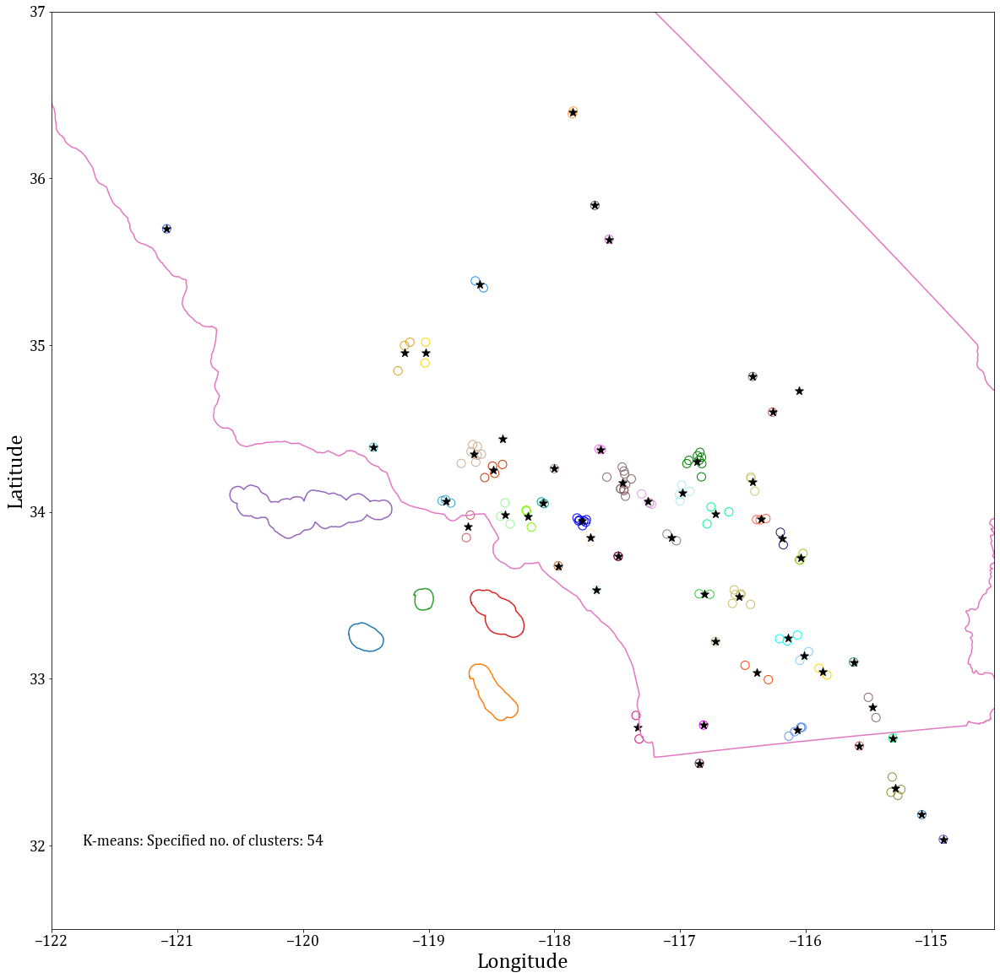

In [74]:
plt.figure(figsize=(20,20))
aaaaa = shapefile.Reader('ca')
for shape0 in aaaaa.shapeRecords():
    for i in range(len(shape0.shape.parts)):
        i_start = shape0.shape.parts[i]
        if i==len(shape0.shape.parts)-1:
            i_end = len(shape0.shape.points)
        else:
            i_end = shape0.shape.parts[i+1]
        x = [i[0] for i in shape0.shape.points[i_start:i_end]]
        y = [i[1] for i in shape0.shape.points[i_start:i_end]]
        plt.plot(x,y)

plt.scatter(coo[:,1],coo[:,0],edgecolors = abc['C_ID'].astype(str).map(colors), facecolors='none', s=100)
plt.scatter(kmeans_DTDT['longitude'], kmeans_DTDT['latitude'],s = 100, c = 'k',marker = '*')
plt.xlabel('Longitude',fontsize = '25')
plt.ylabel('Latitude',fontsize = '25')
plt.xlim(-122,-114.5)
plt.ylim(31.5,37)
plt.text(-121.75,32, 'K-means: Specified no. of clusters: 54')
plt.show()

In [78]:
kmeans_DT # 138 events with their clustering IDs

,latitude,longitude,clustering
0,32.0370,-114.9060,21
1,32.1850,-115.0760,50
2,32.3000,-115.2670,6
3,32.3188,-115.3215,6
4,32.3362,-115.2425,6
...,...,...,...
133,35.6346,-117.5657,40
134,35.6970,-121.0850,8
135,35.8373,-117.6780,5
136,36.3864,-117.8583,15


In [197]:
pd.set_option('display.max_rows', None)

## dataframe with unique SSN anad corrresponding clustering ID

In [79]:
Dataframe_finalSQ_final['Clustering'] = Dataframe_finalSQ_final['Hypo lati'].map(kmeans_DT.set_index('latitude')['clustering'])
Dataframe_finalSQ_final
## mapped by clustering ID

,EQID,SSN,Hypo lati,Hypo longi,Station lati,Station longi,Mag,rjb,Rrup,Vs30,dz1,PGA,T0.010S,T0.020S,T0.022S,T0.025S,T0.029S,T0.030S,T0.032S,T0.035S,T0.036S,T0.040S,T0.042S,T0.044S,T0.045S,T0.046S,T0.048S,T0.050S,T0.055S,T0.060S,T0.065S,T0.067S,T0.070S,T0.075S,T0.080S,T0.085S,T0.090S,T0.095S,T0.100S,T0.110S,T0.120S,T0.130S,T0.133S,T0.140S,T0.150S,T0.160S,T0.170S,T0.180S,T0.190S,T0.200S,T0.220S,T0.240S,T0.250S,T0.260S,T0.280S,T0.290S,T0.300S,T0.320S,T0.340S,T0.350S,T0.360S,T0.380S,T0.400S,T0.420S,T0.440S,T0.450S,T0.460S,T0.480S,T0.500S,T0.550S,T0.600S,T0.650S,T0.667S,T0.700S,T0.750S,T0.800S,T0.850S,T0.900S,T0.950S,T1.000S,T1.100S,T1.200S,T1.300S,T1.400S,T1.500S,T1.600S,T1.700S,T1.800S,T1.900S,T2.000S,T2.200S,T2.400S,T2.500S,T2.600S,T2.800S,T3.000S,T3.200S,T3.400S,T3.500S,T3.600S,T3.800S,T4.000S,T4.200S,T4.400S,T4.600S,T4.800S,T5.000S,T5.500S,T6.000S,T6.500S,T7.000S,T7.500S,T8.000S,T8.500S,T9.000S,T9.500S,T10.000S,Clustering
0,30.0,326.0,34.4400,-118.4100,34.0900,-118.3390,6.61,22.77,22.77,316.46,-0.185562,0.295296,0.314451,0.381648,0.445675,0.576278,0.644476,0.649338,0.640832,0.553114,0.573131,0.494282,0.540723,0.569473,0.558585,0.535460,0.544383,0.573878,0.570038,0.472308,0.454779,0.459944,0.454128,0.585210,0.683272,0.838060,0.872857,0.851493,0.779576,0.754323,0.731193,0.557127,0.454302,0.463512,0.390325,0.432646,0.297716,0.384967,0.463599,0.351503,0.311525,0.445391,0.432769,0.332395,0.264335,0.192769,0.158122,0.099873,0.064879,0.074124,0.138120,0.209369,0.060367,0.094321,0.017987,-0.078869,-0.155556,-0.055423,-0.008030,0.109908,-0.064298,-0.159638,-0.122060,-0.154554,-0.004898,0.162700,0.373483,0.238499,0.237802,0.152898,0.273833,0.443380,0.652688,0.734591,0.587255,0.376121,0.252505,0.228943,0.352560,0.481673,0.685173,0.709827,0.647182,0.726625,0.855406,0.981813,1.168446,1.269795,1.330184,1.389206,1.451551,1.464939,1.498892,1.499796,1.474580,1.429909,1.378398,1.250742,1.130982,1.052683,0.991533,0.911883,0.855511,0.818884,0.760750,0.711445,0.733997,49
31,50.0,264.0,32.6440,-115.3070,33.0370,-115.6230,6.53,14.75,15.25,193.67,0.000000,-1.027403,-1.042418,-0.987089,-0.968630,-0.941811,-0.929230,-0.948389,-0.948732,-0.944378,-0.960315,-0.974857,-0.947507,-0.936090,-0.929552,-0.927522,-0.915275,-0.896879,-0.907166,-0.864833,-0.801166,-0.836910,-0.859142,-0.800183,-0.753148,-0.692894,-0.641426,-0.655828,-0.695063,-0.789129,-0.749336,-0.858302,-0.997899,-1.135996,-1.251809,-1.340616,-1.351023,-1.321717,-1.351563,-1.232536,-1.124419,-1.227267,-1.314609,-1.372474,-1.372470,-1.375889,-1.375606,-1.301117,-1.260313,-1.282347,-1.255472,-1.203491,-1.093067,-1.049274,-1.017771,-0.947178,-0.875885,-0.786828,-0.748180,-0.804013,-0.899501,-0.826762,-0.828356,-0.872920,-1.026943,-0.973349,-1.029040,-1.078504,-1.141370,-1.154079,-1.164556,-1.190699,-1.079804,-0.896288,-0.927668,-0.846683,-0.735198,-0.675651,-0.549093,-0.493574,-0.414084,-0.219076,-0.160103,-0.131044,-0.160046,-0.176657,-0.126667,-0.089286,-0.069968,-0.054692,-0.033142,0.148850,0.363006,0.447046,0.506287,0.504455,0.508035,0.313290,-0.016487,-0.114955,-0.143262,-0.166924,0.078288,0.301517,0.473739,0.583434,0.615014,51
30,50.0,242.0,32.6440,-115.3070,32.2890,-115.1030,6.53,31.92,31.92,242.05,0.000000,0.025020,0.032923,0.091292,0.100810,0.112683,0.108667,0.119820,0.135327,0.140545,0.153502,0.175806,0.181913,0.265642,0.306255,0.335520,0.368435,0.363954,0.529587,0.417807,0.405987,0.362467,0.392252,0.465420,0.439603,0.329441,0.260297,0.207332,0.169951,0.272169,0.255990,0.145530,0.194055,0.263887,0.403690,0.437222,0.470635,0.494587,0.470022,0.465580,0.190161,0.049972,0.082146,0.059872,-0.033903,-0.034665,-0.049984,-0.195007,-0.267028,-0.297413,-0.349719,-0.352149,-0.345318,-0.368345,-0.377124,-0.424180,-0.498290,-0.607436,-0.563717,-0.577828,-0.553559,-0.632880,-0.583878,-0.587222,-0.609767,-0.762840,-0.726632,-0.712695,-0.730153,-0.767300,-0.844593,-0.810076,-0.753401,-0.762817,-0.855249,-0.903831,-0.919351,-0.712325,-0.597650,-0.607801,-0.841588,-0.733814,-0.642260,-0.644638,-0.594036,-

## Calculate real distance from shapefile and build a dataframe

In [101]:
distance_EtoC_KM = pd.DataFrame() 
a = []
b = []
c = []
d = []
e = []
f = []
g = []
dis = []
dis_in_km = []
for i in range(len(list(Dataframe_finalSQ_final['SSN']))):
    for j in range(len(list(kmeans_DTDT['clustering']))):    
        if Dataframe_finalSQ_final['Clustering'][i] == kmeans_DTDT['clustering'][j]:
            a.append(Dataframe_finalSQ_final['SSN'][i])
            b.append(Dataframe_finalSQ_final['Station lati'][i])
            c.append(Dataframe_finalSQ_final['Station longi'][i])
            d.append(kmeans_DTDT['clustering'][j])
            e.append(kmeans_DTDT['latitude'][j])
            f.append(kmeans_DTDT['longitude'][j])
            g.append(Dataframe_finalSQ_final['EQID'][i])
            dis.append(math.sqrt((kmeans_DTDT['latitude'][j]-Dataframe_finalSQ_final['Station lati'][i])**2 + (kmeans_DTDT['longitude'][j]-Dataframe_finalSQ_final['Station longi'][i])**2))
            dis_in_km.append(geopy.distance.geodesic((kmeans_DTDT['latitude'][j],kmeans_DTDT['longitude'][j]), (Dataframe_finalSQ_final['Station lati'][i],Dataframe_finalSQ_final['Station longi'][i])).km)

distance_EtoC_KM['EQID'] = g            
distance_EtoC_KM['SSN'] = a
distance_EtoC_KM['Station Latitude'] = b
distance_EtoC_KM['Station Longitude'] = c
distance_EtoC_KM['clustering ID'] = d
distance_EtoC_KM['clustering lati'] = e
distance_EtoC_KM['clustering longi'] = f
distance_EtoC_KM['distance'] = dis
distance_EtoC_KM['distance (km)'] = dis_in_km
distance_EtoC_KM 

,EQID,SSN,Station Latitude,Station Longitude,clustering ID,clustering lati,clustering longi,distance,distance (km)
0,30.0,326.0,34.0900,-118.3390,49,34.440000,-118.410000,0.357129,39.371303
1,50.0,243.0,32.6510,-115.3320,51,32.644000,-115.307000,0.025962,2.470698
2,50.0,245.0,32.6210,-115.3010,51,32.644000,-115.307000,0.023770,2.612055
3,50.0,210.0,32.6931,-115.3382,51,32.644000,-115.307000,0.058174,6.181770
4,50.0,216.0,32.9910,-115.5130,51,32.644000,-115.307000,0.403541,43.047137
...,...,...,...,...,...,...,...,...,...
2085,1264.0,3059.0,34.1000,-117.4390,9,34.176909,-117.456864,0.078956,8.688783
2086,1264.0,100174.0,33.8689,-118.3314,9,34.176909,-117.456864,0.927191,87.700220
2087,1264.0,100426.0,34.1207,-117.6381,9,34.176909,-117.456864,0.189753,17.839298
2088,1264.0,100430.0,34.1047,-117.9796,9,34.176909,-117.456864,0.527700,48.873817


## Conduct linear mixed effect model by R

In [82]:
%%R -i Dataframe_finalSQ_final -o CK
library(lme4)
library(lmerTest)
CK = list()
for(i in names(Dataframe_finalSQ_final)[13:length(Dataframe_finalSQ_final)-1]){
f = formula(paste(i,'~1+(1|EQID)'))
CK[[i]] = fixef(lmer(f,data=Dataframe_finalSQ_final))
}
CK

$PGA
(Intercept) 
 0.04912839 

$T0.010S
(Intercept) 
 0.04520871 

$T0.020S
(Intercept) 
 0.07200292 

$T0.022S
(Intercept) 
 0.07857924 

$T0.025S
(Intercept) 
 0.08631686 

$T0.029S
(Intercept) 
 0.09074222 

$T0.030S
(Intercept) 
 0.09055598 

$T0.032S
(Intercept) 
 0.09248488 

$T0.035S
(Intercept) 
 0.09841411 

$T0.036S
(Intercept) 
  0.1002705 

$T0.040S
(Intercept) 
  0.1095053 

$T0.042S
(Intercept) 
  0.1182757 

$T0.044S
(Intercept) 
  0.1283356 

$T0.045S
(Intercept) 
     0.1324 

$T0.046S
(Intercept) 
  0.1365909 

$T0.048S
(Intercept) 
  0.1489609 

$T0.050S
(Intercept) 
   0.156183 

$T0.055S
(Intercept) 
  0.1727681 

$T0.060S
(Intercept) 
   0.187454 

$T0.065S
(Intercept) 
  0.1926103 

$T0.067S
(Intercept) 
  0.1945378 

$T0.070S
(Intercept) 
  0.1930922 

$T0.075S
(Intercept) 
  0.1910739 

$T0.080S
(Intercept) 
  0.1833798 

$T0.085S
(Intercept) 
    0.18251 

$T0.090S
(Intercept) 
  0.1717256 

$T0.095S
(Intercept) 
  0.1613551 

$T0.100S
(Intercept) 
  0.139493

## Fixed term

In [83]:
CK

<rpy2.robjects.vectors.ListVector object at 0x0000020AC90F4C40> [RTYPES.VECSXP]
R classes: ('list',)
[FloatSexp..., FloatSexp..., FloatSexp..., FloatSexp..., ..., FloatSexp..., FloatSexp..., FloatSexp..., FloatSexp...]
  PGA: <class 'rpy2.robjects.vectors.FloatVector'>
  <rpy2.robjects.vectors.FloatVector object at 0x0000020AC90F2C80> [RTYPES.REALSXP]
R classes: ('numeric',)
[0.049128]
  T0.010S: <class 'rpy2.robjects.vectors.FloatVector'>
  <rpy2.robjects.vectors.FloatVector object at 0x0000020AC90F9840> [RTYPES.REALSXP]
R classes: ('numeric',)
[0.045209]
  T0.020S: <class 'rpy2.robjects.vectors.FloatVector'>
  <rpy2.robjects.vectors.FloatVector object at 0x0000020AC90F9900> [RTYPES.REALSXP]
R classes: ('numeric',)
[0.072003]
  T0.022S: <class 'rpy2.robjects.vectors.FloatVector'>
  <rpy2.robjects.vectors.FloatVector object at 0x0000020AC90F94C0> [RTYPES.REALSXP]
R classes: ('numeric',)
[0.078579]
...
  T0.029S: <class 'rpy2.robjects.vectors.FloatVector'>
  <rpy2.robjects.vectors.FloatVector object at 0x0000020AC90F92C0> [RTYPES.REALSXP]
R classes: ('numeric',)
[0.016627]
  T0.030S: <class 'rpy2.robjects.vectors.FloatVector'>
  <rpy2.robjects.vectors.FloatVector object at 0x0000020AC90F96C0> [RTYPES.REALSXP]
R classes: ('numeric',)
[0.018773]
  T0.032S: <class 'rpy2.robjects.vectors.FloatVector'>
  <rpy2.robjects.vectors.FloatVector object at 0x0000020AC90F9B40> [RTYPES.REALSXP]
R classes: ('numeric',)
[0.029836]
  T0.035S: <class 'rpy2.robjects.vectors.FloatVector'>
  <rpy2.robjects.vectors.FloatVector object at 0x0000020AC90F9600> [RTYPES.REALSXP]
R classes: ('numeric',)
[0.032344]

## Event term

In [84]:
%%R -i Dataframe_finalSQ_final -o Event_terms 
### Import data from python 
library(lme4)     
library(lmerTest) 
Event_terms  = list() ### create a list
for(i in names(Dataframe_finalSQ_final)[13:length(Dataframe_finalSQ_final)-1]){   ### using a loop and then select names from data 
f = formula(paste(i,'~1+(1|EQID)')) ### completing mixed effect model formula by concatenating strings
Event_terms [[i]] = coef(lmer(f,data=Dataframe_finalSQ_final)) ### extract ne 
}
Event_terms 


$PGA
$EQID
      (Intercept)
30    0.129511605
50   -0.205297126
51    0.294693301
64   -0.261617402
73   -0.089911531
101  -0.119530056
113  -0.131406815
114  -0.087428640
116   0.017590674
125   0.294871788
126   0.424711606
127   0.248002676
145   0.147968217
146   0.253801173
147  -0.615688513
148  -0.356599271
151  -0.155160201
158   0.318609506
161   0.392617505
163   0.601599889
164  -0.382399919
165   0.256923881
167   0.807534885
170   0.306768330
177   0.360378145
280   0.128971792
1002  0.108628105
1003  0.506144638
1004 -0.160880525
1005  0.213176312
1006 -0.826852432
1007  1.191324424
1011  0.529692260
1012  0.108566341
1014  0.737519929
1015 -0.346035017
1016 -0.461032789
1017 -1.024596244
1018  0.692834053
1019 -0.659188192
1020 -0.295708730
1025 -0.043991486
1027 -0.130430210
1028 -0.236129907
1029 -0.625754151
1034  0.122723994
1035 -0.283334165
1036  0.200521019
1038 -0.234632771
1039 -0.350163815
1040 -0.118408822
1042 -0.671099088
1052  0.321654124
1053 -0.266789063

1040 -0.120187861
1042 -0.592527669
1052  0.381278864
1053 -0.180606700
1054  0.304313918
1055 -0.161619702
1056 -0.057340235
1058 -0.503453791
1061  0.223105971
1062  0.435984759
1063  0.034118860
1064 -0.173484496
1065  0.390938228
1066 -0.375800864
1067  0.208177442
1068 -0.364202494
1072  0.635062285
1073 -0.008589875
1074  0.142526252
1075 -0.036063638
1076  0.183938305
1082  0.191066338
1085  0.339884769
1086 -0.186936087
1089 -0.205701830
1090 -0.121892663
1091  0.649094634
1094 -0.123403046
1095  0.332185488
1103  0.048781958
1106  0.255524229
1107 -0.151081314
1108  0.120083291
1110  0.273865879
1112  0.118471354
1113  0.027330925
1114  0.181103254
1115 -0.076674786
1116 -0.049536560
1117  0.235531067
1118  0.059319640
1119 -0.136780466
1120  0.369480215
1121  0.568465268
1122 -0.456276342
1127 -0.122109253
1128 -0.537739506
1129 -0.244057972
1131  0.528780172
1132 -0.049513739
1133  0.331721041
1134 -0.090528460
1135  0.107944436
1139  0.730599005
1140  0.276823424
1141  0.51

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  0.473892183
167   0.762977016
170   0.288045290
177   0.099199746
280   0.165986438
1002  0.108002764
1003  0.384002798
1004 -0.164202834
1005  0.472163482
1006 -1.087354437
1007  1.419101495
1011  0.702043785
1012 -0.321714190
1014  0.345598632
1015 -0.364790816
1016 -0.757963646
1017 -1.380387436
1018  0.663513830
1019 -0.614357401
1020 -0.095682910
1025  0.169259596
1027 -0.101156658
1028 -0.084678121
1029 -0.578400120
1034  0.182176241
1035 -0.151082281
1036  0.274918183
1038 -0.359887165
1039 -0.224516155
1040 -0.089476707
1042 -0.776382240
1052  0.480211999
1053 -0.470480142
1054  0.572094264
1055 -0.073613656
1056 -0.045568398
1058 -0.482830148
1061  0.281688734
1062  0.529187696
1063  0.011802309
1064  0.032026919
1065  0.371513648
1066 -0.288425540
1067  0.401015008
1068 -0.444922584
1072  0.656019441
1073  0.044149322
1074  0.388097889
1075 -0.091221595
1076  0.304827040
1082  0.269205395
1085  0.636178283
1086  0.098591746
1089 -0.155095580
1090 -0.023506491
1091  0.700646

1094 -0.1656689457
1095  0.4290095665
1103  0.1123674207
1106 -0.4569130249
1107 -0.1720358850
1108  0.1318693446
1110  0.1983721806
1112 -0.0260267470
1113 -0.3717637750
1114  0.2698161689
1115 -0.1142588757
1116 -0.1261474490
1117  0.0270567242
1118  0.0766755762
1119  0.0414381168
1120  0.4091079352
1121  0.7918436343
1122 -0.4564972522
1127 -0.2139703079
1128 -0.3990068520
1129 -0.2719014580
1131  0.2588377779
1132 -0.0709353711
1133  0.3679921742
1134  0.0182482853
1135  0.0418211445
1139  0.5423968768
1140  0.1743718381
1141  0.0992678173
1142  0.1145080395
1143  0.1932682357
1145  0.8385127916
1146 -0.2104219592
1147  0.4120714956
1149 -0.1984598380
1150 -0.5041301447
1151  0.2272276733
1152 -0.0415642774
1154  0.7144788169
1156  0.4456398634
1157  0.1496867227
1162 -0.0212763506
1163  0.3064974990
1164  0.1758455033
1166  0.2473189375
1167 -0.3611367384
1168  0.2561915662
1169  0.3471456750
1171 -0.0248582322
1172  0.5060631291
1174  0.0271635512
1175  0.3260823914
1176  0.3387

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 -0.397057884
1029 -0.330590194
1034 -0.160617190
1035 -0.134707039
1036  0.732800353
1038  0.061732264
1039 -0.725398260
1040  0.180372275
1042 -0.337467541
1052 -0.097891406
1053 -0.221609261
1054 -0.038800324
1055 -0.119835322
1056 -0.283100770
1058 -0.737128293
1061  0.100529726
1062 -0.126795452
1063 -0.069930223
1064 -0.175476275
1065 -0.221810195
1066 -0.072694079
1067 -0.425732419
1068 -0.169949166
1072  0.042375204
1073  0.202174742
1074 -0.340085483
1075 -0.128827949
1076  0.154993628
1082 -0.214660547
1085  0.019081134
1086 -0.697155919
1089 -0.378353587
1090 -0.108474121
1091  0.523161906
1094 -0.049703705
1095  0.071648543
1103  0.012336710
1106 -0.550090453
1107 -0.138691898
1108 -0.131176223
1110  0.014699781
1112  0.089633838
1113 -0.685343829
1114 -0.224865716
1115  0.043391707
1116  0.075383250
1117 -0.315054385
1118 -0.460900568
1119 -0.423094703
1120  0.348082437
1121  0.036979638
1122 -0.525942714
1127 -0.594532358
1128  0.045511133
1129 -0.077129406
1131 -0.098978

1115  0.014615473
1116  0.062764745
1117 -0.521088796
1118 -0.559518521
1119 -0.517974248
1120  0.324851875
1121  0.025977150
1122 -0.579990447
1127 -0.760593427
1128  0.321478759
1129 -0.176645074
1131 -0.240149996
1132 -0.196120484
1133  0.280076384
1134 -0.776802129
1135 -0.083748013
1139 -0.196647692
1140 -0.494694602
1141 -0.005502687
1142 -0.197898906
1143 -0.756491182
1145  0.165525148
1146 -0.494584525
1147  0.013995783
1149 -0.217876308
1150 -0.297640476
1151  0.186644461
1152 -0.287957210
1154  0.008309762
1156 -0.197235800
1157 -0.539017829
1162  0.195175310
1163 -0.309769240
1164 -0.210557296
1166 -0.288194302
1167 -0.627763656
1168 -0.111627459
1169 -0.003242973
1171 -0.728796604
1172  0.337316985
1174 -0.164320057
1175 -0.067165583
1176  0.380417241
1182 -0.283892258
1186 -0.744703397
1194  0.246794177
1195  0.152634565
1259 -0.106998914
1260 -0.601675332
1261  0.117304859
1264  0.560905486

attr(,"class")
[1] "coef.mer"

$T0.750S
$EQID
       (Intercept)
30   -0.03732153

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1006 -0.168613673
1007  0.181660608
1011 -0.168912414
1012  0.326833690
1014  0.841746832
1015  0.345634296
1016  0.610320615
1017  0.452977940
1018  0.153345702
1019 -0.462348751
1020 -1.092103156
1025 -1.092918719
1027 -0.230802234
1028 -1.011140439
1029  0.014345194
1034  0.515639456
1035 -0.448279207
1036  0.204033830
1038 -0.336199174
1039 -0.533161153
1040  0.368987438
1042 -0.706825565
1052 -0.782300473
1054 -0.447367839
1055  1.052103642
1056 -0.611849837
1061  0.050629849
1062 -0.906463389
1063 -0.609883596
1064 -0.825045953
1066 -0.331519373
1067 -0.768785803
1068 -0.100680603
1072 -0.391291640
1074 -0.024644816
1075 -0.537559453
1076 -0.018464805
1085 -0.528348028
1086 -1.163322296
1089 -1.206669741
1090 -0.728232407
1095 -0.016188921
1108 -0.426247329
1110  0.090983669
1113 -0.635824037
1118 -1.359042361
1119 -0.907615340
1122 -0.563388039
1128  0.728610062
1129 -0.192234425
1132 -0.737866888
1134 -0.883609480
1139 -0.039343402
1140 -0.531270459
1143 -0.945316140
1146 -0.7

1128  0.37040895
1129 -0.08798030
1132 -0.45035109
1139  0.33967100
1140 -0.49154076
1143 -0.41991605
1146 -0.34269756
1150  0.16625963
1151  0.10597753
1195 -0.09426867
1260 -0.78464329
1264  0.57774253

attr(,"class")
[1] "coef.mer"

$T6.500S
$EQID
      (Intercept)
30    0.505904457
50    0.186928185
64    0.111701181
73   -0.436369309
101  -0.131401611
113  -0.695455281
114   0.152612547
116   0.105356834
125   0.414820378
126  -0.333127401
127  -0.629933562
146   0.031098487
158   0.811824969
161   0.750548564
163   0.401594690
164   0.324389841
165   1.204055920
167  -0.019453950
170   0.827021781
177   0.965369307
280   0.904168033
1002  0.054241463
1003 -0.007231478
1006 -0.227456058
1007 -0.021264460
1011 -0.216611181
1012 -0.081271468
1014  0.695060189
1015  0.133038761
1016  0.841198962
1017  0.121157600
1018 -0.098551291
1019 -0.393848511
1020 -0.899688639
1025 -0.829376263
1027 -0.194397156
1028 -1.209093447
1034  0.299522938
1035 -0.566246798
1036  0.364069166
1038 -0.519

In [85]:
Event_terms 

<rpy2.robjects.vectors.ListVector object at 0x0000020ADD9141C0> [RTYPES.VECSXP]
R classes: ('list',)
[ListSexpV..., ListSexpV..., ListSexpV..., ListSexpV..., ..., ListSexpV..., ListSexpV..., ListSexpV..., ListSexpV...]
<rpy2.robjects.vectors.ListVector object at 0x0000020ADD9141C0> [RTYPES.VECSXP]
R classes: ('list',)
[ListSexpV..., ListSexpV..., ListSexpV..., ListSexpV..., ..., ListSexpV..., ListSexpV..., ListSexpV..., ListSexpV...]
<rpy2.robjects.vectors.ListVector object at 0x0000020ADD9141C0> [RTYPES.VECSXP]
R classes: ('list',)
[ListSexpV..., ListSexpV..., ListSexpV..., ListSexpV..., ..., ListSexpV..., ListSexpV..., ListSexpV..., ListSexpV...]
<rpy2.robjects.vectors.ListVector object at 0x0000020ADD9141C0> [RTYPES.VECSXP]
R classes: ('list',)
[ListSexpV..., ListSexpV..., ListSexpV..., ListSexpV..., ..., ListSexpV..., ListSexpV..., ListSexpV..., ListSexpV...]
<rpy2.robjects.vectors.ListVector object at 0x0000020ADD9141C0> [RTYPES.VECSXP]
R classes: ('list',)
[ListSexpV..., ListSexpV..., ListSexpV..., ListSexpV..., ..., ListSexpV..., ListSexpV..., ListSexpV..., ListSexpV...]
...
<rpy2.robjects.vectors.ListVector object at 0x0000020ADD9141C0> [RTYPES.VECSXP]
R classes: ('list',)
[ListSexpV..., ListSexpV..., ListSexpV..., ListSexpV..., ..., ListSexpV..., ListSexpV..., ListSexpV..., ListSexpV...]
<rpy2.robjects.vectors.ListVector object at 0x0000020ADD9141C0> [RTYPES.VECSXP]
R classes: ('list',)
[ListSexpV..., ListSexpV..., ListSexpV..., ListSexpV..., ..., ListSexpV..., ListSexpV..., ListSexpV..., ListSexpV...]
<rpy2.robjects.vectors.ListVector object at 0x0000020ADD9141C0> [RTYPES.VECSXP]
R classes: ('list',)
[ListSexpV..., ListSexpV..., ListSexpV..., ListSexpV..., ..., ListSexpV..., ListSexpV..., ListSexpV..., ListSexpV...]
<rpy2.robjects.vectors.ListVector object at 0x0000020ADD9141C0> [RTYPES.VECSXP]
R classes: ('list',)
[ListSexpV..., ListSexpV..., ListSexpV..., ListSexpV..., ..., ListSexpV..., ListSexpV..., ListSexpV..., ListSexpV...]

## Within event residual

In [86]:
deltaW = Dataframe_finalSQ_final.copy()
deltaW ## copy from total residual dataframe, sorted by EQID in ascending trend

,EQID,SSN,Hypo lati,Hypo longi,Station lati,Station longi,Mag,rjb,Rrup,Vs30,dz1,PGA,T0.010S,T0.020S,T0.022S,T0.025S,T0.029S,T0.030S,T0.032S,T0.035S,T0.036S,T0.040S,T0.042S,T0.044S,T0.045S,T0.046S,T0.048S,T0.050S,T0.055S,T0.060S,T0.065S,T0.067S,T0.070S,T0.075S,T0.080S,T0.085S,T0.090S,T0.095S,T0.100S,T0.110S,T0.120S,T0.130S,T0.133S,T0.140S,T0.150S,T0.160S,T0.170S,T0.180S,T0.190S,T0.200S,T0.220S,T0.240S,T0.250S,T0.260S,T0.280S,T0.290S,T0.300S,T0.320S,T0.340S,T0.350S,T0.360S,T0.380S,T0.400S,T0.420S,T0.440S,T0.450S,T0.460S,T0.480S,T0.500S,T0.550S,T0.600S,T0.650S,T0.667S,T0.700S,T0.750S,T0.800S,T0.850S,T0.900S,T0.950S,T1.000S,T1.100S,T1.200S,T1.300S,T1.400S,T1.500S,T1.600S,T1.700S,T1.800S,T1.900S,T2.000S,T2.200S,T2.400S,T2.500S,T2.600S,T2.800S,T3.000S,T3.200S,T3.400S,T3.500S,T3.600S,T3.800S,T4.000S,T4.200S,T4.400S,T4.600S,T4.800S,T5.000S,T5.500S,T6.000S,T6.500S,T7.000S,T7.500S,T8.000S,T8.500S,T9.000S,T9.500S,T10.000S,Clustering
0,30.0,326.0,34.4400,-118.4100,34.0900,-118.3390,6.61,22.77,22.77,316.46,-0.185562,0.295296,0.314451,0.381648,0.445675,0.576278,0.644476,0.649338,0.640832,0.553114,0.573131,0.494282,0.540723,0.569473,0.558585,0.535460,0.544383,0.573878,0.570038,0.472308,0.454779,0.459944,0.454128,0.585210,0.683272,0.838060,0.872857,0.851493,0.779576,0.754323,0.731193,0.557127,0.454302,0.463512,0.390325,0.432646,0.297716,0.384967,0.463599,0.351503,0.311525,0.445391,0.432769,0.332395,0.264335,0.192769,0.158122,0.099873,0.064879,0.074124,0.138120,0.209369,0.060367,0.094321,0.017987,-0.078869,-0.155556,-0.055423,-0.008030,0.109908,-0.064298,-0.159638,-0.122060,-0.154554,-0.004898,0.162700,0.373483,0.238499,0.237802,0.152898,0.273833,0.443380,0.652688,0.734591,0.587255,0.376121,0.252505,0.228943,0.352560,0.481673,0.685173,0.709827,0.647182,0.726625,0.855406,0.981813,1.168446,1.269795,1.330184,1.389206,1.451551,1.464939,1.498892,1.499796,1.474580,1.429909,1.378398,1.250742,1.130982,1.052683,0.991533,0.911883,0.855511,0.818884,0.760750,0.711445,0.733997,49
31,50.0,264.0,32.6440,-115.3070,33.0370,-115.6230,6.53,14.75,15.25,193.67,0.000000,-1.027403,-1.042418,-0.987089,-0.968630,-0.941811,-0.929230,-0.948389,-0.948732,-0.944378,-0.960315,-0.974857,-0.947507,-0.936090,-0.929552,-0.927522,-0.915275,-0.896879,-0.907166,-0.864833,-0.801166,-0.836910,-0.859142,-0.800183,-0.753148,-0.692894,-0.641426,-0.655828,-0.695063,-0.789129,-0.749336,-0.858302,-0.997899,-1.135996,-1.251809,-1.340616,-1.351023,-1.321717,-1.351563,-1.232536,-1.124419,-1.227267,-1.314609,-1.372474,-1.372470,-1.375889,-1.375606,-1.301117,-1.260313,-1.282347,-1.255472,-1.203491,-1.093067,-1.049274,-1.017771,-0.947178,-0.875885,-0.786828,-0.748180,-0.804013,-0.899501,-0.826762,-0.828356,-0.872920,-1.026943,-0.973349,-1.029040,-1.078504,-1.141370,-1.154079,-1.164556,-1.190699,-1.079804,-0.896288,-0.927668,-0.846683,-0.735198,-0.675651,-0.549093,-0.493574,-0.414084,-0.219076,-0.160103,-0.131044,-0.160046,-0.176657,-0.126667,-0.089286,-0.069968,-0.054692,-0.033142,0.148850,0.363006,0.447046,0.506287,0.504455,0.508035,0.313290,-0.016487,-0.114955,-0.143262,-0.166924,0.078288,0.301517,0.473739,0.583434,0.615014,51
30,50.0,242.0,32.6440,-115.3070,32.2890,-115.1030,6.53,31.92,31.92,242.05,0.000000,0.025020,0.032923,0.091292,0.100810,0.112683,0.108667,0.119820,0.135327,0.140545,0.153502,0.175806,0.181913,0.265642,0.306255,0.335520,0.368435,0.363954,0.529587,0.417807,0.405987,0.362467,0.392252,0.465420,0.439603,0.329441,0.260297,0.207332,0.169951,0.272169,0.255990,0.145530,0.194055,0.263887,0.403690,0.437222,0.470635,0.494587,0.470022,0.465580,0.190161,0.049972,0.082146,0.059872,-0.033903,-0.034665,-0.049984,-0.195007,-0.267028,-0.297413,-0.349719,-0.352149,-0.345318,-0.368345,-0.377124,-0.424180,-0.498290,-0.607436,-0.563717,-0.577828,-0.553559,-0.632880,-0.583878,-0.587222,-0.609767,-0.762840,-0.726632,-0.712695,-0.730153,-0.767300,-0.844593,-0.810076,-0.753401,-0.762817,-0.855249,-0.903831,-0.919351,-0.712325,-0.597650,-0.607801,-0.841588,-0.733814,-0.642260,-0.644638,-0.594036,-

In [87]:
## I am going to select non-nan rows by checking the mean value of event term. If mean value of an event is nan, then EQID doesn't exist in R output
DF_mean = Dataframe_finalSQ_final.groupby(['EQID'], as_index=False).mean() 


for k in range(len(T)-1): ## from 0 - 105 because we have 106 columns from PGA to T = 10s and python starts from 0, so it's 0-105
    selected_rows = DF_mean[~DF_mean.iloc[:,11+k].isnull()] 
## this is an initiation, we start from 'PGA' column
## this will give you a dataframe including all rows without NANs for 'PGA' column, the index for 'PGA' column is 11
    EQID_EQID = list(selected_rows['EQID'])
## select all EQID in the 'selected_rows' dataframe
    for i in range(len(Dataframe_finalSQ_final['PGA'])):
        for j in range(len(EQID_EQID)):
            if Dataframe_finalSQ_final['EQID'][i] == EQID_EQID[j]:
                deltaW.iloc[i,11+k] = (Dataframe_finalSQ_final.iloc[i,11+k] - CK[k][0] - Event_terms[k][0][0][j]) 

## k indicates period, k = 0 means 'PGA'. 11+k starts from column 11(PGA) to column 116(T = 10s)
## i indicates ith row in kth column
## j indicates jth Event in non-nan event terms
## CK only requires k, since it only relates to period, no relation with earthquake ID
## event term requires both k and j, since you have to first select which period, then select which earthquake
## the logic is for each period (column or k), then for each row (i) of that period, find the corresponding event term(k+j) and ck (k) for that row, 
## finally subtract them from that row

deltaW

,EQID,SSN,Hypo lati,Hypo longi,Station lati,Station longi,Mag,rjb,Rrup,Vs30,dz1,PGA,T0.010S,T0.020S,T0.022S,T0.025S,T0.029S,T0.030S,T0.032S,T0.035S,T0.036S,T0.040S,T0.042S,T0.044S,T0.045S,T0.046S,T0.048S,T0.050S,T0.055S,T0.060S,T0.065S,T0.067S,T0.070S,T0.075S,T0.080S,T0.085S,T0.090S,T0.095S,T0.100S,T0.110S,T0.120S,T0.130S,T0.133S,T0.140S,T0.150S,T0.160S,T0.170S,T0.180S,T0.190S,T0.200S,T0.220S,T0.240S,T0.250S,T0.260S,T0.280S,T0.290S,T0.300S,T0.320S,T0.340S,T0.350S,T0.360S,T0.380S,T0.400S,T0.420S,T0.440S,T0.450S,T0.460S,T0.480S,T0.500S,T0.550S,T0.600S,T0.650S,T0.667S,T0.700S,T0.750S,T0.800S,T0.850S,T0.900S,T0.950S,T1.000S,T1.100S,T1.200S,T1.300S,T1.400S,T1.500S,T1.600S,T1.700S,T1.800S,T1.900S,T2.000S,T2.200S,T2.400S,T2.500S,T2.600S,T2.800S,T3.000S,T3.200S,T3.400S,T3.500S,T3.600S,T3.800S,T4.000S,T4.200S,T4.400S,T4.600S,T4.800S,T5.000S,T5.500S,T6.000S,T6.500S,T7.000S,T7.500S,T8.000S,T8.500S,T9.000S,T9.500S,T10.000S,Clustering
0,30.0,326.0,34.4400,-118.4100,34.0900,-118.3390,6.61,22.77,22.77,316.46,-0.185562,0.116656,0.135939,0.137529,0.170992,0.247787,0.285743,0.289450,0.280548,0.210972,0.220171,0.148421,0.164373,0.166586,0.152231,0.129353,0.113770,0.120042,0.088011,-0.002147,-0.023430,-0.023473,-0.025445,0.058943,0.134774,0.230059,0.265558,0.269241,0.262048,0.308836,0.294928,0.197506,0.138428,0.150654,0.133139,0.173641,0.089524,0.163401,0.206930,0.150137,0.160055,0.240589,0.248733,0.195455,0.164664,0.141874,0.102810,0.076015,0.051375,0.076585,0.108877,0.178751,0.063754,0.092460,0.050716,-0.008480,-0.052071,0.028322,0.066865,0.153265,0.043578,-0.021039,0.007959,0.002964,0.096124,0.201889,0.314188,0.255549,0.266013,0.234929,0.303570,0.362558,0.428919,0.459401,0.388062,0.294616,0.207084,0.192696,0.247530,0.320354,0.396162,0.431501,0.413913,0.436222,0.496114,0.545457,0.659366,0.710159,0.723320,0.765242,0.764320,0.763452,0.802865,0.837259,0.819064,0.811682,0.805397,0.795564,0.739825,0.648445,0.591974,0.501740,0.476091,0.344364,0.301299,0.264216,0.272149,49
31,50.0,264.0,32.6440,-115.3070,33.0370,-115.6230,6.53,14.75,15.25,193.67,0.000000,-0.871234,-0.872418,-0.916276,-0.920323,-0.920914,-0.942467,-0.965365,-0.972811,-0.974170,-0.990191,-1.012791,-1.001018,-1.011909,-1.014751,-1.021955,-1.034463,-1.025973,-1.065554,-1.043155,-0.997185,-1.033781,-1.050153,-0.997557,-0.935192,-0.878507,-0.812881,-0.830392,-0.843409,-0.863864,-0.816094,-0.885130,-1.008586,-1.102730,-1.172340,-1.244929,-1.258836,-1.205444,-1.223085,-1.079700,-0.930724,-1.045575,-1.135031,-1.192355,-1.170828,-1.153713,-1.154228,-1.046904,-0.992604,-0.994287,-0.965438,-0.891739,-0.807364,-0.762330,-0.732546,-0.659887,-0.588275,-0.480669,-0.449226,-0.479595,-0.562496,-0.477648,-0.465882,-0.502058,-0.654222,-0.566443,-0.605546,-0.605727,-0.636036,-0.628900,-0.669646,-0.736008,-0.664916,-0.507868,-0.562324,-0.499537,-0.418155,-0.387932,-0.266141,-0.196432,-0.145601,0.023857,0.046828,0.047282,0.004428,-0.043102,0.005200,0.036665,0.038897,0.065891,0.055220,0.221818,0.408479,0.482038,0.498047,0.487363,0.498897,0.314657,-0.020692,-0.200217,-0.317509,-0.389639,-0.159385,-0.093438,-0.032737,0.064391,0.098771,51
30,50.0,242.0,32.6440,-115.3070,32.2890,-115.1030,6.53,31.92,31.92,242.05,0.000000,0.181189,0.202923,0.162105,0.149117,0.133580,0.095430,0.102843,0.111247,0.110753,0.123627,0.137872,0.128402,0.189823,0.221055,0.241086,0.249246,0.234859,0.371198,0.239485,0.209968,0.165596,0.201242,0.268047,0.257559,0.143828,0.088842,0.032768,0.021606,0.197433,0.189232,0.118702,0.183368,0.297152,0.483159,0.532908,0.562821,0.610861,0.598500,0.618417,0.383857,0.231665,0.261724,0.239991,0.167739,0.187511,0.171394,0.059206,0.000681,-0.009353,-0.059685,-0.040397,-0.059615,-0.081401,-0.091899,-0.136888,-0.210680,-0.301277,-0.264763,-0.253409,-0.216554,-0.283766,-0.221404,-0.216361,-0.237046,-0.355934,-0.303138,-0.239918,-0.224819,-0.242121,-0.349683,-0.355385,-0.338513,-0.374397,-0.489906,-0.556686,-0.602308,-0.424605,-0.314698,-0.310658,-0.573105,-0.490880,-0.435329,-0.466311,-0.429562,-0.397735,-0.2

## Site term

In [88]:
%%R -i deltaW -o Site_terms 
### Import data from python 
library(lme4)     
library(lmerTest) 
Site_terms = list() ### create a list
for(i in names(deltaW)[13:length(deltaW)-1]){   ### using a loop and then select names from data 
f = formula(paste(i,'~1+(1|SSN)')) ### completing mixed effect model formula by concatenating strings
Site_terms [[i]] = coef(lmer(f,data=deltaW)) ### extract site term
}
Site_terms 


$PGA
$SSN
         (Intercept)
86     -1.333175e-01
94      1.918943e-02
103    -5.936704e-02
107    -1.526177e-02
108     1.448878e-01
115    -9.387858e-02
118     4.950209e-02
119    -9.617722e-03
120     1.286663e-02
151    -7.505223e-02
152    -4.518864e-02
160    -7.111914e-02
200     5.917293e-02
207    -1.103984e-01
208    -3.722746e-01
209    -1.282480e-02
210     4.759348e-02
211    -1.966328e-01
212    -7.363996e-02
213    -5.022681e-03
214     3.692869e-01
215    -8.269967e-02
216    -2.189013e-01
217    -3.651373e-01
218    -9.223872e-01
219     1.513887e-01
220     8.363546e-03
222    -7.853896e-02
228     4.715208e-02
230     5.102384e-02
233    -4.095877e-01
240     2.841257e-01
241     3.778279e-01
242     3.201304e-02
243    -1.278393e-01
245    -1.754773e-01
246    -3.014070e-03
247    -2.070925e-01
248    -1.072269e-01
249    -5.808533e-01
261    -5.002743e-02
262    -2.473648e-01
263    -1.435688e-01
264    -2.558039e-01
265    -3.260192e-01
267    -1.695442e-01
276

100457 -1.580821e-02
100462 -1.427333e-01
100463  2.242798e-01
100468 -2.467463e-01
100471  1.757499e-01
100483 -6.526682e-01
100495  1.062583e-01
100507  1.692138e-02
100527  6.675343e-02
100528  3.149464e-01
100534  8.741506e-02
100535  2.391917e-02
100557 -3.886729e-01
100558 -4.233330e-01

attr(,"class")
[1] "coef.mer"

$T0.020S
$SSN
         (Intercept)
86     -0.1532216914
94     -0.0106255401
103    -0.0638078431
107    -0.0392412100
108     0.1126629602
115    -0.1207454668
118     0.0269113524
119    -0.0165309427
120    -0.0013884439
151    -0.1025866170
152    -0.0633401350
160    -0.0962914149
200     0.0360838856
207    -0.1442039509
208    -0.4053514364
209    -0.0393816814
210     0.0258665840
211    -0.2211962428
212    -0.0995549440
213    -0.0229476231
214     0.3473209218
215    -0.1116096461
216    -0.2382747417
217    -0.3839381806
218    -0.9390958562
219     0.1219875114
220    -0.0168076193
222    -0.1087396659
228     0.0232588848
230     0.1346708921
233    -0

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  0.1483835632
532    -0.0860115272
537    -0.4806265557
538    -0.5239060945
540    -0.2709450562
541    -0.0183168850
542    -0.1656217270
543    -0.2687772661
548    -0.1998581504
549    -0.1316518487
559    -0.4279980017
560    -0.2488648900
563    -0.4408048324
564    -0.2133515176
565    -0.4027739610
568     0.0086384447
570     0.2466633055
571     0.1132011806
572     0.0348800591
573     0.0930309598
574    -0.3342538866
575     0.0443378732
576    -0.0241251737
577     0.3007837070
578    -0.0725265475
579     0.0176208626
580    -0.1801178598
581    -0.4140269511
582    -0.0741539823
584     0.1258877653
585    -0.1968921827
586    -0.2334254299
587     0.1686566045
588     0.1288919252
590    -0.2885573175
1149   -0.0320515605
1151   -0.2937934112
1152   -0.2002094173
1220   -0.0787935804
1221   -0.1437884699
1229    0.0694968956
1230   -0.2029213680
1233    0.1055730777
1234   -0.1122171201
1235   -0.4443344077
1236   -0.3412564852
1240    0.2694272939
1241   -0.085691322

497    -0.2511399418
510    -0.4514214864
511    -0.1783449330
512    -0.1879226505
514     0.0414297726
515    -0.1750503583
516    -0.3984573086
518    -0.2529692066
519     0.1696336423
520     0.0938976025
521     0.0250072421
527    -0.3566315309
528    -0.2973068265
529    -0.0994468137
530     0.0688861406
531     0.1478136594
532    -0.1227976624
537    -0.4813146790
538    -0.5301744870
540    -0.2854130911
541    -0.0453390246
542    -0.1883983068
543    -0.2910990793
548    -0.2190927174
549    -0.1524957499
559    -0.4507495218
560    -0.2481267611
563    -0.4683178056
564    -0.2364535681
565    -0.4283363164
568    -0.0049385000
570     0.2186316308
571     0.0862072517
572     0.0256786509
573     0.0675639257
574    -0.3538827850
575     0.0212555786
576    -0.0419668952
577     0.2710933696
578    -0.1000524526
579    -0.0092150589
580    -0.2071465171
581    -0.4371552190
582    -0.0895181300
584     0.1149962135
585    -0.2253311183
586    -0.2231061058
587     0.140

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1409    0.125493858
1413   -0.233047657
1414   -0.262667996
1419   -0.119470966
1420   -0.255799405
1423   -0.519025592
1425   -0.737321725
1426    0.136225720
1427   -0.200490257
1435   -0.122292010
1436    0.118737145
1438   -0.062568241
1468   -0.217229383
1608   -0.482796787
1651   -0.166704454
1652   -0.411240786
1653   -0.250466580
1655    0.113183044
1656   -0.306834756
1657   -0.220668910
1660   -0.396598808
1662   -0.492664065
1663   -0.127541255
1664    0.200750590
1667    0.090739858
2974   -0.485733908
2975   -0.149509278
2976   -0.199139561
2993   -0.159060100
2994   -0.429036340
2995    0.002925637
2999   -0.458926112
3000   -0.505651723
3007   -0.272977934
3013   -0.374074255
3014   -0.178302138
3015   -0.066813480
3017   -0.259636076
3018    0.073564001
3019   -0.382883604
3020   -0.440908257
3021   -0.354853615
3022   -0.388044627
3024   -0.107071021
3026   -0.446317884
3027   -0.191559970
3033   -0.546442475
3034   -0.222544885
3035   -0.115739747
3037   -0.152062661

1651   -0.1323140294
1652   -0.4262497593
1653   -0.2448323647
1655    0.0764331791
1656   -0.3287217914
1657   -0.2317328728
1660   -0.3910161641
1662   -0.4836915073
1663   -0.1195409831
1664    0.1604739642
1667    0.0777058984
2974   -0.4837028667
2975   -0.1479987671
2976   -0.1698877853
2993   -0.1440926524
2994   -0.4491775959
2995    0.0067922261
2999   -0.4718295315
3000   -0.5670940603
3007   -0.2914021316
3013   -0.3778819463
3014   -0.1893155838
3015   -0.0856140955
3017   -0.2994427321
3018    0.0994611052
3019   -0.3865693483
3020   -0.4302861620
3021   -0.3523082231
3022   -0.3949818093
3024   -0.1221362330
3026   -0.4971079146
3027   -0.2112292868
3033   -0.5076787097
3034   -0.2280404899
3035   -0.1206775409
3037   -0.1572063546
3038   -0.0883015115
3041   -0.0718823013
3043    0.2999202795
3045   -0.3803568537
3049   -0.4489647752
3050    0.1578039698
3051    0.1840274120
3056    0.0186043918
3059   -0.0843621459
3060   -0.2108993264
3062   -0.8739320072
3065   -0.244

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




3015   -0.0544344909
3017   -0.2411031929
3018    0.1949819118
3019   -0.2590232767
3020   -0.3072692455
3021   -0.1731810369
3022   -0.1812727442
3024    0.0399082726
3026   -0.3365184320
3027   -0.1214236809
3033   -0.3281576326
3034   -0.2259213709
3035   -0.1127271004
3037   -0.0735154622
3038   -0.0238309966
3041    0.1239749395
3043    0.1343127574
3045   -0.1955502107
3049   -0.2754238415
3050    0.2921175781
3051    0.1385648739
3056    0.3188655475
3059   -0.3150786802
3060    0.0958701517
3062   -0.7433390846
3065   -0.2604497607
3066    0.0982508773
3067    0.0656980367
3068   -0.1600676607
3073   -0.0439489291
3075   -0.2229073828
3082   -0.7916071454
3087   -0.5155273043
3094    0.0550706800
3104    0.0648464263
3105   -0.0660631400
3106   -0.1364926891
3107    0.2591930383
3108    0.1220229293
3109    0.2302373491
3110    0.1676377948
3111    0.3690996478
3112    0.2724064651
3113    0.3085969300
3114    0.2925863975
3115   -0.0976117294
3116    0.3990605707
3118    0.32

1660   -0.2799978407
1662   -0.5555204333
1663   -0.0366991150
1664    0.3112614003
1667    0.0606224872
2974   -0.3155369886
2975   -0.1160803755
2976   -0.1535297601
2993    0.0011505494
2994   -0.3953540059
2995    0.1325425357
2999   -0.4308857434
3000   -0.3471025630
3007   -0.2972656165
3013   -0.2701116820
3014   -0.0540641871
3015   -0.0387084325
3017   -0.2285544731
3018    0.1700601745
3019   -0.2685514627
3020   -0.2637315769
3021   -0.2717668421
3022   -0.2087728657
3024    0.0482477809
3026   -0.2998438684
3027   -0.0956672644
3033   -0.3113001349
3034   -0.2396829302
3035   -0.1036185941
3037   -0.0575224466
3038    0.0018971276
3041    0.0997443982
3043    0.0995271499
3045   -0.1667505587
3049   -0.2772125350
3050    0.3581139718
3051    0.0840485727
3056    0.3805750199
3059   -0.3218597077
3060    0.0632859543
3062   -0.7725838617
3065   -0.2138768315
3066    0.0815327637
3067    0.0388354011
3068   -0.1698346562
3073   -0.0167570555
3075   -0.1834321541
3082   -0.821

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 -0.0409988858
3124    0.5702458725
3125    0.2411884885
3127    0.4412244747
3128    0.2789581536
100084 -0.0221233182
100087 -0.2021375508
100093 -0.0777124000
100095 -0.2616750467
100100 -0.1109755365
100102  0.0503273086
100108 -0.0687755941
100110  0.2342660052
100113 -0.3221590824
100128 -0.1407253803
100135  0.1860302522
100137  0.3353580785
100138 -0.1009801036
100139 -0.0183059712
100140 -0.0711866089
100142  0.1657076141
100143 -0.1193541239
100144 -0.1277992104
100145  0.0258253628
100147  0.2418761752
100148 -0.0326850678
100150 -0.3647163532
100152 -0.1016685926
100155 -0.1474219878
100157  0.0130640407
100167  0.1934406063
100174  0.0033645783
100175  0.3906237744
100178 -0.3902825587
100214 -0.5865136557
100218  0.2408131980
100220  0.2830104712
100221  0.2718496687
100222  0.2446609133
100223  0.3691600793
100224  0.2113827957
100225  0.3264338577
100226  0.0773865238
100227 -0.4445082059
100229  0.4259360353
100230  0.1148926475
100231 -0.0293828918
100232 -0.305653711

3122    0.229209150
3123   -0.024928989
3124    0.582075718
3125    0.234619668
3127    0.420087319
3128    0.310722434
100084  0.002353249
100087 -0.236888901
100093 -0.113606859
100095 -0.204174164
100100 -0.101472176
100102  0.055492919
100108 -0.056202282
100110  0.279470322
100113 -0.269902701
100128 -0.127504384
100135  0.192827763
100137  0.246299682
100138 -0.125296808
100139  0.024294075
100140 -0.047046268
100142  0.150441670
100143 -0.096961584
100144 -0.079042404
100145  0.070192793
100147  0.276859665
100148 -0.038716005
100150 -0.337254749
100152 -0.125102248
100155 -0.144357933
100157  0.003454613
100167  0.188897627
100174 -0.009741539
100175  0.353004587
100178 -0.356627105
100214 -0.591209748
100218  0.279250490
100220  0.243679188
100221  0.332481763
100222  0.250353685
100223  0.404423068
100224  0.191245721
100225  0.351114010
100226  0.084283628
100227 -0.429002170
100229  0.482327769
100230  0.131182033
100231 -0.051504084
100232 -0.336686559
100233 -0.418541098


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  0.2945836242
100231 -0.0192638458
100232 -0.2425007820
100233 -0.3673110306
100235 -0.3332843047
100236 -0.3574989299
100237  0.2102080720
100238  0.1942721035
100239  0.2299584064
100240  0.3279371007
100241  0.1604454314
100242  0.1875488071
100243  0.3056101560
100244  0.2118035707
100245  0.2053560254
100246  0.2380358957
100247  0.4795300046
100248 -0.4962120298
100249 -0.3515371948
100250 -0.2158592353
100251 -0.1474897516
100252 -0.1591566873
100254 -0.1098604225
100255  0.0588593567
100256 -0.3922864723
100257 -0.1368953376
100258 -0.1721332826
100259 -0.1492413053
100262  0.4252003412
100274 -0.1864481824
100279 -0.1119778695
100292  0.2307414525
100299  0.3554007512
100301 -0.0797931677
100302  0.1186634754
100304 -0.1455503919
100305  0.4129809090
100306 -0.0777271879
100307 -1.4518439630
100309  0.1890485583
100324  0.0677339066
100334  0.1111947753
100335  0.0946906553
100341  0.3740810442
100342  0.1395746337
100352  0.1826269278
100354  0.0104936301
100366  0.474072708

100251 -0.116170071
100252 -0.215290015
100254 -0.155108102
100255 -0.001456553
100256 -0.409714499
100257 -0.195394355
100258 -0.194975750
100259 -0.146906045
100262  0.611049015
100274 -0.203046451
100279 -0.131805312
100292  0.243709278
100299  0.354387570
100301 -0.099103055
100302  0.090028295
100304 -0.205160713
100305  0.369475719
100306 -0.062617025
100307 -1.456122083
100309  0.156277751
100324  0.021724866
100334  0.065521088
100335  0.074898467
100341  0.325497930
100342  0.161348753
100352  0.169091628
100354  0.029621103
100366  0.512919620
100386  0.060346232
100390 -0.132488182
100396  0.327944836
100398  0.012045423
100400  0.012308022
100402  0.142452152
100405  0.382224021
100417 -0.171724222
100418  0.421280271
100420  0.428388992
100426 -0.116639477
100430 -0.262065933
100435 -0.267802174
100457 -0.062552503
100462 -0.008077357
100463  0.020651966
100468 -0.028172703
100471  0.178606471
100483 -0.397030817
100495  0.105738576
100507  0.084711858
100527  0.016131878


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  0.313686005
1325    0.178421440
1326    0.092401506
1361    0.319409310
1375    0.450476570
1379    0.513409552
1380    0.356408480
1395   -0.124592752
1396    0.014256683
1399    0.005723330
1402   -0.202832002
1406    0.211284107
1407   -0.200717170
1408   -0.004202067
1409    0.014253060
1413   -0.008112827
1414    0.071379208
1419    0.212640819
1420   -0.024924343
1423   -0.237282632
1425   -0.229084328
1426    0.445566027
1427    0.045324789
1435    0.169539231
1436    0.274596022
1438    0.024043374
1468    0.354331088
1608    0.067524468
1651    0.087620751
1652   -0.023140238
1653   -0.303721515
1655    0.193749036
1656    0.084907858
1657    0.071856045
1660   -0.150628919
1662   -0.212828610
1663    0.171941803
1664    0.483048069
1667    0.234218112
2974    0.049906298
2975    0.074156902
2976   -0.118614868
2993    0.229604848
2994   -0.163133816
2995    0.012916463
2999   -0.007676881
3000   -0.167585535
3007    0.055988372
3013   -0.150417783
3014   -0.172226108
3015  

3124    0.6318122745
3125    0.2586629353
3127    0.4355260358
3128    0.2266777533
100084  0.1201430301
100087 -0.1904597588
100093  0.0957534933
100095  0.1304543977
100100 -0.0894729166
100102  0.1688055582
100108  0.2703207951
100110  0.2951058595
100113  0.2766927141
100128  0.1029485388
100135  0.1043204126
100137  0.1880792813
100138  0.1797706187
100139  0.2406327547
100140  0.2258161168
100142  0.0088555448
100143  0.2103336921
100144 -0.0687736689
100145  0.2844346416
100147  0.4014380399
100148  0.0341762006
100150  0.1086932265
100152  0.1646394937
100155 -0.0501921208
100157  0.1879877587
100167  0.1137674338
100174  0.2769999822
100175  0.4097506277
100178 -0.2330799643
100214 -0.5310694169
100218  0.1630879874
100220  0.2435808399
100221  0.2870700599
100222  0.3089389801
100223  0.2607137433
100224  0.2908115573
100225  0.3970516476
100226 -0.0545480843
100227 -0.1846614315
100229  0.4620375278
100230  0.1707449426
100231  0.1890757881
100232  0.0404711764
100233 -0.119

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




120     0.0632860031
151     0.0890933361
152    -0.1049921201
160     0.0431281607
200     0.0751635991
207     0.3328776850
208    -0.2820000426
209     0.0059511582
210    -0.1378353085
211    -0.1110452475
212     0.0751688138
213     0.0785712638
214     0.2437145322
215     0.1339583307
216    -0.3384716634
217    -0.0683534434
218    -0.8007086177
219     0.3328644545
220     0.1961040634
222     0.3679191308
230     0.1996882120
233    -0.0604185359
240     0.3249312715
241     0.4073649902
242    -0.0364899171
243     0.0246386562
245     0.0913164679
246     0.1715213628
247    -0.0830775349
248    -0.1963098321
249    -0.3713834315
261    -0.2328169097
262    -0.1773744206
263    -0.3758079544
264    -0.3288946766
265     0.2351897316
267     0.0918798905
276     0.2592180300
278    -0.1264290831
282     0.1545793301
285    -0.0798549569
286     0.1477379032
287     0.1049527201
288    -0.0016010451
289     0.2598489851
290    -0.0548445352
293     0.3423595658
294     0.23

213     3.882553e-02
214     2.296170e-01
215     1.434444e-01
216    -2.789468e-01
217     5.446246e-02
218    -7.162978e-01
219     2.858528e-01
220     2.475860e-01
222     2.543526e-01
230     2.759904e-01
233    -1.193780e-02
240     2.220226e-01
241     4.026729e-01
242    -8.839805e-02
243    -1.266758e-02
245     3.263356e-02
246     1.827855e-01
247    -3.862645e-02
248    -1.805793e-01
249    -2.892463e-01
261    -1.432325e-01
262    -2.010907e-01
263    -3.225512e-01
264    -3.142762e-01
265     2.465240e-01
267    -3.948586e-02
276     3.227876e-01
278    -7.860898e-03
282     1.789109e-01
285     6.680181e-02
286     1.644236e-01
287     1.495581e-01
288     4.317271e-02
289     3.108553e-01
290    -9.084676e-03
293     3.983643e-01
294     3.459263e-01
301     2.618609e-01
302     8.840565e-01
303     6.036409e-01
312    -2.120252e-01
315    -2.514227e-01
326     1.391207e-01
333    -3.968356e-02
334    -6.627985e-02
338    -5.013483e-01
339     1.009498e-01
340     2.024

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1324   -0.0767997685
1325   -0.1230014319
1326   -0.0669172229
1361    0.1155029656
1375    0.2898339742
1379    0.5282170693
1380    0.2274429204
1396    0.1480478972
1399    0.4571539867
1402    0.1485179627
1406    0.4896909660
1408   -0.2498165463
1409    0.5620022716
1413   -0.4852834178
1414    0.1679177487
1419    0.1152678984
1420   -0.1671053644
1423   -0.2776366849
1425   -0.2501771944
1426    0.2587994492
1427    0.1132019088
1435    0.2119808560
1436   -0.4649915669
1438    0.0621458592
1468    0.1992499772
1608    0.3935434760
1651   -0.0968588255
1652    0.3961253488
1653    0.3217318244
1655    0.3372757856
1656    0.6486448762
1657    0.1607555148
1660    0.4036038511
1662   -0.2172922640
1663   -0.1513825970
1664    0.1786161406
1667    0.0327985992
2974   -0.3390191367
2975    0.1551042494
2976    0.2880499353
2993    0.4606378581
2994    0.2805720131
2995   -0.0367488431
2999    0.0659408822
3000    0.3278601064
3007    0.3298684134
3013    0.1818872723
3014    0.30

100558 -0.2216308763

attr(,"class")
[1] "coef.mer"

$T6.500S
$SSN
        (Intercept)
86     -0.316596770
94     -0.038744862
103     0.006669886
108     0.348191919
115     0.333101344
118     0.401777374
119     0.398055306
120     0.293516112
151     0.321063716
152     0.248693550
160     0.273209608
200    -0.031402792
207     0.512266961
208    -0.177142363
209     0.257601265
210    -0.279875378
211     0.308885734
212     0.132462045
213     0.134728981
214     0.138915972
215     0.269643729
216    -0.023824615
217     0.237016595
218     0.007090322
219     0.109994967
220     0.194163406
222     0.366988557
230     0.369359321
233     0.114212617
240     0.331511807
241     0.494858826
242    -0.201488006
247     0.291670086
248    -0.203640373
263    -0.005930237
264     0.112137383
265     0.242902643
267     0.203538178
276     0.362027247
278     0.567182535
282    -0.189679153
285     0.491760081
287     0.140640640
288     0.448345225
289     0.643181098
290     0.409

1284    0.190143797
1285    0.542795479
1289    0.526774148
1297    0.551187234
1300    0.071785775
1301    0.196332739
1302    0.068274361
1303   -0.114126490
1312    0.535195478
1318    0.413873913
1323    0.187314375
1324   -0.338713745
1325   -0.306227883
1326   -0.197207405
1361    0.092545408
1379    0.688401046
1380    0.519946784
1396    0.475224680
1402    0.120723989
1406    0.322541069
1408   -0.025449732
1409    0.620965699
1413   -0.265141929
1414    0.495993861
1419    0.244313433
1420   -0.129281465
1423   -0.325252085
1425   -0.156860726
1427    0.503469218
1435    0.187276209
1436   -0.106884881
1438    0.138882712
1608    0.464473380
1651   -0.233693448
1652    0.643025917
1653    0.641518813
1655    0.682629344
1656    0.736597987
1657    0.294565891
1660    0.363114925
1662   -0.209041205
1663    0.161780323
1664    0.301366323
1667    0.113287494
2974   -0.271961329
2975    0.370294476
2976    0.181820276
2993    0.683611840
2994    0.716108527
2995    0.295998298


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [89]:
Site_terms 

In [90]:
deltaW_final = deltaW.sort_values(by='SSN', ascending=True)
residual_S = deltaW_final.copy()
residual_S ## copy from delta w, sorted by SSN in ascending trend

In [91]:
deltaW.sort_values(by='SSN', ascending=True).groupby(['SSN'], as_index=False).mean() 

## residual dataframe after subtracting site terms

In [92]:
## I am going to select non-nan rows by checking the mean value of site term. If mean value of an site is nan, then EQID doesn't exist in R output
DF_mean_site = deltaW.groupby(['SSN'], as_index=False).mean() 


for k in range(len(T)-1): ## from 0 - 105 
    selected_rows = DF_mean_site[~DF_mean_site.iloc[:,11+k].isnull()] 
    SSN_SSN = list(selected_rows['SSN'])
    for i in range(len(deltaW_final['PGA'])):
        for j in range(len(SSN_SSN)):
            if deltaW_final['SSN'][i] == SSN_SSN[j]:
                residual_S.iloc[i,11+k] = (deltaW_final.iloc[i,11+k] - Site_terms[k][0][0][j]) 


residual_S ## residual dataframe after subtracting site terms

,EQID,SSN,Hypo lati,Hypo longi,Station lati,Station longi,Mag,rjb,Rrup,Vs30,dz1,PGA,T0.010S,T0.020S,T0.022S,T0.025S,T0.029S,T0.030S,T0.032S,T0.035S,T0.036S,T0.040S,T0.042S,T0.044S,T0.045S,T0.046S,T0.048S,T0.050S,T0.055S,T0.060S,T0.065S,T0.067S,T0.070S,T0.075S,T0.080S,T0.085S,T0.090S,T0.095S,T0.100S,T0.110S,T0.120S,T0.130S,T0.133S,T0.140S,T0.150S,T0.160S,T0.170S,T0.180S,T0.190S,T0.200S,T0.220S,T0.240S,T0.250S,T0.260S,T0.280S,T0.290S,T0.300S,T0.320S,T0.340S,T0.350S,T0.360S,T0.380S,T0.400S,T0.420S,T0.440S,T0.450S,T0.460S,T0.480S,T0.500S,T0.550S,T0.600S,T0.650S,T0.667S,T0.700S,T0.750S,T0.800S,T0.850S,T0.900S,T0.950S,T1.000S,T1.100S,T1.200S,T1.300S,T1.400S,T1.500S,T1.600S,T1.700S,T1.800S,T1.900S,T2.000S,T2.200S,T2.400S,T2.500S,T2.600S,T2.800S,T3.000S,T3.200S,T3.400S,T3.500S,T3.600S,T3.800S,T4.000S,T4.200S,T4.400S,T4.600S,T4.800S,T5.000S,T5.500S,T6.000S,T6.500S,T7.000S,T7.500S,T8.000S,T8.500S,T9.000S,T9.500S,T10.000S,Clustering
234,127.0,86.0,34.2057,-118.5539,34.1450,-119.2060,6.69,47.58,51.78,248.98,0.268700,-0.501654,-0.503574,-0.497688,-0.516337,-0.531312,-0.542289,-0.538243,-0.529248,-0.537044,-0.539980,-0.540522,-0.554121,-0.581227,-0.592018,-0.599335,-0.614249,-0.621804,-0.652747,-0.643400,-0.666474,-0.670753,-0.689537,-0.732133,-0.790431,-0.787787,-0.755252,-0.744937,-0.773024,-0.838874,-0.681956,-0.615137,-0.567794,-0.537206,-0.494350,-0.440398,-0.496091,-0.717084,-0.761029,-0.674906,-0.532871,-0.504316,-0.424258,-0.381085,-0.317160,-0.271946,-0.216177,-0.243243,-0.136483,-0.073423,-0.048933,0.032210,0.175052,0.263840,0.224239,0.187176,0.119519,-0.024799,-0.146657,-0.276683,-0.415659,-0.467417,-0.493473,-0.432960,-0.302633,-0.293398,-0.530903,-0.613380,-0.439229,-0.388135,-0.408378,-0.623074,-0.718390,-0.659019,-0.581012,-0.560483,-0.748368,-0.759664,-0.683096,-0.689755,-0.801173,-1.028896,-0.982494,-0.956874,-1.139437,-1.066992,-1.104848,-1.342713,-1.341208,-1.290598,-1.156477,-1.025022,-0.969282,-0.940818,-0.932947,-0.932810,-0.980671,-1.221830,-1.417507,-1.755173,-1.705836,NaN,NaN,NaN,NaN,NaN,NaN,4
135,116.0,94.0,33.0222,-115.8314,32.9550,-115.8250,6.54,5.61,5.61,362.38,0.619893,0.418473,0.436726,0.393833,0.391108,0.370215,0.354788,0.357431,0.379063,0.353554,0.351670,0.407969,0.414156,0.405865,0.395838,0.391217,0.402719,0.409860,0.364045,0.362223,0.334376,0.382477,0.421139,0.425219,0.365619,0.295153,0.251728,0.272631,0.318153,0.098503,0.220760,0.315111,0.283424,0.330419,0.377678,0.361213,0.403081,0.437889,0.382815,0.407783,0.432156,0.258179,0.323946,0.394165,0.318747,0.349411,0.412668,0.465019,0.427385,0.459146,0.483847,0.400077,0.292917,0.369714,0.305784,0.228867,0.195317,0.215826,0.156424,0.033762,0.170214,0.212813,0.233747,0.189362,0.058017,-0.395111,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12
55,73.0,94.0,33.1000,-115.6200,32.9550,-115.8250,5.90,19.26,19.37,362.38,0.619893,-0.221427,-0.214695,-0.222064,-0.225802,-0.252683,-0.337498,-0.343945,-0.357487,-0.316554,-0.335192,-0.313842,-0.318656,-0.306784,-0.296097,-0.283808,-0.312837,-0.344583,-0.182938,-0.175480,-0.267870,-0.281204,-0.302641,-0.235541,-0.083742,-0.060871,0.000332,0.025633,-0.030386,-0.300511,-0.283137,-0.168521,-0.152838,-0.057642,-0.227133,-0.291209,-0.241906,-0.246566,-0.217394,-0.111636,-0.094100,-0.035655,-0.073060,-0.071532,-0.178484,-0.286331,-0.371798,-0.428677,-0.351907,-0.308196,-0.217621,-0.098203,0.099693,0.126733,0.021609,-0.026349,-0.077119,-0.108542,-0.101812,-0.194252,-0.278961,-0.377408,-0.439402,-0.617359,-0.629183,-0.544915,-0.520168,-0.458733,-0.384694,-0.419392,-0.581659,-0.671270,-0.566743,-0.583802,-0.613701,-0.644767,-0.622429,-0.533195,-0.471440,-0.450682,-0.264246,-0.210855,-0.201524,-0.182066,-0.106065,-0.024189,0.206218,0.326117,0.402931,0.449493,0.507106,0.471919,0.418550,0.338222,0.235803,0.111960,0.071210,-0.021427,-0.102730,-0.270192,-0.188575,-0.100907,-0.037218,-0.850187,-0.182363,-0.198602,-0.208004

## Clustering_terms 

In [93]:
%%R -i deltaW -o Clustering_terms 
### Import data from python 
library(lme4)     
library(lmerTest) 
Clustering_terms = list() ### create a list
for(i in names(deltaW)[13:length(deltaW)-1]){   ### using a loop and then select names from data 
f = formula(paste(i,'~1+(1|Clustering)')) ### completing mixed effect model formula by concatenating strings
Clustering_terms[[i]] = coef(lmer(f,data=deltaW)) ### extract site term
}
Clustering_terms 


$PGA
$Clustering
   (Intercept)
0   0.17726341
1  -0.04723732
2  -0.05266528
3  -0.04473250
4  -0.12319970
5  -0.08779369
6  -0.32113603
7  -0.07474507
8  -0.16801488
9  -0.04001011
10 -0.07809866
11 -0.08107489
12 -0.12776715
13 -0.03650475
14 -0.04857285
15 -0.12523714
16  0.02828784
17 -0.09906194
18 -0.09246067
19 -0.05467133
20 -0.09693177
21 -0.28071583
22 -0.03769640
23 -0.07822525
24 -0.06056945
25 -0.04529102
26  0.16392687
27 -0.08451430
28 -0.08187476
29 -0.09338277
30 -0.04230873
31 -0.08232175
32 -0.05997260
33 -0.14489225
34 -0.05594507
35 -0.07109988
36 -0.07251468
37 -0.05837545
38 -0.04741937
39 -0.04329891
40 -0.09014642
41 -0.03647772
42 -0.04040658
43 -0.07169776
44 -0.04088819
45 -0.05642101
46 -0.07456133
47 -0.08121597
48 -0.05196631
49 -0.06417732
50 -0.08635690
51 -0.06807480
52 -0.07674847
53 -0.07748961

attr(,"class")
[1] "coef.mer"

$T0.010S
$Clustering
   (Intercept)
0   0.18255549
1  -0.04294796
2  -0.04903975
3  -0.04062108
4  -0.11632356
5  -0.08446611


18 -0.21984558
19 -0.19051793
20 -0.21747614
21 -0.37610136
22 -0.17650628
23 -0.20894385
24 -0.19013551
25 -0.17779893
26  0.03144278
27 -0.20798990
28 -0.21115351
29 -0.21407445
30 -0.18307896
31 -0.22612891
32 -0.19068277
33 -0.27851353
34 -0.19045750
35 -0.20135608
36 -0.19937589
37 -0.19520258
38 -0.18205363
39 -0.17762322
40 -0.21781645
41 -0.17518968
42 -0.18261578
43 -0.20039849
44 -0.15866727
45 -0.19409369
46 -0.19911549
47 -0.21890771
48 -0.18197712
49 -0.19538468
50 -0.21249253
51 -0.19954653
52 -0.21457684
53 -0.21673134

attr(,"class")
[1] "coef.mer"

$T0.065S
$Clustering
   (Intercept)
0  -0.07020615
1  -0.19676438
2  -0.20326920
3  -0.18048172
4  -0.27669682
5  -0.21657682
6  -0.36453690
7  -0.20734987
8  -0.22394610
9  -0.17791708
10 -0.21214735
11 -0.20628805
12 -0.23349586
13 -0.17561705
14 -0.18380512
15 -0.23603265
16 -0.15151959
17 -0.23294821
18 -0.22570801
19 -0.19325841
20 -0.22040098
21 -0.37914140
22 -0.18180599
23 -0.21585210
24 -0.19520229
25 -0.18123223
26

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




43  0.03567295
44 -0.04807205
45  0.02575038
46  0.06885602
47  0.08510136
48  0.07511788
49  0.07705738
50  0.05355988
51  0.07085559
52  0.08111208
53  0.09424091

attr(,"class")
[1] "coef.mer"

$T0.950S
$Clustering
   (Intercept)
0   0.44319445
1   0.04027065
2   0.12098486
3   0.10796052
4  -0.06575640
5   0.06576267
6  -0.46798702
7   0.10103535
8  -0.24676092
9   0.09317149
10  0.09029812
11  0.05512502
12 -0.20506740
13  0.06610414
14  0.40445460
15  0.03568498
16  0.43558684
17  0.08308427
18  0.10278904
19  0.06152053
20  0.01231409
21 -0.06243311
22  0.08541551
23  0.11049684
24  0.06358082
25  0.07145232
26  0.30106242
27  0.01750143
28  0.10174282
29  0.03193251
30  0.07609403
31  0.09221138
32  0.03687873
33  0.14448649
34  0.08227427
35  0.07206292
36  0.06359996
37  0.14354085
38  0.08673985
39  0.07390098
40  0.08819081
41  0.09859149
42  0.10341717
43  0.04761682
44 -0.07166653
45  0.03628356
46  0.07687970
47  0.09449314
48  0.08443701
49  0.08912869
50  0.06432707
5

attr(,"class")
[1] "coef.mer"

$T3.200S
$Clustering
   (Intercept)
0   0.20683001
1   0.05949113
2   0.14241504
3   0.11898624
4  -0.13459217
6  -0.22856930
7   0.11751205
8   0.31994732
9   0.13917989
11  0.06556274
12 -0.26223428
13  0.08618796
14  0.69599944
15  0.15859784
16  0.61656947
17  0.11782310
18  0.11652573
19  0.07913489
20  0.02547356
21 -0.04353596
23  0.16940354
24  0.07238225
25  0.09020234
26  0.30268206
28  0.10474478
29  0.06854490
30  0.11564696
31  0.11943656
33  0.09281631
34  0.10374034
35  0.07147035
37  0.14682976
38  0.11390197
39  0.01238476
40  0.10482023
41  0.13763011
42  0.12139838
43  0.05156357
44 -0.13569592
45  0.03967627
46  0.10594436
47  0.11489885
48  0.10261598
49  0.17178826
50  0.09675587
51  0.11978850
52  0.14209852

attr(,"class")
[1] "coef.mer"

$T3.400S
$Clustering
    (Intercept)
0   0.182941051
1   0.051332256
2   0.141336703
3   0.125400985
4  -0.141339423
6  -0.182257748
7   0.116002127
8   0.393365222
9   0.141523599
11  0.061874522

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [94]:
deltaW_finalfinal = deltaW.sort_values(by='Clustering', ascending=True)
residual_C = deltaW_finalfinal.copy()
residual_C ## copy from delta w, sorted by clusteing ID in ascending trend

,EQID,SSN,Hypo lati,Hypo longi,Station lati,Station longi,Mag,rjb,Rrup,Vs30,dz1,PGA,T0.010S,T0.020S,T0.022S,T0.025S,T0.029S,T0.030S,T0.032S,T0.035S,T0.036S,T0.040S,T0.042S,T0.044S,T0.045S,T0.046S,T0.048S,T0.050S,T0.055S,T0.060S,T0.065S,T0.067S,T0.070S,T0.075S,T0.080S,T0.085S,T0.090S,T0.095S,T0.100S,T0.110S,T0.120S,T0.130S,T0.133S,T0.140S,T0.150S,T0.160S,T0.170S,T0.180S,T0.190S,T0.200S,T0.220S,T0.240S,T0.250S,T0.260S,T0.280S,T0.290S,T0.300S,T0.320S,T0.340S,T0.350S,T0.360S,T0.380S,T0.400S,T0.420S,T0.440S,T0.450S,T0.460S,T0.480S,T0.500S,T0.550S,T0.600S,T0.650S,T0.667S,T0.700S,T0.750S,T0.800S,T0.850S,T0.900S,T0.950S,T1.000S,T1.100S,T1.200S,T1.300S,T1.400S,T1.500S,T1.600S,T1.700S,T1.800S,T1.900S,T2.000S,T2.200S,T2.400S,T2.500S,T2.600S,T2.800S,T3.000S,T3.200S,T3.400S,T3.500S,T3.600S,T3.800S,T4.000S,T4.200S,T4.400S,T4.600S,T4.800S,T5.000S,T5.500S,T6.000S,T6.500S,T7.000S,T7.500S,T8.000S,T8.500S,T9.000S,T9.500S,T10.000S,Clustering
368,167.0,1326.0,33.9173,-117.7758,33.9320,-117.9550,4.27,16.28,17.35,331.73,0.308339,0.579717,0.580760,0.515170,0.496289,0.464725,0.426994,0.416214,0.387590,0.344283,0.326985,0.252035,0.224211,0.187402,0.167298,0.148393,0.113413,0.098796,0.056549,-0.000477,-0.089845,-0.108080,-0.074732,-0.034648,-0.012350,0.106661,0.185947,0.252232,0.251064,0.320304,0.391312,0.456328,0.404708,0.247811,0.388554,0.511362,0.626962,0.781225,0.935750,1.083503,1.310450,1.467381,1.508217,1.551555,1.631089,1.666802,1.706430,1.726291,1.697890,1.680783,1.652293,1.578333,1.459987,1.326645,1.161388,1.085533,1.041486,0.961595,0.926622,0.790022,1.015984,0.992620,0.890629,0.852885,0.969939,1.087667,1.292061,1.385954,1.346514,1.325297,1.294780,1.284977,1.065704,1.046061,1.056345,1.024124,0.975095,0.943698,0.886516,0.863955,0.791712,0.819111,0.826272,0.815930,0.797947,0.739662,0.718530,0.664210,0.628435,0.599657,0.496060,0.392732,0.327990,0.266213,0.174028,0.098103,0.019294,-0.184874,-0.315235,-0.425234,-0.530017,-0.606415,-0.627736,-0.705305,-0.715291,-0.733262,-0.744024,0
767,1002.0,1220.0,33.9465,-117.7667,34.1360,-117.2130,5.39,52.67,55.23,362.40,-0.340085,-0.409455,-0.410042,-0.433659,-0.442229,-0.458895,-0.465272,-0.465916,-0.483700,-0.498247,-0.498742,-0.523221,-0.517334,-0.496408,-0.486455,-0.471488,-0.481372,-0.490960,-0.505834,-0.401405,-0.294393,-0.251094,-0.176697,-0.265201,-0.246762,-0.267232,-0.316614,-0.205622,-0.268962,-0.382416,-0.383104,-0.158387,-0.134688,-0.204174,-0.235152,-0.328188,-0.393077,-0.441481,-0.514499,-0.459941,-0.377638,-0.155064,-0.104808,-0.191118,-0.356026,-0.395588,-0.475465,-0.507558,-0.579976,-0.641338,-0.687920,-0.761713,-0.786859,-0.782203,-0.823190,-0.832761,-0.831246,-0.828777,-0.845221,-0.884105,-0.896903,-0.752891,-0.686689,-0.691888,-0.650366,-0.663221,-0.673785,-0.437869,-0.405912,-0.350840,-0.341819,-0.199914,-0.049094,-0.084954,-0.251664,-0.224919,-0.202489,-0.247892,-0.263080,-0.267579,-0.158968,-0.125932,-0.099161,-0.171411,-0.096068,-0.082785,-0.046905,0.024373,0.092904,0.161417,0.220576,0.266719,0.251692,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1584,1072.0,1253.0,33.9535,-117.7457,34.0910,-117.2890,3.97,44.54,45.89,279.50,-0.393777,0.475039,0.465809,0.454498,0.447379,0.432755,0.418586,0.422914,0.416897,0.382864,0.378108,0.383256,0.374337,0.337928,0.311921,0.288901,0.229429,0.221017,0.142851,0.075402,0.095465,0.104733,0.048783,0.101232,0.052160,0.089378,0.230496,0.402018,0.626633,0.845763,0.839748,0.762725,0.754277,0.753909,0.707337,0.633345,0.544736,0.491130,0.416802,0.327985,0.289422,0.240951,0.272249,0.292936,0.322694,0.356164,0.325826,0.232411,0.151915,0.160883,0.180204,0.238882,0.248451,0.079804,0.078135,0.085924,0.098067,0.097955,0.098298,0.232804,0.184851,0.156912,0.199072,0.258147,0.282310,0.275634,0.348396,0.471755,0.515026,0.507795,0.342551,0.267150,0.251500,0.308775,0.386898,0.322436,0.373392,0.363417,0.265769,0.304937,0.261385,0.391194,0.422104,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1583,1072.0,1249.0,33

## residual dataframe after subtracting Clustering terms

In [95]:
## I am going to select non-nan rows by checking the mean value of Clustering term. If mean value of an site is nan, then EQID doesn't exist in R output
DF_mean_clustering = deltaW.groupby(['Clustering'], as_index=False).mean() 


for k in range(len(T)-1): ## from 0 - 105 
    selected_rows = DF_mean_clustering[~DF_mean_clustering.iloc[:,12+k].isnull()] 
## Alert!!!!!!!
## because if I do the code above, (the reason is 'clustering' column will act like an index column)
## 'clustering' columns goes to the left-most, which means the index of 'PGA' column now becomes 12 rather than 11!
    C_C = list(selected_rows['Clustering'])
    for i in range(len(deltaW_finalfinal['PGA'])):
        for j in range(len(C_C)):
            if deltaW_finalfinal['Clustering'][i] == C_C[j]:
                residual_C.iloc[i,11+k] = (deltaW_finalfinal.iloc[i,11+k] - Clustering_terms[k][0][0][j]) 
## 'clustering' column in residual table remains the last column, so the index of 'PGA' column is still 11 in this case

residual_C ## residual dataframe after subtracting Clustering terms

,EQID,SSN,Hypo lati,Hypo longi,Station lati,Station longi,Mag,rjb,Rrup,Vs30,dz1,PGA,T0.010S,T0.020S,T0.022S,T0.025S,T0.029S,T0.030S,T0.032S,T0.035S,T0.036S,T0.040S,T0.042S,T0.044S,T0.045S,T0.046S,T0.048S,T0.050S,T0.055S,T0.060S,T0.065S,T0.067S,T0.070S,T0.075S,T0.080S,T0.085S,T0.090S,T0.095S,T0.100S,T0.110S,T0.120S,T0.130S,T0.133S,T0.140S,T0.150S,T0.160S,T0.170S,T0.180S,T0.190S,T0.200S,T0.220S,T0.240S,T0.250S,T0.260S,T0.280S,T0.290S,T0.300S,T0.320S,T0.340S,T0.350S,T0.360S,T0.380S,T0.400S,T0.420S,T0.440S,T0.450S,T0.460S,T0.480S,T0.500S,T0.550S,T0.600S,T0.650S,T0.667S,T0.700S,T0.750S,T0.800S,T0.850S,T0.900S,T0.950S,T1.000S,T1.100S,T1.200S,T1.300S,T1.400S,T1.500S,T1.600S,T1.700S,T1.800S,T1.900S,T2.000S,T2.200S,T2.400S,T2.500S,T2.600S,T2.800S,T3.000S,T3.200S,T3.400S,T3.500S,T3.600S,T3.800S,T4.000S,T4.200S,T4.400S,T4.600S,T4.800S,T5.000S,T5.500S,T6.000S,T6.500S,T7.000S,T7.500S,T8.000S,T8.500S,T9.000S,T9.500S,T10.000S,Clustering
368,167.0,1326.0,33.9173,-117.7758,33.9320,-117.9550,4.27,16.28,17.35,331.73,0.308339,0.643894,0.640643,0.600268,0.586731,0.560174,0.525107,0.513889,0.487054,0.450718,0.434801,0.369754,0.349673,0.322227,0.306242,0.291794,0.268952,0.261021,0.235670,0.194908,0.111021,0.094870,0.127000,0.163021,0.176438,0.292314,0.360540,0.417617,0.396106,0.433804,0.505608,0.565815,0.512048,0.351005,0.475504,0.589755,0.708642,0.848088,1.004286,1.148310,1.356061,1.514592,1.546624,1.587746,1.662343,1.685627,1.736130,1.749857,1.723485,1.693618,1.669065,1.576715,1.473445,1.333748,1.163843,1.087309,1.040952,0.948420,0.906997,0.759008,0.990189,0.973651,0.865059,0.819142,0.926767,1.028418,1.223450,1.308897,1.257386,1.226397,1.177170,1.163398,0.946459,0.924950,0.943912,0.917970,0.896225,0.868975,0.804524,0.764007,0.688431,0.692693,0.699858,0.697819,0.664926,0.602239,0.546741,0.487203,0.439618,0.393192,0.287617,0.171622,0.072603,-0.019905,-0.108255,-0.182777,-0.263368,-0.463365,-0.585341,-0.639914,-0.728431,-0.777865,-0.794100,-0.804459,-0.829395,-0.834186,-0.859519,0
767,1002.0,1220.0,33.9465,-117.7667,34.1360,-117.2130,5.39,52.67,55.23,362.40,-0.340085,-0.341380,-0.345621,-0.344380,-0.346670,-0.356222,-0.359593,-0.360708,-0.376940,-0.385846,-0.384591,-0.400301,-0.385927,-0.355344,-0.341520,-0.322541,-0.320346,-0.322868,-0.321180,-0.201858,-0.089931,-0.044468,0.028652,-0.062331,-0.051198,-0.072242,-0.132185,-0.031755,-0.117190,-0.262051,-0.261730,-0.044730,-0.025284,-0.098020,-0.146541,-0.247458,-0.313486,-0.374411,-0.442648,-0.395726,-0.332536,-0.102853,-0.062390,-0.155846,-0.327737,-0.382491,-0.452049,-0.490851,-0.561840,-0.634711,-0.674519,-0.763340,-0.779611,-0.779335,-0.826354,-0.838852,-0.841615,-0.848877,-0.871152,-0.917833,-0.930798,-0.781604,-0.719920,-0.733814,-0.699113,-0.723191,-0.732880,-0.508724,-0.486936,-0.443295,-0.445418,-0.299563,-0.136615,-0.169465,-0.332839,-0.311310,-0.268307,-0.309714,-0.325682,-0.340946,-0.225167,-0.216387,-0.191701,-0.256228,-0.188510,-0.174940,-0.166693,-0.095287,-0.033940,0.019236,0.083336,0.126661,0.092920,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1584,1072.0,1253.0,33.9535,-117.7457,34.0910,-117.2890,3.97,44.54,45.89,279.50,-0.393777,0.543114,0.530230,0.543777,0.542938,0.535428,0.524265,0.528122,0.523656,0.495265,0.492259,0.506175,0.505743,0.478993,0.456856,0.437848,0.390456,0.389109,0.327505,0.274949,0.299927,0.311360,0.254132,0.304103,0.247724,0.284367,0.414925,0.575885,0.778405,0.966128,0.961122,0.876382,0.863681,0.860063,0.795947,0.714075,0.624326,0.558200,0.488653,0.392200,0.334525,0.293162,0.314667,0.328209,0.350983,0.369261,0.349242,0.249118,0.170051,0.167510,0.193605,0.237255,0.255700,0.082672,0.074971,0.079833,0.087697,0.077855,0.072368,0.199076,0.150955,0.128199,0.165841,0.216221,0.233563,0.215664,0.289302,0.400899,0.434001,0.415340,0.238953,0.167501,0.163978,0.224264,0.305723,0.236045,0.307574,0.301595,0.203167,0.231570,0.195185,0.300739,0.329564,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1583,1072.0,1249.0,33.

In [102]:
residual_C_merged = pd.merge(residual_C, distance_EtoC_KM, on=['EQID', 'SSN'], how='left')
residual_C_merged

,EQID,SSN,Hypo lati,Hypo longi,Station lati,Station longi,Mag,rjb,Rrup,Vs30,dz1,PGA,T0.010S,T0.020S,T0.022S,T0.025S,T0.029S,T0.030S,T0.032S,T0.035S,T0.036S,T0.040S,T0.042S,T0.044S,T0.045S,T0.046S,T0.048S,T0.050S,T0.055S,T0.060S,T0.065S,T0.067S,T0.070S,T0.075S,T0.080S,T0.085S,T0.090S,T0.095S,T0.100S,T0.110S,T0.120S,T0.130S,T0.133S,T0.140S,T0.150S,T0.160S,T0.170S,T0.180S,T0.190S,T0.200S,T0.220S,T0.240S,T0.250S,T0.260S,T0.280S,T0.290S,T0.300S,T0.320S,T0.340S,T0.350S,T0.360S,T0.380S,T0.400S,T0.420S,T0.440S,T0.450S,T0.460S,T0.480S,T0.500S,T0.550S,T0.600S,T0.650S,T0.667S,T0.700S,T0.750S,T0.800S,T0.850S,T0.900S,T0.950S,T1.000S,T1.100S,T1.200S,T1.300S,T1.400S,T1.500S,T1.600S,T1.700S,T1.800S,T1.900S,T2.000S,T2.200S,T2.400S,T2.500S,T2.600S,T2.800S,T3.000S,T3.200S,T3.400S,T3.500S,T3.600S,T3.800S,T4.000S,T4.200S,T4.400S,T4.600S,T4.800S,T5.000S,T5.500S,T6.000S,T6.500S,T7.000S,T7.500S,T8.000S,T8.500S,T9.000S,T9.500S,T10.000S,Clustering,Station Latitude,Station Longitude,clustering ID,clustering lati,clustering longi,distance,distance (km)
0,167.0,1326.0,33.9173,-117.7758,33.9320,-117.9550,4.27,16.28,17.35,331.73,0.308339,0.643894,0.640643,0.600268,0.586731,0.560174,0.525107,0.513889,0.487054,0.450718,0.434801,0.369754,0.349673,0.322227,0.306242,0.291794,0.268952,0.261021,0.235670,0.194908,0.111021,0.094870,0.127000,0.163021,0.176438,0.292314,0.360540,0.417617,0.396106,0.433804,0.505608,0.565815,0.512048,0.351005,0.475504,0.589755,0.708642,0.848088,1.004286,1.148310,1.356061,1.514592,1.546624,1.587746,1.662343,1.685627,1.736130,1.749857,1.723485,1.693618,1.669065,1.576715,1.473445,1.333748,1.163843,1.087309,1.040952,0.948420,0.906997,0.759008,0.990189,0.973651,0.865059,0.819142,0.926767,1.028418,1.223450,1.308897,1.257386,1.226397,1.177170,1.163398,0.946459,0.924950,0.943912,0.917970,0.896225,0.868975,0.804524,0.764007,0.688431,0.692693,0.699858,0.697819,0.664926,0.602239,0.546741,0.487203,0.439618,0.393192,0.287617,0.171622,0.072603,-0.019905,-0.108255,-0.182777,-0.263368,-0.463365,-0.585341,-0.639914,-0.728431,-0.777865,-0.794100,-0.804459,-0.829395,-0.834186,-0.859519,0,33.9320,-117.9550,0,33.9452,-117.780671,0.174828,16.183254
1,1002.0,1220.0,33.9465,-117.7667,34.1360,-117.2130,5.39,52.67,55.23,362.40,-0.340085,-0.341380,-0.345621,-0.344380,-0.346670,-0.356222,-0.359593,-0.360708,-0.376940,-0.385846,-0.384591,-0.400301,-0.385927,-0.355344,-0.341520,-0.322541,-0.320346,-0.322868,-0.321180,-0.201858,-0.089931,-0.044468,0.028652,-0.062331,-0.051198,-0.072242,-0.132185,-0.031755,-0.117190,-0.262051,-0.261730,-0.044730,-0.025284,-0.098020,-0.146541,-0.247458,-0.313486,-0.374411,-0.442648,-0.395726,-0.332536,-0.102853,-0.062390,-0.155846,-0.327737,-0.382491,-0.452049,-0.490851,-0.561840,-0.634711,-0.674519,-0.763340,-0.779611,-0.779335,-0.826354,-0.838852,-0.841615,-0.848877,-0.871152,-0.917833,-0.930798,-0.781604,-0.719920,-0.733814,-0.699113,-0.723191,-0.732880,-0.508724,-0.486936,-0.443295,-0.445418,-0.299563,-0.136615,-0.169465,-0.332839,-0.311310,-0.268307,-0.309714,-0.325682,-0.340946,-0.225167,-0.216387,-0.191701,-0.256228,-0.188510,-0.174940,-0.166693,-0.095287,-0.033940,0.019236,0.083336,0.126661,0.092920,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,34.1360,-117.2130,0,33.9452,-117.780671,0.598879,56.530382
2,1072.0,1253.0,33.9535,-117.7457,34.0910,-117.2890,3.97,44.54,45.89,279.50,-0.393777,0.543114,0.530230,0.543777,0.542938,0.535428,0.524265,0.528122,0.523656,0.495265,0.492259,0.506175,0.505743,0.478993,0.456856,0.437848,0.390456,0.389109,0.327505,0.274949,0.299927,0.311360,0.254132,0.304103,0.247724,0.284367,0.414925,0.575885,0.778405,0.966128,0.961122,0.876382,0.863681,0.860063,0.795947,0.714075,0.624326,0.558200,0.488653,0.392200,0.334525,0.293162,0.314667,0.328209,0.350983,0.369261,0.349242,0.249118,0.170051,0.167510,0.193605,0.237255,0.255700,0.082672,0.074971,0.079833,0.087697,0.077855,0.072368,0.199076,0.150955,0.128199,0.165841,0.216221,0.233563,0.215664,0.289302,0.400899,0.434001,0.415340,0.238953,0.167501,0.1

In [103]:
residual_C_merged = residual_C_merged.drop(columns=['Station Latitude','Station Longitude','clustering ID']) 
residual_C_merged ## dataframe merged by distance dataframe with distance, clustering longitude and latitude.

,EQID,SSN,Hypo lati,Hypo longi,Station lati,Station longi,Mag,rjb,Rrup,Vs30,dz1,PGA,T0.010S,T0.020S,T0.022S,T0.025S,T0.029S,T0.030S,T0.032S,T0.035S,T0.036S,T0.040S,T0.042S,T0.044S,T0.045S,T0.046S,T0.048S,T0.050S,T0.055S,T0.060S,T0.065S,T0.067S,T0.070S,T0.075S,T0.080S,T0.085S,T0.090S,T0.095S,T0.100S,T0.110S,T0.120S,T0.130S,T0.133S,T0.140S,T0.150S,T0.160S,T0.170S,T0.180S,T0.190S,T0.200S,T0.220S,T0.240S,T0.250S,T0.260S,T0.280S,T0.290S,T0.300S,T0.320S,T0.340S,T0.350S,T0.360S,T0.380S,T0.400S,T0.420S,T0.440S,T0.450S,T0.460S,T0.480S,T0.500S,T0.550S,T0.600S,T0.650S,T0.667S,T0.700S,T0.750S,T0.800S,T0.850S,T0.900S,T0.950S,T1.000S,T1.100S,T1.200S,T1.300S,T1.400S,T1.500S,T1.600S,T1.700S,T1.800S,T1.900S,T2.000S,T2.200S,T2.400S,T2.500S,T2.600S,T2.800S,T3.000S,T3.200S,T3.400S,T3.500S,T3.600S,T3.800S,T4.000S,T4.200S,T4.400S,T4.600S,T4.800S,T5.000S,T5.500S,T6.000S,T6.500S,T7.000S,T7.500S,T8.000S,T8.500S,T9.000S,T9.500S,T10.000S,Clustering,clustering lati,clustering longi,distance,distance (km)
0,167.0,1326.0,33.9173,-117.7758,33.9320,-117.9550,4.27,16.28,17.35,331.73,0.308339,0.643894,0.640643,0.600268,0.586731,0.560174,0.525107,0.513889,0.487054,0.450718,0.434801,0.369754,0.349673,0.322227,0.306242,0.291794,0.268952,0.261021,0.235670,0.194908,0.111021,0.094870,0.127000,0.163021,0.176438,0.292314,0.360540,0.417617,0.396106,0.433804,0.505608,0.565815,0.512048,0.351005,0.475504,0.589755,0.708642,0.848088,1.004286,1.148310,1.356061,1.514592,1.546624,1.587746,1.662343,1.685627,1.736130,1.749857,1.723485,1.693618,1.669065,1.576715,1.473445,1.333748,1.163843,1.087309,1.040952,0.948420,0.906997,0.759008,0.990189,0.973651,0.865059,0.819142,0.926767,1.028418,1.223450,1.308897,1.257386,1.226397,1.177170,1.163398,0.946459,0.924950,0.943912,0.917970,0.896225,0.868975,0.804524,0.764007,0.688431,0.692693,0.699858,0.697819,0.664926,0.602239,0.546741,0.487203,0.439618,0.393192,0.287617,0.171622,0.072603,-0.019905,-0.108255,-0.182777,-0.263368,-0.463365,-0.585341,-0.639914,-0.728431,-0.777865,-0.794100,-0.804459,-0.829395,-0.834186,-0.859519,0,33.9452,-117.780671,0.174828,16.183254
1,1002.0,1220.0,33.9465,-117.7667,34.1360,-117.2130,5.39,52.67,55.23,362.40,-0.340085,-0.341380,-0.345621,-0.344380,-0.346670,-0.356222,-0.359593,-0.360708,-0.376940,-0.385846,-0.384591,-0.400301,-0.385927,-0.355344,-0.341520,-0.322541,-0.320346,-0.322868,-0.321180,-0.201858,-0.089931,-0.044468,0.028652,-0.062331,-0.051198,-0.072242,-0.132185,-0.031755,-0.117190,-0.262051,-0.261730,-0.044730,-0.025284,-0.098020,-0.146541,-0.247458,-0.313486,-0.374411,-0.442648,-0.395726,-0.332536,-0.102853,-0.062390,-0.155846,-0.327737,-0.382491,-0.452049,-0.490851,-0.561840,-0.634711,-0.674519,-0.763340,-0.779611,-0.779335,-0.826354,-0.838852,-0.841615,-0.848877,-0.871152,-0.917833,-0.930798,-0.781604,-0.719920,-0.733814,-0.699113,-0.723191,-0.732880,-0.508724,-0.486936,-0.443295,-0.445418,-0.299563,-0.136615,-0.169465,-0.332839,-0.311310,-0.268307,-0.309714,-0.325682,-0.340946,-0.225167,-0.216387,-0.191701,-0.256228,-0.188510,-0.174940,-0.166693,-0.095287,-0.033940,0.019236,0.083336,0.126661,0.092920,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,33.9452,-117.780671,0.598879,56.530382
2,1072.0,1253.0,33.9535,-117.7457,34.0910,-117.2890,3.97,44.54,45.89,279.50,-0.393777,0.543114,0.530230,0.543777,0.542938,0.535428,0.524265,0.528122,0.523656,0.495265,0.492259,0.506175,0.505743,0.478993,0.456856,0.437848,0.390456,0.389109,0.327505,0.274949,0.299927,0.311360,0.254132,0.304103,0.247724,0.284367,0.414925,0.575885,0.778405,0.966128,0.961122,0.876382,0.863681,0.860063,0.795947,0.714075,0.624326,0.558200,0.488653,0.392200,0.334525,0.293162,0.314667,0.328209,0.350983,0.369261,0.349242,0.249118,0.170051,0.167510,0.193605,0.237255,0.255700,0.082672,0.074971,0.079833,0.087697,0.077855,0.072368,0.199076,0.150955,0.128199,0.165841,0.216221,0.233563,0.215664,0.289302,0.400899,0.434001,0.415340,0.238953,0.167501,0.163978,0.224264,0.305723,0.236045,0.307574,0.301595,0.203167,0.231570,0.195185,0.300739,0.

## function for calculating bin-means and CI automatically

In [104]:
def get_data_bins(query_list,criteria_list,bin_lim_1,bin_lim_2,num_bins,log_option):
    # This code requires a list from which the values to be binned are extracted from (query list), a list from which the bins filters
    # based on (criteria list), the extents of the data (bin edges), and the size of the interval
    # log_option = 0 if not using logsapce in the bins , log_option = 1 otherwise
        
    if log_option == 1:
        binlist = np.logspace(np.log10(bin_lim_1), np.log10(bin_lim_2), num_bins+1, True)#.astype(np.int)
    else:
        #binlist = np.linspace(bin_lim_1, bin_lim_2, num_bins+1, True)#.astype(np.int)    # creates equally spaced bins, does not have the same number of points per bin
        ## below is an algorithm to create bins that will have the same number of points inside them , they are not equally spaced
        data_points_per_bin = len(criteria_list) // num_bins
        xbins = [sorted(criteria_list)[_ * data_points_per_bin: (_+1)*data_points_per_bin] for _ in range(num_bins)]
        leftside_bin = np.asarray(xbins)[:,0]
        rightside_bin = (np.asarray(xbins)[:,-1:])[:,0]
        left_temp = leftside_bin[1:]
        right_temp = rightside_bin[:-1]
        binlist = [leftside_bin[0]]+list(np.mean(np.asarray([left_temp,right_temp]),axis=0))+[rightside_bin[-1]]
    
    # the two lines below get binned mean x-axis values that are in the middle of the bin
    #binreploczip = zip(*(islice(binlist, i, None) for i in range(2))) 
    #binreploc = list(map(np.mean, binreploczip))
    
    temp_df = pd.DataFrame()
    temp_df['xvar'] = criteria_list
    temp_df['yvar'] = query_list
    binsx = num_bins 
    
    bigbinlist = []
    bigbinxaxisvallist = []
    for ifd in range(len(binlist)):
        if ifd+2 < len(binlist):
            bindftemp = list(temp_df.loc[(temp_df['xvar'] >= binlist[ifd]) & (temp_df['xvar'] < binlist[ifd+1]),'yvar'])
            binxaxistemp = list(temp_df.loc[(temp_df['xvar'] >= binlist[ifd]) & (temp_df['xvar'] < binlist[ifd+1]),'xvar'])
            if not bindftemp:
                bindftemp = [0]
                binxaxistemp = []
        elif ifd+2 == len(binlist):
            bindftemp = list(temp_df.loc[temp_df['xvar'] >= binlist[ifd],'yvar'])
            binxaxistemp = list(temp_df.loc[temp_df['xvar'] >= binlist[ifd],'xvar'])
            if not bindftemp:
                bindftemp = [0]
                binxaxistemp = []
        else:
            bindftemp = [0]
            binxaxistemp = []
            break
        
        bigbinlist.append(bindftemp)
        bigbinxaxisvallist.append(binxaxistemp)

    binnedmean = list(map(np.mean, bigbinlist))
    binreploc = list(map(np.mean, bigbinxaxisvallist)) # this gives binned mean x-axis values that are at the average of the x-axis values not the middle
    
    binnedstderr = []
    bin_tval = []
    for ifd2 in range(len(bigbinlist)):
        binnedstderr.append(np.std(bigbinlist[ifd2],ddof=1)/np.sqrt(len(bigbinlist[ifd2])))
        bin_tval.append(stats.t.ppf(1-0.025,len(bigbinlist[ifd2])-1))
    
    binndeconfint95 = np.asarray(binnedstderr)*np.asarray(bin_tval)
        
    binnedmean, binreploc, binnedstderr, binndeconfint95 = zip(*((a,b,c,d) for a, b, c, d in zip(binnedmean, binreploc, binnedstderr, binndeconfint95) if c != 0))
    #binnedmean, binreploc, binnedstderr, binndeconfint95 = zip(*((a,b,c,d) for a, b, c, d in zip(binnedmean, binreploc, binnedstderr, binndeconfint95) if c <= 1))
        
    return binnedmean, binnedstderr, binreploc, binndeconfint95


In [97]:
matplotlib.rcParams.update({'font.size': 18, 'font.family': 'cambria'})

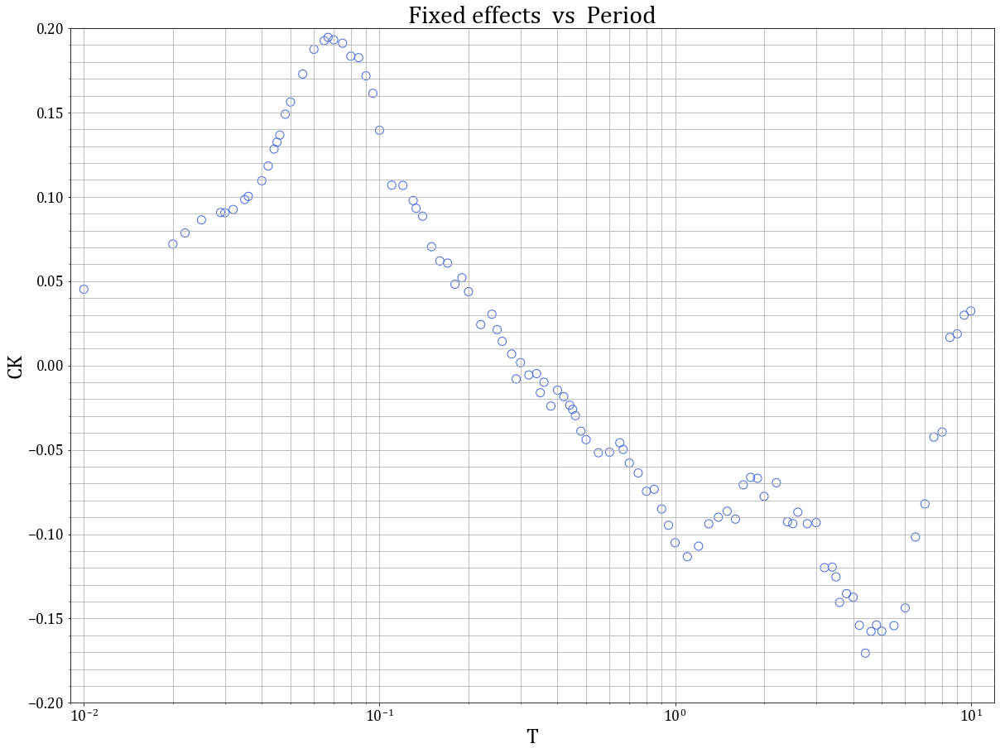

In [109]:
fig1 = plt.figure(figsize=(20,15))
ax1 = fig1.add_subplot(1,1,1) 

ax1.scatter(periods,CK,s=100, facecolors = 'none',edgecolors = 'royalblue', marker='o')

ax1.set_ylabel('CK',fontsize=25) ## length of CK = length of period = 106
ax1.set_xlabel('T',fontsize=25)
ax1.set_title('Fixed effects  vs  Period',fontsize=30)
ax1.grid(which='both')
ax1.set_xscale('log')
ax1.set_xlim(0.009,12)
ax1.set_ylim(-0.2,0.2)
plt.minorticks_on()
plt.show()

C:\Users\59237\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


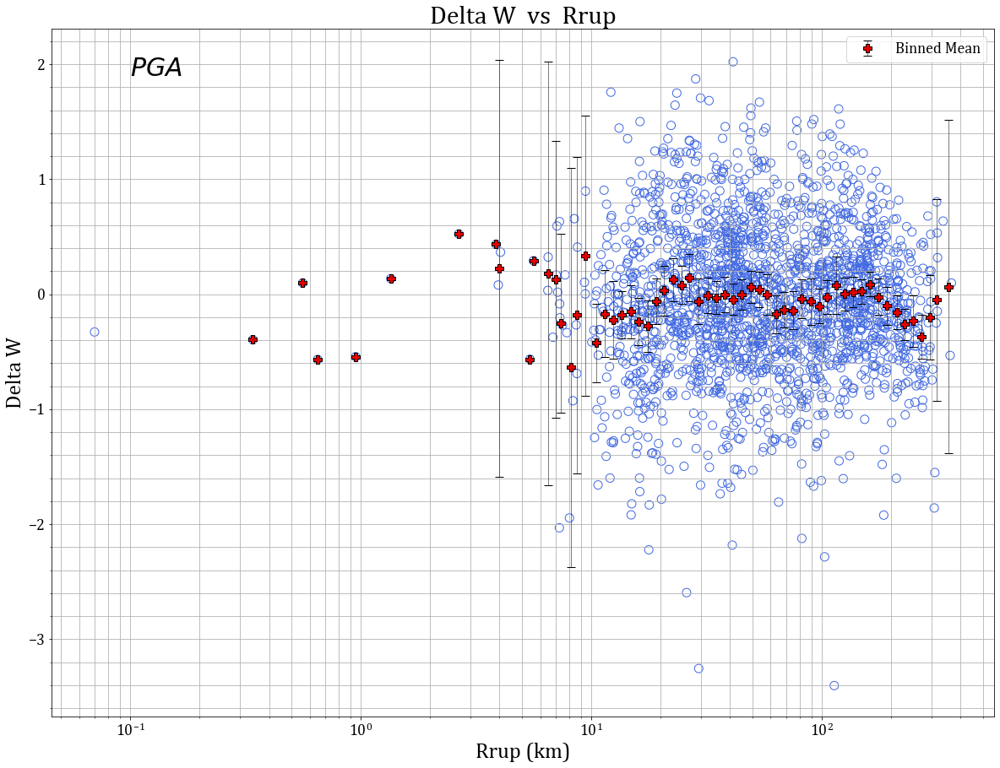

In [114]:
fig2 = plt.figure(figsize=(20,15))
ax2 = fig2.add_subplot(1,1,1) 
ax2.scatter(deltaW['Rrup'],deltaW['PGA'],s=100, facecolors = 'none',edgecolors = 'royalblue', marker='o')

DW_VS_Rrup_BIN_MEANS_PGA = get_data_bins(list(deltaW['PGA']),list(deltaW['Rrup']),np.min(list(deltaW['Rrup'])),np.max(list(deltaW['Rrup'])),100,1)
ax2.errorbar(DW_VS_Rrup_BIN_MEANS_PGA[2],DW_VS_Rrup_BIN_MEANS_PGA[0],yerr=DW_VS_Rrup_BIN_MEANS_PGA[3],elinewidth=0.5,capsize=5,capthick=1.0,
               marker='P',markersize=10,label='Binned Mean',markerfacecolor='#e50000',markeredgecolor='#000000',color='#000000',
               linestyle='none')

ax2.set_ylabel('Delta W',fontsize=25)
ax2.set_xlabel('Rrup (km)',fontsize=25)
ax2.set_title('Delta W  vs  Rrup',fontsize=30)
ax2.set_xscale('log')
ax2.grid(which='both')
plt.text(0.1,1.9 , '$PGA$',fontsize = 30)
plt.legend()
plt.minorticks_on()
plt.show()

C:\Users\59237\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


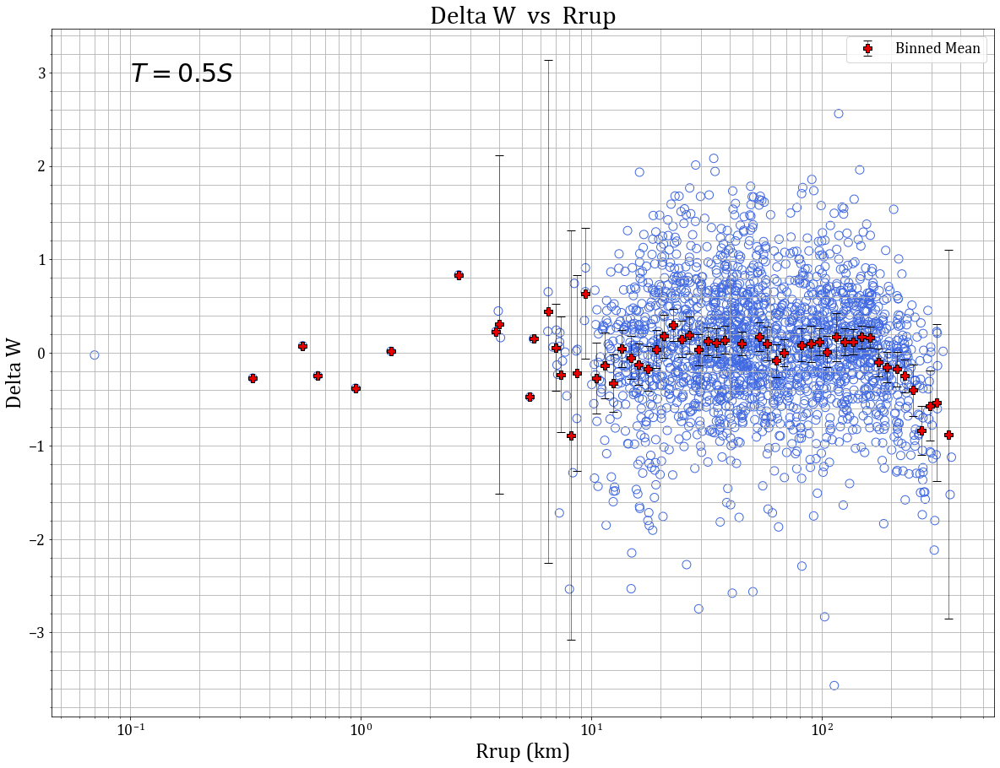

In [119]:
fig3 = plt.figure(figsize=(20,15))
ax3 = fig3.add_subplot(1,1,1) 
ax3.scatter(deltaW['Rrup'],deltaW['T0.500S'],s=100, facecolors = 'none',edgecolors = 'royalblue', marker='o')

DW_VS_Rrup_BIN_MEANS_PGA = get_data_bins(list(deltaW['T0.500S']),list(deltaW['Rrup']),np.min(list(deltaW['Rrup'])),np.max(list(deltaW['Rrup'])),100,1)
ax3.errorbar(DW_VS_Rrup_BIN_MEANS_PGA[2],DW_VS_Rrup_BIN_MEANS_PGA[0],yerr=DW_VS_Rrup_BIN_MEANS_PGA[3],elinewidth=0.5,capsize=5,capthick=1.0,
               marker='P',markersize=10,label='Binned Mean',markerfacecolor='#e50000',markeredgecolor='#000000',color='#000000',
               linestyle='none')

ax3.set_ylabel('Delta W',fontsize=25)
ax3.set_xlabel('Rrup (km)',fontsize=25)
ax3.set_title('Delta W  vs  Rrup',fontsize=30)
ax3.set_xscale('log')
ax3.grid(which='both')
plt.text(0.1,2.9 , '$T = 0.5S$',fontsize = 30)
plt.legend()
plt.minorticks_on()
plt.show()

C:\Users\59237\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


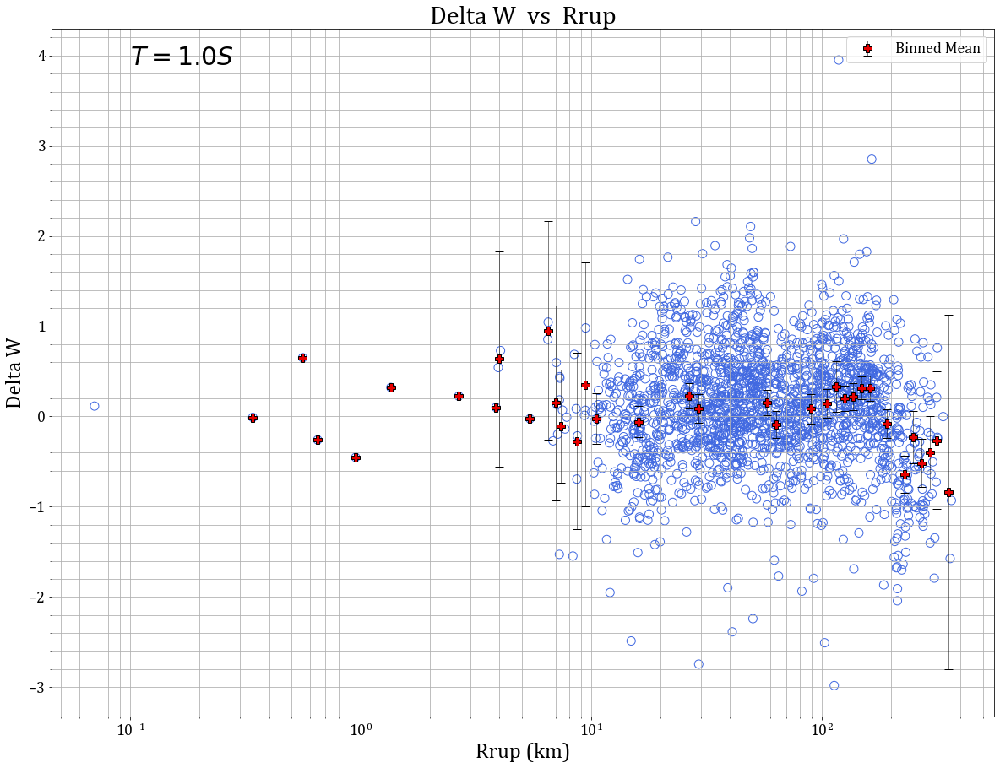

In [121]:
fig4 = plt.figure(figsize=(20,15))
ax4 = fig4.add_subplot(1,1,1) 
ax4.scatter(deltaW['Rrup'],deltaW['T1.000S'],s=100, facecolors = 'none',edgecolors = 'royalblue', marker='o')

DW_VS_Rrup_BIN_MEANS_PGA = get_data_bins(list(deltaW['T1.000S']),list(deltaW['Rrup']),np.min(list(deltaW['Rrup'])),np.max(list(deltaW['Rrup'])),100,1)
ax4.errorbar(DW_VS_Rrup_BIN_MEANS_PGA[2],DW_VS_Rrup_BIN_MEANS_PGA[0],yerr=DW_VS_Rrup_BIN_MEANS_PGA[3],elinewidth=0.5,capsize=5,capthick=1.0,
               marker='P',markersize=10,label='Binned Mean',markerfacecolor='#e50000',markeredgecolor='#000000',color='#000000',
               linestyle='none')

ax4.set_ylabel('Delta W',fontsize=25)
ax4.set_xlabel('Rrup (km)',fontsize=25)
ax4.set_title('Delta W  vs  Rrup',fontsize=30)
ax4.set_xscale('log')
ax4.grid(which='both')
plt.text(0.1,3.9 , '$T = 1.0S$',fontsize = 30)
plt.legend()
plt.minorticks_on()
plt.show()

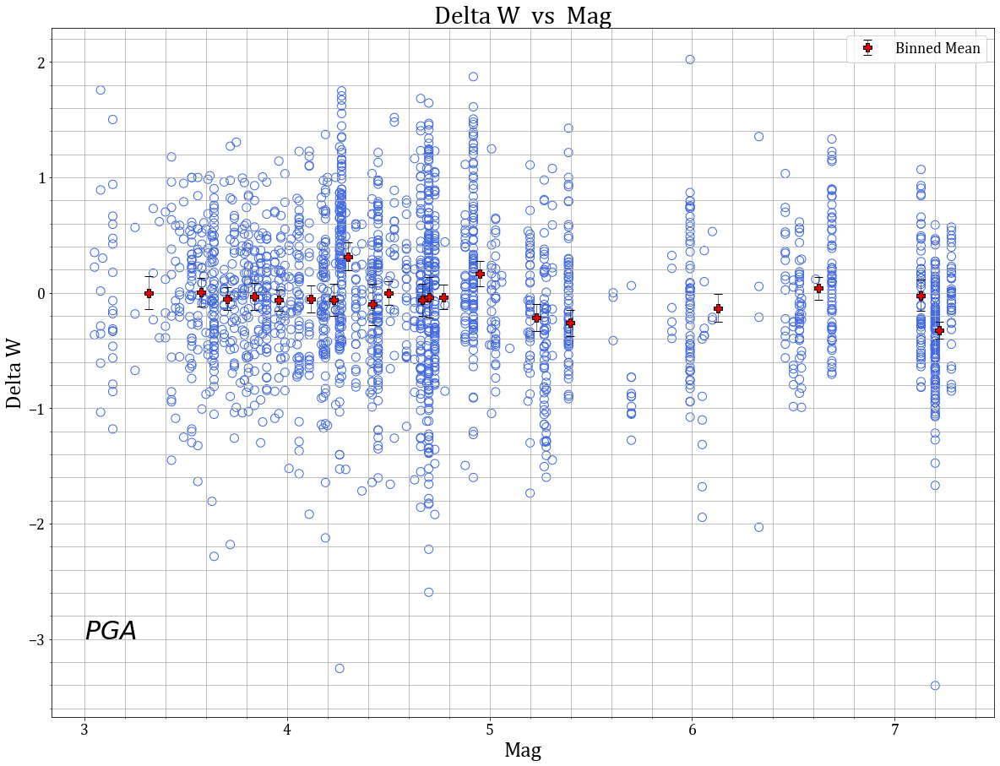

In [137]:
fig5 = plt.figure(figsize=(20,15))
ax5 = fig5.add_subplot(1,1,1) 
ax5.scatter(deltaW['Mag'],deltaW['PGA'],s=100, facecolors = 'none',edgecolors = 'royalblue', marker='o')

DW_VS_Rrup_BIN_MEANS_PGA = get_data_bins(list(deltaW['PGA']),list(deltaW['Mag']),np.min(list(deltaW['Mag'])),np.max(list(deltaW['Mag'])),20,0)
ax5.errorbar(DW_VS_Rrup_BIN_MEANS_PGA[2],DW_VS_Rrup_BIN_MEANS_PGA[0],yerr=DW_VS_Rrup_BIN_MEANS_PGA[3],elinewidth=0.5,capsize=5,capthick=1.0,
               marker='P',markersize=10,label='Binned Mean',markerfacecolor='#e50000',markeredgecolor='#000000',color='#000000',
               linestyle='none')

ax5.set_ylabel('Delta W',fontsize=25)
ax5.set_xlabel('Mag',fontsize=25)
ax5.set_title('Delta W  vs  Mag',fontsize=30)
ax5.grid(which='both')
plt.text(3,-3 , '$PGA$',fontsize = 30)
plt.legend()
plt.minorticks_on()
plt.show()

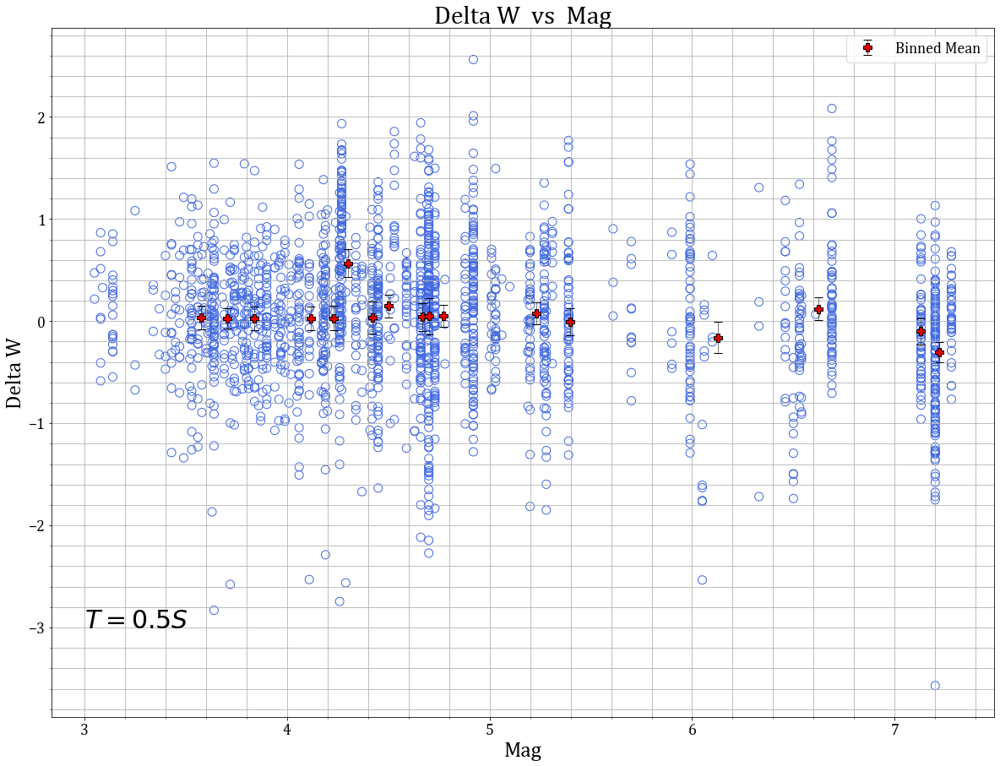

In [136]:
fig6 = plt.figure(figsize=(20,15))
ax6 = fig6.add_subplot(1,1,1) 
ax6.scatter(deltaW['Mag'],deltaW['T0.500S'],s=100, facecolors = 'none',edgecolors = 'royalblue', marker='o')

DW_VS_Rrup_BIN_MEANS_PGA = get_data_bins(list(deltaW['T0.500S']),list(deltaW['Mag']),np.min(list(deltaW['Mag'])),np.max(list(deltaW['Mag'])),20,0)
ax6.errorbar(DW_VS_Rrup_BIN_MEANS_PGA[2],DW_VS_Rrup_BIN_MEANS_PGA[0],yerr=DW_VS_Rrup_BIN_MEANS_PGA[3],elinewidth=0.5,capsize=5,capthick=1.0,
               marker='P',markersize=10,label='Binned Mean',markerfacecolor='#e50000',markeredgecolor='#000000',color='#000000',
               linestyle='none')

ax6.set_ylabel('Delta W',fontsize=25)
ax6.set_xlabel('Mag',fontsize=25)
ax6.set_title('Delta W  vs  Mag',fontsize=30)
ax6.grid(which='both')
plt.text(3,-3 , '$T = 0.5S$',fontsize = 30)
plt.legend()
plt.minorticks_on()
plt.show()

C:\Users\59237\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


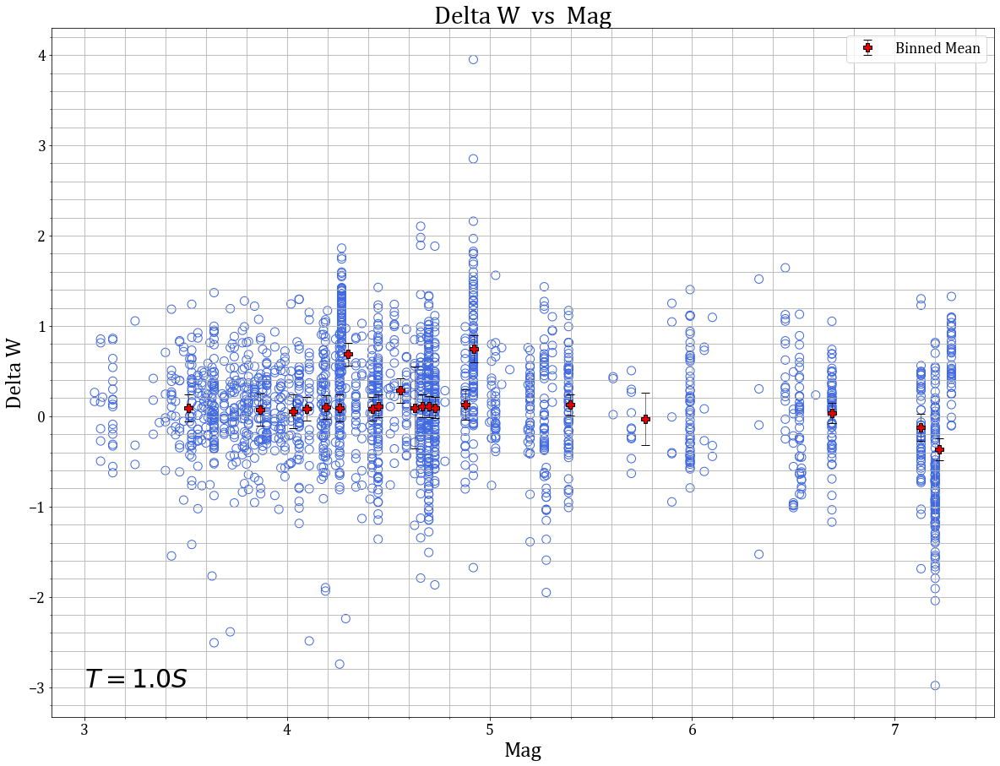

In [135]:
fig6 = plt.figure(figsize=(20,15))
ax6 = fig6.add_subplot(1,1,1) 
ax6.scatter(deltaW['Mag'],deltaW['T1.000S'],s=100, facecolors = 'none',edgecolors = 'royalblue', marker='o')

DW_VS_Rrup_BIN_MEANS_PGA = get_data_bins(list(deltaW['T1.000S']),list(deltaW['Mag']),np.min(list(deltaW['Mag'])),np.max(list(deltaW['Mag'])),35,0)
ax6.errorbar(DW_VS_Rrup_BIN_MEANS_PGA[2],DW_VS_Rrup_BIN_MEANS_PGA[0],yerr=DW_VS_Rrup_BIN_MEANS_PGA[3],elinewidth=0.5,capsize=5,capthick=1.0,
               marker='P',markersize=10,label='Binned Mean',markerfacecolor='#e50000',markeredgecolor='#000000',color='#000000',
               linestyle='none')

ax6.set_ylabel('Delta W',fontsize=25)
ax6.set_xlabel('Mag',fontsize=25)
ax6.set_title('Delta W  vs  Mag',fontsize=30)
ax6.grid(which='both')
plt.text(3,-3 , '$T = 1.0S$',fontsize = 30)
plt.legend()
plt.minorticks_on()
plt.show()

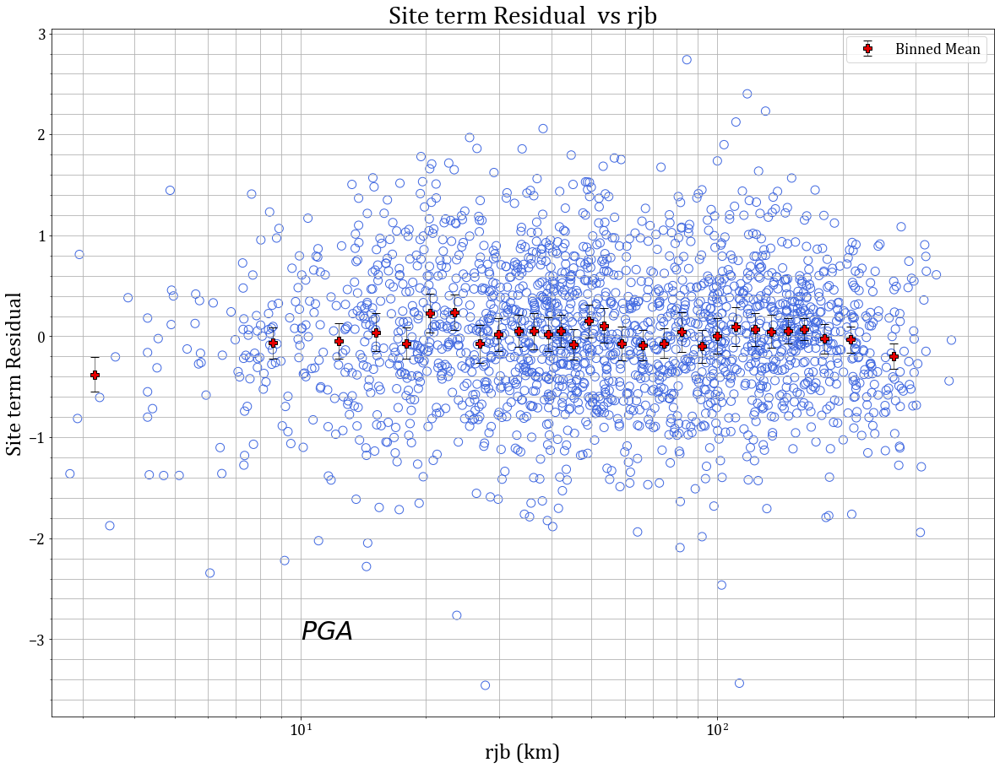

In [192]:
fig7 = plt.figure(figsize=(20,15))
ax7 = fig7.add_subplot(1,1,1) 
ax7.scatter(residual_S['rjb'],list(residual_S['PGA']),s=100, facecolors = 'none',edgecolors = 'royalblue', marker='o')

Dz1_VS_ns_BIN_MEANS_PGA = get_data_bins(list(residual_S['PGA']),list(residual_S['rjb']),np.min(list(residual_S['rjb'])),np.max(list(residual_S['rjb'])),30,0)
ax7.errorbar(Dz1_VS_ns_BIN_MEANS_PGA[2],Dz1_VS_ns_BIN_MEANS_PGA[0],yerr=Dz1_VS_ns_BIN_MEANS_PGA[3],elinewidth=0.5,capsize=5,capthick=1.0,
               marker='P',markersize=10,label='Binned Mean',markerfacecolor='#e50000',markeredgecolor='#000000',color='#000000',
               linestyle='none')

ax7.set_ylabel('Site term Residual',fontsize=25)
ax7.set_xlabel('rjb (km)',fontsize=25)
ax7.set_title('Site term Residual  vs rjb',fontsize=30)
ax7.set_xscale('log')
ax7.grid(which='both')
plt.text(10,-3 , '$PGA$',fontsize = 30)
plt.legend()
plt.minorticks_on()
plt.show()

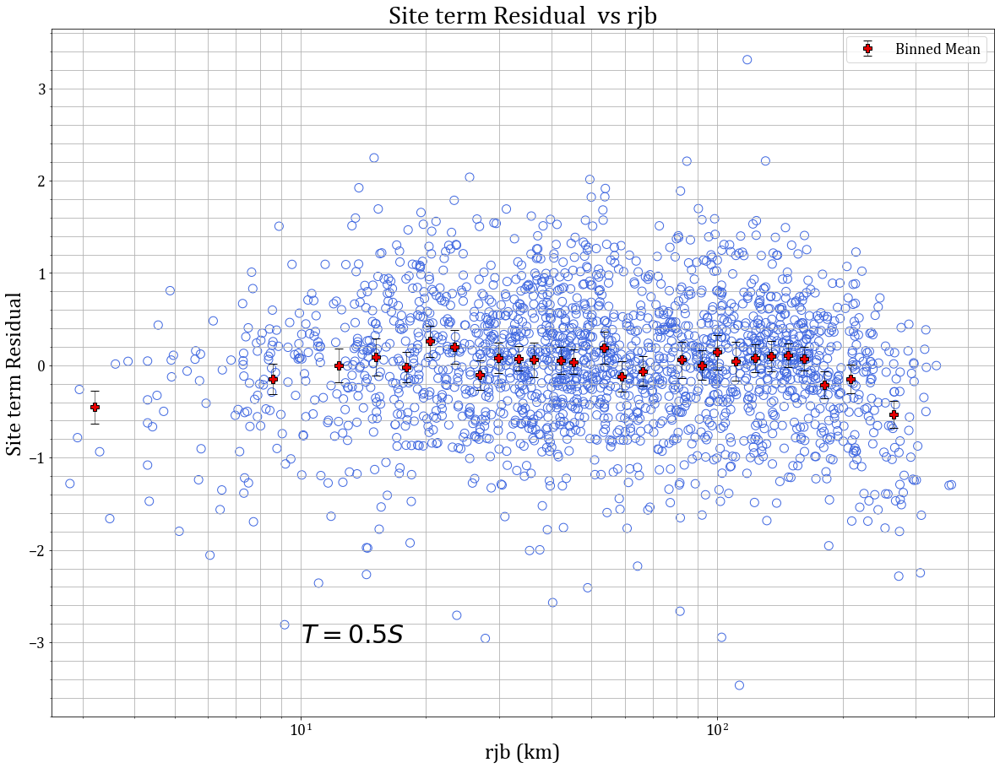

In [191]:
fig8 = plt.figure(figsize=(20,15))
ax8 = fig8.add_subplot(1,1,1) 
ax8.scatter(residual_S['rjb'],list(residual_S['T0.500S']),s=100, facecolors = 'none',edgecolors = 'royalblue', marker='o')

Dz1_VS_ns_BIN_MEANS_PGA = get_data_bins(list(residual_S['T0.500S']),list(residual_S['rjb']),np.min(list(residual_S['rjb'])),np.max(list(residual_S['rjb'])),30,0)
ax8.errorbar(Dz1_VS_ns_BIN_MEANS_PGA[2],Dz1_VS_ns_BIN_MEANS_PGA[0],yerr=Dz1_VS_ns_BIN_MEANS_PGA[3],elinewidth=0.5,capsize=5,capthick=1.0,
               marker='P',markersize=10,label='Binned Mean',markerfacecolor='#e50000',markeredgecolor='#000000',color='#000000',
               linestyle='none')

ax8.set_ylabel('Site term Residual',fontsize=25)
ax8.set_xlabel('rjb (km)',fontsize=25)
ax8.set_title('Site term Residual  vs rjb',fontsize=30)
ax8.set_xscale('log')
ax8.grid(which='both')
plt.text(10,-3 , '$T = 0.5S$',fontsize = 30)
plt.legend()
plt.minorticks_on()
plt.show()

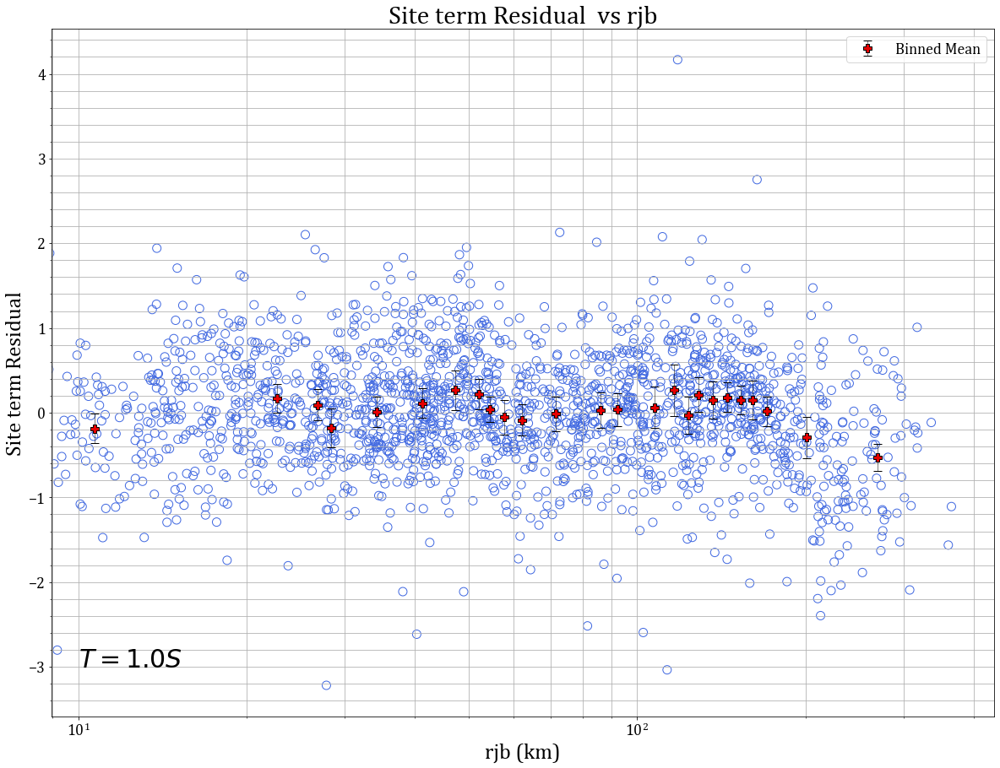

In [190]:
fig9 = plt.figure(figsize=(20,15))
ax9 = fig9.add_subplot(1,1,1) 
ax9.scatter(residual_S['rjb'],list(residual_S['T1.000S']),s=100, facecolors = 'none',edgecolors = 'royalblue', marker='o')

Dz1_VS_ns_BIN_MEANS_PGA = get_data_bins(list(residual_S['T1.000S']),list(residual_S['rjb']),np.min(list(residual_S['rjb'])),np.max(list(residual_S['rjb'])),50,0)
ax9.errorbar(Dz1_VS_ns_BIN_MEANS_PGA[2],Dz1_VS_ns_BIN_MEANS_PGA[0],yerr=Dz1_VS_ns_BIN_MEANS_PGA[3],elinewidth=0.5,capsize=5,capthick=1.0,
               marker='P',markersize=10,label='Binned Mean',markerfacecolor='#e50000',markeredgecolor='#000000',color='#000000',
               linestyle='none')

ax9.set_ylabel('Site term Residual',fontsize=25)
ax9.set_xlabel('rjb (km)',fontsize=25)
ax9.set_title('Site term Residual  vs rjb',fontsize=30)
ax9.set_xscale('log')
ax9.grid(which='both')
plt.text(10,-3 , '$T = 1.0S$',fontsize = 30)
plt.legend()
plt.minorticks_on()
plt.show()

C:\Users\59237\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


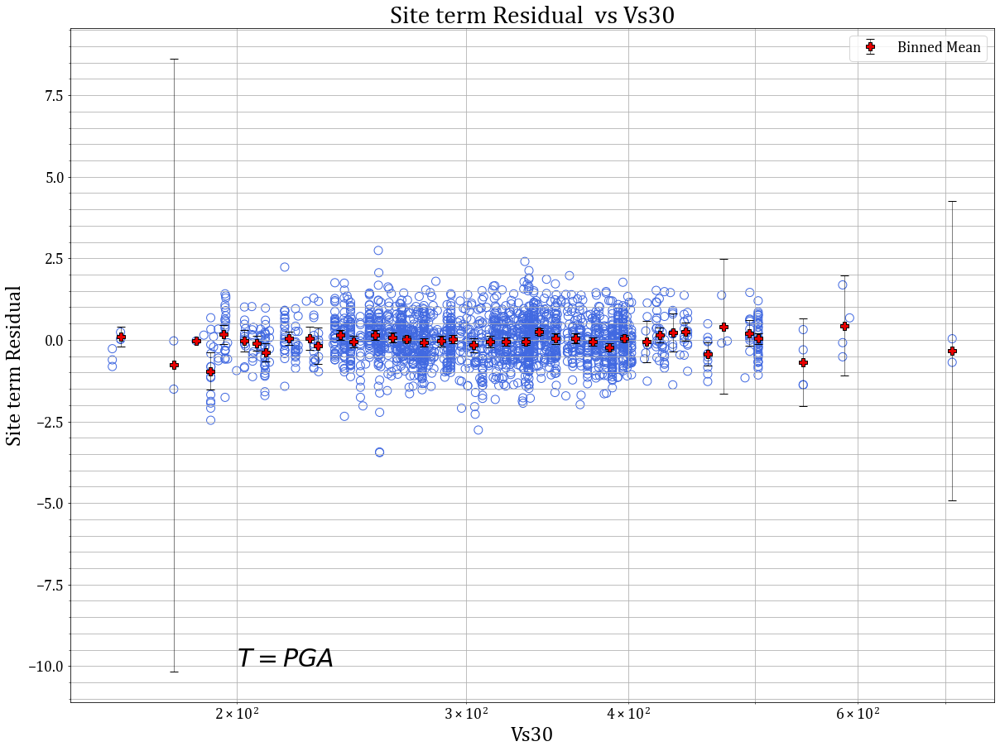

In [189]:
fig10 = plt.figure(figsize=(20,15))
ax10 = fig10.add_subplot(1,1,1) 
ax10.scatter(residual_S['Vs30'],list(residual_S['PGA']),s=100, facecolors = 'none',edgecolors = 'royalblue', marker='o')

Dz1_VS_ns_BIN_MEANS_PGA = get_data_bins(list(residual_S['PGA']),list(residual_S['Vs30']),np.min(list(residual_S['Vs30'])),np.max(list(residual_S['Vs30'])),50,1)
ax10.errorbar(Dz1_VS_ns_BIN_MEANS_PGA[2],Dz1_VS_ns_BIN_MEANS_PGA[0],yerr=Dz1_VS_ns_BIN_MEANS_PGA[3],elinewidth=0.5,capsize=5,capthick=1.0,
               marker='P',markersize=10,label='Binned Mean',markerfacecolor='#e50000',markeredgecolor='#000000',color='#000000',
               linestyle='none')

ax10.set_ylabel('Site term Residual',fontsize=25)
ax10.set_xlabel('Vs30',fontsize=25)
ax10.set_title('Site term Residual  vs Vs30',fontsize=30)
ax10.set_xscale('log')
ax10.grid(which='both')
ax10.set_xscale('log')
plt.text(200,-10 , '$T = PGA$',fontsize = 30)
plt.legend()
plt.minorticks_on()
plt.show()

C:\Users\59237\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


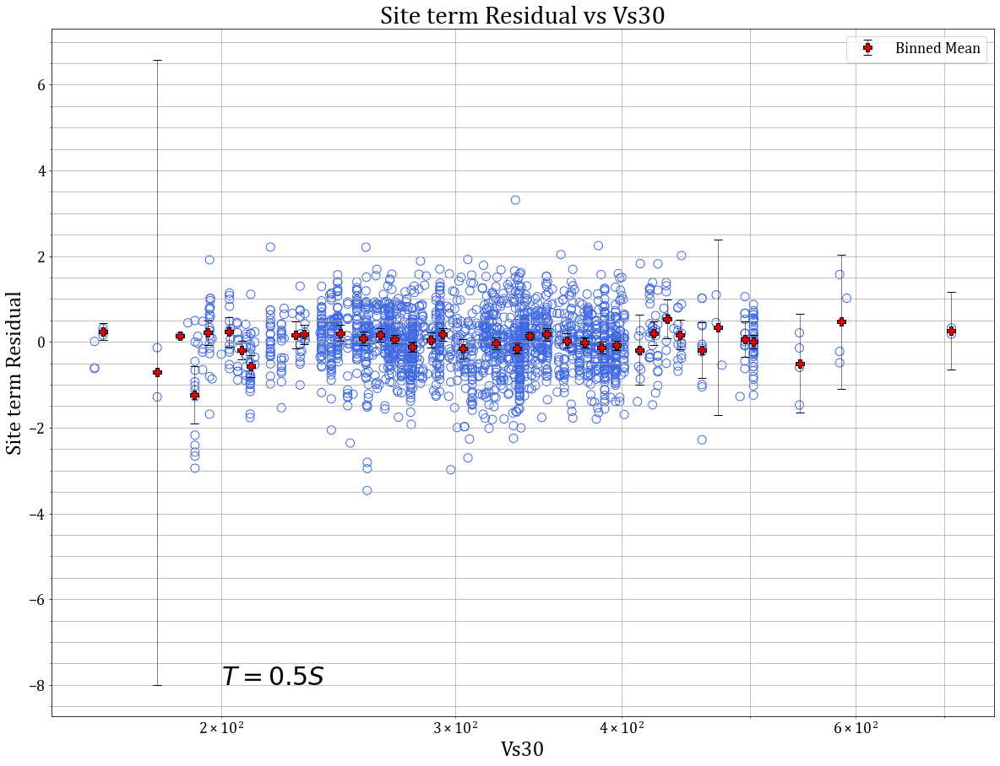

In [187]:
fig11 = plt.figure(figsize=(20,15))
ax11 = fig11.add_subplot(1,1,1) 
ax11.scatter(residual_S['Vs30'],list(residual_S['T0.500S']),s=100, facecolors = 'none',edgecolors = 'royalblue', marker='o')

Dz1_VS_ns_BIN_MEANS_PGA = get_data_bins(list(residual_S['T0.500S']),list(residual_S['Vs30']),np.min(list(residual_S['Vs30'])),np.max(list(residual_S['Vs30'])),50,1)
ax11.errorbar(Dz1_VS_ns_BIN_MEANS_PGA[2],Dz1_VS_ns_BIN_MEANS_PGA[0],yerr=Dz1_VS_ns_BIN_MEANS_PGA[3],elinewidth=0.5,capsize=5,capthick=1.0,
               marker='P',markersize=10,label='Binned Mean',markerfacecolor='#e50000',markeredgecolor='#000000',color='#000000',
               linestyle='none')

ax11.set_ylabel('Site term Residual',fontsize=25)
ax11.set_xlabel('Vs30',fontsize=25)
ax11.set_title('Site term Residual vs Vs30',fontsize=30)
ax11.set_xscale('log')
ax11.grid(which='both')
ax11.set_xscale('log')
plt.text(200,-8 , '$T = 0.5S$',fontsize = 30)
plt.legend()
plt.minorticks_on()
plt.show()

C:\Users\59237\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


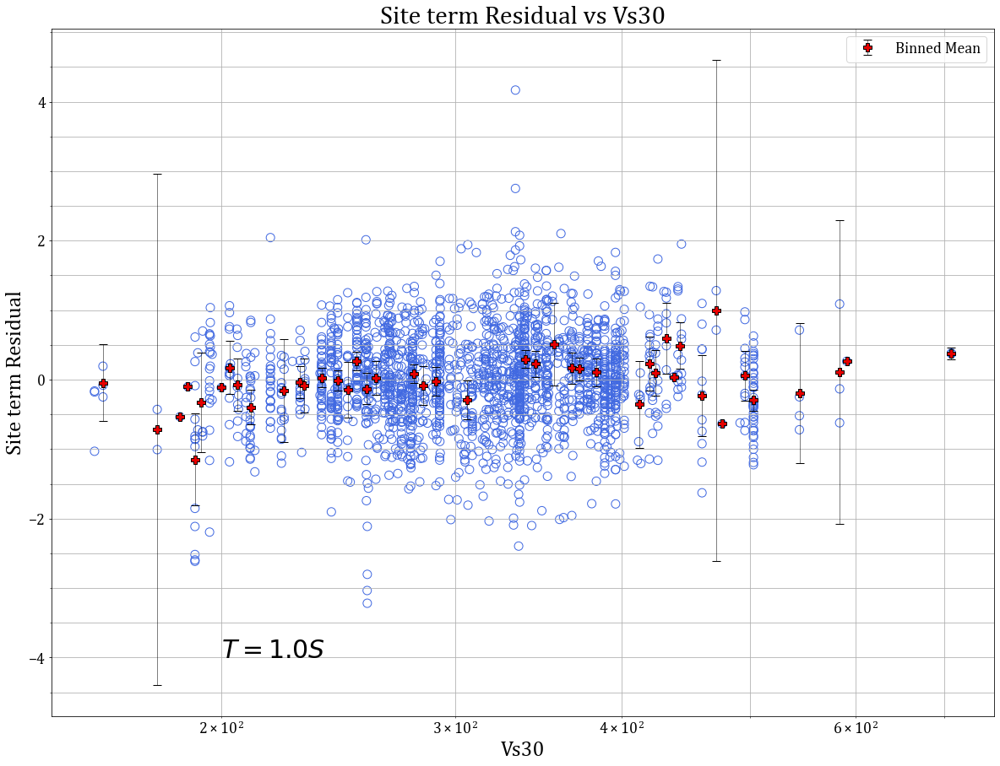

In [188]:
fig12 = plt.figure(figsize=(20,15))
ax12 = fig12.add_subplot(1,1,1) 
ax12.scatter(residual_S['Vs30'],list(residual_S['T1.000S']),s=100, facecolors = 'none',edgecolors = 'royalblue', marker='o')

Dz1_VS_ns_BIN_MEANS_PGA = get_data_bins(list(residual_S['T1.000S']),list(residual_S['Vs30']),np.min(list(residual_S['Vs30'])),np.max(list(residual_S['Vs30'])),100,1)
ax12.errorbar(Dz1_VS_ns_BIN_MEANS_PGA[2],Dz1_VS_ns_BIN_MEANS_PGA[0],yerr=Dz1_VS_ns_BIN_MEANS_PGA[3],elinewidth=0.5,capsize=5,capthick=1.0,
               marker='P',markersize=10,label='Binned Mean',markerfacecolor='#e50000',markeredgecolor='#000000',color='#000000',
               linestyle='none')

ax12.set_ylabel('Site term Residual',fontsize=25)
ax12.set_xlabel('Vs30',fontsize=25)
ax12.set_title('Site term Residual vs Vs30',fontsize=30)
ax12.set_xscale('log')
ax12.grid(which='both')
ax12.set_xscale('log')
plt.text(200,-4 , '$T = 1.0S$',fontsize = 30)
plt.legend()
plt.minorticks_on()
plt.show()

C:\Users\59237\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


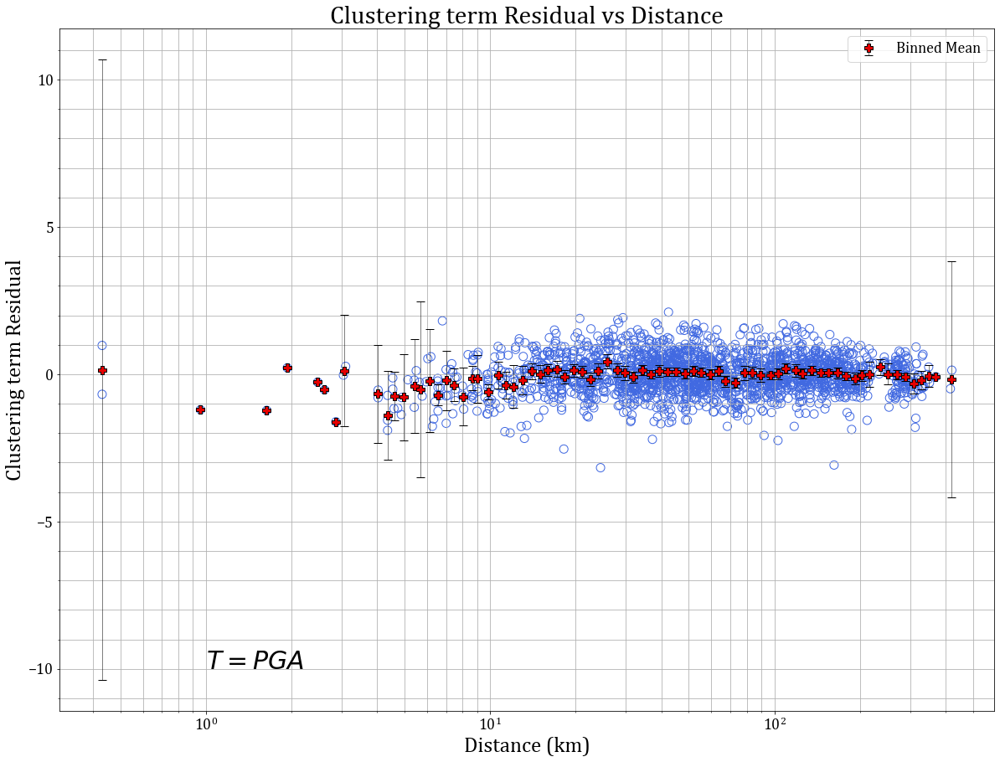

In [178]:
fig13 = plt.figure(figsize=(20,15))
ax13 = fig13.add_subplot(1,1,1) 
ax13.scatter(residual_C_merged['distance (km)'],list(residual_C_merged['PGA']),s=100, facecolors = 'none',edgecolors = 'royalblue', marker='o')

Dz1_VS_ns_BIN_MEANS_PGA = get_data_bins(list(residual_C_merged['PGA']),list(residual_C_merged['distance (km)']),np.min(list(residual_C_merged['distance (km)'])),np.max(list(residual_C_merged['distance (km)'])),100,1)
ax13.errorbar(Dz1_VS_ns_BIN_MEANS_PGA[2],Dz1_VS_ns_BIN_MEANS_PGA[0],yerr=Dz1_VS_ns_BIN_MEANS_PGA[3],elinewidth=0.5,capsize=5,capthick=1.0,
               marker='P',markersize=10,label='Binned Mean',markerfacecolor='#e50000',markeredgecolor='#000000',color='#000000',
               linestyle='none')

ax13.set_ylabel('Clustering term Residual',fontsize=25)
ax13.set_xlabel('Distance (km)',fontsize=25)
ax13.set_title('Clustering term Residual vs Distance',fontsize=30)
ax13.set_xscale('log')
ax13.grid(which='both')
ax13.set_xscale('log')
plt.text(1,-10 , '$T = PGA$',fontsize = 30)
plt.legend()
plt.minorticks_on()
plt.show()

C:\Users\59237\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


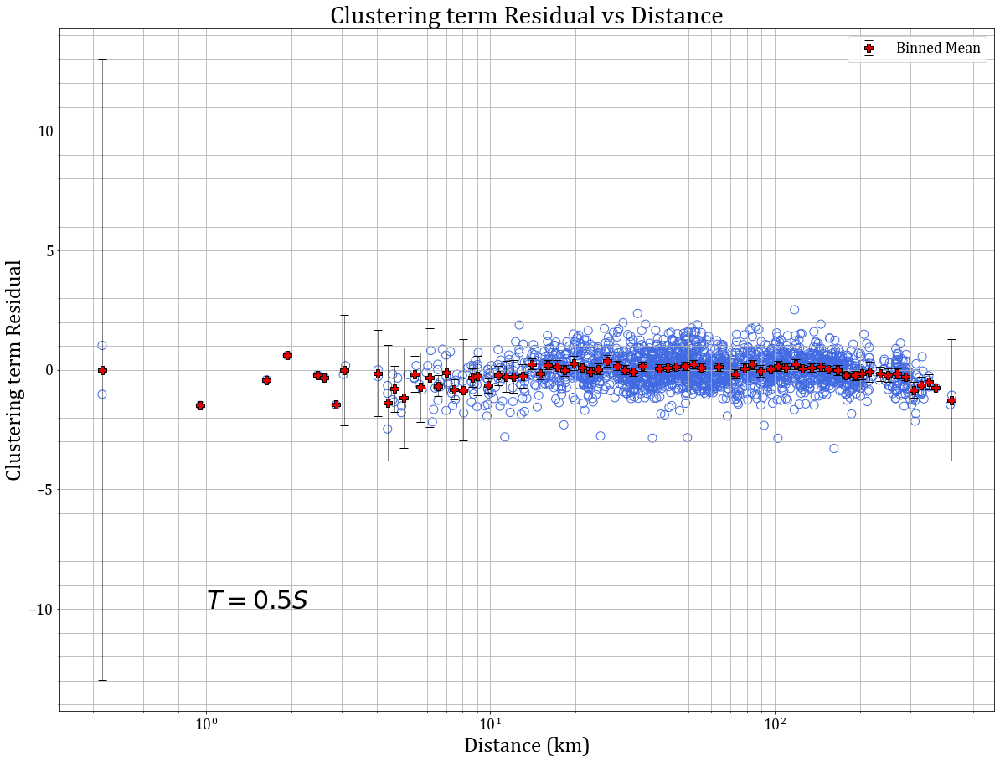

In [180]:
fig14 = plt.figure(figsize=(20,15))
ax14 = fig14.add_subplot(1,1,1) 
ax14.scatter(residual_C_merged['distance (km)'],list(residual_C_merged['T0.500S']),s=100, facecolors = 'none',edgecolors = 'royalblue', marker='o')

Dz1_VS_ns_BIN_MEANS_PGA = get_data_bins(list(residual_C_merged['T0.500S']),list(residual_C_merged['distance (km)']),np.min(list(residual_C_merged['distance (km)'])),np.max(list(residual_C_merged['distance (km)'])),100,1)
ax14.errorbar(Dz1_VS_ns_BIN_MEANS_PGA[2],Dz1_VS_ns_BIN_MEANS_PGA[0],yerr=Dz1_VS_ns_BIN_MEANS_PGA[3],elinewidth=0.5,capsize=5,capthick=1.0,
               marker='P',markersize=10,label='Binned Mean',markerfacecolor='#e50000',markeredgecolor='#000000',color='#000000',
               linestyle='none')

ax14.set_ylabel('Clustering term Residual',fontsize=25)
ax14.set_xlabel('Distance (km)',fontsize=25)
ax14.set_title('Clustering term Residual vs Distance',fontsize=30)
ax14.set_xscale('log')
ax14.grid(which='both')
ax14.set_xscale('log')
plt.text(1,-10 , '$T = 0.5S$',fontsize = 30)
plt.legend()
plt.minorticks_on()
plt.show()

C:\Users\59237\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\59237\anaconda3\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


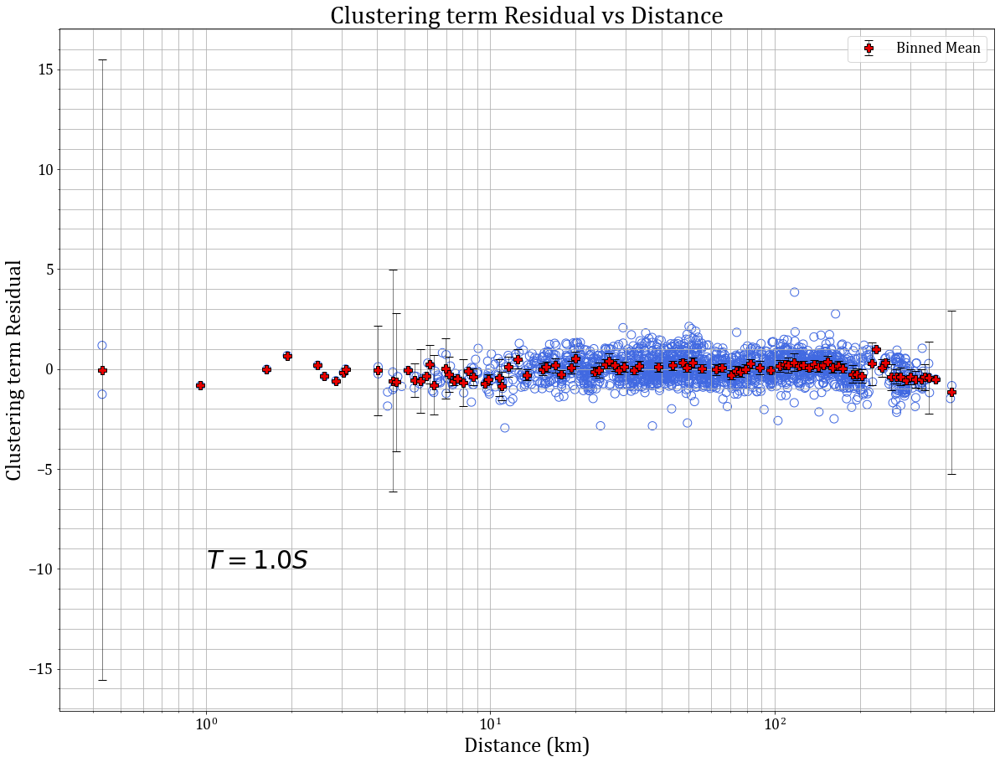

In [186]:
fig14 = plt.figure(figsize=(20,15))
ax14 = fig14.add_subplot(1,1,1) 
ax14.scatter(residual_C_merged['distance (km)'],list(residual_C_merged['T1.000S']),s=100, facecolors = 'none',edgecolors = 'royalblue', marker='o')

Dz1_VS_ns_BIN_MEANS_PGA = get_data_bins(list(residual_C_merged['T1.000S']),list(residual_C_merged['distance (km)']),np.min(list(residual_C_merged['distance (km)'])),np.max(list(residual_C_merged['distance (km)'])),175,1)
ax14.errorbar(Dz1_VS_ns_BIN_MEANS_PGA[2],Dz1_VS_ns_BIN_MEANS_PGA[0],yerr=Dz1_VS_ns_BIN_MEANS_PGA[3],elinewidth=0.5,capsize=5,capthick=1.0,
               marker='P',markersize=10,label='Binned Mean',markerfacecolor='#e50000',markeredgecolor='#000000',color='#000000',
               linestyle='none')

ax14.set_ylabel('Clustering term Residual',fontsize=25)
ax14.set_xlabel('Distance (km)',fontsize=25)
ax14.set_title('Clustering term Residual vs Distance',fontsize=30)
ax14.set_xscale('log')
ax14.grid(which='both')
ax14.set_xscale('log')
plt.text(1,-10 , '$T = 1.0S$',fontsize = 30)
plt.legend()
plt.minorticks_on()
plt.show()